# Домашнее задание 6: классификация текстов

В этом домашнем задании вам предстоит построить классификатор текстов и поучаствовать в соревновании на Kaggle!
Первым делом вам предстоит построить хороший бейзлайн, а дальше пытаться улучшать, соревнуясь с другими участниками.


Ссылка на соревнование: https://www.kaggle.com/c/avito-category-prediction/overview
Данные для домашнего задания можно скачать на странице соревнования.
Чтобы ваше участие было засчитано, убедитесь, что имя в Leaderboard имеет вид: «Имя Фамилия номер_группы».

Оценивание:

Домашнее задание оценивается как обычно. Баллы указаны напротив заданий.

За соревнование даются бонусные баллы следующим образом.
Если вы пересекли baseline_2 на приватном лидерборде, ваша оценка равна 

10 - 10 * (i - 1) / M

где M — количество студентов, принявших участие в соревновании;

i — место (начиная с 1) студента в приватном лидерборде среди всех таких студентов.

Правила:

* Домашнее задание оценивается в 10 баллов.

* Плагиат не допускается. При обнаружении случаев списывания, 0 за работу выставляется всем участникам нарушения, даже если можно установить, кто у кого списал.

* Старайтесь сделать код как можно более оптимальным. В частности, будет штрафоваться использование циклов в тех случаях, когда операцию можно совершить при помощи инструментов библиотек, о которых рассказывалось в курсе.  

* В течение 3 суток после окончания соревнования в соответствующее задание на anytask необходимо прислать код, воспроизводящий ответы для посылки, фигурирующей в приватном лидерборде. В случае отсутствия кода, воспроизводящего результат, в установленный срок студенту выставляется 0 в качестве оценки за соревнование. Если не оговорено иное, использовать любые внешние данные в соревнованиях '''запрещено'''. Под внешними данными понимаются размеченные данные, где разметка имеет прямое отношение к решаемой задаче. Грубо говоря, сборник текстов с википедии не считается внешними данными.


Мы будем работать с датасетом объявлений Avito. Нам предстоит по заголовку и тексту объявления предсказывать категорию объявления.

In [53]:
import pandas as pd

In [4]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [5]:
train.head()

,title,description,Category_name,Category
0,"Эбу Renault / Nissan 1,5 DCI Delphi 2001-2008 год","Комплект ЭБУ (мозги, компьютер мотора, двигате...",Запчасти и аксессуары,10
1,Утюг утп 1000 ватт СССР 1987 год,Продам/\n Фото № 1-2 /\n /\nУтюг УТП 1000 ватт...,Бытовая техника,21
2,Возвму машину с выкупом,Возьму машину в аренду с последующим выкупом н...,Предложение услуг,114
3,Полусапожки,"полусапожки в отличном состоянии, один раз оде...","Одежда, обувь, аксессуары",27
4,Босоножки кожаные,"Кожаные(натур) босоножки Karlo Pasolini, 40 рр...","Одежда, обувь, аксессуары",27


In [6]:
train.shape

(4234042, 4)

## Задание 1 (0.5 балла)

Выведете на экран информацию о пропусках в данных. Если пропуски присутствуют заполните их пустой строкой.

In [63]:
train.isnull().any()

Category_name        False
Category             False
title/description    False
dtype: bool

In [8]:
train = train.fillna('')

In [9]:
train.isnull().any()

title            False
description      False
Category_name    False
Category         False
dtype: bool

In [10]:
test.isnull().any()

title          False
description     True
itemid         False
dtype: bool

In [11]:
test = test.fillna('')

In [12]:
test.isnull().any()

title          False
description    False
itemid         False
dtype: bool

##### Теперь ни в тесте, ни в трейне нет пропусков в данных

## Задание 2 (0.5 балла)
Сконкатенируйте заголовок и описание в единую строку и поместите результат в отдельный столбец. Таким образом мы будет работать с одним текстом, а не с двумя.

In [13]:
train['title/description'] = train['title'].str.cat(train['description'], sep =" ")
test['title/description'] = test['title'].str.cat(test['description'], sep =" ")

In [14]:
train.drop(['title', 'description'], axis=1, inplace=True)
test.drop(['title', 'description'], axis=1, inplace=True)

In [15]:
test.head()

,itemid,title/description
0,1778449823,Мастерка Мастерка фирмы форвард. Белого цвета....
1,1677656962,"Зимние сапоги Продаю зимние сапоги, в хорошем ..."
2,1758182804,Видеонаблюдение 8 камер В комплект Atis AMD-2M...
3,1689811299,Запчасти для GLE Запчасти GLE
4,1804706240,Бластер nerf Состояние 5+/\nПродаю потому что ...


In [16]:
train.head()

,Category_name,Category,title/description
0,Запчасти и аксессуары,10,"Эбу Renault / Nissan 1,5 DCI Delphi 2001-2008 ..."
1,Бытовая техника,21,Утюг утп 1000 ватт СССР 1987 год Продам/\n Фот...
2,Предложение услуг,114,Возвму машину с выкупом Возьму машину в аренду...
3,"Одежда, обувь, аксессуары",27,"Полусапожки полусапожки в отличном состоянии, ..."
4,"Одежда, обувь, аксессуары",27,Босоножки кожаные Кожаные(натур) босоножки Kar...


## Задание 3 (0.5 балла)
Давайте немного посмотрим на наши данные. Визуализируйте (где явно просят) или выведете информацию о следующем:

1. Сколько всего уникальных классов необходимо предсказать?
2. Постройте столбчатую диаграмму распределения по классам. Нормализуйте график, чтобы видеть доли, а не абсолютные значения.
3. На сколько большой дисбаланс? Какой класс имеет самую большую долю в выборке (укажите класс и долю), какой класс наименьшую (укажите класс и долю).

In [24]:
import matplotlib.pyplot as plt
import numpy as np

##### 1)

In [25]:
len(train['Category_name'].unique())

50

##### 2)

In [26]:
train.shape[0]

4234042

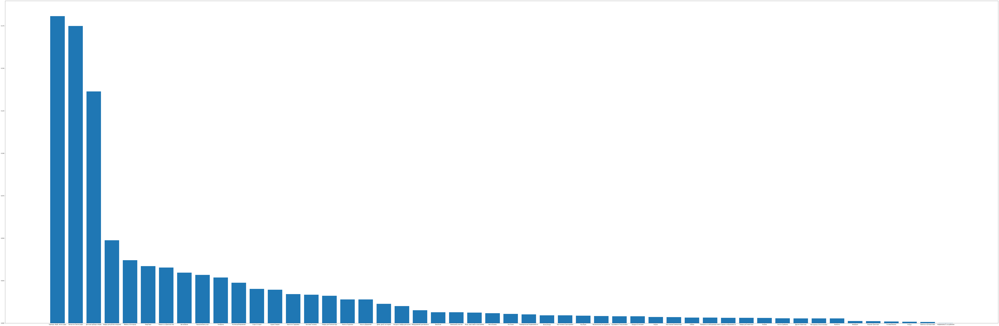

In [27]:
fig, ax = plt.subplots()

ax.bar(train['Category_name'].value_counts().index, train['Category_name'].value_counts() / train.shape[0])
fig.set_figwidth(150)
fig.set_figheight(50) 
plt.show()

In [28]:
np.sum(train['Category_name'].value_counts() / train.shape[0])

1.0

##### 3)

In [29]:
np.var(train['Category_name'].value_counts())

26361267867.454395

##### Самая большая доля

In [30]:
train['Category_name'].value_counts().index[train['Category_name'].value_counts().argmax()]

'Одежда, обувь, аксессуары'

In [31]:
train['Category_name'].value_counts()[train['Category_name'].value_counts().argmax()] / train.shape[0]

0.1807067572782698

##### Самая маленькая доля

In [32]:
train['Category_name'].value_counts().index[train['Category_name'].value_counts().argmin()]

'Недвижимость за рубежом'

In [33]:
train['Category_name'].value_counts()[train['Category_name'].value_counts().argmin()] / train.shape[0]

3.8969854337769914e-05

## Задание 4 (0.5 балла)

Далее мы будем пока работать только с train частью. Для test части нам неизвестны истинные значения, и они понадобятся только тогда, когда мы будем отправлять решение на Kaggle.

1. Предобработайте данные (train часть) с помощью CountVectorizer.
2. Какого размера получилась матрица?


In [37]:
from sklearn.feature_extraction.text import CountVectorizer

In [42]:
vec = CountVectorizer(ngram_range=(1, 1))
bow = vec.fit_transform(train['title/description'], train['Category']) 

In [45]:
bow

<4234042x2125805 sparse matrix of type '<class 'numpy.int64'>'
	with 150918485 stored elements in Compressed Sparse Row format>

## Задание 5 (0.5 балла)

В предыдущем пункте у вас должная была получится очень большая матрица. Это не дело.
Если вы взгляните на текст, то увидете, что там есть множество специальных символов.

Давайте также посмотрим на словарь, который получился в результате построения CountVectorizer, его можно найти в поле _vocabulary инстанса этого класса.

1. Найдите в этом словаре все слова, которые начинаются на цифру. Сколько таких слов нашлось?

2. Найдите все слова, которые начинаются на символы пунктуации. Сколько таких слов нашлось? 

##### 1)

In [82]:
sum = 0

In [83]:
for elem in vec.vocabulary_.keys():
    if elem[0].isdigit():
        print(elem)
        sum += vec.vocabulary_[elem]

2001
2008
1000
1987
350
405
450
10
40
20
42
44
2000
2006
27808641
14
500
00
30
39
2012
43018jn00a
3744
2019
29
2019г
05
59
15
000
18
4000
150
2010
2017г
60
25
40000
46
48
200
100
3000
35
1866
1880
250
2009
3500
1855
1881
1876
1878
1872
50
1918
1919
1921
1922
1923
1924
1925
1926
1928
1932
1934
1937
1938
1947
1957
7000
1769
120
12
55
2x34
9x23
2100
65
3x45
3x26
2700
75
3x53
9x30
3100
625zz
80025
5x16x5мм
3д
70шт
86
92
999
150мм
5т
56k
03
09
2003
0012027
21
12квт
14х23см
171
58
109
81
34
22
2002
074906461b
4394872
124
7911g
7912g
1937года
1937год
801015934r
799
300
9334
175
385
78
170
87
71
23
1961
1991
1972г
1973г
1976г
1977г
1980г
1981г
1982г
1983г
1984г
1985г
1986г
1987г
1988г
1989г
1990г
1991м
1991л
1970г
1971г
1974г
1961г
1962г
1975г
1978г
1979г
104см
27
50х
28
400
36
2500
2200
2013
2004
19
128
1500
1z
13
32
80
9лайт
9000тр
1шт
2метра
3шт
1метру
2007
16
95
105
1801594
95xf
83
17
52
925
1000руб
15245
965596072704284179944367053451
248709231408186936508625622582
900г
215
84y
68rl
33
19

058
232
51137058232
6j
106y
535
27см
147
2мальчика
125мм
11т
3000руб
1комнатные
10минут
374810
64гб
2008года
2раза
2015год
29б
925пр
45000
1500мм
1800мм
1200мм
7038
2016г
40х1
00х1
0441
883202b360
4472001217
2c
56р
0gb
320gb
350wt
932
59990
55000руб
1214
3slot
8х150
5х100
5х38
1х75
2х38
2х100
623
724
525
121456
3840
1093
639
686
216
14а
2011г
3а
13326030
0116
18000руб
1с7
5х1250х2500
976
045
0005499903012416
5x19
0000001158212
2с4
60х30
3упаковки
4555
361
184
43кв
200л
430ex
7600
5часа
3407020a550
3407020a551
1комнатная
5ти
2048x1536
288
11ac
720
6700
25x153
68x7
436
8000
709
50r19
45r19
107q
9650
111q
11350
6000т
271
41183
750gb
7200p
1366х768
2110м
21104м
21103м
21123
2111
21120
21123м
21103
21104
21108
21108м
530u4
530u4b
530u4c
535u4c
530u3c
19см
107х90
800gb
379123
8лет
3302
14a3r
1к
1300р
1600р
390427750
350руб
181
4wd
1nzfe
6gbit
1г
1250р
20т
15т
8т
10т
35кв
5кв
10кв
838
1114si
91j
4914101
22368
70737
10399
757
70736
48с1
7500р
715g7580
004i
1991гг
17шт
7оригинал
3t
20х4
05г
01м

22м
0м
32к1
10500000
83781148
120000
6l
119л
519mha1700010
0838
1935
1973
5e0807221n
48054
1497
138л
1джек
20х10
5х120
20х11
106v
110v
74000р
11657649296
11657649297
67000
60мм
7x25
1799руббез
1год
450d
0000000771559
521596a950
5450
40ам
430стр
640стр
400стр
350стр
250стр
415
450стр
320стр
160стр
230стр
260cnh
300стр
429стр
2070х2800
5292120
13292337
86110
50150
4в
1542
50мл
60х60х186
67604
6620
9274428
19941
0925
1553
7cdi
5дв
363
485
7х3
292
222
234
621
50х50
1200х1360
1200х900
2000х900
2х1
80х40
4700р
2020г
5284113
7gb
16x
8x
1086001164
0280156262
1649
554
376
24дб
12дб
120мм
50х50см
35х55см
160х2000
143г
31а
106r01410
4250
25k
39100
6281d
187301
650672
125482
6271d
629875
6280d
824852
192600
21ая
18000р
5800bthddvr
45м
3b5807311a
815797
756380
13х18
10w40
233001ka1c
4935
12350
314450
315982
314448
315961
315981
315950
317809
317810
12749700003
74061118012
2075554004
12749880003
1000070007
12749700004
12749700006
12749880004
12749880006
317825
04294595
04294595kz
4294595
4294595kz
1

03c103925ar
03c103925ba
03c103925as
7e0601025l
7e0601025l8z8
22803840
2000913469169
8sff
12800r
331flr
530flr
10gbit
450w
5478р
19005
15as
6736
319527500036724
8в
6вт
426067
2смежные
20м2
16м2
2девушек
1160
480руб
240руб
2птс
8876
32мех
21сот
1sz
2sz
220с
1744w
1944jl
397284820
5e0853507
25000р
452
19x21
74г
410440
73158км
11180
8401014
06н
004в2039
7707
97087
3597087
006
316955
60123
2хm1
40x60
6соток
6мм
92w
12990
240v
189м2
3411
5003
102773
105см
3382
51487248210
7248210
5х17
17_mazda6
60124
5052200
854x480
4889
4890
788489
462
5551
18500
12902
7307763
0000000997348
51137307763
2k1941016a
391762557
1креп
92р
28размер
2hz
100db
115db
110db
0025
2v
355mm
6kg
1800ма
8u0941006
7892
046
00332
254
380вт
300r
220вт
0108
3к3
7l6858903aa
8859
2мя
8e
8е
4556338
95м
095м2
4708руб
19521
1мм
1м3
34935jg300
34935jg000
1400000
1350000
200h
9656733480
26074
6873459
873459
873
459
32159
03xa
03x
070c
1t0b
9k1a
9k1b
101a
102a
0j1c
1u1a
80х60х77
120х80х75
2150
390мм
1700р
6q7601027c03c
497
2x2
4eama
0

1000х1000мм
600х2000мм
191061
40566
130mm
2х3
22442
32х11
6428077
6428740
5155806
2nd
300шт
8500k
10x2x5000мм
2835
5050
17132
1524425
6g9n5482db
0x2
2500мм
9мм
100х50
24мм
1215
1k0937049n
11659
937
049
5x1250x2500
12х18н10т
12x
12020
13161078
8129
558
850х800х450
478003b520
478003в520
0000000877091
92101g9000
71см
3045
645
81712201
1cd
34размер
54х1
80х4
16лет
1401347
21p
526g
493979
8х4
2010году
60x45x85
13кг
58798
4630a174
12ºc
9д
920x650x1280мм
45700р
1370х650х1280мм
49300р
920х650х865мм
44700р
1370х650х865мм
48300р
7ºc
900х700х1280мм
57300р
1300х700х1280мм
67900р
920x650x870мм
44900р
1370x650x1280мм
48500р
860х610х1280мм
64300
600x650x870мм
13400р
900x650x870мм
15100р
5cmx21cm
1798
900md29
900md
6пар
3468
3c5807305
907х899
1uz
0858669
2000913668951
110а
50745
2007года
5000тыс
2550х1350
8ч
000748
46490
1200х800
69990
0000000924528
3aa807221
2lazer
550kl
1ст
40295
35r20
40r20
818
817
609
611е
1220х420
0433171929
81063035237
244а
2498
7800р
6520
2000000
96891
3x000
968913x000
4ms272h7

5734
1990ых
5штук
780120102
8149
374
1500квт
1k0129610b
1780
696
1200х1000х400
664950
664951
20б
805011
33и
5801b035
500va
282
300вт
284
4807048080
13217
6g74
85а
150квт
80586
9тыс
27к
3ое
13ч
83q
3440
630863
301a
312a
568
7800
6800
6303
2018года
17году
330л
12pr
30х44
2тип
41627151491
104400
403170002n
1960г
319244
86842
32568243
080305a
5117
5307
5e0
871d
5квт
4019
8x2340110ac
5233462
488
8200720881
12272
2609на
56000
504361808
63107
1274
13114995
1304241
93179469
41038
5047
49162
8954153350
4454053620
44540
53620
713
6410025300
6410025400
7l6919673e
7340
200стр
650стр
31029
50hz
70кв
11183340001010
4лампы
5цветов
8k
8k2
8k5
8kh
3520
47lb652v
1072x629x55
3этаже
16mms
96648537
96648536
317137070
260602042r
2001620
4000комплект
100вольт
5лито
130г
5x63
8x10
1500х2400мм
7750
1х
100лет
020032
707618
768549
4r
10б
1943г
03l253010g
5355444
738e
240мин
21сентября
55038
650d
50fps
45кузов
05173
6c
278717
24012ka92a
021089
15789
15789наша
9112
03b
15u
258
2u1
31v
3u1
443
486
51u
5p6
632
666
6

129889
721
90в
6g919600ak
305мм
80ватт
7000гц
97дб
9408
1810г
5na853671b9b9
0021490003091422
1244
1520
31000
645m
700gb
5305549
290руб
2мес
1200вт
9004
93039
680792
64mb
1тюбик
455004
600гр
35000руб
3079219
1750р
11800
14300
12200
16900
23300
26100
30600
40800
45600
80le657ru
44шт
83стр
7х11см
1930гг
49листов
8х15
1920е
17х11см
1917г
3листа
21х13
21m
8055147
5111
055
4e0035465
4e0910465a
0m
132137
45м2
396943325
5e0853653
350х216х54
4201440
5на100
5на114
1400x2000
45220
60140
4522060140
256d2
11437793310
11437788969
348
231907
5381233210
17кв
33326753107
33326770769
132л
60х120
1900х800
1860х800
3981865
21550
61316814183
6814183
61319363500
9363500
829
61319348829
9348829
61319323550
9323550
098
61319261098
9261098
61319253567
9253567
865114l500
863504l500
86350
863624l500
86362
6oo
865614l500
3oo
865654l500
86565
2oo
865664l500
86566
863574l500
86357
865174l500
86517
1oo
865804l500
86580
9oo
92190
3z500
180л
24mp58d
00032128
96813429
0880
1246
2997
2892
22cx
2596
2553
2853
2462
2804
2

51757542
5224058
93к
32pfl8404h
32дюйма
600х300х20
674
600х600х30
600х300х40
1200х320х20
1500х320х20
1500х320х30
1870
1000х200х80
600х300х80
044изготовлено
0018225
7h0145980r
7h0145790d
7h0145980s
7h0145555c
7h0145790f
7h0145941b
7h0145762a
7h0145709d
7h0145955j
7h0145955e
5310750
600r
3m5ar26413bp
3m51r22601bc
982601025h
981601025hje1
5владелец
360e
2li
10х31х35
2000913488542
925п
2200вт
991162071
16x7jj
101002
78664
78662
20x7х21
53601scva02
53601s9ag04
53601s9ag02
53601s9ag06
53601s9ag03
53601s9ag01
53601scva04
53601s9ag05
262701
76856jg20a
28db
50x50
675052
8и9и5и1и0и8и1т3и5и3и3
1ое
735388163
6652000301
66420000101
22098
600rr
200км
11101220
11класс
563100u300
349рубл
349р
349руб
2600х2200
46572
19в
8114110
1е
102х4
92406
3w010
2этаже
15роз
501роза
501розы
00020707160021
770042y010
5364631
468624
005ту
6ш117
35размер
411
2г32
320р
325р
335р
340р
345р
360р
380р
410р
2912171520
98q
4801
7199
817201g020
218302p400
57703sa000wg
57704sa000
57703sa000tg
57703sa000ma
4931
2617659
18м3
840

31125
1900м
1722086
2014114
1685708
22х19
96причина
10383
2квт
69z
29350
58р
66рр
113б
190х135
4х108
10505
6913
8351
4m5geflf51
2150р
5объем
35х23х10
07654
3743
698806
230км
210км
250км
400км
75000р
3500hd
2040
89312778757
2200мм
1900мм
757436
0901002
1118119
154945
7040
0000001148565
865112w000
200ватт
70ватт
100ватт
4507
6160
5c6
103a
467003t210
59г
6e0959455a
1литра
10419
20куб
16691
44мм
629
8bitgameru
09402
0118
24810eb267
1904г
92100jy00a
8h0807437
90040998
90041006
60в
25на
3920dn
13год
85513043
1k0880201bs
1k0880201ca
1k0880201an
1k0880201p
1k0880201af
1k0880201bj
1k0880201cb
1k0880201be
1k0880201bp
1k0880201bt
3890р
22х11
10гб
4х1
450v
4724
44х48х87
81c
0231
253102v450
28с6
3bp
4096m
345573
1366
750ti
4550
46700011
20мп
15мп
6c1q9e470ae
6c1q9f467ab
6c119f478ab
70l
50размера
77z
2000а
91db
35гц
35000гц
4000гц
230вт
400см
330мм
29кг
95737
29521
86527f1000
2710
4525042280
8руб
41км
6101133m91
16л
42т
2018году
176076
54870
500ma
2216
12841760
1247042
2570p
3110m
00003218
4910
3594

2343
8k0513035k
4458626
86511c5500
9672
469829
9750
22500
5683
2комн
214фз
8308s
8440p
520m
3250001
15005
700км
75075
48140
45784
64го
0x
240х200х50мм
934101m531
64tt
880р
1316р
87030002
74руб
1040
1344
4afe
6g72
124950
2430a039
9hu
32в
21в
1690р
48x30x37
6тр
10028304
46974
2013под
2345a015
571101c580
2022года
056
5eur
1cm
92402h
400963565
92402h5000
5331304
5000х2120
861
8014
118см
32б
5ц
4мк
95ач
105d31l
3штуки
5327614
1990е
1990х
300х130
5мт
1199
5334657
60216
51320
1fa
723945
729932
51360
93f25184
97f21409
97sf11205
1х2м
0000000313421
51117386283
4772533
06г
5098765
64539209726
4277
87620
4l040
0019501918060357
100х190
9805075480
9045
1октяб
196см
931062
021068
69140
27791
93420
5006207845
62702
115835
36мм
139104
2040484
01098
2028441
1891042
1748563
1798327
1880086
610кв
0095450032
1217
190а
190a
10480486
8клапаный
90x200
20rt
1x8
710d
710e
710f
710g
0021489317082111
223654
66400h0000
7l6422893bh
7l6422893bq
170127000
15ч
2566
2676
2842
2865
2866
2876
51064020063
1600x
2х8gb
2133

5высота
5резьбаm20
6h
7914объём
0266вес
4966количество
12максимальный
2000х1600
39886317
4150997
39х14х10
37х5х28
455
284736t
112a
223xs
215s
10k
146gb
42c0251
42d0422
42d0421
11s41y8414y3nm3nm0y5jv
9f6066
039
16000руб
17517600532
7600532
20го
682082
00549
670321
317c001f
04616w601
697454
639396
4st07
4xt07
7050sr
7172sr
7050er
7051er
7052er
7053er
7054er
7055er
7056er
7057er
7058er
7060er
7055sr
7052sr
7057sr
7051sr
7170er
7171er
7172er
7173er
7175sr
7250er
7260er
7261er
7262er
7250sr
7263er
7264er
7251sr
7252sr
7350er
7351er
7352er
7352sr
7351sr
7377er
7377sr
7353er
7380er
7354er
2120х2290
86190
1гр
127x73x102
50f18f
317в
23027
8мес
250x120x65
106h
48hd
75yn
01703
2656
833
539
205д
516
5291624
077133062a
23322
1200х599х13
45900км
1705грамм
170778
6jx15
4x114
18ka
37915
300евро
300летия
3414010
94810523502
94810513502
221004a025
4a025
221004a020
4a020
220104aa00
4aa00
0048hd
37тц
37тц01
54тц
54тц01
31102
317000
105кг
8200660053
91см
120сек
600x1200
8330225010
8491
24рр
46разм
5литра
6

190х26
153468
23111
2g010
231112g010
116лс
563
2280tte
921021m020
1m010
0014720125094202
3серии
4x2
60к
3264
1944
4302077
0008
66a
100часов
67тыс
302см
264см
5500т
3472967
100nx
62066620
7аh
19кг
8032
1z0880201
1z0880201ah
1z0880201ahtdz
17408
997884417733657610784228405365
749281954829655825429281106690
8дм
11220
11220jn01a
6503
500d
10160
42885
20m400f250w14
7041219
35га
25га
2500х640мм
2птс4
235х40
96w
3023
2150мгц
25дбм
13в
18в
500ма
22кгц
720x576
720x480
2100х2100х3900
330х135
140221
179см
8972280900
92п
952
2000w
56298
5370b066
51717213641
4ат
6928931
6016200010
5094820
1000824
4341002570
33г
1000d
1100d
9подъезд
20069
420x450x600
420х450х600
869
63птс
139а
78кв
4101432
271105929r
3854
2900мм
8гиг
230х114х40
90588773
466986601
2265705
1634
74060
2fxs
202b
202х
20x
729a
2833
2132
7483
8695
4576
5258139172
40702810810000323753
123060
30101810145250000974
7710140679
044525974
53039880116
430л
928701r0008m
36538
45000тр
23963
23963наша
5до
3артикул
2538800118
2538800118a2538800218
25

134093
96459041
96243090
96243097
96813258
33220122
552447470
8174
1702022
144251
3962
4521702022
807si
49h
100с
8x44
7x10
40ph
040n1a
40kd
40yh
040ap
11190
011s
2250р
3950р
7420538845
033172
205744940
30451
25003300a
18п
199кг
10ц
2недели
2нед
1930s
50302
6870009020
2012арт
071016343
17045
17708
6615
9659285480
1xvga
1xrca
1xs
32кг
2133hz
94dgx
0798
4650
2665
2670
3000gb
45000р
110bt
28x
989w
32284
13е
188f
240мм
160м
7гб
20дюймов
455712
7184773
51777184773
2912183p
3200х1500
1965г
255т
365x382x200
135н
136622
200m
280g
10068
256s3
1vanos
286s2
2vanos
226s1
256s5
306s3
448s1
86630m
381896647
86630m0000
1165851820
11658518204
11658518205
11658513123
11658513122
1u0998275b
3d0998275a
1j0998275b
2000913136948
81115
8383
94056
1x40x28
2535
4023
23th
1ас6
838175
448906
12га
56т
87м
6х8х18
151м2
450рублей
58х101х119
4g63tw0551
8093001
35410
35410наша
222s300
2227200105
2227200105a2227200205
2227200205
2227200205a2227300105
2227300105
2227300105a2227300205
2227300205
2227300205a2227300405
22

5401162
18месяцев
404m
404c
404y
84120
62022bm92h
3330х3150х875
320с
50m650
65000руб
2638
69575
1865256
05927
1862858
9815327677
591и81и45
09см
582055
38cм
692механика
38500ea500
1393
758900019r
51257
332
202510
69200
402779445
692004l010
1мл
7010
0000000900430
95b8076851e0
4426732
3990р
6490р
30ᵒс
64cb
7литров
300т
777004
1679685
1699880
4651862
1600х700
82388км
13399
410в
9700k
214x468x451
3600mhz
12288kb
76e250bw
80000000
1мс
180kw
0bu341011q
0bu341011
0bu
18307857134
13111211a
0т
2312942
57785
3c8853856fgru
3c8853856egru
3c8853856f
3c8853856dgru
1622
9676505677
4ye
83500
60x
3754
1s4z6009ba
180х100х100
18с
718bk
1132
106м
20794
3228
145_150
95235155
27100
575x365
88150600
0508213520
90q
4692103
3800г
5200мач
0002577
5215950932
70953
995418424591884176907375198941
4898
063234
1пододеяльник
1500б
3775
00x10
501538
701955713c
55767
26932
47667
3a2
35i
3a5
6kv2
1h1
1e7
1h5
6kv5
1h2
19e
1g1
1g2
1y
2413w
3598
6f326545
9п
000008210
2361
2938
000008230
2295
000008400
69719
000008430
030100

5211978901
1неделя
3недели
9807241680
0001118731122517
51137205780
12101615a
6762037250b0
5вольт
8core
2gh
3340мач
9565hz
4278
12047
2000913267963
➋в
➍все
1222d
61х34х12см
190х90х90
4350x2100
645011
5лпродано
5jb941015b
0001711130032528
152748
21710bm400
110л
217104u000
21710bm410
217114u000
217114u00a
5l0959811
5l0959812
4755
1795
196466
938701
9823х2179
1200х1200
7вольт
2500мач
10489
560524455889760488495042737614
55r15
4342044040
4533181
174х79х44см
1500х540х640
00014404
640x540x640
1496308
386473
120024
445804005020
138118
4272476
715ru2
428см
80тыс
48pf
1100wac
7260u
16000p
11d
22000p
000p
33000p
7ee
35000p
50000p
770mr
711а
42pfl7108
12v701
4520s
20589476
21083078
20565117
0486106304n50
0486106064
70новые
49е
180км
51117211488
9803648780
4564626
3bk
14150
76х95
50782
1645
8983760010
66647
850e
586х378x265
65тр
370м2
155х55см
193см
14к2
530мм
710мм
6540
3ml
2019крем
54nn1k
30spf
54nn01
1ml
54no03
54n92k
59к3
06j145701r
79523993211
154тыс
180х100
157980
821000291r
10679
000тр
60421

349x749x381
222432
162кг
90x57х104
92x38х25
1szfe
34p
945gcm
1184438
242254902314
19pfl5404
19pfl5404h
22pfl5614h
26pfl3405
26pfl3405h
32pfl5404
32pfl5624h
37pfl5604h
42pfl5604h
42pfl5624h
4061453806
2новых
7769
56500m0000
84910км
5352101
92х22
10312
55х33х5
7с3
537511
10483
1844852474
8200389369
7366
3405
16b
50x4
22x4
41003449338
10379
31112
311121r000
9х2
130ps
2100809
1hd
400х500
640гб
00х16
8157
81082010474
4500u
740m
41001wl000
41001
500х600
801d
5х80
75вт
799p
899p
1199p
1503
1399p
1999р
2499p
8e0857755d
5503
1x4gb
1жетон
06a906033cl
316627975
8на5
100мг
215476
320х300
1500мл
285000
00924a
141601
1838
204х72
00022306160013
5ja601147a
6rg857705b
50x148
90х53х53
5q1953521dg
5q0953569c
5q1952502an
45568
95950847
0019661414022418
96839214
64111e0020
550gsm
13916
191125
23209
39165
141л
141hp
15x
11218
201000
116x81x86
0060401
1575215896
20каналов
4769548
0111
36х25см
1370х1500
7xl
10xl
03l130755
04l130755
03l130755aa
03l130755d
03l130755l
03l130755m
04l130755d
04l130755e
03l130755ас

1345719
31197
20140712000
70226
10681
0740
0195
2209509
2028987
1348737
1345225
524
134х145
7104ae
7104ft
5714
0065
0000000310604
231789
165х85х75
210х85х75
255х85х75
290х85х75
1515a026
45p
076130277
0445115029
18005
115122
0000000830454
31371639
8816
2250мм
2750мм
2700мм
00021906170072
821006680r
1j_
2002leganza
2004nubira
2003nubira
2003rezzo
602044200
5521
50размер
2200рублей
350вт
3019644
1370х1045х1070
1145
744р1
90y
22fx
3255
670р
51169224341
9224341
88000р
3700u
18кгц
3167
37рр
7701478546
075
8039
37r
164002137r
84r
164000884r
7701478547
8200813237
8621882
792
30792514
30671010
2d0
2d0127159
5211245
0000001077940
517716a120
490м
7l0907637
5q0407272bn
40х20х4
27х21
190716644
30793838
30778953
0603008
1300м
5338347
2551
64х64
64х60
53х43
45х37
31х31
384133
175т
5776478
5букв
2диска
29z40hsq
10стр
771x593x421
91s
27х42
96451744
27326
40155
970014085755760763918147090083
138800
40x40
2400х710х140
2дом
15января
1112102
400706
7сот
35соток
1168071308
8019
18139
275г
225г
32ш
45в
45мал

7217294
217294
23652
1100х1400мм
425л
53220с
245031
10850
00jt482
433mbps
2x2ac
6ft
7l0121203g
7l0121203f
450кг
42рр
134098
1987году
42050
7l8612101d
128полный
11886
797362078321999195563630643979
350ру
250ру
50х38х21
51613
4000большемерят
16к1
28381
22936
18x7
51647383858
35349
443271095
00010986
09скину
1000v
118мн
318000
6778
76210seag31
2012613950
0110007
41317126252
41217045677
41217045678
41217045679
41217045680
41117073431
41117073432
41357138473
41357061662
158р
1799304873
7с13
821585
351173
01192
20023
500а
750а
1000a
13500р
205х55
1877554
0004005
1323820
8668
120ps
1x4331056bc
4692
160k
0836lfl64
0836lfl55
200x
55х430х244
192кгц
61х46
4495992
33191
78eur
60171464
716100
2000х1225х290
940мм
9776525000
72502
06b906051
6000к
90575
96y
5175
1918601
1894621
1872793
1822842
1801599
90324
760042w010
76004
2w010
760042w000
75литров
30ка
3270
3bl
3бл
85х60
1p39
4мкпп
4f0971073g
13630
4yc00
0013046324101102
20gz
100g3
5nr
31997
5000va
9300636
12тыс
1собственник
1010d
6800y
1136
6085
99

2284
110000км
2000913701184
84596
8ws5685
55198
957355823877498935463196875536
766578316029683933030906735074
10х15см
6660
236м
82a
570х440х300мм
5490р
8999р
8499р
11999р
7490р
10999р
11499p
12999p
13499p
9499р
6990р
7990р
19999р
12999р
30999p
19999p
17999р
00000028722
4900p
2000st
50422
2э
245э
3мл200т
78лет
676581
990х405мм
340х190мм
485мм
1010х465х255мм
1024х768
222х145х82
390х245х83
8144101013
163683
8330a566
4_х
42мкв
31525
965445285781472647584199078996
107824
36eur
71503a6c00
32895
400bt
20000слов
6kw
12z
4983067
88184
76259
1j3959857a
360е
160g
472р
726р
1466р
2136р
8мл
1728р
742v
1861р
31521
31531
31521smg000
31531s5a0
2400012
1мин
2095452801
648x488
190503
140х140х218
92404a7020
0021214201042430
66школа
819003ec00
30243
240нм2
2325
54800
2179060200
450wt
86132
60x34x85
6732
33литров
45tt
770bn
06a30
2027016
1361
61356977723
61359128183
800cc
2aer
62г
309a
80x42x80
20411200
1025288
2020246
46ghz
4160469
555013e100
01955
25563a
26411b
40t06
24278r
01969a
25568a
01976b
67cay03bi

00q4b
4911000q3h
00q3h
10ml
1921391
0021118017043508
48339
72458
483g32mnkk
381x253x34
63319111012
37разм
12800mb
2k0807217
4290р
8651650010
0318
23078
55ii
71511v
00002
46ne8ban000
44blu
7092
5092
40x60x85
700тыс
2032675524
8u0853651hvmz
0021271317052205
200мест
660х910
12100020r
16ю
56х48х15
4о
10128508
99qt
220x
63217174404
63217174403
7174404
7174403
86400
55556720
020080
393600006
7061
7ааа
100фпс
85фпс
3colt
5w20
3m519j280mb
1682652
1524860
1524514
1321203
1337233
1436440
1327594
1347373
1321894
1357503
940234l140
8mk376721261
5070
50x70
14x44см
28130c5300
10602
7701723264
606008408
7х0
5348800
58278
5226665
66х11
5х23
657кв
160л
204s
33e
33е
9700р
18712
2656517
3ddr
2000913214981
1ооруб
71405
5256a448
16h
8149042060
24797
2307617
662920
3804
5k0
953
8fa
23847
8fa2384700
1593900
31322
7участок
4420345
181664
7p5805806c
152до
64pn
51717036326
7p5807221d
95850521715g2x
0006276905012438
82204
80401
886
4руб
305м
1285
3085
1286
1287
910603
32х32
260x85
5302602
00000028889
107j
497610

870р
50000т
5009484
4датчик
79год
84г
160к
190к
6730
4516
52кб
1000t
18л
2957
71101
71101swazy00
476604075r
3318
7l24
103812
7a195
8l2z
9l2z
6l2z
7l2z
8е0614111т
8е0614111м
60ми
7мсек
7573
232002b000
38139
156000
021004
847551g001xi
4608x3456
80167
8d0260805j
8d0260880
8d0260806j
06b260885a
81128064
450x600x762
34436779451
2867
571003a200
17592
364640
40713
190sl
8276
85022bp70h
72056
29х29
95226891
952268912
111см
3х20м
3х30м
3х40м
3х50м
3х100м
1118010bm01
074b
38447
1xe27х75вт
1350w
488x480x477
72262
22448ax005304b2
5316
34188
14907
5334480
300000р
866312y
375879649
866312y000
2320м2
12х24
8848
3mah
5339177
5мкр
15795
8u0853969d
9458
32х50
02512
700страниц
319551bn0a
769162f002
55ah
61667238666
67127302588
5242504
38х25х44
4этаж
2049033
173638км
20н
20х30м
6k2
6k
6k1
6u1
9u
9k9a
6e
6nf
30145157d
027145157b
030145157
030145157d
032145157a
032145157ax
038145157
06a145157
110422154c
110422154d
1h0145157
1h0145157x
1h0422155
1h0422155e
1j0422152
1j0422152f
1j0422152g
1j0422152gx
1j042215

144414
80x125x11
224fb
01w
10123
562807421
412411730
30716376
5215958
74х74см
11538663517
8663517
11538626655
8626655
11537588936
7588936
2081507a
2064884
2643099
2568980
80pro
3камеры
1720m
649266
8118578080
81198
100шерсть
28lb457u
83181
230905
80a853818
1075558
89ab2k021ad
130x150x14
3968563
817717
3799в
00824
106r01402
5900стр
60ых
173000км
0603
32x32
36х32
36х34
38х32
87052
1309
87е67е58
68185879aa
97080309101
24t
0130111153
00022403160098
922084y000
4х12
51777262663
5177
1000квт
6мск
0ат
200мкф
630в
11s1l
0012492716052659
13работаем
1600вт
49345
66311a7000
0021120525094218
4400r7
200b
2009гг
7322006160
22019
14e3
5890
0000000859752
41612754738
0000001105483
2917
60дб
7игр
40х23х27
000025
3295
715х503
1729
31301261
980mhz
6008mhz
32900
3389084
190пн
56785643ав
070901
42519
500тыс
1941197
01322
561bhdv
969104617r
12511
0038200726
34151
1z1v1
96ct
43ct
251217
70ct
12ct
10ct
95шерсть
1136х640
340640
624003x000
4685412
6407a146
1180х830х1135мм
1100х565
7507442020
080137
193115
25502
1

0060379
25х35
00022305170033
95905513
3030323
5194
84740d7200ns5
15038
038103373r
03g103351c
2979181
71х43х20
41650jn00a
63862
39le440m
1353а
00000670
600t
5500k
2500люкс
710р
5m0858855c
107w
5pprt
140786
5252615
88xl
81626306033
81626305104
64614
49сот
83м
3933
50мд
50мц
6р3с
5ц9с
3325
50176
0580200383
2668
5q0919051bh
4888
8x2319d629ba
100403
518763
86439
60047
7498
7237
7236
7235
7245
2373
010812
25500р
17624733
0513
3014
1z0
18h2
1358178131
3050gb
50х110см
60х53
64х80
56х43
64756
22тонны
5х72
25j
6j8
45560
6j8455600000
55d
6831
1700х1168
7l095970
7l0959702h
7l0959704d
21рр
00022008170007
9685633277
0100801
533608
630308
631708
544008
642208
642508
640308
641708
7140н61с6
6140те
692371
692372
730110
652710
652712
652740
8021
80211
692374
740100
741730
651571
651510
651520
651511
652511
652700
730100
1401
320б1р2
2965
88vv
2232983
53896
60010
55x38x22
64x44x25
2950руб
73x52x29
12070
12050
33050
8934112070
8934112050
8934152010
8934133040
8934133060
8934133050
979264h0
14193
979264h00

350e
350b
350c
133c
800d
48x37x25
1490руб
22723
0130303923
1137328081
6411285z10
3х9
3х14
206м
11898
6l6839787d
7м²
583проба
5грамм
235x55
1938132
1938131
2039549
2039551
5215912945
1202320
0000001160901
590р
68000р
0330
70x157x7
620500км
807310011r
244457
46x26x5
16х10
25082
800eb
360wat
41v
350x
128x60x54
135х195
22lv
0025402317
10190
2e0821306
6240
931bw
6190
11146364
02г
8200744759
19121
19972003
4269217
72667
5wbjuy2rpzazh75ckcsbu8
14книг
449рублей
16236
45г
900х800
29049
5560g
000615
2150х1100х2200
875п
22рр
246х272х86
65719
64923
22188
16142519
3aпчacти
70sp
60sp
50f
506430
813202h040
42783
242d
170х245
172fmm
339000
15п
4400011119894
2205va
031013
175х65х14
52107068045
52107120189
52100309476
22916
68292300aa
11kv
600x1120
21kv
600x720
9гр
9069001
39х37х18
73314
15года
42тыс
180sx
60х63х82см
50х86см
30того
920х900х450
26p
86611f2000
5052460
554754
80a853651c
80a853651d
80a853651у
139793
25294
139764
149875
149699
1994гг
15яч
30штук
7700436305a
7700436305
80х120см
5298744
20мпро

130sp
27564
41400
4hl1
97228671
1223682
1321517
1360305
1508074
1519528
1566093
1695810
1712024
1882108
2075482
30683554
30715023
30742030
660wp
125hz
1384х227
2х125
05такая
4пин
1231921
7134
00028713
45535
230w
514001
90x90см
44hm
32619
86h
1123rmlemn2
921021g630
1123lmlemn2
921011g630
220r
1n4007
74hc595
128x32
128х32
21697
805х1403
194e1
51717111691
5228218
2497
89189
226v4lab
715g5306
004c
715g4497
001c
6ru423510q
23506
4000ма
1830547
1897354
1897354r
1830547r
13879980066
13879980030
663112s000
376499405
4g5807067gru
4g5807511ad
0015215728122448
2303175
197х96
0000000954624
86582
3u000
2000913825422
652621
7146p
00020904170013
41617043239
6092
8500p
2pmt
3x2
2000913233500
3112
7108c
31д
460916346r
13102
13550
80x156
110t
11250р
15ac220
43cf59
43t01
32lf2500
0266a
0518b
32k62
6870s
1578a
13065
673506
32wl67r
2250151
2250154
2250156
135х80
270х438
17a1297
16х18
5251
654576867987
270444424
6к2
59x33x69
1161301rldue
367x325x378
6394201183
4ч8
2850х1500
8788
105765
40х45х60
10696
01ks00

752075
291762
5531
256г
16070
48d40
385159
7нф
841505
86511f1000
29243
57580
51736102
44108
42w654a
200гц
83844
1691841
3662
8agg
25l
80ps
48и
24х9
4f0853651
2fsi
42863
10580
60x230x22x
60x230x22x85
23h
679094
0000001118803
5ja853677c
3wх2
3450тонн
5343210
2646785
20х
91л
06d133209t
176009
5233395
6410a291
6410b017wb
0008966329032115
246х175х77
246x175x77
235x145x62
57x100
6d14
600х450х580мм
310х270
18sound
6nd410
8кт3645
64шт
780р
68шт
48шт
630р
53013501ab
53013501aa
4801200
27903
303а
03l903023f
06f903023c
03c903025d
03c903023a
03l903023a
03f903023d
06b903016ab
37900
147028
0021164604030057
4b0260805b
4257484
97кг
110072
2118202742
1300об
196345
00325
170014gc0a
17001
4gc0a
26641
135гр
0980107320
0327243280
0127243280
1010405
70годы
10250
10760
6970m
6770m
5670m
5216a
9400a
310x310x960
340х330х980
565823302
405307637
5kpm5ewh
26e62nh20
668206
3c8823031b
1541158
5343898
28х35х15
52куб
1450a101
09гг
2g700
1004ftc
8117047181
85065
3898
8458
21x159
21x8
5631
2000х800х300
7700425030
10000

00623b
00632b
00635a
00635b
00636b
00664a
00692
00701a
00709a
00727a
00802a
00806a
00852a
00884a
0604b
01148a
01148b
01148c
01174d
01174e
01196c
04924a
01635a
01644a
01194p
01679d
01679f
02583
02625j
02695c
02724b
03132z
03159j
03257z
03261d
03982p
04020w
04175a
04175d
04465a
04465c
04465d
04465n
04465u
04466e
04489p
04496y
04502a
04900k
05068
05068g
05068j
05068k
05068y
05069g
05160e
05188t
05188v
05225
05225f
05225m
05225r
05225v
05225w
05225x
05482
05482r
05482u
05523b
05523h
05524g
05546f
05548d
05578n
05584r
05584s
05678m
05678t
05731r
05857t
05920u
05942j
05971z
06186p
06221l
06227a
06319
06326a
06592b
06772c
06774u
06774x
06783e
06848s
06920f
06961j
07047x
07097a
07141v
07162m
07228y
07307v
07309s
07309v
07343s
07343t
07548e
07593k
07616t
08117a
08117q
08274b
09096z
09586l
10158v
00577a
00866b
02101a
02485a
03057a
03775a
04769a
04769c
07158b
07269a
07611c
07611u
10076a
10077a
10210b
10889b
10889c
12469h
12723b
12723q
12871a
12944c
13046d
13047d
13171c
13171n
13171r
13227a
13227p

180рифлений
452б
2ши
8219335
14x6
14х6
3кл
850109312r
0020925813072138
1861464
07315
60671
110до
9483547
1002019
95х128см
89s
75к16
2080х1540х900
140х200х20
38х30х23см
2240р
31526
206391
55б
6600x2200
8200023915
4600833
69200h5000
42467
973790975212040697788795039053
142403259361217958292829382568
709200563
709200488
709200317
96852106
5356695
12658552
89280524408
281fs
9451
91042211
2011не
1604924075
120pуб
400х250х190
110935
318м1
41910
775lga
13х25х13
5676х8566х1314
60x54x85
3125171
544х450
134400р
3в0
13372320
5443
5311260200
18294
5560e
00038
26ru
04861295ab
263гр
7561712
7801657
7082
4x100x60
403002053r
010с
6405a197
00000014653
8159102530
1400х2400х560
1923г
40тс
75р32
167a8
106666
7059
1304051
1304052
1304050
1304042
1304043
1304044
0683172
0683173
1291868
1448846
1311329
310gt
100комби
54310h1100
54310
54310h1150
55310h1100
55310
55310h1150
4гиг
0a4300046e
4299347
8r0035415a
8r0035411
33793
423406452531160247460117695178
3187
118y
1699руб
58x104x11
3852
31539
04939
2туш
41060


2500х1900мм
42110
2553263
31608482286
8482286
31608611942
8611942
520л
2500нм
490л
760х2000
40х160
450тысяч
2000913858901
4540540
1920x
2синих
1835620781
31324390
65х25х15
2эл
1крашенный
8до18ч
11449
7006
0ah
46лет
9грамм
0702171034
3283
110l
0251201
104834
2400cc
102000км
2761
48150
5381148150
5862
5341033240
3776
4om
1237094
93184656
13268307
4921
6288264
13125865
8e0941029d
5110751
17гн
50кгц
9jmhs
56x48
671036
4464793
0000000863759
8114542680
408239822001
4146
495002p000
495002b700
2b700
495012b700
49501
495012p000
70k
1418w
209935
121094
036109651a
43м
4001
3334
2х245
85r48
4643l
28х27
571001g000
03h105101j
03h10
5101j
2j060
306202j060
6206x
9430skc7a
4042633
65225
534c
044057
460nm
660nm
10974
95c
700х550х550мм
131100930
00052418
00039048
108383570
90840478
108382211
133732543
82г
48v13ah
1342
3785a008
72280
29398
99062
625044173r
400554242
67школа
600м2
0170190000
2рост
26х8
26х10
900кг
19века
125х85х77
77355
37618
87291
87292
6160142050
616010r061
13680
500sw
5кг400
5кг600белал

60х35х40
171а
3016009
51066300131
49004
020004262
2100502006
020303
6тонн
84х26х19
00010
1тбайт
638413578r
0059381
41259км
20х13
25r16
78уз
6pm
31256757
1589740
9v4n
4c019
9v4n4c019aa
30783079
8689664
84584
6250100q0d
925067
6690р
8700р
7590р
1и2фото
2612a
703fx
122торг
22831439
1900вт
115руб
95руб
145руб
125руб
175руб
72руб
6082t6
36235
36236
5123935
6520f
3041642
24833
79t
8355
4f0422885j
13615
4f0422885e
25nt
0000000958240
52910d7220
820024
90jn
149х51см
028740
3хл
945pm
103ycb
00023005180011
1t0d
27752
5089076
2591905
0011924506012444
6241
08ikl
10nm003tru
6xusb
2xline
2xmic
85780
5841134000
2124011
01750
1438563
8090
027l
0140
67249
2124012
5212960040
445x411x395
4107
84019
92103
2e020
3250х3500х870
5177103
8761006911
8761102300
5228871
8jj
9jj
26тр
116q
920337
1zu867501a2av
101665
900вт
5ккв
320мм
650кг
2123400011242
52_54
115hp
27040d
801891
1x40
2320157
51617184940
7184940
300х400
128mxs
10015
2803012
31x42x18
1001672
6r8314c568ca
4r8310k975ca
6r83
4r83
10k975
3aa413031a
1800мг

8d0145177q
3mpx
2534567
68261975ab
68261975aa
200грамм
63738
32984
0000001149050
92202m0000
66х44
200новые
0стальное
142180
16742
640см
331603304501
2с1
2759
5гд
532150
6с18с
3095
3495
6725
9260
79мм
9465
409524
2зимы
95429242
27624
4527110590
4527110040
4527110050
4527110580
14031
14032
67х67
2105х1690х1210
8200708056
8200807029
4531581
325509
2048601069
5359001
10998000
33455
215z
8028743
10s380
711134801a
4171
90c
4152л
40740jy00a
30213
105401
164без
3170600
5x0
33a
65a
20v4
0x1
9x5
0x0
360о
104размер
1893986
0027
90215000
33x84
27792
414208
22485
60916
10га
411км
69км
148х248х160
458х148х160
63x57
6150er
1500гигов
23x12x26
92x40x31
86612h5000
50141
15к1
92405h0000
25млн
2995470
504088755
0986435165
71793006
88447
0000001134582
620224cm5h
25801
617720
26л
24051830a
7494812
480ll
4ddr4
3600гц
305t
323412
2242957
598687
5x34x20
24х14х19
00022502160093
51118055303
47106
66l
373004a700
2610454
270216469
12c21
19х19
72097
0123320014
34370901
0000001038125
72297
45х115х6000
0003033
377100

25841
05075
10fhd
4l1820021b
20732
41011ax60a
30234
1691824
42022
9ef
0005186906012444
685х485х550
1фазу
82244
450км
22x22x25cm
7354b
55g0
11361
50х140х25
8литров
1945m
97034370101
817nd
0нц
0445010143
0445010078
0445010048
925n
1024n
514bq
7487640
8k0260701p
8k0260701n
8k0260701r
26557
52720
1457171
06539
1943560
7000тысь
21скрепыша
1248206464
1248206164
152a8tl
7e0819021a
115208755
7h0819021a
7h0819021
403116
595x595x98
4012l
111y
574380
33448
250х275х100
220инструмент
1k0820808a
1k0820808
463541
10250000
53д
57704va050
1010825
8t0959792
058115136
581837
5167805
668630006r
9632516880
866x500x349
842x500x265
13284430
4020dn
48по
56bq
5317816
8хzoom
260m
62х30
52g
849рубл
701641755
6001549008
05wrn
07wrn
09wrn
11wrn
05wdn
07wdn
09wdn
11wdn
07bbn
09bbn
07brn
09brn
07hf
09hf
1226108
60деталей
8780
23040
42284
2304042250
2304042542
42250
42542
2304042284
3519200
4595623
691008181000
6910081810000
6910080j10
6910081810
781952
10781952
781274
1489
781489
2c39205h67
613383
1м30см
5355169
120

261d
550c
551c
561d
251c
000g
3683
8332
31х26
13618473185
13618576522
6юм
6174l
9h42
8jx19
0936
1233
5326849
2000913712692
42px
924064y500
8200182361
86520c5500
54600
220м
17447649
7679870
5140502
2gig
29917
240х120
116472
13286031
13198
13265077
1232197
1338949
6695
740qm
125706
0000001151749
1307241070
69х59
200почтой
5340607
7234966
0k71e33251a
0k71e
251a
0k71e33251
8222400
0000000962384
9y0807417dg2x
156643
1566431
4601103
35213601745328
924054l700
384832667
5567
1955гг
3603pr
4e0601025j
10из10в
19874858
2eq
541560
6к13п
6п13с
6ш9п
6п41с
6р4п
6ф12п
6ж10п
5в150вт
6ж11п
6ф1п
6ж15п
6с3п
6и1п
6ф3п
93j
6428288
5224444
4609583
32мин
178b2
38002073
7270
1909г
1918г
5000рублей
17штук
169тыс
65х65
26ah
55203242
199a2
9l8p
7000ga
79000
55r22
4b5807301
1мест
4стеклоподъемника
94580082
18000гц
890мм
8219
30лет
081035
17d960
2по
21203412200
58u
500мгц
020239
0986435108
0445110139
25х150мм
798612098
282ppi
1400мгц
23х31
19х26
26х7х2
29х17х2
26х17х5
31600р
500wat
4еfe
2837
136680
2215402862
13322

38657а
2x0
145649
908кв
2678
18196301
15тысяч
1500ma
6348
813040
00кв
2000913286438
924409118r
0000000932776
924400143r
35t
20579344
177e
17600
1301222
257119
4311
371907713
210м2
104лс
1b2hjq
7854в58wlе
84j
5156101
2010lt
2200кг
7895008200
5056007
1701116
299908
0nc
180hb
180mb
1500x
3600mg
3200mg
8515048090
3523
800375
4722ok303
2710902080
17445
961503401owk
53039700426
53039880426
53039880292
53039880180
0375t3
1668852474
4382
650м
89039015282
90х70
78х59
1x138
750x1334
71601
2377
8130990
00020911170038
5l6867501h2av
1928207
63117314531
31990р
32990р
37990р
1700вт
46990р
59990р
77900р
55346546ad
1015717
1560w
8871260830
29х29х29
25х29х21
5n08543285ap
10836q
17060
17060наша
447200
400артикул
4479060412
4049
1714640518
19781
8r0821106a
8200000099
9421a004
707m
9422a004
707y
710h
729y
729m
9285a003
800307062
12070613
757450e010
2011гола
805001kd0a
2контакта
5349077
261a27035r
261a36336r
9015010701
84266792
61313
0258005247
2203290
2049726
2010971
2033881
1945142
13ee
7l0861687a
7l69472

34747
40x150
4106
665118
1807219110
51884oy494526
00021204170034
7e5807417c
3323372
3380170
1128gb
20летия
00393827
3502053020
190140
2школы
3123
155x30х97
05541
72b
05598
2s19
05574
80bv
05566
64bv
05522
01554
35b122
111шт
0215
5кирп
7591
15t
749658
955а
415x413x432
10846
390477604
866202d600
866312d000
21x12x24
33x42x20см
72см3
08в12
08в02
115х75
2k5945312c
2k5945312b
2k5945096c
2k5945096p
2k5945096b
190х64х60
31608
1303010
3409
3c0857521f
5m0857521f
700ml
1487349
5323
165м2
002965
104q
3230х1900
10f03789
03789
2sh
5tl
70r18
201001mm1a
117а
5067118
288000507r
11451
54300
820727и67
4729р
72170
258см
56850
98х103х100
2019голые
6700c
2985
2560р
2820р
3640р
9737600002
010816868
12362
587205
4469037
5243068
8200297032
8200297033
8200308649
402022048r
30379
1рул
104j
4600101
85х62х106
46х62х86
245x220
530х630х480
5080xd
1224x717x115
211440
17часов
210616475
48068
149а1
31317234
4487179
971xl
17910
53167
53168
3901171
70х60х20
4100мач
5520bm400
28180
652125
5nr8059039b9
44280
115х80х50
4110

42533
912676940566352467083832909574
223775
0281001144
00639b
52593
1768850025
420f7
60х14
5х28
309336
2517300355
3b0807217gru
1гд
1гд1
1вэф
63257236012
63257236015
680м2
7385
22690aa700
2013svs42f_r_5
01958
50t11
13641736908
0280156347
0280150778
13531742188
3_6
5366102
4hyundai
09k
10мв
800mk2
5312266
512059n
4f0951177
4400010106994
2780z
495002j500
495002j500fff
900х9000
459710
451984
1104082
4522382
2903
63284
235br
13й
205633
69853
38388
63117314532
0000526127062217
3626
3625
3684
3559
3543
3784
3760
3759
3769
3802
3613
3717
3725
3578
3561
3713
3668
3m51r13200arw
1357270
3m51r13201arw
4m51a13025aew
1349500
1349499
4m51a13024aew
4m51a13245aew
1364338
4m51a044c60afw
4m51a13244aew
4m51a044c60af32n4
1364335
3501075
81771d
977км
97х1
55157254ac
31005858
5828
078145806f
78002009
1994года
00393151
72114
4469
24х24х32
46х48х55
65х1
45к17
22968432
38468
298705
92201d41
2ah4eszwa68sd3gpx5kzqa
3200w
30ah
1гц
7x21
85397
87751d7000ca
87753
0012003729122414
0ahd20
01lux
00649494
0версия
19карта

1350х2220х610
1500х2220х610
1650х2220х610
270х80х73
4000xg
45мкм
30х2мм
113344
1131kd
55x9066
331875
676624
240vk
814x1055x554
5340239
8679060180
60181
8679060181
60182
8679060182
8679060120
8679060121
60121
8679060240
8679060241
60241
4605012
161ac
191924
124573
2045400708
782ml
2500fb
203парт920
10машинокомплект
16584418
54книги
5метрах
70метрах
4s7q
4s7q9k546bd
1307705
1376699
8701t5
1197904
3js
99471496
170вт
045105273
4591349
037906301c
0280202130
53l
0714
1473
393447621
6ru821105c
5375
16vуточняйте
5133
172р
50x145x8
91438
2k540
52166
2019гв
60x40x64
28538
388441015
86630d7000
3c0823031a
3c0823031b
3c0823031c
41617111385
2000913548550
0p6
3fu
47q
4a4
2027109
7m5t14a073fh
4m5t1
4m5t14a073bf
54e
152a8
1013104240000
1244666
200х180
6470b
338x231x34
2x6
273v5lhsb
75083
1x18
43358
21905702100
96893657
0020084624101103
41н
174rus
0265238078
589203s4
589203s400
2000913585944
24567
030304
5333788
95560617800
0258006962
7l5906262d
7l5905381a
7p5906262
0258010207
0258010208
24180наша
27672

3c1r
13710871
312000
56мин
48мин
870a
32668
1002115eg01
94л
1003100eg01
34280
5854
33235
225107
22h11
72c
72c1ic
1792z
4305102
0000000938419
5380260b60
1041009
9состоянии
387х1172
386х2217
387х780
7мкрн
2426000
4m51a31149ca3yyw
4266
21323
3uw3
8vf
8ve
8vm
10vm
133721
752106449r
752100087r
752100019r
119173
19211905
95920
2f100
398000
0919d158
8200130624
865231с300
86523
1с300
70x60x71
0000001179347
63840jg30a
20x150
181015
55205219
43размера
1230х350
1236х460
50х30см
8t0601025bq
101696
0000001128802
42372137
79jb
3910179jb
79jb0
21108охотники
34516781435
34511166156
34510148878
34511165469
52443нам
3288689
600av
6460102130
324493
24x3
19872
5345972
7227766
19407
1lux
6034
87068
500гиг
120отдам
40х150х3
57b
1320336
46_48_50
0000001187953
750х1600
0000002
540gt
671872
2661410525
200x90
000107
565945207а
51127303801
51127345041
51127303803
51127303805
4700м2
3800м2
1400см
2хк
77х73х145
160х73х130
446295
4585128
18x8gg
0241301
0168
663159
89289
4а710
4а700
1728100011
1669008808
3077
681304

5009439
4127734
78813
383696884
788136387r
2507027
560000
765x2
965х2
110979
2366
56х18х18см
456п564
10клас
42lw650s
47lw650s
55lw650s
32lw570s
42lw570s
47lw570s
55lw570s
32lw5500
42lw5500
47lw5500
55lw5500
50pz950s
60pz950s
50pz570s
60pz570s
16mx64
220992
10609
10727
6852
6130
9350
800mah
3098
350x248x45
80х195
9667
9686
9797
9695
9648
8870
8886
9669
9668
315x175x175
0000000966429
1aa1b
87217
450004es050
95ah
800а
032137
433605h6
433605h640
96277678
96214019
41в
781830
2e10312h02
1830t
781830t
0012810222080418
4353159
4523
520гр
830гр
610гр
5800р
760гр
470гр
870гр
27mhz
350ма
5n0807248d
5n0807248
13724
250х400х500
059129593h
39980snbg0
127000
250l
5e194101
399625695
5e1941017b
800х160х240
061016208
1218664
5118010
5o
00021307160014
30779543
21мбит
120ghz
7934674526
2107280301001
2803010
45849
17940
0169
25961508
398567
2216820501
1040p
96р
5582
60139
32lb650v
5094306
4601104
0000001113020
2000912538606
626ge
73х50х36
80600р
281р
851w
102267
80022
80х80х6мм
60х60х4мм
60х60х3мм
60х30х3м

6х70
295695079
00000028707
47х28
96х9
2шины
58729
7225
800х430х760
800х430х2020
587374l000
2539
92403b1040
92403b1020
92403b1
001jzh0
001qk50
85753
1131247015
9001677682
505072517
2in1
2213200338
6ая
090801
2283
8941185113
142мм
5900a209
4268778
5000e
680x515x535
01805
00022504160067
8k0807437s
31x43x10
11этажного
3акпп
2304060
5610106842
5fhs
92404
92404a7710
25194наша
20453627
6533
59x52
16гига
318л
19303686
1w1l
1lg
6xw
01160762
561959
810x457x399
288184
8x198
30проц
4х6х2
5х10х6
30543
360х30
135х100
11522243303
5306057
0000000268035
13718570289
8570289
5402
130х70х75
29945
60х45х58
957202j350
1012589
4ms064kgs
43й
240s
4365
10247489
15869526
5876776
148руб
220424
5215960850
009006
19140724
86513b2500
92101f2500
0000000314633
5n0121253h
545015ba
545015p
040014n
34946
105418
8225502
1100290012
1114208500
18n5
58339
58464
65335
359040
60582287
25412
58002287
735133
253h
3328
7014700001
7014700002
7014700003
7014700004
701470
057145702d
057145701d
35х170х21
1870е
2229
21129
5411420601


10х10в
10х20в
15х6
22х30в
33х6
33х16в
47х6
47х10в
100х6
80листов
12ft
151х51х28
94х35х22
102х39х10
71x147
050716047
30739566
150l
0000001131604
34142
608501965819726774883942574203
850226615r
0010202830122440
95пм
5n0805588d
2602119
195r14c
2229005412
2229004213
2229007111
2229003308
75228
4good
5l1941015d
396793804
320г
21х16
63944
2463307600
2463308800
2463302700
60х900
1k0820721bq
029616
90266
22х11см
0619
2008году
4537874
865712w500
281101c700
30178
8784
5065
64990
73990
103990
121990
99990
113990
131990
48990
15290
35006
36куб
017316
490013367r
5na94
385738905
5na945207c
16730649
65р17
119т
23300db000
008424
7m0805594ae
98vwa00120bb
7m0805594af
51627310752
7310752
162х200
91803e
450к
7ø
150x210
8ø
50x110
10ø
12ø
250x300
14ø
210x260
950х1000
6111600023
16ø
400х460
18ø
250х300
750х800
20ø
400х450
550х600
22ø
25ø
26ø
400х540
200х340
400x520
200х320
30ø
450x570
5115538
13208422
5124446
0124071
13162874
10ть
2пб
2460х120х140
6307
2308
6309
270х36х215
8748
1221w
63590
10026
512ag_mmw
12

770042f210
5173273
029600
0570
0296000570
8943902790
4d34t
89411e0050
89411
6hh1
6hk1tcc
6hk1tcn
6hk1tcs
6sd1tcn
6uv1tcn
6uz1tcc
6uz1tcn
6wf1tc
6wf1tcc
6wg1tcc
6wg1tcn
6wg1tcr
6wg1tcs
6r0199167q
6q0199185t
1гбайт
366flr
2450l
2603v2
2609v2
2618lv2
2628lv2
2630lv2
2637v2
2640v2
2648lv2
2650lv2
2658v2
2687wv2
2697v2
100х100х4мм
4376795
0000001084252
100стр
22202
22201
7m5t14b534cc
1500грузоподьемность
5325308
5512l
351533066947123
0781
397926154
6349555
972503u000
2050m
36½
150х100х100см
9x69
4x9
8200744760
2930х2200
06315306100
60lp
18kw
80мб
597724
894521
43тысячи
25ak
78062
10х90х170
8х170х280
160х15
145х70
200х105
9143
9153
12х12х140
16х16х170
25х16х140
16х12х100
25х16
32х20
2х135х230
0х190х430
5х120х195
63х6х22
75х8х22
100х14х27
100х28х27
250х22х50
10х22х92
50х75х233
40х0
160х2
0х32
125х40х44
0333
125х40
160х50х40
0275
315х60
63х14х22
108х25х32
0112
0746
22х15
30х14
40х14х5
110304
150408
080408
04112
080400
060204
160612
190612
250924
120412
150412
090408
21х11мм
2507mos
24dx
13384


4570s
8k0505235ap
021403
32675
180eur
6001551260
6001551259
16ekv
16e
24md22twa
24md22lstwa
122169
118409
24007700
24010900
24109900
31812
64842
80х80мм
72223
341318
82185
60451
30c50
293000
301000
35112527
7c602
2250вт
75676
1987302510
967709
992519
8ga002071
241k
2001по
3000х2100
1746
8008мгц
12562
79986км
22вт
28ah
082h0162
087b1184
065n9625
065n9623
065n9621
065z3356
065z3352
065z3354
8д2966040
8д2966037
8д2966020
8д2966019
15гф7сн
15гф17
099а
8д2
876а
55301
16080
2500лет
380000р
480твл
009лк
43x43x60мм
43x43x60крепление
3чувствительность
09управление
480функция
5087917
19300р
3х18
0280750042
8170197
8311246
0379
5j0807061c
5ju807061
1148010
00021298
4банки
379917405
00021504160076
408030665
80a807301
3652816
6jx16h2
9471
60385
543023532r
5762
74182181
72746455
25880
1вд
23763
23761
23762
2376351020
2376151020
2376251020
50на60
21946300020
390722613
56le
104030
145х90мм
3гдш2
160х100мм
25гд
0006510_14
9678283080
9809671180
6p1200
3156969
4815
29с
5272
100пюре
2606zwg
70706
999999
1

30х910
30х1335
2420х1060х1130
5043708073
5801485124
5801
1303266
2440x1220x4
25у
2200pro
07т
2690об
16684
09478
09682
8701a565
96615389
2x60
2x95
217b
4417
44174485san
304003
83046818
18995
4485san
4352
1200х395
505s
354h121g
64717
64640
23760
4cl
64119201772
8351a068
21513
1a1wс
71821
119мм
7звеньев
162000
32460
5mр
2592х1944
2200год
600х390х460
1102290500612
5856819
9063203206
39208385
33791000
86r
19622
5040e
1380x800
5300м
52й
257x15x4
4kn
2s6u9f991da
5литрам
289182
4b0501203b
5013
676487
163603
65509268711
65509241820
65509237849
65509226977
65509218455
65509216577
65509203865
65509203045
65509203037
00022112160080
2090х2260
32lj500v
14f60
40бм
133j
0001704020032414
143x71
98110
19287
2dss45
2dhl55
89x127
74000т
16000lm
4000lm
427g
146мм
060019
2901012
497250042r
13100
0000001162660
5177460160
9422a060a
331004a700
120x60x14
980b
00000020186
2012p
1200х600х1000
2000913862977
75962
63048
8e0920900n
0263626046
8e0920909n
55em
43028
010225е
7011
865221h500
210er
0124555009
5x167
32404

420220914
420238176
420941909
420941906
420441480
420441485
420611405
420611400
420611404
420611409
420611390
420611407
420611393
420611395
420611394
420611397
420430120
420430123
420430124
420430126
420440567
420440307
711641269
420641268
420440560
420440561
2ней
159039
1форма
1138709378
171081
15346
3000ice
2518800228
2518800128
2198800160
2198800060
2038800060
663г
16698305
180x42x50
8мик
2k050
80мкв
69634
43x73
92т
783mhz
287х212х396
21квт
1580х1015х1190
7540в
7540е
75404
75405
75407
3040042030
300400
3040042050
3zrfe
96231864
00006983
213239
737002y000
85434026050
17276
638стр
045892
2000913638657
7ir86
2лс
51101006079
51101006127
00ггц
769120645r
8079
03l109143a
2128801118
2128810901
26010em00a
4168
5х1см
089772b
130811
0026733
81м3
7701049059
5031906
2097733
21941
8701
2854469
20250ae000
540k
770k
4156n
424156s05
4156np05
554156
344156
96004
4936
3864990
4063829
6008133721
6008134560
6008134650
6008136612
6008635711
6008635910
0230003281
0230003282
0230003283
0230003340
02300033

8x0959795d
8p0959433
8x0959795c
8x0959793k
8x0959792k
4f0959795p
4f0959795n
8k0959795c
4f0959793c
4f0959795
4f0959793b
4f0959795a
4f0959793e
4f0959795m
8k0959795b
4f0959792b
4f0959794
4f0959792t
8k0959792m
4f0959792r
8k0959792d
4f0959794a
4f0959794e
4f0959795e
4f0959792c
8k0959793a
8k0959793e
8k0959792
8k0959795d
8k0959792q
8k0959793
8k0959792j
8k0959792e
8k0959793d
8k0959793h
8k0959792h
8k0958792a
8t0959795q
8t0959795h
8t0959793q
8t09599793f
8t0959792h
8t0959795n
8t0959795b
8t0959792m
8t0959792d
8t0959792q
4l0959793b
4l0910793b
4l0959792b
4l0907290a
4l0910290a
4l0959795b
4l0910795b
4l0959794b
4l0910794b
81128623
5h11
7h15
0000001146073
61х60х84
63х65х89
506063
0117018
0716000
5х37х15
20х100х2000мм
20х100х2500мм
20х100х3000мм
144руб
20х100х4000мм
192руб
705руб
28х110х3000мм
234руб
28х110х3500мм
273руб
28х110х4000мм
312руб
855руб
94руб
35х110х3000мм
282руб
35х110х3500мм
329руб
35х110х4000мм
376руб
1040руб
43х115х3000мм
34х142х3000
1240руб
176руб
34х142х3000мм
528руб
34х142х4000мм
704руб

2292sr
2300er
2302er
2302sr
2305er
2305sr
2307er
2307sr
2308sr
2310er
2310sr
2315er
2315sr
2316er
2316sr
2317sr
2318er
2319sr
2320er
2320sr
2321er
2321sr
2322er
2322sr
2323er
2323sr
2325er
2325sr
2326sr
2329sr
2331er
2331sr
2332er
2332sr
2333er
2333sr
2334er
2334sr
2335er
2335sr
2336sr
2337sr
2339er
5q0919275a
632191
31607505004
7505004
203007
18342020
205018
170925
332159
655925
3504601
130129
1437498
130122
529104y200
6486694
114yxl
48nl
3220325
155х225
1331451080
1171q
150913
4107616
1721580103
4911095f0a
4711031000
4711031050
5116254
17ты
9650015
0219
10292
73459
1800bt
445х200х305
06271g
4hz
047m
9743200006
9743200106
33865000
72839
31в
7759
145236
38266
12815
158r
260г
5522
350кд
79х36см
11518635089
1702128
230621
3910826831
229050
960105na0a
9290
95440
3w600
7952
2t520
79д
1841ls
11946
7975
96805
5211131a10
354395080734359
80x143
472103298r
12531
770044y200
310a
88337
00272
1835274
57613
1672372
1901743
4467861
122t
510hz
198мм
26010ax025
15oo
2119z
8200346349
2670mhz
165а
06la


5304485
403d
3dtv
18смх70см
67692
8200911898
301с
63сп
542х366х156
129а
00364
080260
0000001163124
31378163
9sр
22зуба
24зуба
68х118мм
25x37x6мм
7поз
19не
82cx
0aj300040m
0aj300040rx
0aj301103a
70572
3x138
50мвт
15мвт
165х90х29
149b2413
258594
550сс
224135702
15336303
8el737355001
9040541
20110413
0380647
442045
119050
281971
145523070
13614n
2m401
437616
2506117
9213564
2035119
4g5807511
0017278743
5030tr
7l5199373a
95537511210
7l5907645
2746
45rus
2якоря
40тр
638411171r
638405597r
139333
41011em10a
7p5807245
95850524500
16й
055012
594245
29мин
97x58x23
13350343
133лс
50атм
10126371
490х550х590
6д30
5na821135b
45494
74тр
111972
2043501710
2043503710
2043503502
40rl953rb
003z4031
1304900
8этаже
4f0121251p
3zx225usr
350рубл
250рубл
12760626
12760625
70921
145м2
894а
560мкф
470мкф
5m513200gj
1420262
1768611
1386840
1612778
3m513a500ak
5m513200ek
5m513200jh
1366367
3m513a500as
1768605
1742487
4m513200ee
5m513200jb
4m513200ja
1768115
5m513200ge
1340839
1223721
5m513200gg
5089299
050401
000

93175364
93175365
1216153
1216152
6350t8
6351t8
2pro
670х1900
32х6
8480
599х599х13
5октября
530руб
680руб
136000
92700
133000
77000руб
72900
65500
55500
2месяцав
1700км
03026
2cd2442fwd
298075447
84х100
33528
22352
17х25
1105c
1400х1350х1070
86885jc30a
86884jc30a
74402
866113e030xx
5143501
3е90
73820jg0
73820jg000
73820jg00b
1372941
1388858
1386781
1400968
1396870
1853175
297818
325753
383523
384969
1421041
1402337
1380910
1452009
1440499
1479372
1728034
1479126
1865744
1326168
1391369
1861568
1405973
1764886
1764885
1528206
1346138
1421850
1411495
1383960
1383959
1754943
1405557
1392596
1526585
1748892
1485645
1472977
1479575
1727991
1727992
1439789
1431601
1431602
1543635
1354990
1324597
1549739
1742447
1346536
1346535
1429394
1429393
1322950
1522377
1781199
1441751
2154483
1912095
1784534
369554
1774592
1369528
1407485
1382382
3900а
2x16а
3200c
5309710
49cug8052e
3300c
58130
2h300
0000000833608
27111fg000
1697г
20899
19х25
23х30см
27х35см
608z
8401153
63й
12548
21479
33326775902
588

770032y010
0000000738644
770032s050
32c530
795x526x66
4b7422052ax
4b1422052ex
4b1422052b
4b7422052a
4b1422052e
4b1422053x
2299р
3m512c405hc
4gs05
4131t
3комнатной
3тьем
60ти
7874574
422085
100проц
50процентов
2этапа
214108h900
3356311
88год
90год
21701
1минуте
48х30
2400mg
1440000
132x98x81
500х400x300
9509
04653
96552842
1674900
2177918
125fb
6250p1z
260w
275w
275db
6301p
1s300ep
350pb
350mb
6400p
1s400ep
500eb
600ab
10itoi
700eb
1600wt
11dc
8234
44v3086
520w
0821
511180561
355752917
51118056192
12587
6877218
5000ah
17х16
8x48
89256013597
1049а
1b18037600048a1137a
4494822
7271
108м
11ct
100919
07ct
04ct
5320652
170at
38c
38д
302316
922619
500х500х300мм
5327453
31п
98м
2м23см
1хrca
1500рубьлей
112329822r
13122
3905
1030д
6410b803zz
1541a
00018
100ω
75ω
0120469523
0986033841
0986033840
873757
5003090
5003349
1607362
943356188
2180620
436438
2181991
2105473b
2522104
2541199
180620
8el731719001
8el731718001
8el725945001
8el725799001
12293
12418
616s
617s
0001506325012536
0014208383
50r21


236300310101510
167733
7947
2000913187384
4383402
216770
3х32
1131410125
943руб
23х18х10
18х13х6
24х16х6
98810
1155600
49177
01500
01501
01510
277x175x190
2s6t10300cb
711620
81128153
83o
4o
6о
71021
4м515к652аd
10стр1
1020х545х440
60х43см
28812
40часов
7tft
048b
641014l000
5286273
84635
3z100
60ки
6pk
15761536
668199
675130
01489
104х60х50
0045425218
4983
0968
8633
4492
13kg
058133356l
631415pa0c
631455pa0b
16штут
00020209160039
38новые
8k0907801
55cм
221868
6700360470
700bar
4751
1ab08
060g4312
060g4303
060g6111
063g1563
063g11285
063g1269
060g3124
060g3129
060g1228
060g5980
060g1874
060g1767
060g5601
060g1367
060g5902
060g1141
060g4153
96437851
060g6107
060g6105
40оо
306345318500077
58540
86015598
2289049
9425
16нм207476
08дата
3aa821142
2650руб
520x240x300
13251056
344183129
214813
022115629m
95510762900
0000001092615
75x147x15
847101g100xi
15072
4299р
6199р
8799р
12499р
95wm6675aa
3c5827469d
3c5827469c
64bt
1300w
12pt
420hc
02e51
30631
10560
3467749
6242048020
0450000110
130х190
49

05033320aa
0281002779
5289390
06e103697k
17006465
12697
50069
550x420x230
5х25м
5х50м
5k6807417gru
0000807501072001
11280л
5ммдренажный
120923
11280
119558
2517300105
2517300905
0348
144х52х27
2300cc
79смновая
6jx
025a
6слотов
6brlс
120раундов
358раундов
4652905
5330542
5437101
13984
01692
9173
2000912622923
8mk376733
519559
03356
509559
614470
1861737r
45300
733544
1861737
1692332
1739550
5фото250р
7фото300р
240316282
26000км
115вт
30359
85гр
521196a957
6a957
5211960f11
60f11
5211960f21
60f21
5211960f31
60f31
5211960g71
60g71
5211960g61
60g61
521196a939
6a939
833014
51022010091
02201
0091
435345345
25000рублей
1712
00021603170025
32pht4001
676519
355624093583597
553008d500
543008d500
0012691914012431
18размер
8x6м
8k0260740c
5e5839431c
5e5839431c5ap
42x34x24t
292336
36969
37105
500х930
1k0803899d
2000913824647
16клап
15ые
17ые
115ампер
176х60x60
90l6
4ама90l
800х400х490
00022411170053
919158d
6263
141700
2988
44306saa000
7930
500ц
600ц
50реал
300бк
450ц
700ц
750бм
900ц
800скратос
700б

7р0807305
215w
7x5
122x74x20
596х840
0000000969734
21х7х10
22х10х10
48й
2041936
31336790102
33536790118
7h0513029
10х9х16
72951
984675678752647401706244150694
2630783
40x84
1571743984
2часoв
7168
23100ez40a
2000913095481
4cm0b
623104cm0b
230ос
527502e000
527102e100
16663
3340065j00
60100sjd300zz
495194
181х61х71
129933
4220800
17541
99zb
99zc
81441013143
6474078020
50x50x50
45x45x45
5782331
30713416
10107668
082x4001
082x4000
082x4002
082x4003
391004571r
1k0953513e
13560
6708b001
119052
1х2х2
20m300f250w20
7068519
500pp
38757
2017го
93744541
1734р
1591руб
1330руб
1массив
8улица
17к2
50sn
95875
3b4831052be
5074388
0000001139655
3c8827025c
803194
2000м2
121285
13477
5311160b10
090150
4693
1хrj
83641
4cmma
30н
8xa945094a
69971
998933380439225178231596431237
124794549140654380009760387165
89041589147
250dcx
56210bm426
55020bm420
4554869
27700р
50cotton
50nylon
48cm
102cm
17cm
8x46
464819
0000352
31265316
0012159204012415
20360oe
82vd
89050981460
152qmj
140300022
082h3038
1k0407271cq
1k0407

21077944
20811923
27955
1рабочий
6700133200
6700133201
6700106230
1x43
2198
20082
13225788
13225789
13225791
646494
89811303139
81258067066
37084
2000003572045
6022133
052068
85x20
800ватт
329990
101660
100310
103660
2068jfe
93165557
1942003
2026252
6037b0028302
06863us
6037b0028502
443922
06866su
9204
9304
6037b0026808
06866bg
6988
6037b0027808
6037b0028308
6037b0028508
6037b0018108
6037b0021403
06863rc
6037b0017302
6037b0017502
8037b0018002
06863su
9301
00000020210
000711
161191ka0b
1ka0b
0124425013
4166736
284b1ja02a
1018944
00005383
2350х2640
151х13
4973
14μ
58879
1889850
6t35
21700160200610
7395217
531021330
25183772
30g
4x2гб
1231551030
12325
1232551020
5283023
3f0a
51т
18501
10877
03g141015n
0c031
3438
45f347876
294313
2059068701
7264rcls4fd
8000528
8000708
361002b604
361002b614
119379
2732000201
7877535958776
2000000руб
500bt
1140руб
1495руб
12х12х8см
187кв
104кв
25минут
4527795
6fhd
00021915
21900560501101
3239
42340
30151
4233030160
4234030160
4233030150
4234030150
4233030151

8971398390
8971398420
8970786820bgf
630zz
3x6x2
4x7x2
740zz
1370zz
7x13x4
520zz
2x5x2
5x8x2
850zz
5x9x2
6x10x2
1060zz
6x10x3
7x11x2
1170zz
7x11x3
1280zz
8x12x3
7x13x3
7x14x3
1470zz
7x14x5
1680zz
8x16x5
740hi
1170zhi
195х100
195х140
5091959
100ms
64p1
85x60x45
4то
7648124391
7700428254
7648
8124y8096157
31928
1702024
14276
802m
84632
265549u00a
4498882
255002b001
0070314
4l0807081
08232
41517355803
0017731011012520
2347000
7984
7342кг
440х300х185
1355655
90х110см
484001633r
8041564
35875tl0e01za
31140
95дет
40258
338004a500
51117422899
0009447809012350
5339982
96387734
060703
5300101
19x14
00123а
01078x
52655010
2800мгц
6426030
114309
27056426030
22500т
7440hq
930mx
54115n
350000р
938660
45х25мм
4643569
1265
8790102270
0017792602072149
250х60х65
5di
820х1020х1500мм
0020049806075426
101st
31го
194x106
206х90см
0012669213064524
145х67
6573
43282
36427
8r0853651
817714
22658
2542653d
8200162474
1488
781488
27760
168375
00gп345
4127
213250
770042p510
565002k001
41357061661
2000913788925
019

34919
24075
5x68w
0012765409012350
2ш8
353041093680681
38070
16pin
05907
259730
33790
05204
924242
29282
560es
1500x560x540
1480х550х490
11606
973790707161839749682395084376
1416130615
30300р
812474r
214819y80a
9y80a
214819y800
9y800
600наименований
100видов
95833103103
4lp4p
2811а
13c170
80392
1000приставок
064230012
284b7jg
284b7jg40a
284b7jg43a
5802031
21998129
4рукав
62203
85х76х49см
5329103
7l8199131h
28041
200628100
103248
3110er
28к
1746391
9778
76038
4458
0001100
1750mah
4771522110
4x80
1japk
0000001153590
66311h0250
2994
210li
180301550
24095
2228850325
22288503259999
16117313791
7313791
350грамм
2окт
4frage
24736
340х250х65
175х65
865114l000rhm
876241m005
22863722
1подъезд
124x214
2902622
7485
40325
106939
382420650
675b
12200р
5911p
17crv
01978a
8a8sh18c
8a5sh
50x34x20
61x43x25
71x49x28
51117058443
02264
4472399002
17272
4573544
90942
6001546906
280007
7и8
851300h010
10114747
5n0498099
5n0498099x
2421341020
836g
77004a7000
40699
40кузов
9002x7
5242878
83гг
13кс
140x200x18
40

8j1837016a
3rc0a
9343
77058км
248100005
4аfe
04388
87754c5000
0000001085914
87752c5000
800тvl
37369205288
75940км
23700aa370
1533022030
27620
1900рублей
2х4gb
875кг
170463
00021110160086
1741884
180101
170mm
7478
4410500120
906077
81259370037
388х351
3crwer200
23555r17
4261160d00
43рус
680х800
31год
3b4837752fl
1250cc
961372
4410329632
775руб
1200х3600
38х30
89077
13nb0cjam0111
58330
8553
0438201154
8156142120
386951727
8565a268
5041865
2028676
1783431
102466
74530783
666m
411х250х265
998156
60x143x8
193v
934906
658216
250gbx3
12288mb
4096mbx3
339777вайбер
628157
4205х9739
19европа
0002788705012438
1056275
3u0920810c
3u0920811c
3u0920812b
75714
71503h0c00
71504h0c00
43г
00022803190034
51747343798
0000000956642
615676
00022605160063
4l0800122
1780х2260
89536722220
569304
33151snbg01
2500bt
12131703825
4231893
4hr
5202yg
5002fp
4533532
082660
1850648
01168
8e0907637c
887486
629910
0x13
3550р
4682
289083
11789
13701482
234944
020157
480mah
45032
1689z
24007533910
24007558965
15890
1840р
1

750gm
8926х887х7766
18340743
380х180х380
4l0955276c
164342
44002
44006
315132
40499
600асе
30724
5276849
834031r110
700х2170
1790948
02384
230х200х105мм
11000018015
4367465
2112511w
142x72
623825665r
1000х390
2камеры
30762259
31416201
27х16
380x254x260
108r00839
9302
23295наша
1259m
55x58x85
78тыс
00002954
3053026
30r26
305x30
30530
5х90
195099
463013
23252наша
7845844
5285334
2334042000
48х28см
20тт
206bw
013015
210xk
6тн
1729311
3216989
800x600x600
800х600х600
4913102
600х600х250
8z0820535a
356473196084629
353859703173750
2gl
150x69x15
6х8м
1648600385
94959
001u2t0
001rkg0
00022212170036
21тр
00020112160015
17117601832
88j
5030101
62637228
7023в
90го
415с
444с
574с
816с
604с
191с
136с
268с
140406
8r0853651s
0021330130071054
250000км
343462597
6ru867427
4178143
28hf
458663
01103
598008
40686
5215978904
383747
030105271m
93724
00814
10102jp0a2
5278857
12mpx
3400x2550
400x480
18x14
704г
1350kn
9_00
21_00
10128822
60167
5581
4032494
6l6
6с5с
92101b2020
5344722
8301b461
2600мач
800х2016х5

10862
96618078
38209
845см
1967лмд
9516002
2542927a
4198916
250351
801011499r
6r0937086r
96435559
90582
15950
118397
4x176
1491949
1388788
5j9833055
5113344
380x350x1475
36799wek905
3x10x15
3х10х15
3х254х381
350107
35417
35308наша
2200х2800
46016
4615101
18927
2510229
21520р
431017
89558
81590
450шпатлевка150
35pk
32f5020
661230
87333
2836z
106600
70b24l
46b24
55b24l
48ah
40b19l
1391z
111016433
2x600
2x1050
5q0121251hn
5380260d70
53802
60d70
05066191ad
52104302ak
52104303aa
52104303ak
05066191ab
52104303ab
05142992aa
05142990aa
05066191aa
52104302ac
05066191ac
05093875aa
1000x600x250
310х200х18мм
00021702160046
400519946
1806301512
81658305
81251016682
76458
4491102rlde
398018201
366х76
407417828
5e1941015b
166960
18184003717718
130x175x35
35х35х75
45p1
60x37x84
5600mw
1j5863413bf
1j5863413br
6dd
75кгц
1582mhz
294ppi
12кубов
7кн
3к19
93700
2s300
9717
635906
39383
0aa409508k
10515
6136
2000913753459
2375х2460
2375мм
6827731
80карточек
97061353302
010387
031e
57487
4451002050
0265216850


625415895
8led
24hnf103
1115х248х336
0000001023053
90673
7384
7585053010
7m5t13a024ea
7m5t14529ba
6m5119b514
6m51
19b514
89845
47210ca02b
47210ca02a
21652515
90градусов
0020120
670913
066486
15ак
35х55
30х10х30
03007
822r
6ru809051a
6ru809605b
0001002101072001
6070900180
6070900280
6070900480
430а
079154
17134
6818
83211
18b
204х229
35470
899v
815012
4700684
816007
5155443
617015
220х135х22
8k0807105a
5243375
4569632
2650х1045х990
180y
150мб
0000000966825
6rf853841
1190rx
1см2
25х40х7
97086
64g11
1855717
9месяц
169х98х58
40х98х39
6комнат
043593
325х210х38
10an
12n
12xl
12nhd
150el
1k0831401d
1k0831401f
1k0831401g
1k0831401j
1k0831401n
1k0831401l
1k0831402l
1k0831402d
1k0831402f
1k0831402g
1k0831402j
1k0831402n
3c0831401a
3c0831401c
3c0831401d
3c0831402a
3c0831402c
3c0831402d
1j0831402
1j0831402a
1j0831402b
1j0831402c
1j0831402e
6q0831402
6q0831402a
6q0831402b
6q0831402c
5n0831402
5n0831402a
7n0831401
7n0831401a
7n0831401b
7n0831402
7n0831402a
7n0831402b
8k0831401a
8k0831401d
8k0831401k

215vt2ca42
4802l
3c8805588l
3c8805588j
13х13
17950179
76и
200х125
49д
46х25
6серии
61289
5х8м
292474a470
10126367
56x35x23
66x46x26
76x54x30
25ммм
1832313
17685857
35х40х18см
476601aa0b
108х32х35
004029
89919
1569782614
3568zds8
22433aa620
22433aa621
68465
21146200015
6200015
150х150х490
54240
12182
10848
02t300051h
5328321
12волт
61f
33х119
614609
84404
1аяюго
2632494
105831
03358
22409
22407
25951
25821
22402
348118
1952434
550365
141500
7p0937548f
35ватт
2533z
134517
21cm
111782
17242
13632610
1403061
1448768
1757904
1783125
1783126
2835876
1865315
1871772
7806
2200666
1895654
0114003
0007946628122448
70x162
90x6
03450
387727823
126303
1311001
7700413529
47539
109x35x39
4шток
6y0831051
21457
300416061
21900560401000
86092
410342314
15x50
2501wts
05402
05401
05453
6c1q6k682df
6c1g6k682de
6c1q6k682dd
6c1q6k682dc
1449608
1372799
5278288
4x2x24
88843098082
20093462
8934148010
50х34
220х225
210х160
7pk1595
144x76x90см
8677
8186305
130414
4b0831052d
00005104
5252555
7662160150
2208203026


83833
265553ts0a
25477
14ft
0550npcweu
3000мес
28ой
151c
00000027909
15ых
5287438
2000913935893
3910pro
3945pro
3970pro
5000pro
4cn0h
9140184
630х740
0024663201
31476203
31476202
31476180
31476179
1870303
42108607
90970
2986676
220м2
6190101m1
1300ммх1000мм
331838
7100х9784
1620li
648с
345x320x150
7030р
5215933210
26703
98700
4430059
5108393
2946384
0100803
283114b160
2536910403
34253
2340мгц
4894917aa
5170801
5минутное
2372884
100тонн
1т650р
21390
18х35
200х90х65
419862
33101tl0g13
33101
33150tl0g13
2171166rlehm2
2171166llehm2
33100tl0e01
33150tl0e01
33151tl0g13
1очки
1футляр
08599
148х148
342в
020078
14ap
14at
15ap
15at
121500165
121500166
121500167
121500168
4b1
0х12
83оo
50384км
83км
32mb37
188hp378
001255
3462t8
5026ahibuqdd163
8846135160
8846160100
88461
35160
51117159597
31151
0445110522
00000028641
29068
733347164298159947747081697534
448x376x183
97х78х20
6179
3d2959793a
4m0807754b
4m0807754
12626
81271210058
0501221590
711301120
118987
67050s7a010zz
5107935
81200км
101899
5202

1600х660х1300
4dbu
0dbu
11snk2001ra
06e905377a
6429en
26n
0990
40x55x20см
26торг
3635mfp
676014
88538
3680р
415х5
500х450мм
51426
0280218088
477070
2000913147791
3535107м
670632
20382312
4467399
70х200см
22018
34719
250469871035499156752599209694
03l253056a
129895
4ф27е
637344
31mm
35d
33207566075
7566075
33207566074
7566074
110о
24zt
0мх1
6a32059930
17882187
89613
06551
003лк
2erus
1k0407272jt
20067186
821003jc0a
3jc0a
2384l
632492
44603
3кольцевой
560xp
30450
108r00959
108r00961
108r00960
108r00958
6069b003
2пару
51137124815
51137124816
51137124823
51137124824
51488402150
51148132375
8is
1250х650х880
3ри
337050
28rt
34мкр
1е347
100sa
48802
71369
92697200
00015199
70x144x9
742061
195cm
236364
153221
7s613a719ca
1465856
6510702987
4047025072243
421bk
101027
5176565
4рб
678557
34454
1918гг
1размеры
57099
220х300
1290631754
8200057780
12304
07а
60495
6td7xbkzfft6fo8hnpuvq8
10э
541135
730к
80ку
19х12х1
9044
432а
8d2820021
20015
622344
60hgz
111894
98x98x66
105201
5301112
17835107
3634y
28

5275174
048352
9722122000
25034
30и
60х60х2х6м
0327230870
4rmazg
146рост
43451
511657363
2000913742286
1073073445
86519g9000
9688185377
820w
273013e100
2747955
1456
115627
06b115130a
400х800
34160xa010
140х53х121см
334222
543020e500
543020e510
543020e525
543020e526
543020e900
543020e910
543020e925
543020e926
6103
6с2с
116торг
35х22
000h
7700325030
643329
50334
4f0833051g
5401621
1х1х2
000х2500х2300
2отдела
2053232700
461684
1036866
90х60х18
13257317
2000913706134
145763
1643501614
164350161480
920s
8697
86306
00004631
5215948918
5298685
676098
67х70
21202
67925
392078104
6792538
14011929
100red
31278740
1040158
2060288
27108643150
21150023176358
00mm
114kg
5343013
1k1857114ab71n
1k1857101m71n
1k1857290
51471
95b807061
22350
0335а1965
565853761
5hl351321511
1j0807719
0800015
6400c909
51122147603
460x135x370
293550021
2767l
3214lw
1664108800
1664102701
2008гпробег
300cc
250nc
177mm
291683
2g3b1
9дг
6д49
24711
67j00
24721
088j
180301
62022jd00h
62022jd20h
200915373135_fl1
5wk9460
6jxr15
2

3967
2608
169х31
2511152
1отделение
9703340045
11146489
2216215
387л
0124559
3228093
26ʺ
2614352
00022312160027
727вов7у7у
96539402
65m
26573
2тон
3421771
13x22cm
7h2q9k546cb
6h4q
7fbe150
10921
24410
67710
567120
10925
10930
56103
67620
14120
10922
10ce03
3903606331
400070163
938402e000
63х1
10622
8200402106
5200г
470r5e
500х320х600
5g0821105a
5g0821105
0000001145267
5nu8075219b9
6п1264e
6п1262е
3050мач
69x150x8
185г
2446010322
507295
0900012
60u807421a
60u807421c
0001276528122448
113x79x145
3ms
2х8х18
11x6x2
5х3х3
8х2см
4х2см
7х4х2
8х8х3
7х5х2
2х4х3
334159
661389
31разм
13124749
0622011
4861660aa
04861660aa
50983
81664100172
422х528х1052
190ю
5336138
4m0805608
1820х1660х436
1060х828х416
8200896012
248309
298945046
8700руб
0f101
0f100
540х315х330
90581417
0265216651
0020079412093040
1988z
55111je20b
5370a881
5370a882
72111
77ka0
0021376627052001
45882
2509032
0018902131052000
506822
26555jd800
152876
4518602902
192907
312704611
868111y000
868121y000
45054050066
200mw
0000000815789
4h08

03n
4на1
3на1
257мм
2323387
425мм
5010550608
03823
210х92х102
48487
521690e020
0000001047370
521690e070
1431922
1547346
4038
742х826х169
388646386
344120433
8о
51137381981
12101123a
00021504160125
6ru863243b82v
7s11a
3021о010
8918a324
649942
9787
19025089
1064000092
4314589
60100smge00zz
5283967
0371le
350002f040
2000913459887
150х100х30см
1500х100х30
1j4959857
1j4959857c
312x390
21816
965150328676347547884901086027
441690966892065839015362587991
432610311
52950
2s250
529602s250
2000913096655
8200684534
86985
22695
47838590
89639
00021511170034
7468
123050t150
61860
124586
661140063063343
00000092364
82641
8264147020
89086450424
53005
141103ky0a
141103ky0c
20523
87356
4l0880201s6ps
6428246
5157225
32w705c
5305089
134784
64229252648
3908
48vz
125plus
6r0959655n
0285013578
32929
481244010845
600х2
4834
206031
495002y200
2y200
495002s200
2s200
495002y000
495002s000
495012s050
2s050
495012y050
2y050
2y250
495012s250
7815a160
7815a452
6918000
00022308170035
31414221
526197
114857
04l1280
40

595х595х610
22х2
92х2
342х145х150см
0014216313072138
971133k700
70x149
97x55x85
90х43
148x76x14мм
106гр
68582
7мешков
275х50r22
5х42х88
65х70х102
20lm17
5283894
2202081
20392076
100руь
107848
32к
72131
5432103
100000ч
02мм
0001708427032348
8t0831052c
3130959
19044
500млбазовые
4на5
60х20х120
80х30х200
90х30х200
120х30х200
140х30х200
1539
160х30х200
180х30х200
224800
121дверь
5010557721
0000000836111
060304
3c8955023k
3c8955601b
9038
200096
2118708726
3971157
72981км
52моторе
228мм
84651721
95r20
65272
012602
85010a2000
85020a2000
423424t
0001218116
81128991
0986016340
0001218117
9000331427
02b911023a
02b911023ax
9151369
1lb4923
000037
497640
20m450f200w18
7057419
7года
51117319791
902604ms
2902012
4078кг
2129008224
30000тр
1кольцо
591z484411
4400011910293
676101
00007930
72151swag1
389183724
87744m0000
219502y700
2y700
00651a
6130112
20690
144681
1188850
1682218
8a6t13335ac
133х140
51702390
136x67
0000000912198
663212t000
5054197
5325257
27150
5051101
11854
0000000610223
3aa807571
2410

7853974457
7853974557
7853955145
2gs7024
7853955155
7853955206
7853974365
7852974909
8191016
7853974413
7853974146
7853974122
1144304600
8021p
8023p
05m06
2125571
4число
1814900
3001120
2906058
10к2
1200х1700
1000ва
9472908
3135253
5588
3348
37171
64ja0
210сс
9746273
352069
1610012280
80a65tx01
2112606800716490
2231169
144a2
0012966716112050
25677
5⁵ee
078133471е
1008650
59х60х165см
30520rl5a01
0019735101103351
48вольт
100фтл
215652
00mk2a0
08838н
20328481
34м²
36407
10529
22х40х10
25х52х10
30х52х10
35х62х10
40х60х10
80процентов
29ра
74445858
7767034000
600о
00021909170068
4l0260401a
51112990205
2990205
13722
1х550р
800сп
423lc
2040x1080
8x72x7
664821
70738
300х2000х1000
2xssd
775вт
11драйвер
133324
146000км
382стр
287стр
207стр
112424
50e09dj01
15643
4479065800
4479065200
500мач
5000рб
180х180см
2967633
635мм
55н
3k2nb51030
6800462j00
124605
26555hv05a
26550hv05a
00021512170061
31425934
63316962046
63318364929
382428
28bt
9751
2420х980
1960х1480
20едениц
22966583
22829148
49x49
4х45вт

2800шт
19537
19537наша
530х430мм
880004
006151060183
0061510601
006151060180
006151060187
105d26l
710ah
2300dr
400х100мм
20202
20202xa00b
20202xa01b
20252
20252xa00a
20252xa01a
20250xa00a
20250xa01a
7станет
2слоями
1088596
165х80х35см
10340
808704ea0a
7m5858337d
108355
8тон
3тон
5347672
5g0075101
0330071906
13717552437
7552437
360000
1950х950х850
1400х1950
681233
0000000907859
623846605r
70az
21198
34х30х2
400номер
80х40х2мм
22514
7700426110
49uk6200
19273
7613955144
4911bm701
4911bm702
4911bn00a
641012p500
8619
06j103600af
5ra
5rb
5rc
5re
3851008010
03c145673h
0006680_14
488100059r
12400р
12041
238805
81456
81457
0202004
1755515
00741a
600рубл
2400рубл
1100рубл
00603a
200рубл
00666a
1000рубл
03058a
1270b
4009l
500рубл
04153a
700рубл
900рубл
180136
5320675
336мм
30657301
41650je62a
30649
641827982935114528330064710891
1z0920912b
42958
6y9817101
2200mf
4000c17d
16gtzr
01мая
5048166
432nа
432еv
432м
432sа
432s
84x114
67099
1110836500002
67061
15682
300401
5263946
388146635
55502jn00a
746

560х1065х650
1gm591dbab
5114122
622x23
11spd
21621
21623
585х490
1830р
51228245465
34526
149442
5об
1260х850х1400мм
18304849
4497
1040029
7812a030
2600х2300
605979
7701208252
50r00
4535aa
45420
00031451
7l5920970c
90003
4230506100
4230448010
1сотка
3043
16186
8200670972
5117103
220ту
4081
1218мм
0000001170696
5328648020
54х36х30
34х25х23
107122
7823943
639164
8218730
1040g
1694z
800х1900х520
320x510x1340
14207
14207наша
32f5savc1l
384788207
14х22см
9000p
0000001014686
0am911023b
96648529
33052
200х190х120
47549
0000001016062
611983
545003x000
633р
4d63t
4hp16
7792659003
194а
1фаз
0091533128
2806470
8r0955453c
4485
8850руб
94xs
12573190
1650х2216х610
11100руб
1500х2216х610
10700руб
1350х2216х610
23высота
21832
610л
00006169
20533275
20503510
20367142
21516454
7зв
47904тип
151x242x142
3363
380б
42hl833r
14атм
1663206813
1663207013
1663207213
1663202838
1663204813
1663205066
14380
430х283х110
5195295
40x296x33
4001х2001
15тон
89673990974
250mw
330ma
5780
5860ghz
23г
10568
37798
4500mah
55

1x6
4477
6636
6888
7154
1500х690х770
40202ea300
760mm
2010гол
562783
190е
18я
465026300
1t0845201d
1t0845202d
710fs
202гр
30dв
5dв
7dв
20dв
10dв
128х201х53мм
29190
01143670
000224
57054
16165
13350
00021811160047
51149811725
162944
454548
0021527729092115
23каратным
290м²
8u0807065lgru
1064128
320137
28g
23et63v
555х338х53
28084
47577
5136102
48h6800
9db
28892
56261av611
56261
461830618867565061
8a0833051
484031531
200104731r
85111789
21024178
149000
3грамма
996р
0013048926034925
375292365202
98м3
0000001016673
71129tl0
37011
54b
038130073ac
0414720029
038130073r
038130079ax
0414720088
0986441504
0986441554
760х760х642
0369338
1920х1080р
57634
480ml
69х69х226
50f14z
673363
5235
1скрепышь
0000000329392
9y0920935a6n3
9y0920935a
9y0920936a6n3
9y0920936
9y09209366n3
9y0920931a
9y0920931a6n3
9y0920936a
9y0920933
9y09209336n3
9y0920938
9y09209386n3
9y0920933a
9y0920933a6n3
9y0920938a
9y0920938a6n3
9y0920932
9y09209326n3
9y0920937
9y09209376n3
9y0920932a
9y0920932a6n3
9y0920937a
9y0920937a6n6

8550012801
16kso
18037989
13840976
1402х945х1960
4499781
42х55
1036905326
32х300
751036
6х63
2608628354
491667
491672
484521
484520
911054y010
55xe7096
95387582
6al
36445
12085
512091253970869256149058118975
15355332
7701478505
22274
200литр
00022001170062
5шп
400матрас
46653
21237213
20560249
7421613426
2270101
75926
4572
8200187171
2048851425
23года
397962136
5na805903c
626862
100х71
6этаже
7l8616040a
7l8616040g
7l8616404b
7l8616404
7l8616404a
7l8616040d
7l8616040b
20348
00353
25euro
16298
393341
624621
553502y310
4747
30x15
20x53
930e
43x0
1500rt230
9564
22m38a
76841sna003
73353
977576477010412706049864471491
1699ямашева
9687наша
9x3
51778049245
408486943
180066
0018491823122021
8156133470
19q1l
200х180х147мм
655899
1385x300x285
1168x297x265
200х297х147
2161р
3h18
57х43
8618pl
7различных
553732
133708
11210396404
4111060a20
4111060a21
1а080
1a080
896611а080
896611a080
7l6941040
7l6941032
147560
1999с
1990м
5cs
0csl
83697
03774
886970377423
52217439
88697037742
00316
330x245x380
0021

12032bvh
969989
6450х6655
600х1730х288
00171
01004000171
00178
01007700178
01006200175
01204200175
09308600011
280103
3314
19267
89b
0280000736
443907403e
359070
600х350х250
27500руб
14925
2734
641011c000
155кг
1x99
27971
9x80
0014462817
0014461117
0014461217
0014461317
0014461417
0014461517
0014461617
0014461717
0014461817
0014461917
0014462017
0014462117
0014462217
0014462317
0014462417
0014462517
0014462617
0014462717
0014462917
4541022700
600x670x1320
600х670х1320
1993гв
0000024262
1428460
1616785480
310369u10b
2044401402
2049009201
2128702110
0034464110
0005454616
0005455916
46500т
5e0807217d
0002112625072147
304г
376977818
536934413
65536934413
6923878
65536923878
060616980
5243001
8044209
16117175075
16116751346
20х20х25
25х25х25
27х27х30
30х30х35
35х30х35
40х30х35
50х30х35
1730р
70х37х40
90х40х40
100х50х40
120х50х50
150х60х57
0метра
34921
0k01825100
160х80х5
8k0864261
5440а8
5100103
3400400
17113403437
3403437
52819
41517423699
7423699
21517
8200х1220х50мм
9532
9535
180ah
23886

0801ff
4erniy
00022012170042
0008272470
0002182
21349
13863
8цилиндров
3010b
5325310
12533
00020901170107
8t0853605
1606606680
4570313
00022709170098
0000001063813
92208d7000
7l0121407e
49151
8ramm
001729
191mm
7l6857952d
8ly6
8ll3
8ll6
8lab10271
50286000
1f5a
271c
165a
2c8
19016600b
2вм4
2вм2
9736
11139010
6090000
4600831111
11130287
11139508
8ea726190001
61560090001
5000804191
51262017042
51262019042
943252191
0986011580
0001410062
0001416003
0001415011
0001510017
19s
26s
280tu
290n
250n
290f
99к
71м2
11570
8200365186
820049873
166009384r
7711497153
8200567290
1636mx14w19
4c355b17
2d8d2c6a
15355252
309вn
5825161
2844658
8i915g
3х256мв
82gb
081060
8e0907637a
13365
0265005618
21дюим
24kompem047
10783
003656
295965016
32j4500
00x100
444x335x177
49552
7167
87602
34011240
3401261
98гvolkswagen
25774наша
187062
1500х600х900мм
3980006
62метра
0121615114
150amp
205х150
215х150
300х150
8o132039453
1k6807521
2000гц
647м
021f
5350191
260вданная
1рабочая
8масса
8охлаждение
7искажение
415х135х95р

100280230
12151j
9mb
75090
62090bm90a
4066750
2010y
2008y
2009y
090e
1150х2030
2030мм
125quick
600548000
125мммаксимальная
269247
89158818694
52029695
51036
53389
2105497
1500х1400мм
7876644
2603319
2290525
4покления
19кубов
4x4uazbuhanka
1400х170
540s
970кг
01350x
4601719
81489
47050
190х60х64
75580
0000000893534
5327549
5324612
610х360х100
840l
0000001149982
211999
3599с
8926
120х100х40см
40fes
703куб
80x70
0000000958639
41007424458
20года
645932
45х65
4313336
9048376
764rf
117мм
187мм
0014449
24150b
4h0919475
0021558128092000
645915
20больших
11287549588
5243726
994370
5ar
636603
125r
72838
124b
240тыс
119523
2514102002
2514101102
2k5853666e
2k5853666
12188
4l0831052a
0z900
75r25
13286331
15183
0951247
480гр
1207181642
9тиэтажка
84050
2коз
5двер
54ga0
40098
9136h9
10kje
80х30х20
1z0853535
2000х1000х1200мм
200х200х12
2000х3000мм
2000х6000мм
8980368830
358279
589470
1178201661
24691
111k
4399104
37224
165х76х58
9725026100
27006
16240367
264226
7839х8043
3007201
55431
55421
60100c0
601

60544
375326612
404230783
51137205781
355рублей
6206k7
121893
54501bb00a
54501jg00a
54501jg00b
545055212r
80lr
268б
110901
1928404687
60x49x32
1870х990
1мм87
705009118
705005242
51717228081
7228081
51117158437
99355498
42px3rva
42pc1rr
3485444
86560wba0
16024
86vd
2964
2072
0227634
117912
406x436
520x490x840
924901107r
396793802
5l6807421b
238нд6
361002x000
2x000
0k30a
5310361
7879534300
00qas
7701473327
84a00
5193948010
51938
5193948020
5193848010
4230502060
1z5827501e
1z0827574c
450pnf
4550002060
4551002050
4551002090
052e
3427553
3937553
23148340
1047300
0263023451
20205563
379767318
65913
10364707
1k6955453h
1k6955453e
1k6955453b
11145286
155х170
1z0919283c
5239825
35х26х2
37pf9731d
55карат
80карат
0001709401042524
3aa121330
480а
61219358616
61216924022
90аh
61216924023
26672
61210147397
61216806755
61216919342
61216919343
8330a689
0019468814081153
365mm
11990кровать
425w0027175
62тоже
86роста
2510521
9629825080
9646216380
9637407580
6941004580
030410
0124426041
4694538
200страниц


226z
20430
4243120430
10х1030
7790об
357959263
34611
34611наша
1986год
14217
1160х940х210мм
8w0807065cgru
0014070629122414
3б99
2803100d01
010119
479104225r
81114
4381114
901002357r
901006247r
664001r100
1r110
668413
26692ag071
26692ag061
1930td
37pfl5603s
120х195
100х195
544374
19180588
111000
6032x
6034r
6040d
0000000850155
5177260160
22129
955754379876872939949308770057
779890808852772324429525026489
8117033640
8113033640
10x29
2038800383
39cr205cakm
030100098lx
4276925
9877
136153033646326
502w
3x6м
2гантели
134096
6as7g
10703
7221
004425
7sbh17c
2038200885
6l2z3e751ba
10055964
23512901
641225
0280156264
10458
27731
00022208170037
75536611
7553460072
51138122238
51138122237
384440847
54400ax602
5156407
1895гг
53456
31263
556x514x180
20224
645477254113615604694562448642
41628212603
2000913738999
42fr
265jp
260chn
3318808
4дн
9009080mmz000118xx
570x
57551
34258
94vr
40414699
0000000824491
5c0803105
210в
1514668
1375664
27690
2007продано
7l6145804
7образование
7l6145795e
038906051c
1м

2240dr
2дбм
64101f2000
0021526329092115
34х22х35
183a
51605saaj510
9277
376с
5700a878
63х112
55444
3000x3000
295руб
510руб
440руб
476руб
675руб
305руб
357руб
425руб
21000стр
999850
386068304
56ct
080619
89073
5l0860026agt5
37592
000109241814
1600х80
3541100ed01a
3541100
41112
1750545
1997х1402
85квадратов
019176
149420ls1
1354940
1349702
5314101
41х6х30
5колесо
250х50х30
147х60
228240
64vz
20394712
5380106090
1985010
53229
15791342
25970634
4853069485
69485
69185
4853069185
4853069205
17384059
1738405
113617384059
11361738405
111eca
33495
83634798
34х
32х14
45963
476918282245808773566971953771
7350k
1114764
1115770
1124902
1142808
1671773
1s7h8005aa
1s7h8005ac
3s718005ab
620411
5585a
1116764
1224908
1328479
1671775
1s7h8005ca
22ex
3531657
10308
6460059
291102w500
8800махов
0357241
49350
8761026921
5029010
670х710
96083
1гемпад
484цена
30370
416рублей
328821
2075402013
65х180
1500х1000х600
52места
33места
27мест
11мест
21х23х10см
72117259392
7259392
812он
999х1075х1144
14051
14052
00013

2206200672
2206200572
51457145823
5357139
150х450
56540h8000
56820h8000
56825h8000
56528h8000
990кг
3af971095e
201s
3900958
850180002r
27171
196141402
670649
5х115
28px
532032110
51х55х24
9659765
9659765280
1000050133
390559535
0000001120752
106r646
9312
140x140x27
152x160x150
150х65
6gw0h
84ab10k910aa
84ab
10k910
012933
84205a
8392
13222
6238744
560х220х415
1620кгц
6950152
26460
01151602
003r94070
10009
36x36
661484
255гб
2250726
1144r
3331144ras2c
3387
19023наша
5272707
3f14
00034
5314
5326
58037
0k2sc69120xx
0k2s3
120xx
7793
645229
9884
9884r
0000000883214
104p
15b3
4000e
26450
24890
26280
4800e
73000р
8100c
33x32
31x32
4170043150
7961
8111f
89887519686
89624433595
53618
53618е
11гпз
75153
211rb
42nr
95627
4m0823185c
4m0823186c
4m0823185d
4m0823186d
4790331
1336z0
9647265980
27088
54202
8200438148
6474530w
1485800
16клапаная
2041s
1700000383
1888150100
480140101058
5700a872
5700a276
5700b396
95015257
20х150
15883
37961
3м80
00020507160025
97063107302
5lu8074
374825204
01162495
48294

5010225216
9speed
50sn8667
5550sn8667
8667
5550sn
4091249856346
5085556al
5m0821021
944865
00639
10ее
3358
00022707160079
55566800
0001107493
13248599
8этажки
8рулонов
36112227895
662627
00403
101лс
77тр
1200х
118275
43х33х6
7l6201075k
2115455601
17093
13110
550046359
10725
2859
4l0980551
4l0980551d
4l0980551b
400hz
11c21n
59040np
478518
48к3
0001995
220х170
04061
20815190
12121556
712370401129
5349228
28390
235x60x17
650000руб
3027842
595850
6ого
700х350х550
107литров
3xx
2048кб
137втi
11747796634
722796010
0000000969338
9660646477
5351064
0340103
2126200500
2126200600
237105x30a
5x30a
4ice
1663202630
106amk0001
56005092
34114
309570803191d
81417156017
185кв
19910334
1346781
6551
5s6t14b056
146_152
635264
6rg955449
27283
0001059428122448
4дюза
5350099
4450мм
1803010
87590
83х51
00022610150034
68111633aa
34ct
1г6
30000м
70009
103369
437311m000
25818
275а
600х670
1077550350
102582
1600x200
3146126
4775009010
60067
0017889630122440
164стр
115715
281970
2006jaguar
89032131
89031486
876202

100мбс
620х410х330
3820g
3820t
3820tz
3820tzg
4hl04
60х190х62
5010260027
20349e
12870
4231303
3800010
58195
660103
07813801
25630950a
7dyt001335322
8504017sx
155537
1379mhz
1607836780
445013
550000тыс
22020046
22020048
5c7857507q
15955
1w4l1usbn
5327015
70r15с
5140693
553302d120
42548189
53049880084
4x910
282004x910
53049700072
53049700063
3сборника
130х70х110
5401010
750x530x204
750x460x35
51127341675
51127332777
5itara
140638
102гц
970ds3p
245х123
1230х470
53х25х35см
7765754
40х150мм
75х175см
20х150мм
49452
1320772
20m400f200w12
7055619
632197
151574
7820a072xc
16400rzvg0
68148
41х12
6030ex
8800ex
220x160x140
180201408
109365
2108203626
00023902
05g230
33614
79997
1336140880
1799971170
1799971300
1799971440
1799971442
1799971443
1799971444
1799971445
07upb
23195
23195наша
6894839
2sa1295
2sc3264
19000тыс
995а1904596
3u5833052b
04079001303
960396
000078935
921012f000
62405
95480
525000
55991
89311
000109
5203259
70х118
3320032c00
2000913477232
1253k4
3025214
180х220см
08655
220079
843

5334251
31290660
06h105021d
4534459
4539322
5430101
322133
6072мб
98mm6675ab
2905006
7402
79011
69234
631236
3217259
14705
013008370101a
90271799
85х20
190b4
1765809
564000140h
50344011
301228
68х60
69387
1415х750х700
1100х750х700
8105824
9659099180
5076222
30sp
2330mhz
038105189b
385347
95040652
34637
241562415568630471825739431311
32434235245
2000913531262
28900р
51347
12141748037
12141748242
0261200402
065b8205
065b8203
065b8236
003z4081
065b8225
112204m405
112204m722
112204u700
112205m305
4m405
4m722
4u700
5m305
2х2х2метра
64gg
356320891729903
36257
143802
20cq16
2000913278853
152639
308s
96446179
96473958
1079l
0_1_2
42lb563v
304l
933839929
24скорость
24ск
3t0853668b
154х106х106мм
593гр
200об
29fx
20234
2di2s
1gd5графический
2xdpпотребление
28102419
801102666
0014933329032707
15на
14011
00702
06407
7573160120
609р
428274
13210742
21цинк
4476
00600
275x210x10
52064
1414l
0015754929122414
124ап2
65139337807
65139286366
170х78
334895
2158200264
1494x968x338
1494x909x36
37983
20ghx
77

82264
21163
5411
567997553235997
89317
20004
000776
187600
316266
2306042000
2306042001
621077
20da
564002d500
156х25
651253
3b0821105g
3b0821105e
3b0821106g
3b0821106e
112и
108к
341782
05035
25865640
19129999
595424
7317
275053488
1634600249
19литров
0000001171433
0019502417060404
18711наша
1500х110х40
20067
952er2
87371
87371d4020
76jn
14206411
500уб
91312v
5c1r7003aa
81128295
5c1r7003aaгод
69200c1500
0001664308032455
1х63
78x102x109
222x244x228
480мв
60мв
60x60x15
120у
380х272
2300вт
1594946
51777294375
51777294376
700x500
2110102h00
4546548
216114a200
51125
28257
964124165398858566103209216261
225x38x210
5090260
5270890
221628
5257548050
44000руб
132779
3годв
32599
30ах4
510х137х53
1850000
14571a
20207a
01855a
60x65x178
414134a000
08852
17693
64208
1000у
545008682r
451515с
95218138
0001317209022617
96170b2070ca
0000001127348
66400s1000
8990рублей
5151110
6420
7574260902
482067499
2520d
8922
8921
8919
8913
8929
8985
8987
8974
8973
8972
8685
8692
8947
8946
8728
127х66х58
124х64х36
16

2008e
9987t
18479424
595х595х80
205х175
9х
1211er
249220
00005494
217102
700151
32602
288м3
6700342091
6700342090
10секций
632661
1k0862532f
3665
820х600х870
10017939
2000912810580
95234
2770мм
2550мм
371руб
15000mm
10000g
123305
116362
125t
6317d
1k0601027j
1600a
800х2145х512
5600шт
1009304
5466117600
5463017200
4298924
7xx
0791688290929
002204
76cm
68х38см
2x2x2
97250b2ao0asb
4435
1316131
4r8q9h449bd
67913
6791302090b0
6791302080b0
2438849
1963год
0000001066616
00022906160035
31425494
17447400
52clr
051218102
22les76t2
779109
7zip
1423536с
16984018
7973
88382
774g
55ww
7977755434963
31391777
1070x180x510
32hх12х142
00002988
5003010
90vr
40415484
610тыс
89gb
4x701
282014x700
4x700
282014x701
282014x710
4x710
100х60см3200р
105х60см
95х60см
110х60см
755084
4472800053
22118970
2000х1400х2000мм
7502
6r082041
417751628
3443501
51450s1ae01
3443401
51460s1ae01
4295819
3723
10жилет
0012818213064510
21545
8e0805594b
2f400
00093
0006896801072001
40x176
282см
22977471
100412
22977472
531r
600х60

1dd
103db
39682
4895742
1тон
5183334
24х0
15pp
47lm860v
1063x701x302
1063x628x33
6v2jj35
30713417
5251266
12hss010
770x555x300
4ca40
2p700
242104432r
12594
112846256r
10887
639721
5ja807109a
5ja807109c
6726
6ru807109b
96366
4са0а
00к
970d3sp
9347147400
11040vc200
3suisses
25о
1523399
1927825
80335
2550304
1000785679am
86964
22405
0301213601
7619642010711
9660236280
641012a2000
166092
46bv
355х210
4460044280
24646
13343098
156078590
12537
46058
11375
8200197452
8200197453
16749
281101r100
846114y000wk
71r
16881
124895131
0000001078558
5210748020
8x54
1x11
71401250b0
35756730668759
7x0ufq
5тp
0000000671286
7407a303_bu
21376
20002
20002наша
384774488
19х19х62
89810a6010wk
7191975
8v5807067
0006369029122414
160х300
01597
404714
21417jn20a
4h0907472f
8450031001
0000001060744
13266351
19855
20025044
800ap
7043463
48шлицов
5pc
42893
720244
8200100284
8200459493
8200459493a
7711134972
7701473756
8200683861
8200069567
9112326
4404326
00qac
1441100qac
702404
433289
100qac
327стр
203стр
278стр
68

6066x3412
8x73
60310
7700869509
11000тр
408wy
13780
14898
963903е000
4дверями
826842
106r02778
186203
30117
0044201083
17188
382х288
384x288
174х80х80мм
470х200х250
00023647
5330619
25700
23х2г2ц
17гс
15г2сф
15гф
1713217
1703642
1469680
20048
5x147x8
5спальное
7l0419501cd
1111х808
000003392
004507
6y0831052
5253530
680г
97402
692s
0017695069
11522249216
5046481
0000000000
334958
1730sq12
96a
822a
642a
308a
502a
503a
110b
828003
3023585
700tvl
13nb
1211258
64600d4500
11521
8047429
454х454х685
13579665
36га
1746м
460х434х813
65526934413
23716
038128063l
2720х2160
5496
1056000
32hle20t2
114735
8201163304
8860
1сел
71025
8954
00021101160075
799103tt0a
63516
98x0
51x0
379руб
456руб
484руб
684руб
369руб
491руб
365руб
5ppw
55555803
10864p
859595
403431vw5a
40343
1vw5a
95164302
12a8425
265508h326
4138333
118х82х133
7a2z
103851
7l2z7820125a
1359263
2240р185
1110р
2130р
1510р
810х760х1910
7l6941292
8lff
6x16gb
26sff
3aa962243g
40ку
2016м
100dcx
15iwl
81lg00g6ru
1450a102
2279
2пс
39870sn7g011m1
7

5184736
300x150
1t0413031hm
4644057
53х25
37505
3910837505
47512
391202eyb0
2000913763397
64872
031801
1707465
7m5113w029bc
04636s
04636szaa00zz
04636szaa93zz
02056a
268x590x395
158063
35450
136247
392000
405000
40х50х70
4031552
10пластиковых
0001414925
9w50b
1682х740х547
84ny
44413
4441360110
2e0145804a
57085
89grffjpnrxnrmhavnu9dl
967см
23814
0q010a
0q010
100ап
4a100s4
300tgs
6части
128рубль
5000v
2000913279577
81452
61318
1320441
03712
065b1550
0803208283
082h3025
082g3005
082g3006
082g3015
082g3016
082g3025
082g3017
082g3018
082g3022
082h0161
082h3022
082g3442
082g3443
082h3021
082g3001
082g3003
082g3007
082g3009
082g3024
082h3040
082g3011
082g3013
082h0163
082h3024
0125711017
0125711059
0986047910
01210aa67b
1404791
1572736
1581843
1712779
1747021
6c1t10300ba
6c1t10300bb
6c1t10300bc
6c1tba
6c1tbb
6c1tbc
6c1tbd
5702l5
5705ea
6379sp
9676143580
9658144680
9659918080
71794808
967614358
4hg
4hh
4hj
300mбит
0315451632
90498747
569002h0009p
2302мб
9081
79х27х15
4m0807067cgru
001021900401

121929
06t
170х170х60
2lthe
78067
921013d020
5209
020r
98404709
18600006
67524
96852700
96648691
432024ba0b
7655875
085931
170х60х170
2500х2000мм
5247550
7l6920875
7l6920875kxz01
35997
0001110072
12411729981
8113
0376
6g913b436bf
3412mx
4gbddr3
125x97x74
970h
61x115x12
320x480
8u0853969
93bg
14k150
33х33х38
91075
72533
170х130
376qmh
822147
21121
9600¹
101d
2300мгц
0000000287081
5na833056g
5na833056f
113х61х57
30wx2
205х230х510мм
1м28см
199b6
2х30х34х38х1000х1000
2х30х34
3х38
1х1000х1000
17с1
670997
23580m
6005003
40385
256x144
6сенсорная
1угол
12у4
919725
5x130x56
1870х2150с
918402t010
16s2030
1367008041
1855517
5x222
48x40x12
3m8111002bb
122kw
3m81
55х105
7222a433xg
7222a434xg
7221a832xh
2цди
38537
5347349
2207200135
675993
505с
956l
61560040039
614040021
9188060
33100swwg0
662678
14слойка
14слойная
12слойной
60x82x170
60x50x192
1765145
79387
18х24см
17х23см
188х33х2мл
62ед
0000000345002
14227482
21227482
68х44х54
00000232
8е0807110а
00021212160103
4m0807065bgru
678997
66cs0
89736284

9полная
0поддерживает
2800х700х2300
2491280
6qf
94577
15358238
7dti
59квт
242д
175ш
128273
236917
2000913829369
6400c4d
89876131068
650х1250
15sldt1
3lg
92110wl000
429л
1337349
1337347
002136
120х85х2
280d
24007548369
70r38
9026
337х335х302мм
391965638
316382803015
17136
300ppi
150ppi
36вал
1100х890х970
7420746477
4477973
13353333
2208526
13301067
201552105
48051521054805152105
48051
19503
0000000846790
61296
1k0011031g
15цветов
637343
550202720r
4204094
8403
8404
8407
8408
8410
7p6853835
19626702
160х150см
7s71a10922aj
255813
48jh
4950117050
4270475
30647397
109470
2722000415
14томов
1903год
63k
250000y
15sldt3r
11096наша
384мб
22450
13001106
0000000877817
96886778
10105100651
260597
106200276202
360х183
5х140
00021407160085
877413u000
2000913770937
12b8wds7
0305452332
3246
0000000999557
29р_р
668х102х320
276х102х276
410х102х320
2760руб
0000000981774
5202160160
12093720
70на15
2000001295991
52420
6кусков
4710qh
3500мгц
151110
5х30см
43уаз
27х14х16
1054904
8108
816х600х478
816х500х478


946x139x404
10гпз
81521066014
93859833
89314010
8200701363
0000000966757
93192037
619286
653971
619291
619463
716603
716649
713821
713961
662772
662845
718308
718681
43324408
43872305
43872306
43872307
43872308
42918913
42918914
42918915
42918916
42127455
42127402
1х550
1х780
1х1250
1х1900
300гц
2детали
70х125
96000р
957710
4вп5646
635337
21dbu
5220a735
5220a736
225bw
5328231
3ae807417a
264291189
504194669
393993
6039101
252см
21127107
7421127107
1000129485am
7949436
65847км
1k0122109b
19105наша
231sl300
197sls300
2314900427
2314900427a2314900327
2314900327
2314900327a2314900227
2314900227
573912
187522
187665
11180620702900
2скорость
73700a2010
87110a2010
87211a2000
98700a2000
52132
031d
3195533
00158
1312203802
1876101450
5338321
1005b341
1005в341
1005b340
1005в340
1005b326
1005в326
908500
513030
46993
1500х1120х275
5361878
367x20x521
380x20x1448
900x480
1cr5
46750
9920
51657373541
381844616
200000000
00022009170018
13999руб
5558528
6700лм
16119jk00a
27500jd01b
4914
63х19х19
5series


057130764e
057130764n
057130764b
0281002856
0281002991
81128340
2xdvd
25х26х6
32х30х8
51е
2300х2200
41040055
3меcяцев
81623076338
81623076419
161546
22дм
15516208
2243071
2243075
2231n3
1100x1100x850мм
380х300х450
4704015700
90000руб
6599
50850sdaa10
10741
16лс
130х105
30714968
5na601025tfzz
680х480х720
150верхняя
31718
55643
8g88
2157200148
3370371
308e
368e
6g1as
1920x1440
21555r16
4323903
1590p
1490p
34542
1i
362528
5140271
35288
7l0411025g
00004158
70542606
949501r100ry
73467392
530003b600
5823
652809
150х100х6000мм
100х150х6000
3cr13
13254585
10820
90232239
81770
4y201
817704y201
817804y201
500346543
15csz2rx
12рамок
00021801170033
31274553
450х900
057906088
057906088a
038906088a
30b60
538189
62lh
5350787
10696952
3m51r02216ag
1323252
389468081
5na831056k
115598
80х120х30
5320962
104498
14411vx400
00022610150005
51118050349
52535969
30170
6326030170
6326030150
6326030140
6326030141
0121r
176555
125х69х9
5175f0
9nbb707
078131102f
6867339диски
3000000руб
29142h
272v03ta0a
3610809019

4447427
90n
4bo
521537a
47188км
9491
52285
4950025400
15580
13920
15w43
15288
2000913773945
19236279
49601m00
403908267
49601m0000
1065г
13578421
13500385
13503497
13504450
160х205
104812
5289698
5306413
5346536
5289696
66шпч441
20ые
5974
1206324094
3700000
0000000977159
75936
0013979329032115
627915h001
0p350
51777294372
7294371
7294372
2010s2
131849
200ва
280х205х28
54s
5340847
1764013
00021105160040
2085813
801013696r
36175
4110039260
4110039266
4110039300
803974
92x25x92
55a2114704894
20х20х8см
915mhz
1785mhz
1990mhz
25cм
42x78x168
32416784711
20519
104460
45х45mil
280lm
100lm
0000000948333
95850517850
0k32a
67у55
568555pko
21654
973132573688676311945753131768
67куб
00023701
102х67х18
1280вт
0812dp
1ad10
1ae13
1ag13
1ag14
6bf02
2eh13
2ah14
2eh14
6ff04
2ek13
2ek14
3el01
6es7354
1ah01
1gx31
5fa01
6gk7342
5da02
6es7341
1ch02
6ag1331
7pf11
4ab0
7pf01
7sf00
7kb02
5hb01
6ag1322
1hf10
2aa0
5hf00
0ce01
1el00
6ag1321
6es7326
2bf10
2bf01
1hh01
1hh00
1hf01
6es7323
6es7360
3aa01
3ad01
6es7195


4ab20
1la3098
2aa21
6aa21
1la5130
4ca71
5а160s2еу3
6893
13п
10228
25м12kia
25м12
85883
203570
1k0511115ch
10472
28092
5876100890
8973634780
8973333610
87714h0500
16775
8l0821105b
433141
9712g
24gbps
123x77x151
7сут
1042103290
10421
03290
313360306
79010970094
000022
831cii
1060х610х890
1060х290х890
28031731a
51748054538
20х33
28смх16
7k1000
00020606160091
1780036
2j5r
346с
2781410025
1120гб
180сс
7p5601025ah
0000001064506
95836215100ep8
0000001058093
5na821105b
2532312
48161
0012227103082111
7681060020
68255
1000метров
22347
11c2lmld
332120
10597440
1пач
5пач
10пач
20пач
60пач
1041410025
0205003042
43641
1008t
8канальный
51127155446
456414
2661
505л
62х45х18см
15092
90x218x90
111239
23300ed000
10сд
139283
1860х700мм
710х790мм
710х700
4vm03
3х2мм
550метр
100х2мм
450метр
350метр
229888
92101j7100
2140х2900
17517600531
2010060109894
00028010
2023305107
2023305207
2083301607
2083301707
2023304807
2023304907
2103308707
2103308807
2103300035
2113300335
62022jd10h
62022jd30h
0011192930092100


1392194
7e0945105
7e0945105c
7e0945106
7e0945106c
4g1612103h
8k0611301a
8675
1252x
365х215х190
4855104
7703602216
48000937
00022706180013
7p5854884
762022
6302769
680x500x850
425х345
95297047
1041412
2canbus
9тон
123х80х49
440х
8u0853969l4u8
107ак1
200x135x9mm
96248539
6050a2357401
1310a2357402
6050a2355201
9l2k
6050a2334801
6055b0013201
6017b0265501
1992колба
4бар
376mm
1964l
1528578
259b
37028
43124
9608719280
2800х2000х440
860х760
6400h
434x167x383
21317
21317наша
11788048409999
1178804840
1178804840a11788023019999
11788023019999
1178802301
1178802301a11788049409999
11788049409999
1178804940
1178804940a11788023019999
11788504259999
1178850425a11788001409999
11788001409999
1178800140
1178800140amg
21695
0021190412085359
663111g350
5239228
8965002230
325x242x55
51117427441
1082223
220х130х220мм
130х35х230мм
120х30х150
160х90х300
335х350
924054l600
860l
021101
31420273
0085452524
0005453022
316300340201210
150х150х8
140лм
270к
55353465
21983
5x85см
29092019брошь
1395х655
20839063
25844

36805
18635
25244
26077
86c
99b
36801
87b
62432
16774
86d
25263
26495
31488
34955
16778
16779
48d
18634
48c
93b
102570
50x58
1700000руб
1005031b
1005031a
00000092094
26km18
86247
701w
301l
301wf
3477761
8r0823029h
25744
8000694
49953
0v30
20555r16
397385093
051019
60006c
40хфа
151х98х95мм
29х25х5
1200x2000
40a90090eu
83gn
665010509a
3пуговички
1пуговичка
266x
196693
37676
50339
1863г
433567
898302f000gw
9018800571
506296
89167154725
6000r
8m5113w029ad
2000912605520
250итп
5500cu
32рост
05st
2118209626
40нм
57квт
660724
5герц
0021214530093335
7100d3g
129мм
82300011498
745х600
4l0807133b
54гб
325506
0009050054
28546
2000х2200х603
24137su
562i
4994692
57475sxs003
60х130х305
21212283089
2408022
5295499
3d0953551
240х650
4h0919275
0000001190816
9699
96887800
053r
3714070
316300371407000
31633714070
9654592680
83634725
84741
113521
205ipc
120х125х140мм
516473
393705299
51647357205
57704fj011
0000001214406
57702fj030
0090524
43352
0021528717093742
164119
4500х2100
960а
514x218x210
3футболки
2

15986096
7сек
57х27х43
22xv
5327agsahmv1w
3d120
5006
91м2
5888798013c
55x9305c
5345000
521194d900
513956
5x010
30681520
96378732
7ам
281863
4478299
70x53
5x27x16
14545006
110х70см
4хлет
03c972619ce
101654
84377803
295х417
1415х1100х800
134967
0000001099249
39pfl4208t
30030001
1400м
5364388
22951
4500022951
22880
4500022880
22ie1
4500022ie1
56160
456w
01582
6700342050
0551
320b
0276
850000т
163598
62022bh10h
17517798788
4294101
583583
8200735039
2gнz
2098mb
3хusв
95023019
95967373
95130242
94567077
95130243
94567078
95023020
95967374
96845669
95023018
95173822
95028614
95230839
95321394
06f129101e
06f129101p
1815652
5302462
96193051
257x395x148
6ш122
4h09075394pk
4h0907539
4g0907539a4pk
4g0907539a
4g0907539h
8k0907539
4f0907539b
968139_01_02
3251а
4d0809905b
8x29
89871094649
124х125
60к14
0000000913775
8380050380
2118211751
10xr19
2200ггц
0чвеб
8260a403
21714
2000913783227
72027
032906026d
5327360
5241681
320979
20сортов
41007414370
9628
0002522728122448
92404d7100
0010343016012422
270e

5x60см
2брюк7
60764
82415066246
1741781
016825
1440x1080
75601
00295
17a989
5346102
2000913670350
2b614
1376529229
5841139300
0993
192142
52065198
3et45
510х432х225
96983613
9270157
6710027
569x408x228
84402
400ач
9271970
9264202
9264203
9264204
9263744
9263745
9263746
9250494
9248705
9265527
9251019
9272030
9272031
9272032
9272033
9272034
46hitachi9248706
15698b1m00046
00421
46hdv
4442070
0012506410092945
3ue0
237103ue0
130516346
96474834
33107542512
7542512
33107542513
7542513
33107530900
7530900
1966год
18и10
21августа
250или
0093k
47квадратов
5g68
365533475
5g6867605d
735d
192милл
480х160х60
6_9месяцев
4_6мес
650с
15880
100ш
15мн
537g
5362482
5065103
48769
11ти
2231127401
2231127400
19852наша
2464602501
2464602501каталажный
2464602501замена
246460250180
034704
5263133
51477439856
2хгб00235
04420
5m0853855
5m0853859
5м0853855
5м0853859
260x200
2000dm
2392280
35на
10973749
0435657756
5n0927225
5n0927225a
5n0927225axsj
439925
6310192
410511432
631019276r
173х61х0
1767300205
12499
1549

195r14c8pr106
610857
36ггц
28237259
166000897r
10465
250марки
2шти
80х1800
1000евро
29z30spq
1u2941015c
12дюймовый
10дюймовых
228770
4g1867103ab
430x41x197
98671
98671f1000
98672f1000
98672
67f
44352
9644644677
396276959
5e0853677k
454203
6050960499
6050900280
1013650
77вт
32х32x4
32wd752
473109
5655g
8m5119952ae
500te
2wx
2od
2446z
770031g210
7700273951
1670х1200х1120
42гр
800ne
180618
2500ne
13944834
19347488
123034
234b
190d
520c
590924
108516
47575
51777178121
7178121
80х40х40см
100²
121037
500х210х35
78х58х118
40х58х90
51767442715
7442715
5260585
2835420
2835416
28143
0010932305012438
5338652
230х120
23х8
120х230
1603club
1top
88160d4070fsd
541793
8126219
0000000998574
25327
240119821r
34116792219
34116774875
312x24
4455316
61427
3340065jq
4224171
341605573
7879534301
3521203
35212037f
7613955550
543330006
81128925
1bas
3хсуток
0361352
20424
20424наша
5225103
3656
119гр
4057074
89023805336
260х170
270х150
4250941
377930929
142280
72662
04543
19059
214817807r
34358наша
34110ag030
3

1120b
5361250
1485608
500mhz
54кор
2380sn
8200002468
517152p000
517162p000
7428950117
180100020r
90215
54877
60750
8156160750
06451
2450х1650
2196
68707
4m0807441a
4m0807441
35694
1192724011171
396страниц
359131
12141433264
5360513
105x45см
85х45см
105х45
0040807
33785
110000рублей
400092900
11000обмин
230в50гц
082151172l
3640000
4400432
0000000857741
140до
140брюки
4вещей
275949
680287
108mb
8983105010
89831
8983305010
8983405010
14050р
32х29мм
1860кв
2500ва
2156516c
285х60х18
660х870
0000000942911
8200447047
5203144
1480b
320x240px
720x576px
1920x1200px
1680x1050px
1600x1200px
72117070186
72118402694
4а320
82х55
32х49
28х38
3560х2140
0002436
700х23
479109155r
8200526596
907379
4297936
4643572
19363512
89452
98_102
72564
16873928
89114024456
74514
40mm1
222403
1223167
10126768
6u46j
0301165271
0301165272
00003004
9203as
2x128mb
2х1gb
531570
24573наша
3насадка
2042g
5x28x32
190857spb
1326850
02463
710811
46769104
55191597
668138
2104110415
14003
89033099981
548247690
30seag11
680nb
876

26х17х3
9ras
9row
11ом
95535592300
7l5612101
35исм
233001
9200руб
300х300х12
221034
01015
48hb
2e0945257
1u1941018p
4269949
00000431615
39vh
1232189
960k
62356
66589
25036
277работаем
22х3х15
8k0855276g
8k0955275g
8k0807241c
86832h5000
86831h5000
17419
4817325
4803973
200x72x49
330106
37763
4884n1p06
1r11
344884
43600
34884k
34884p
4884n1p01
1m0807217dj
5091278
2302p
721004
7518669
7516736
10126679
209428
901009787r
12887841
8633a002
8633a032
29842
000756
505104
27внеш
22внутр
13581081
19286
3fe0431110
41х41х68см
5гк
3191866
20122
11146521
44969
27э
11год
84022
204led
48рф
5j0857522h
5j0857522m
5j0857521h
31257
2303521805
5932
2000003000
06a906031b
37d40
191202
180460101
89517277935
9лацт
390is
6ecoboost
668225143r
150х87х145
1120160205
2000913448263
7013lm
4462235
123710d180
0d180
0000000851138
27226ee91b
82298075123
54км
152х95
03g100098x
15x100mm
006r01400
1z0807221n
9331
152371
6160232470
0k9b049990
2стандарт
2100стандарт
3c0199555r
141с
45388
1582a166
4532637
679201
398706
397411


25111011009
5799р
613р
52960f2000
435x172x371
1083x674x238
1083x631x69
01lb
639761
4хэтажный
505стр
217505
2h1945096j
0000001158311
57473649292
110евро
0986080520
40п1f200w6
9100xx
500025
837631
833111
32продана
415016410
600002300
600002400
625301500
1c146477cc
4088905
4146880
4167146
4183507
4356098
4413743
1c146477cb
1c146477ce
160х190см
7493
200х120х30
41eu
78c
12цв
57010724ad
0018334404012415
986722p500
16037
00023006160083
9260pci
1733mbps
1628hr
1618z7
0258006028
93180669
00022906160006
8u0853970
60u805588
008814
905ta
995tz
1804579
565061160
13959
4588121
4293177
5lux
100x80x80
96dbm
70x22x120
11miui
16пикселей
12пикселей
7700427890
59стр
133стр
180стр
056656
056750
056797
33t0410
6a013103
18100096
8c0031
12008938
230931
67205900
7100955
10wt
75wt
1хаа
59947
104263
13217392
9590930001
25pf
20мс
30пf
100mf
33708
0000001161199
4656165
0yxsс
5074755ab
4106577
25260av770
25567av625
4536387
0000000171120
95b945093f
3365400
2r100
546302r100
3млн500т
200a60
42µ
35669
8200414648
2432х8

2175050930
7002730002
5pk868sf
450mp2
5407
3218наша
092980
0000000954327
1561330
1756861
82050
2782050
8118533801
8118533800
56583
8515048150
34267наша
870b
4600об
255x30мм
86511m00
344108547
326186
5309486
9308z621c
28538389
16x12
186x200x85
804cr2
00021916
1892сс
0962
7по300
650за3
4isbe3
6isbe5
4025249
1407306
2r0130201a
08anm
139131
083181109r
6650h
010039
750грамовые
25одноразовых
14х100
47712
2010095f0a
2030095f0e
28пар
150пар
861428
28421fe161
28421fe171
4448208
896615377
8966153770
2000913558788
13этаже
207244
516040031
7573233070
75732
5600464823
40x1000x1000
50527aj042
4298384
141414
1900229
1944891
1354443
1093mm
5010294204
081152
054919
66955км
09e98
2473l
4677801
00006005
1424270
1377338
50тысяч
701615123dx
701615124dx
23037
48hr
062471
5373
195х50
7923
07zv
1640051040
4l0117340
5288908
2057f
153x200
450x179x340
24954
60211s2h000zz
8n7867137
9406660201
008ar
300х800
353836085315588
81n7
5269637
138x91x14
73629
8546n6
44305sefe00
4538384
8709
112004
2710101366
2710101466
27

7e0807417a
7e0807417
02412
02401
260819
0901004
3580790
1z5867212n
00021502180007
7946109100
601958800
32lk451
1500000руб
3480р
89239
6128rus
25181280
5wy1j12a
96964295
1k5805977b
5252001
4705n1p01
1r12
66413
39045
100х170х88
2dr
50х600х1200
50х1200х5000
0063bq1829
5327383
200х160х8
200х160х5
195х130х155
70d15
3662000804
20000222738
3662000401
3662000901
3662005901
00000008360
364х133х125
8x149
7oo
95o
38o
225954218
1920руб
1700х800
1900х900
4xbnc
428мм
9662
149969
5328322
06f906056dl
20780095
04c903023l
737004h092
5283685
538186
215471
638300
110смтип
206l
711p
911200
20911200
47904
6600м3
0280156014
587652
504001
09185958
17580
56896
343991596
5222134
15m500f200w16
7081319
111982
2комбинезона
03g253016h
70365657
4e0833419
4e0833553h
4e0833419f
0000000977999
8122060110
4m2857409g
0018394730071054
406966
51757651
46801826
4584878
0000001158045
13330765
7l6867773g
253050
7470м
23666655
666154
1k28p
5259970
850g
325g
2028х340x490
53001
85x50x60
1720lm
0dhiс
432831
8980991441
64118385563


65f
542759
30121
5063745
357223092909255
5333896
190000r081
4327762
645747
72647
28810jn00a
55898
2100065j12
2100065j10
00011409
0001707727032348
03у
300x508
65631
6563142030
13791
0019331113072138
496r
081000
005914
21218
20грам
35504наша
0012131
6101ru00
6105ru
6105ru00
6106ru
6106ru00
6108us00
6111ru00
6122ru00
6124ru00
612bru00
13gnmo2ap030
90nb00t1
90nb03vb
12f53su
5281w
12f53us
5283w
1045м2
1342п
18х53
18100р
5050ww30
100hg
69092
4663
704x508x615
7s7g
7s7g9f991ca
9775907550
97759
07550
9775907562
07562
675895
1800х600х820
1191r
2151191rldem
1ип
4grag
059906461bx
059906461bпредложение
54216352
2000912629113
662стр
5266740
1312121
3026269
85881
87596787871
218303z000
359234069029991
600х1250
626135
660х890
44101
79j21
591ml
2х36вт
0000001048520
00021804160146
31368100
2две
9cy131
9sl13a
9sl131
6q1419501bf
5600миль
45050
2000х1300х350
0233510
0545
001616
266352
1x4f9d372ab
89157
408238424001
7519157
408238424002z
88147
68242
53х32х22см
924023w0
607907800
72117051510
72117030993
7211

027g
2740х1525х760
1620х110х1440
13178953
0015736947
5dd33351
60x148
7g9112a650te
5ws40589f
5ws40589ft
16пр
700куб
1307329251
2000913733680
488rc0
4638
13222997
4f5645621
5283019
5357307
375052782
562is
3ом
33x33x50
995486111
32hai
32mei
120х65х35
100х80х11
130х20х15
212z
933104y000wk
37248
215х40
35x40
15можно
040030
3колеса
01508
51716353
5138747
8u0807434ggru
0009227615112050
0070130
2522142100
308х28
43206eg000
31383167
2000913927744
100х35х20
100х25х40
15кват
2700150402
950х1451
6900копий
0001268129122414
7героев
510l
35э
200020
6590760020
300х300х60
70соток
00000093282
51014015382
4469100
1328597080
21х20
29781
81106
60k50
2000913520921
5217472
12воль
4x118x12
1166socket
5242125
1180х600х580
1972972627
0xlw
3085110
0000001124224
26zx
2259512
18каратная
1400х1850х800
50х49х40
090314
553dk
23х11х9
1020940811
3x3x3
82994
0333006025
9318201
931059
81934200354
81934200344
805003cah195
179на210
75а95
45на50
140на200
62х102х102
53х60х85
30человек
6сан
893647
1241780164
6lbrb
92год
05х69

9984га
091017
388133496
5n0805911c
5357655
3437542
99vr
40482753
946gzt
9npa
6100pm
66rul
3375810
13335254
13346495
13414020
13346491
1618408
211w
0000000964692
850b21ka1a
411218329
06455mbk752
4g1600k11
294343434
5307688
40x38
63707
69057
2536305301
3300514
2200х600
406914
0000001188332
1131256
91151xa02a
5194757
90секунд
11221710038
062865
8ламп
40ват
826261
199808
17743
49168
380b
34511162291
10020201434
10045708053
34511164095
10020300684
34511090428
10020200954
34511158403
65241387803
079300
34521163090
100944
02044
34521138219
34521162646
100941
08044
34521164899
10094402114
0261200522
0261203276
1739134
001078
1743246
941025
47025
61420648
61358379502
61358364709
479495
0261203447
1429760
1430248
980318
86318
61427584
26rt4784
1430120
0261200520
1739041
61358353099
11611438404
0928400375
61358369482
608377uta
64118391512
6010720001
83915149
65778353598
5wk4060
3502584917
65778374799
61311393395
61311387051
61311387053
61311387052
61138360844
61318370557
04050000
61351387954
0846

95494525
8450009549
4264872
17гб
21060
124ый
7102hd
7676
8e0599287b
08ct
167деталей
6153
350315026990
8153cl
735326499
6i2
00393002
47192
3120с
1718206610
204000км
665142
53501нам
145х46х19
96o
50q
50200swaa70
219410
150х265х45мм
00022909160011
8v3807437de
63318379699
360нм
4dqpsk
740х360х820
29891
2650х400х300
62068
29848
8x113
663211e300
60х192см
6179rs
5ksm150pseer
5413184104139
5ksm150ps
12701
531701
16520
96345028zr
0012930923042219
11h10
3292011h10000
13415
5171607100
1ha30
1hc30
573кв
2283z
30пак
2093l
600bт
600pуб
200х80х55
15603163
0019533402103343
16книг
400526821
46x143
93x9
2891626
209681
161606
2415q
9008s1
9008w9
0008712013012417
100мeтpов
13131967
90040045
2750х2500
6900х2482х3025
2405032
403mhz
298gb
00l7a0
050806
58x28
2000913555473
74800s03j01
4392166
236х210х152
40х25х36
90х120х50
52х144
32х31х27
28х15х22
56х48х18
430x105x385
92x135x95
270x92x95
182x392x266
3s60
06b133210bj
06b133210
06b133213t
23444
37995
37187
971286263306724912448309041931
58w150usb
12454727
1mwпы

91571
77m2q
38440
429433
00020107190005
91112sa622tg
10130
1722127
4700x3400
96644843
206206
240064
7517065
117817a
6pu009121041
0903036
6148990009
90317
1112380425
28128
1238425
3012380425
70610021
6pu009121671
12747
40928128
79138
83220
70630021
90536064
1180030015
81322
03g105266be
03g105266ap
81128218
0000000887625
37ам
5са
11са
1100mm
48809
991377691877781737828676399292
073225ра
100679
0000000806008
260605bc5a
25220
2311125200
2311125210
26628
33317e0050
8p4833052a
718с
583с
2112стр
59гг
468с
21020503
21102150
51237309606
43разм
190075
60х15см
34x86
83x61x129
052д
661780
137db
90hz
332304600001
20205529
16364
51rc1
96648216
6218033040
0000000349499
96343267
35грамм
1класса
375317391
02704
5348843
0265950067
0265225146
5305568
796з62243о8
7450b005
21892
84660smge21za
1420х520х1953
000135153
01ex
95х50х20
6pcs
12eq
9mw7
15m500f200w14
7186219
90ас
2024703941
165х471х209
088354
3200мач
7n0843208p
13178
5033449
56540a6000
104l11
131мм
90amp
1399ccm
71kw
1975ccm
550h4500
41х16х29
35206

2112110908001
211211090800221129620
21129620
021129620d
1257305
1328047
13280474
14400руб
68595
32e
700х485х605
441263507r
7701070956
6001549706
00320
2850мм
71x144x9
006974
730х920
9707
47х15
120х37
358768058621798
10цена
2880g
0000001055238
05051
00000020278
1643501006
215х90х25
788811
908990
511129810644
48346
435x174x380
2687z
771ol911
2100х920
0000001129243
13365290
69010
012r
1521876
37106781843предложение
366b916615
1820г
1748г
1752г
1814г
1822г
1869г
830кв
90x82x16см
90x80x26
24568822
3бадлон
54x60x144
924013k0
924023k0
23114
51459218490
6791330
72002
51715
44757
148750
7kt400a
59тыс
150067
7997_a
7670000666
15205533s
15205533
085116
180205533
1023363
153243
2095240101
6gn
81061020006
4259946
5326865
0034205283
00612
00021201160081
1890года
21074инжектор
3215545
013327
31036jd80b
31036jd80c
44111773
11095
12525439
5622
60x115
1k5837974
1k5837973
89834048709
66991
5n4p
680243
525е
38х5см
259290
323454
538178
3677079j50
36770
79j50
4r3z1104b
145x75
70x190
34120
31343677
44574
484

63843ax010
2600х1040
2170х1450
4291530
4bj1
25560jy02a
14153
30x52
11180371681001
0ca
0са
7бесплатно
14412aa240
1006424
37704100
14412aa140
0000001068115
850703833r
255x445x320
31х21см
4176561
96307654
96500500
52037
²с
72м²с
4848484
0000009
114843
11066985
8348
850х460
85x46
1178руб
47p
09a60610
1200488
35511
4432020360
2038681939
90х90х130
6х27х49
133125
166540
00001a
18799
863195030667467
7751474577
440653
29215
4334029175
4334029215
95551101100
95551101100grv
00020412180053
06с121085h
2000913385377
5301298
2005010
5010480094
5010589393
175300
036100032c
036100098bx
4388842
235х140х92
2отел
2метр
76076
19679
19679наша
1001212
0016897
200cp
10502723
4x241
60х85
96303360
8чнп
29051
25814наша
205wh
0006856718012420
20дней
036100098nx
87928
5359033
0до1
47210av701
46010av701
0010970708062136
5301736
40420062
1k8863831
1k8863831d
1k8863831e
3456zxcvn567ghcg344
61399
2890х2200
109569
5минута
4f0614517ac
4f0614517ad
18909
2000913578250
4x77
18762004
2000913554223
03270d
04303c
04303d
03733

0001501126012603
12972prc1
40593760
62022ca026
15132114
25751146
661479
4310m
8690m
257x
160x12
7l6253211f
600х70х30мм
42_44_46_48
239х190
260х287х137
0019660719084220
415006810
33708000
9033200005
9033200001
2d0411101b
1486724
841512155
13205152
231103c250
2311039500
1800о
5710405041
4000410
51357125060
51357125059
473qe
1060596900
550200066r
12118
34298
20092012
19640
5030d
424x811x453
459419
020у
9094300108
210х70х6
93742707
090005
554442
281010314
7788016
5325223
1500n
000382
054754756756
5387642080
674324
8200082347
07305
327963935
50х10см
50у102
8607010
5342727
654802
478792
383453698
4548872
96221360
0044661301
89248415155
1кт3645
1602510
11043
2511z
2218678
5336379
06l117021c
1l000
02987
82tx
45wx4
480вт
5289884
525ap
4041489
4x72
165куб
93951600
0120001
85690b1000rry
10131570
4366840
1sc
88670
00021906170092
2000913833854
1150mah
26pfl3403
2228660
5ua
2228661
246810001s
4016176419122
9х5м
03g906016
0281014068
68_3
19280295
21076
79140
700х570х1760мм
038145701a
038145701ax
0381

13709478
46528
1495688
2s6c3e525bc
4933
544674
170403ta0b
170403ta0c
170403ta0d
20497
85х70х50
387160243
29r
258799524
4246427
20m450f250w12
7102619
28lh491u
638x433x186
638x389x57
355ма
06b905115l
5253846
26tc
365т
1505311160b10
5310160940
5310160941
5310160942
60940
60941
60942
5334260010
5311160b20
5311260290
5204060110
52040
5203060110
5324660020
5324560030
5314860010
5314760020
5342060120
5341060130
5211560220
60220
5211660270
5256360110
5252660110
52526
5380560120
5380660120
5320560090
5320160320
5320960200
5250660100
52506
05182573ab
05182573aa
05182572ab
0012676925094202
97343
5356281
180х26х15
86х58х17
240х50х30
39x0
17f794
80x100
0019080409012350
52035066
0019661702113255
23695
2369530010
86611a7200
7a095
8313
963017247r
0585045045
585045045
58504
05850
45045
1407l
96850048
8650552
402521765
2200мкф
00021807170020
867l
12335384
684478
65100av630
5259918
68x47x41
850422056r
1675kch
129341
55x109
50x11
32pd30f
3125002140
02140
82ft
1712811
942574
5696
136009
0000000891059
63117

98881315
543696
700000т
2м0
2000913769467
2000913479809
3245330
664249
216x30мм
0601b19100
92102f2500
0021168608062213
21511наша
35х125
330371
2078850256
243793
9677319780
3010gd
66758
181н
2350х2230
651005pa0c
400070131
49161
51112993566
51112990186
5243358
638424cb0a
114804
2515454232
28579
380кг
397225336
5342393
4e0907553e
553e
4e0907553
45215
1400х1150
82211052
6на2
2113000604
2113000904
21x30см
29x42см
40x60см
60x90см
12монет
6pk2155
6pk2153
0019933496
0500062155
1987946041
2155k6
6pk2155s
0119971992
1126pk2160
062260849b
6pk2155pcsms
22433
60u0
60u00
45х43х12
2770x2210
55профиль
2214ч
20801147
4700мм
6000кгс
90200997
4484466
1007578
3325dni
3325dn
3325mfp
8с5
291201r400
48ач
1013гв
29m20
730x575x485
1000аппаратный
00004936
4636444
200х190х42
24318
0e380
811100e380
17447588
1345739
2x1250x2500
00021808160050
01166434
13264478
85th
259м2
201u
44567
8h2210f845aa
01066
192х98х56
34349
2квартирнике
0001584814022546
178х120х100
5квартал
7p6854950
40575
763114
48489
13301189
0542043
8x

0004460736
4461300000
57и
681011
10126392
73870
8610448031
8611060060
1347814
10070
58404
8х6х2
1307009
2000912650551
168175
16245
1213х178х63
325х530
850х869х960мм
940х960х1210
31420237
89209701
640123882
1121sea90
1121sea013za
1122sea902zb
1122sea902zc
5722sea003
2752mpgd
4241030020
4241030021
6469
36001606
36001607
36050075
36050059
36020061
31329884
31329874
31329864
31280575
31280396
31202213
31201555
36050076
36050058
31201553
13910
30199
07003
219770
659897
9660493580
9663199080
0375n1
279ft
29011712080
32lh513u
86327h5000
2100х2200х420ммх
770х968мм
9703
21569200
7700875435
3xxl
0673459
1500дет
2000дет
1000д
150до
2517
70х95
0000000910811
110376
7701207795
297764
9078
0986467720
0986478105
0986479164
0986479742
202264
25749z
410324egt
60202264vsx
6043641
7795
6478r
230х140
3208gata13
03d1
109229
356394628499275
0020088302044407
000269
15518719
1110dr
792102d000
69861
1571891293
21rs
001595
4302599
55yc
135х41
1918145
1779721
023l
899106т01
139751
63мх
137853
50mx
139781
63mx
139

1446053
1446054
1523748
1935472
81504109823
81504109824
21027737
21027738
571756
20533203
571764
81504106823
81504106824
21027736
81504109822
20533204
1935415
1626189
81504109566
3987107
571785
571786
571787
81504106566
81504106822
2089720
1935400
5010260179
5010260178
5021133520
5021133502
0204200218
0194207918
0204200118
020420011828
0194208018
019420801828
383890
060403
18х11
2133mh
85835b2500eq
00253в
4l0839119d
4l0839120d
200ру6
100ру6
150ру6
300ру6
96551217
1141m
1141vl
82il
1707019
1707001
3h1u
533249
0000001134285
7uf
49x93
452065
5650028747
501010
6871a20015
1526715600
461964191293
111686
232384
121846319
51001000944210
51001000944220
00300a
17e70g
00010c
100352
5158
101cm
312144
35420
9001a2h90a
86499
86559
06a131501e
5278126
289452
561002g611va
20420
21987
008355
315w
2995мм
76х420мм
108x45x125
148990
143696
6хх7ххх
5359886
6106270
50ssr
77f
19351
2rl006295011
9dx859560001
9el856415001
9gd858013001
9mn858616011
260149
0000000941372
120х120см
1322569
9183
76на152
152на152
538

9697
51c
105175
1hpf35260000
1hpf352600
23526
5km235260000
5km2352600
35х25х25
0006065516012422
02b409905m
02b409905j
02g409905
11146734
100мкв
860х441х200
21910812030000
2614357
537306
333663
2044101016
876204y031
313hp
37x80
13225772
85846d4000
285кг
922170
5293748
4360х1760х1250
32469
2129e
12504351
15досок
66403017
6640301717
2158200926
2158201726
2158202326
17217553389
84377705
95805
388646373
0014069106012444
05125
0281001502
2511087
1473030
0973
1306715
9498
120х4
00022106160023
20х7х7
17х13х36
28раз
290021639
14pre6
822che
63х40х25
824che
68х45х27
28к2
20452
4973682
10монет
2010спмд
2011ммд
2012ммд
1х74
0445110435
504386427
58628
96859390
10582913
11этаже
121902
2344921
408486912
235ab
18194
18194наша
37844
1383х159х8
5350984
135х72х30
73700d7000
000104
592297
10501110351
10351
10501110342
10342
1386201
236114
25670наша
246483
81195
83022
34150
55c9000zw
55c9000
5261152
450sx
710х1820
2душа
500кб
2270595
01401
2098511
2337576
2309120
2098505
2123730
2260380
2001367
2578707
2547

119610
89181474312
240076
2000912719852
210393
174x256x10
130листов
360x480
60x109x14
5254598
0l071
0l070
380000l070
172010l071
172010l070
780l070
780l071
580l070
2745х1220х3
0019666421022439
0000000875356
79330sdra01
80290sdca01
79350sdca01
79115seag41
79140sdaa01
79170sdca41
5381289901
5331289901
111x59x38
788a27813r
48424
100вес
1а3
25eg
5254841
0000001116496
106x146mm
3781
210g
30минутах
040201
132y
5302128
00022305160042
8k0857951
800589
4323052
164х85х81
161х83
3xw
2000913682100
2000913521652
673371
529717
30448
545091
32коробка
2007556869424
104576
24701401
405вт
1ooo
934902h300
13289
1000x600x50
1000x600x100
1000x600x150
44x26x36
1904год
5271531
8370d
1082g
4680037206420
44007a
32s550a
00641a
00112a
26m1tc
3425c
2814c
303370
42la643
07509a
140927
688l
22651
2g200
231112g230
72rz62gf00
2540м
40на6
9243наша
49496
102825
07155
96696013
96694761
5223426
0rb3016
3200шт
1960шт
3720шт
520шт
680шт
16809
16809наша
3h417405a058
175g
80w8oс
8ммпродаётся
1014141
7014141
45669
0002220316002

0546736346734673
615909
800х550х960
830х580х960
39763
1530169
1422314
5693
06b103925c
565821821
565821822
79307
65соток
207тр
185тр
87тр
251611
900x470x2160
900х470х2160состояние
8191026000
30238
8650272
517103m100
237440
1200ч
245416478
906200001
23106391
8u0419091af
2месаца
1526811
002pm
21017349
8карат
24855
5100bt
15614631
81624
3хлет
663112k300
7l6857705a
9150472
9155253
13085aa010
13085aa070
13085aa080
13085aa100
13085aa101
807х490х704
692001r010
8x19et43
9x19et49
193560
12394
0000001144659
4284р
1974r
43905901
43761902
40673402
44978701
44248903
44856225
2381028р0010
43651703
42052001
43589701
4тди
233071
2bee
2378z
5cu807217gru
50201
6848
68260eb62e
4g8867239b
5357497
1и2ч
19885
0260001028
6009371001
5010143648
52521
52103
389183717
670х1240х1020
14000pуб
8500pуб
1111403509
1111401334
1111401734
72119045
4385565
2цилиндр
038107065gl001
1235х596
38634
42х100
76х280
3394287
353305090354214
2009p
5507
0104012
27x58
0003200102
338180005067110
33816000
3753201702
8455721sx
8202100xk

735429755
735393479
602782
9653849080
00006590h1
49264
5030161
10464
75343
585101h200
680kk15
68k15
4вп4535
110030
318т
1365996
5228316
9х9см
11180280414200
10827
4513802
2т2
628177415r
78820
03дб
08дб
44ng
13271686
3397020632
0390241553
09g927750t
21799
4комбинир
5комби
103988
455287
455366
0010107
7410el
15546233
2153661
1900680
209012
8200136789
6q0711266ac
6q0711265al
907000
001000
3605х2550
749m
5hp24a
95527532
315х175х175
029602
500й
1307159070
10sub
223x365x230
385x148x130
350x400x380
253298
11m7l
4b0837461
1327psg1
8214f
500х500х950
801311
145x190
0000001072396
18399
030073
5295686
94382
53702
61132
61214
328xi
592310
850ватт
9мх9
4мх5мх4м
197кв
802004
3248057
40x72x10
639519490
821014aa8b
002655
90х22
780нм
1300нм
2000нм
31101057
73л
75м²
38189
00022004170030
8321a515
893412845o
81253206090
2151660
7300руб
12xyj
005w
55ки
310204x42a
82100eb30j
37300eb401
8ml376746
32010eb510
0215012
24242274
10100руб
6946110
65776946110
0000000825399
86310g8100
0001552414022546
34х32х29
523178

31124036270
31122405861
31126769797
31126769801
31124036269
72815
5qeqdawpz9oiosydc8pbdx
3ak
64u15dj01
52548нам
7p6807221fgru
1125al
00022206160115
11430
10000e
10000е
10000д
5364714
18вольт
094875
0019176401103351
12800j
00dc0b0
42x32см
42x32x12см
500377484
002615
6335
57704fe090
42amati
10dxfr
0130t3
54х70см
56783
18465874
2220626
2117500375
18259
2у200
53540tf0003
255670019r
91060
1778021
94673
120х180х50
1666mgh
3284421
305e5
126т02
0415
14091556
16v98л
3c0907115q
5101428
4692402020
2402020
290369
41зуб
003653
62309240162
2z7407258f
36х70
108х80
158х78
3663
1100ma
1355969
03678
03e971612s
03e971612r
311504h000
050741
4196mb
156944
05009
45х20см
55w840
5317778
37878
957082
768573ub0h
1350гр
239747
48755
13225785
6775967
31126775967
1000х470х550
7e0863831
7h0863835c
102580
24468
337048177
7174165j0
681640
2030701
1916421
1749015
00022602160006
0021521224094500
8330a945
293707927
186244
420b10
001337
1927r
6g1z13404aa
96627080
55115
4h1422065f
91263018
5222046
40x2
225х90х160
22082115

5302120
895000
401671459
0008650013072138
0002546
49406
66355
33251
3730048000
0015841530062000
11109
54000км
5352455
483883
27221
165х187
104х165
72х230
13305323
13214814
13198634
724h
2x162
4300mah
00000161457
387264018
209279
5425102
31607529202
4143737
89211
8921153020
5n0805913
293178737
5n0805913b
33506785608
430004a970
4а970
430004b200
4b200
430004в201
4b201
430004в202
4в202
430004a116
4а116
430004a115
4a115
1992863
70вариантов
7х4вт
321245
2000913653872
4389412
0000001208009
1k0121251df
16855
01418
1991гв
1525y2
76838
01161
133366
1607401680
22306
005z
770151
775128w
48новое
20789
85502
26602
32дба
99090925
46061
350pnr
0000000769433
22х27х10
25007
302441
302635
302645
304597
305365
306121
712392
715514
715741
721396
721444
3кш
7l0512369b
1382310
06155
9674973080
209405
26x21
9538512
1007с
690х490х690
155mh
000636
51127384441
0000001195774
51127384597
115ibr
80t7
152c29v
0365469
4885919ab
973423
5174124aa
0445115028
0986435352
0986435352090
076130855x
105x24
4x24
39800012101
7s

301234
63121
2x1м
34545
32x9
5340952
110x70x40
7497279
51747497279
1126420
1126422
1250х1950
1950х950х900
231347
2798801
3aa907275
1106210
13582895
48877
00022807160014
9807815677
7410pe
128й
4h0906093c
51137203650
51137261356
51712165528
51712165539
37х66х9
238т
31лвл
34х25х5
13627804150
1ba0h
2349х1080
4х69
51228402602
4664
5288142
92401a2020
1436543
03615
1424211
25708
0063ap3100
150ом
299385
651617
32195749
44куз
431199307j
431199307g
67102
4544953
81286016137
0570142
79580км
21736
71121tr0g01
71122tr0a01
3группы
970pro
569045
445х328х408
4608000
9700514060
68816
1505141
81307256067
28кр
2100х750
8gh2
500м3
00022108170031
51127429752
51127371752
2cpus
31486
2322438010
650c
4640468
2060sc
75х48х53
2000913443602
322mm
1248800618
501402
358608071442287
83к
3187237
11701dd
03015
50x40x26
5070255
5279
52792224
2суппорта
93171433
93171429
20a285052b
0480101
4e0910283c
7h0919275c
7h0919275b
7h0919275
4b0919275e
4b0919275a
2000913808135
350рм2
300рм2
200рм2
800рм2
400рм2
37146784697
61304


140008
3484929
15748356
353907103084538
82105
5326868
504239811
2000913493669
170х74х51
119s
56300a7100
22021714580
4541710
4163917
5113187
403826831
2110х1510х2260
895a1
061800
61136957055
61136934931
61138386648
0000001180985
0054662001
4сил
8ie533
589202d610
2d610
20456550
12528
996554627
45676346786412
57886434666534
637017
232002a101
5334568
85710
8571058010
5120621060
5120621120
0000001008944
410627031
79c46ab01
8l22878
835х118х23
198000
5застежка
538793
855al
990s
05031991
24472
165v
8u0853817cgru
47728
8762007660
1636ls
1935ls
8122157
79034927
5140073
5509psg1
22377
26714
549749
1900x800x40
2212825
2318117
80х100х3000
3c0505226a
81061300048
00004492
81061300141
81061300090
81061300144
220523
2k8
0506141819
90508709предложение
00021512170088
29898км
241a4
1x28x35
0000000876407
1300x200x250
1278x198x215
8110i
6bm
250new
1358238080
503440010207
01358238080
01358238080905573054419107
60k91
60k90
0000000810029
28x33
73261
0000000773119
45910
397962100
863512w000
4крепл
1104z
0000000

96404294
96404292
94798144
96497548
110930
5354412
20744940
2318553
794с
02620
45ый
4217650
252919
0bn525015g
33201229374
33321093655
33412296224
33411093371
33411095652
33321093656
124684
078103373ah
168показателям
000клиентов
680mhz
650mbps
60х47х30
7m0
7m0065403
77919
58160
1и3
972504y020wk
178885
31317960
4463784
036133319
036031g
036031gvolkswagen
036031
2231184001
90381
4132а018
200200
144614eb0a
4665211
5265140
49734
115x55x67мм
1410001
705000652
423048
82001507
17rfederal
6q0407271s
6q0407271bc
021c
621466
1770066j10
7700107846
12882
376936513
8200737085
79к2
54квм
76x89
00000444100
751u90070
751u
54729
22112
180608
411кг
44667
040205
5320933
0390446
14670
51f
940093
435412
290028062
6908409
153735
153750
4g0407693j
000637
1755660
05024
98o
610х120х160
32110rzaa510
10ги1
8450039383
27339
5примерно
12081f
52256
61770
629877
4х44
83552
128x84x40
1007400
48152
34334
985050679711058860290867726303
251630349603767277056616468042
1029х609х533
70тый
20031petg01
20031petg02
20031petg03

02505
4937702505
4937702600
02600
7t600
834004
81668
34k
41w
50су
56890
3c8805977a
1541108
3c8805911b9b9
3c8805911b
5335177
06b133063e
06в133063е
96983149
96983149ly
1964440
90460
8862548050
960х2070
860х2070
960х
1k1721057l
1344w
1344вт
245х10
2000913716386
1907500
2452l
14790р
86560а2600
4221659
5339631
21460vb200
21460vb201
3246a
21410vb200
21410vb301
7545930
1292x192x7
00000275
122spl
5j7833055
5239210
8w0867768a
768a
8в0867768а
768а
8w0867767a
767a
8в0867767а
767а
3500j
20b545052b
470x580x120
90847
13706623
12a336
174300r010
38131
000108
401249240
18114наша
2229007409
84175580
10link
664702
7m0820295
7608530050
7608530050c0
7608530050b0
7608530050c1
7608530050c2
7608530903
7608530050a1
7608530050a0
7608530050e0
7608530050g0
22912
427x249x406
5710ухл4
2936264
9c620
89040232372
169737
1t02v30nl0
140057
23764
9404
5308610
146997
0021527130093335
1873018
1429059
50014179
31431
227wn3701
9531300000
89186110
51012010468
51012010309
10506502
5239680
09391283
455г
25561387
2брючек
74х30х1

86561d7500
16560
1305235873
2168203585
2168203685
2164420003
2967276
7p5807287m
0000000946827
538112b790
2000913846021
1867339
0000001153750
4551283
2м85см
54756
06h905110g
848z
110730
00020612160043
5342035
120х50х
90х90х3
1503п
01885
190700900
7700102290
9мт
2133303
1788234
90nb0f22
7474
3120ma
752spl170x
2500678c91
3947697
51709
96635885
33739
400eur
4530919
3477316
231853
3325521
43и
320628
2079800564
281159486r
8200309487
270s
880л
0124655049
3213412
62х107х105
2100х900
71300
3399р
2e1419061
2e1419061a
2e1419061ax
2e1419061b
2e1419061bx
2e1419061c
2e1419061cx
2e1419061x
2e1422055b
2e1422055bx
9064600200
634069
25873наша
11agn
877b1bb
0br
33214g50assmfg
53314g50assmfg
10172g32nkk
842g32nkk
33224g50ass
4эс
245х160х150мм
2000х2120х500мм
800х890мм
800х970мм
400х2150х500мм
600х2150х500мм
800х2150х500мм
300х2120х500мм
180903
0124415002
2справочника
1566984
18102
18102наша
1k0919051db
5186635
59441
2118201556
34672
615х
920dn
920dtn
00002951
016105
68323008
81508046308
81508046270
62112


42lb560v
42lb5600
42lb572v
42lb5700
42lb588v
42lb6200
42lb628v
42lf551c
42lf5500
42lf5600
42lf5700
42lf5800
42lf6200
42lf6500
42lf650v
42lf652v
42lf653v
42lb630v
1756e
1757e
1956e
1957e
1709a
1710a
31850
61319351146
270кд
250ac
006723
106e
2x2см
101х76
2bb
214101
01б
3аах1
153l
1087кг
86xf
0000001036060
2128794zvdf2
750ml
75019
4l40e
96018029
184е2
4цилиндра
4вперед
4назад
1850b
780х985х1812
4m5g9d280db
1356996
93о
880т
8308
62474
9614955
1960b
1960в
1потребляемая
538964
13290395
0014744616052242
48587
7h0407257g
7h0407258g
126255
126257
174максимум
525д
4241742
16409252
34musicstore
40мп
2916060
63117249650
959947
6c1119710ac
6858526
6858903
880г
130715
8d5809605g
570191
291454f050
0000001177824
42986
835mj
30781
2108001348
4622021
525423652
63217267557
04phoo
541204393
11204259
2871a903
11204244
11203702
11203694
11203502
11203102
11204255
11203778
11204258
11204337
5411664861
8159112150
23081
1826616
904344
148755
61356913528
440z
18м2тепловентилятор
196635
5039060241677
171x263x8
8

221098119
3t0959655d
420924798
800ho
800ptek
800etec
420924790
390427765
80543
04e115561h
06j115403j
5338466
420x260x25
80мг
4мг
130мг
78x79
120x95x145
55037524ae
0002072803012416
288846
235x582x240
4539726
550040509
558d
410627006
264986
182704
81664100135
81664100137
7701207693
20655
39200р
91800р
111000р
162500р
253700р
261800р
71900р
100200р
121600р
171100р
328400р
342500р
001eu
302s194030
302s194031
302s194032
302s194033
160гиг
173000т
0004461564
9680731880
41практически
7ixe4
8ig1000mk
8kda3i
6lx
6vtxe
6via
278314
449x377x182
2225402704
6ghzx4
46955
06ггв
56950
56960
3e500отправка
1u0805551b
02860
65014
7p5858500
7808005371358
33oomfp
0203002
675726
001966
28х18х12
89996005090
5378104
60261swaa00zz
1400х1100х1900
206708
14х6jj45
96646696
5095238
200xl
42319
3q0959455a
3q0959455
3q0121203e
3q0121207
1130x
198i
240х190х230
1141022
00004861
5001839113
5001859152
5001859153
5001859154
5010315738
5010315748
66633
250x98x160
55216
06e103065d
06e103065
5880dn
5940dn
5980dw
438011
300р__

5335654
662013
2110х940
00000000100
108примерно
647436
68257152aa
68257153aa
21b80
234bl
302x
4410329662
961395
71966
463784
2х5х10см
3_zp
12238
67035
1533021011
1533021010
398243364
760807248b
634ko632
1лбазовые
2010f
2002g
2006d
2016d
475x430x315мм
4059580
06a121031
06a121031b
06b121011
52013761aa
1зима
452239
82np
18dd
180e
3208мм
1981мм
11066628
6900000р
21111aa026
11х22
510гр
1103s6
758311180
4815065j00aha
86101м
2020х1220х300
13299780
11713
3293000
33107572054
33107572055
1adac
4aa1a
5х21х6
80ра
106720
204297
7l0511025b
7l8599030c
4290360
5лю
520х600х115
55х65х15
25528
2035453501
2038301513
2421546
3272779
1496440936
4ёх
1k2907511
16492
1k2907511e
1220хх325х1640
9x5вт
75136
4641714
235402
4l150
4l070
310вт
6d0162eu00
231102e100
231102e101
81945plge
3200мнz
16357
4m51a01628af
10852
2pirelli
19759
2000913546297
5jh807521
2630mq
1716820070
21230384001002
00020969
6062772
1006037
28837
2240r
2250dnr
7065dnr
7360nr
7860dwr
39101ftb0a
37х37см
1524м
2инт
4500ч
3500ч
15021811340
406035
1

5402041115529p
6910521e
75131022
80970
36х60
155х110
130х135
140х155
8000ma
1600х600
2780107220
18301461
206944
72x32
3840x1920
5озер
062045
060212
1k0501529j
0012919009012350
7030a695xa
4sl
000109181808
40п3f200w4
472108h760
105дц
25200455
96985328
5604gb
0016532231122517
6266he
159fps
5309890
415087730
218p
57353
8v0801109c
14845aa220
230115
640359
9646321780
0124525035
0986046240
0124525032
00393163
66209472277
9472277
66209472092
9472092
66209473495
9473495
121s
96655215
5234619
376748522
0460404985
072736
1430917
38х24
51128057000
0000000952590
51128066702
011934581
670s
31231
755715801
1065400
95vw5560af
4391478
55гб
5290b603
5290b604
5290b605
360литров
14на6
5335438
400х200х290
46hp
5325120
57433657
80х35см
331947
2670l
53601s2hg01
1068144
36132199
397994108
6405j2
6401f0
662378
89а
3тoма
104747
89023021
859414
25567
52800
70800
30х24х13
330109
2810030071
96652426
0000000668620
1гриф
5точек
260731
92402j7050
10на8
05660
24x30x15
806735210
62500br00a
1z9833055
35m82
64кс
53782нам

75e250bw
75e500bw
2290000
1703406
03c103935
53708
47816
7091679
12138657273
001ре
4а80вчуз
8x67
2380х3150
1z0853661a739
89820a6010wk
0018499208041753
382194130
12771
34270
94009
1g141
940091g141
13шлицов
79м2
13336
8679012180
2d060
00022903170075
145х115х205
161кг
150821
509374
0пределитe
409ppi
13412272
13301207
2900см
950см
1050см
2800х1220
65509146702
65506986557
65509127386
65506978236
65500411520
65506958396
65500399254
65500391024
65506954132
65500390247
65506944677
65500304195
65506939053
65504136193
65500153391
65506936958
9146702
6986557
9127386
6978236
0411520
6958396
0399254
0391024
6954132
0390247
6944677
0304195
6939053
4136193
0153391
6936958
5c6893
290020932
5c6893459
645mg
6303c
60отдам
4420042120
8ступка
00000020361
0000000997911
1485н
13707
1235р
98x51x16
5310178110
42873
0000000921480
00019815
149501
872802s000
872702s000
4100702
71197
610х340х160
13985
5402cs
041093310
3397323
21h2et46
5334160
65604
6560493
5х116
5х64х58
2524648
90219
3литровых
5220f465
5220j227
522

30213j
5270145000
30213jr
27дисков
2131023001
10500до
34х24х15
35х20х10
25х14х10
40х30х17
39х20х11
35х10х10
23х23х10
1k6e
1600мл
73313fc050
73310fa030
62348
350331179422632
7l5971095
2614350
51120413818b
86gq
4401720
8200169277
100010014
400x10p
920в
81940
3b4819400000
3b48194000
355379600231426
95214144
54500av606
2123400430616
46762219
5235662
5265521
3dcarbon
13818
301192
5132846
3с1820003
1с302
96549789
00021310170033
8701a356
600х500х370
580х470
95754
02113695
705779405
193864
73000км
53х50х96
109417
2116300921
1аккумулятор
84721
95bb8005ba
5336480
00204
88617
006r00589
006r00881
006r00916
006r90168
603l03003
462dp
36166
868210246236396660720958139867
152кг
53831
44x32
25x36
87x32x18
62x48x58
23x11ш
92x47x105
94x50x560
232171
5330160630
6511501333
1540w
780х735х1085
3800за
200188
1020133
250x1120h
1248ub
000047
88790
2910354
1160х1202
5310256
1762611098
17230rnaa00
15779
100крон
128ch
26r14
24х6х26
5182y
32209
12mg
25mg
5mmf2
8ex
40l6
80х80х3м
5ую
6q1937049d
6q1937049f
04777997aa


4l0831051
143051
3200001
01124421123444312
111111
22203711
24466535
1701174
298625
120размер
8v0821106c
7501959
17137501959
41007339422
0011186226082017
350х350х600
163413
64318
2печи
3475123
331041
8713550000
6aa
58000иен
83мхз
83mhz
525khz
1605khz
10μv
1000khz
420x
02t300052sx
02t300057g
02t300057k
02t300057kx
02t300020e
02t300020ex
3филиала
631007490r
0006104026052000
8224365
8n0831052c
8n0837168b
107837168tb
8n0837462
8n8845202a
8n0857528
8n0857536d
8n0868978a4pk
8n0863980a
8n1837016b
8n8831708f
0000001192735
663130
2оригинальная
2пряная
2сырная
2острая
217612
850рую
4baby
29430
1000можно
5730075f00
5079279
8651125040
5779
1360162
1360155
1360152
1490983
1377471
1305329
1386664
645457
9928a
058131101b
058131817
4233394
751205a100
4700000
2739851
410074
400528975
41007449377
00028993
2700mаh
7габариты
14050руб
7458553
7804369
13627804369
0000000842310
898452
4series
1582мб
1155d300687
523838
02e300044ax00a
361124
11849
4g8858532am
0019077814022043
0000001111163
295x30
2953019
210j
5

82401
9738800005
8k5945095b
8k5945096b
104420
15952594
233214а700
548764
144035
90000миль
0124315027
0986045370
0986042650
5c1r
7003aa
5c1r7003aattf01
171105
163916
1248202210
679руб
563руб
344руб
546руб
86руб
0002330l12
4mpix
5302216
2267
2s650
2727356
2401713451
6ru845297a
6ru845298a
4f5623263
577634
600doxfordtpu
40301
3000х2750
2445408
819002fa00
89881793068
105ah
190rc
61219381777
9381777
61219381779
9381779
210721
194065
432271627
00010965
48у
68222
86511f1000wd
122х94х60
4835руб
14529
1080456
650456
2448899
1k0880201dc
6r0413031bf
990х185х186
1р54
64232
1768200040
1769061800
5j7867211fe
5j7867212ep
334256
6851692
410700682
155r13
4a008ru
2018i
2022i
2025i
2030i
2320j
2320l
760х390
4508467
52188
1175х850х1290
45607
96660214
1600гр
983105ha00
3500х1920х4800
960х670
1квадратный
09n
28lem
0006869_14
640х920
1581833
289867
2k0927807
600х600х24
2х25м
459евро
765евро
6инсити
77543
68203
4l0941004ac
4l0941004
181099
86х55
006504545604
2027904
50517
1430055l00
3l2z5495aa
02e300052t
02e30

33126g75ma
53212g50ma
53214g50makk
53214g75mai
53214g75makk
53214g75mass
53216g50makk
53216g75ma
0650a
19q
0225c1965
90kb
35836
240mhz
821307
4278804
21900840315000
521190z989
041569
95х95х1
00х80х1
8380048050
233капсулки
943979
89200472199
205bv
2243nw
22c20k
41518269823
51218402502
8гранные
2654l
783034
04743247aa
4743247aa
04743246aa
633397
210х65х80
186х124
4m51a61209cb
32hr5230
26av605pr
4ua01
26006
37lc3r
37lb137b5
26s550a
26pfl5322s
2304265
26a3001pr
26v4000
26s4000
32cs560
2304350
42lb75
4ub
43paзм
2кп
4кп
6205z3
9469
386439634
16797наша
0009366805012438
2200х650
51137497281
32983
450x390x440
84jt
110082
1372000270
54795
1336565
100103
4900000
46510
4651039800
7до23ч
079103602at
738218h61
738218h610
150ак
8450008162
2000х800мм
810х2030мм
90891
3514088
72421
12х1500х6000
676399
545000138r
800млн
28291
77х38х50
3ru105
210д
258б1
42104
131на
130и1
2000пара
21120370150082
80407
7l6615123f
7h0615123a
7h0615123c
7h0615124a
7h0615124c
300422
300445
21салатовый
98х90х49
1343140
123317


1ma
13091047a
661837
63414
4363414
4g8827025a
4g8827025b
124х60х106
98х60х40см
298601
562м2
5туалетов
00020709160007
1483921
00021609160027
62109316119
9283807
4860455ab
910612
0000001137316
0002650904052150
8dc11
70цвет
6465030060
2650мм
2070х1350мм
13gn9j1am080
13nb04z1am0201
78833380
13gnvq1ap034
13gnvq10p030
13gnvq10p03x
13gnvq10m03x
13gnvq10p081
11753
50792481
500х430х470
5k0805588f
0018827312085351
5253649
0k2s150221
1403181645
0работа
10странакнргарантия2
12052а
160hz
03h198149
10125902
3164724
6650a
1440x900точек
1616b
1lf238042
26060jd00a
2000000386805
523311
4375519
5000ва
36zero
0k9b071410
24дюйм
165008h301
102871
880х510
67штук
22936501
01v300043qx
01v300043q
076129713a
15868
8e0857755q
8200870597
10099247
0000000780742
821004ma8a
82zb
250х30
385х23х196
1573руб
316651136350315
12700кг
218808
5249710
000243
8301b554
19х10х27
963019406
0045b
74112
124м2
54854
6400g590
27243
92х25
11e56t9
4150p
5270930
7440427
9096
621179
331004x500
433551
22379
0301226602
13159996
110179
9725

92420
1в000
924201в000
2234582
01162518
5544002710c0
45523
585х600мм
0080102
55351461
12786
124t
2000х500х
240621
41003404896
89224666685
4021ss
3450об
200х30х24мм
500х337
179145
5m51r10174ad
1440535
09061296804404
09010297934404
090107909000
0000001013672
172х75х50
2ha20
3101797831
960х640
16799наша
611141
92208h0100
3715945
7кгэлектропила
0000001127133
0013019601042837
370510
1158er
1247мб
100беспроводная
17285615
00021305160153
51147294465
1k0907044ct
5214669
1kla
32х82
7p6971298g
7p6971298k
2602124
2542548000
0000001156850
5297356
620239
892017530
1j0819644a
246e9qsb
540x416x190
22223334
0055530
09hg
79x26
81272036005
25xx
25хх
00584
5330497
110х52х65
945251g550
93744925
574s
8u0853718
610х635х515
2000913113222
176х60х60
6068hz483
87243
470кг
5353356
8941288584
200008
34лет
435x80x278
59120xa00a
38800pdee010
1003011
307726
3254724635
102431
2118702889
16243
0711571
131т
24244635
270516808
185х71
9b2
9d2
1500х1000х450
3327487
20970
162х108
93х61
5х42х84
71099
56486
60542
60543
51777

8121048051
9u025
9u00d
14speaker
86kt
570sg
570mg
50мгц
35245наша
00000001985
1815585
9206ad
640537
0000001171624
5e0831051b
65g
146т
85260
000350
5296298
282102s00
291392082
645426
51747290
337583191
51747290611
8k0199307bm
48211
00399741
3c8807241a
68663
6203451
48890р
2000913788000
61695
31по33
97x53x111
1231528010
00021505170064
680000р
4670738
6490448010
64904
0401ar
2208300284
5203923
02301
8966144370
2000912922535
6770а
600мото
4208618518
6112мм
71526
956724428774793438508681716095
623g25mi
16036
921707
453369
00020208160107
395597117
5ta880201ac
17шип
1523818383
300бар
12а1
1770мм
0364396
572800u000
0000001144901
96288956
476609u06b
476609u000
8k0863305j1wv
8k0863305j
1wv
8t0867419b1wv
8t0867419b
8t0867420b1wv
8t0867420b
8t0867409b1wv
8t0867409b
8t0867410b1wv
8t0867410b
123583
47859
49107
34122136
58максимальное
760224a
400627487
760224aa8a
9000полный
010297
051504
1316180
340000руб
50х35х14
218391
8t0413031af
8k0411105dr
8k0412392f
8k0413038l
89251
1719340
42118050
502733
32c1

10585652
1000который
77wn
0261200376
2589923
700х900х1400
53897
7696955116
10002g50mnks
054g
165до
140l
632032
201030655517
133х78х107см
2рублевую
251z
79471
8520833040
8520733040
10ppm
4х100r15
13633435
195519
45810
444494
10111998
6400a470
47933
14p7w1ba
6540104902
802923054r
4350х1005х1500
5мо
868344038725266
0gjz
51484
127800
1730l
370p8batp00
09909
4hh01
4hh07
0yfdgx
0p0djw
0x01gp
00560
688018
571187
604k71430
815k00710
015k60900
015k79210
015k77950
815k02550
10017125a
10017093
39100au315
22861
22862
133830
160х130
69c2
149491
920а
3702st
42018
768766078034128973825217785843
89x7
830x72x87
46700
65850
3900мм
78490
01160900
00022310170019
1k0915411a
4069723
32kl934r
10xtwo
4331102
12x10x10
16x18
55108133240
414448698
02908b
395smo
4566022700
45660
00031542
1760hz
42х26х13
6w1l
07121p
8d0959482b
1пн50
82предмета
12брендов
404мм
21203141a
21203141а
22770831
21683947
2168116
212326
21086600
14а800
18021811540
2830082
6h0807421
5288610
3gbd5
5лб
4mg
96f
404126
84ff
1j0314au00c
4312386


005099
251016104
96545378
33345
7х32
32х45х47
24568
70971
0000000920452
51118064752
282507
13755120
408939
21898
33779
5325551
69х48
5030c
48840
404926708
1491906
01t137
3100мнz
750gв
0019660622072410
43116
398005507
8200823419
4483002
0040g
201846
201857
202487
206417
206910
25201857
25202487
25206417
25206910
117020ps1
117020ns1
686cw
25201827
25201887
25206659
25206670
686h
202727
25202727
202476
202506
202806
25201846
25202476
25202506
25202806
117020ns
23b23
010813
01507202
01509222
25010813
2520182
25202457
25202817
25206730
25208024
25208035
25208088
52202446
26206910
27206700
25201844
686d
686dw
10a36bg
11s25208035zz3b02amjnh
252202446
11s25201846zzr0a31a21j
010089
010987
25010089
25010987
09j63su
09j66su
010581
010625
25010581
25010625
009578
25009576
25009924
009576
009924
09j63us
09j66us
009916
010026
25009916
25010026
3_5
420x290x55
1сапфир
3сапфир
53334
5727a404
23891
15н613
23522322
16962наша
881g
0000001170597
00393175
89206047198
315x80x22
5ф8
00680768
00683453
772658
0

10849na
8m2t10849na
8m2tna
10849nb
8m2t10849nb
8m2tnb
10849nd
8m2t10849nd
8m2tnd
0000000909457
96981086
96981085
5700xt8g
1pk
00132
284421ba3a
284421ba3b
284f11ba1e
0445110237
0986435139
25тонны
0007825113012417
551335
89х87
07408
623103jk0b
85090ej30a
62090ej70b
72768
83х117
639756
94700787
015349211
13206755
3нвр
1духл
2118800259
672166
5260318
30грамм
70х80см
774м2
21230810106082
23710ba101
23440914
395863509
297х193х135см
508x
042138
16ir
5576б
23100vg100
34900р
36900р
100дней
8150р
6937515
0000001165197
865112r000
03c103925bc
58801
8302r
20mw800
440х260х350
211п
375ml
276193
230044
711726
54237
5342760000
52567
31103
340х800х750
800х1500х750
95400a7330
16452
850113166206050325231377805331
00025944
303msd
6y9857447fhcp
6y9857448fhcp
411218337
670х670х1980мм
675х690х2170мм
670х670х1980
42154
3sbe
31201286
9g9q
100х195х32
388646411
2000ap
05104
53de
328946
7148857
182x182
5353101
4935451925
198x95x210
42w706b
42t34
2hr
18307526620
18307535104
64205
6030311
8988торг
3043472писать
3424

152го
19х10х4
5324446
118973
0121905
0123869
0128279
0130182
0131339
0132917
0144442
5135103
294248789
244620
210x362x330
021841
1386l
671868
690х460х940
5115548
945730
9956
1199х1196
1810a053
83396
110x58
35141
4e4868289
4e4868290
7243t3
7243v6
7243v5
7322006440
2357m
230x72x44
640r
80х145х220
5311000
4913105210
72177
190х120х17
4425006330
9640060200
9640060190
9640060020
9640060010
895275
81417226082
428x386x885
7сантиметровые
404150326
3af853717
3af853717mi1
7785
26810
500028
500029
40маломер
95144212
2306мм
2306x393х445
960х960х314
00020604190034
22448al500
22448al515
36х180мм
8360208b02
94701
5379a539
5379a239
9355317
2000913801747
22613
2838z
6700263010
00002835
204778
75w80
75w801l
194757
158484
200ач
522x240x223
4f0823509b
4f0823509a
4f0823509
597102e000lm
6r3z13405a
761gx
45395b
1fzf
1fzfe
372261
575897
172444км
7490руб
1052b165
1052b177
53442
7537339
1700hz
60680
55218311
1240вт
651001n030
450х450х850
22353
75ps
1254776
1143810
1236134
1c1r7002bf
7m5t14a073fb
25190
20762574
0

0020530412112034
4665917
512д
815д
5012373
5359
91211h0010
91211
3790531
414913
400е3
500р3
0000001190328
73pvm
1l3002850068
078260
00000009508
0021286401072001
7680242130
50265
2000000110349
8172627s
8172627
79583600
35446
232164
1669297s
5125103
1836мм
1094мм
1443мм
5072426
79601541062
78х90
97057309900
193x108x120
9карат
01карата
0010058327082020
76х120
400х4
5dd
0009067900
17269
1107910
8200953359
24608790
01969
51759946
66203001
54525
1200х515х615
00014359
41zx
63020
5271653
4650676
14778
1799год
78216
78215
681547
084598
01m325283a
21700821273400
7180743
50606
55566650
12859
89421e0050
1080р30
1240х1024
35смx30см
2610017
456566
7518628
890gx
169к4
444198
36х37
3101478
624х624х1
42я
00022103190037
7s71f17906baxwaa
1k0711049aт
10549
2459492492
705500868
705502473
705500983
705501486
38х5
83402a0000
377172068
5na807557
23272199
8971482701
30756115
143312
316508
6350ct
5227164
2а554
2с132
2н150
2а135
1к62д
2м57
2м58
2л53
65а90
2а637
7д450
7д430
7а420
48726
2035400688
13957
237101722r

850ltb
95dbm
4dbv
24dbv
0018496025123446
150х33мм
72266
58061051
079213
9671398180
226805j000
10х8м
497525
21223
34864
7631м
86х46
51li
780924
78924
473214
1078924
10780924
9124c42g05
780433
78433
500017800
00010273
5363247
0x64
6x96
493840
386470678
2000913725692
13204567
66767
33544
074574754755
1105003
245х245х90
165x165x45
483ггц
0060r
2536312
2536312a1
247172
1945658
2536312p
1418006
400на
358711094920865
130350719
230ма
612648
900211
543256
2344z
18785
61318352229
319119052
61310416687
61314837607
61310152669
31867
6этажного
105х18
14861120
5x49x13
23102
83r
2b71732g
710х690
00003632
1993feelee
67836
5730a192
54tt
5n0867601a
0014718311060121
16587
315196
7224a245xa
0001152708022541
9654151180
9645102380
9648744480
9646617180
9654149780
9648144580
4007xv
4007vk
4007cl
4007vn
8х4гб
330x220x120мм
00020111170052
263719141
52119oh120
00023681
608d
8530017001tx
175х85х75
4l0853959g
3003104
5kohms
89149
76804eb000
94402
31f00
4160624
9678429981
85959
0000001164015
7681333010
76813
84855

5488c131060206
1ccr
95213218
293351487
29047
8450022863
41576_mwfa9yo
0d3
504080656
331029
12800рублей
431924
5321085
152804
18х9х9
1520644
11979
278599
713223zd50
00022306160099
8p4809999
196х77х43
190х77х41
7304597
63117304597
7316182
63117316182
1807х1204
3ssr
81326056111
81326556128
353220
627496am
354204m
1305001
391819256
2мака
2362007
3930v
3940v
4315v
4315xi
00032199
81ф
1818х2187х472
137620
90x70x110
1k0945459a
76441км
380x280x133
05fx
64fx
80fx
685479
657145
00665
643363
643258
612355
4gr25hstpb0
4gr23hstp90
1355sr
1356sr
1255er
1260sr
1262sr
1263er
1209sr
1225sr
1226sr
1278sr
1209er
1207sr
1230sr
1206sr
1231sr
1260er
1262er
1252sr
1253sr
1254sr
1261er
1263sr
1214sr
1231er
1255sr
1354er
1355er
1376sr
1377sr
1378er
1378sr
1337er
1338er
1339er
1353sr
1300sr
1301sr
1303sr
1305sr
1322sr
1323sr
1325sr
1326sr
1327sr
1329er
1329sr
1354sr
1319sr
1312sr
1376er
1328sr
1330srg6
1332sr
1318sr
1349sr
1331sr
1333sr
1324sr
1336sr
1337sr
1331er
1335sr
1027sr
1028sr
1075er
1076er
1055er
1081s

490010424r
490013622r
95940920
65718375497
980х1350мм
1180х1620
4447649
2901003aa0
38х6мм
22760222
65500р
8k0907063j
5087700
97360
999858
119255x20a
293586
6мотор
0021168530042926
018m
0000000914802
90ширина
8и12
60на60
44976
633888
1k6941005t
11s1
130х27
8401р
8402р
8403р
2400a264
583051ca00
365d
17439795
269л
2079мм
87x63
8w0853887a
8w0853887
27609
1012534
3637321
1303104
1303105
1200на
123xl
510кг
7908200
227hd
31046
441666
4486099
10х500х2000мм
3kc2a
0008363307012423
2530v
100660
7классные
2так
5246102
6с1q9k546ac
74585
51474585
4403835
5ja711049
23031
45листов
66hz
9g9h57b1a0x8j9
7b3v35a0d3h6j9
95063312
44000000
0000001135183
1617997780
1eg01001102
40649
52901
12на18
900с
700х650х850
0000000920520
63216924520
251371
24502
2000912991654
5200104
1721364
02763
1504671
159x5
159х7
5654645
4777150040
82364
55j7
3000х639х2415
3850х639х2415
3750х639х2415
4600х639х2415
9296
85х39х22
36х15х38
32a320r
10ватт
32s12b
432003112r
039883
00016390
297752
642763
1636х800х850
000087700j
411243909
4

599p
449p
1699p
5999p
4946237
510x197x258
96016100
7h5
7h5867752e
538080
41260114
91320
89515
6витрин
432х452х606
94767
86256
2grfks
662км
3050048560
15091316a
775ah3cc
730mp
70000гц
5х60мм
7805025001s
25001s
7805020001
700моточасов
18933
97701a6500
620223580r
5111734
392989083
51117347109
084267
2021срок
6v1a
0000000809610
4места
8212080
3163821208005
3163821208001
1200х750х400
100квадратных
22784
4200кг
00004581
10126333
1724201
37820rl5j52
2000912540555
3068897
96407
282121r100
6gen
21061813460
485x695x695
37466
62x39
65x32x22
1442706
04945
1732776
1765985
20f30
510х470х47
03375
892км
6rmvnca
175х77х45см
69962
60x0
90x0
3мс
00m2b0
16620r60u01
385гр
6400c005
85325
84418
2200kv
355270448931712
659922
8k0505435ad
8k0505431am
8k0501249
8k0505436ad
8k0505432am
1788605155
480х110х282
1850х930х1200
111540
309531
646054l001
5554742020c0
5554742020b0
5554742020e0
118мл
5088427
2214701890
75бу
357шт
475шт
1y200
17091715470
1584009
110911
23667
3105sl
4500s
934204l760
5326669
93186030
0124082


294912
49721
169175
85х60х36
97729
51217202126
0150201
37785
5352557
8k1399345e
28423
00048e
0012444
5242695
7e1955113
2610001
64419
018488
018489
5211960e00
0000000972857
760854939a
0001696220032414
0773002760
22116785602
6785602
22117935142
7935142
22116868302
6868302
22116780264
6780264
3107195g
1мин0
158551
00007955
1697872
600х660х126
43lk5990
5303864
4513002270
2952z
130101
2131470
0hz
432x204x302
8200699953
5340219
84943
5380660040
57446
67356654589966rtygv
56766247877
1завод
250гb
50x116x13
3m51r22404acw
41363
524485425321472836387860243830
7100х2450х2450
218x150x27
16630hg00a
30711552
57010116aa
68033252aa
652976
8203tq
980279223813403740855860686224
3c0880241c
1381020
1547721
9ке
4513012810
95850522130g2l
0009423417082111
309981
00022104160132
0280750503
1507byl
583305
13502873
8200243735
7700839322
7700428821
7700827866
6001547703
7700419824
8200741074
8200256121
8200171690
80ая
2517250610
2517250110
2517351010
2517350910
2517300255
2517300855
23799тр
14990тр
077109479d
10n3

19404
19404наша
04goa2h2kru00
04gni11kru00
11b13su6528
3g4p
1560мм
00023006160103
200х300х18
500х475
160х100х99
114х90х90
0021206725032344
5311460110
531146
57577
05532
03g129711ar
03g129711g
15908hlv32
5089579
86442617
6449050946
5310k
1195006361
3xd
225х123х54
0726w
200х200х20
28800cd000
4635254
13333
03l100036lx
985p0av600
98смчерные
1891926
6455cx
0000000767972
3c8807421k
51127389375
11091611a
0018494813084305
00021201170050
0010794031122517
3310442500
135990
2785z
13х11х9
36х42
4806802020
005068
959900
250х400х8мм
250х400х9
400х400х8мм
250х60х8мм
13251052
7586h
2хcaterpilar
65209sg061
65209fg010
61011fg000
6130z
55110jg000
0000001173635
8999742010
19138619
55397069
5kj67xdvag
5kj671dvac
5kj671dvaa
5kj671dvaf
5kj671dvab
5kj671dvad
5kj67xdvaf
5kj671dvae
5kj66xdvag
5kj661dvab
5kj661dvac
5kj661dvaa
5kj661dvaf
5kj66xdvaf
5kj661dvad
5kj661dvae
14383
130х170мм
4369619
62х85х50
39х94
209369
246000км
20п4f200w6
240х94х105
0000000887595
3115026900
5260665
2слойная
4200км
6sc3
48x64x101
4439

00000001360
00022602160045
111т
3000т2014
21900812031021
92880c5000
92870c5000
1900х900х190
654709
310483
0000001113570
065n9629
8846033100
657712
1541005
09040н
23575
20128наша
08а
5380360090
75х145см
7043401
00004303
8a0831052d
152616
402й
5jb959565reh
5jb959565
81523156183
72092
410502240
16268377
1726г
481227138364
83701
83707
83709
83101
83109
0n1791
331316170606
65513968
0380741
66055
534004710
0819204
23650
8641113016
20923650
55055
23674
534005010
2700301
101043
602048
0n1791s
12v5w
12v55w
1000sv
42032
42032d
2102042032d
42033
2102042033
2102042000
966406016339033814548285850855
11227585146
2303075
8200351182
30897
0263004158
399733948
47123км
0281011608
9648577180
4062953
0999067100
0999066200
0999064000
2112673124
2112675824
5m0805588
20000g
2p322
128766
30735851
512gt
15x20cм
44hd
4e0035729a
353334071021261
151000
200х79
5308532
40х25х24
57072
7p6698137
2604103
4400011647502
8032384
23300zj50a
252ткм
9f0b
5202172
5бухта80м
01aa
130135
618162
5304830
130208j101
2750х1950х900


0006192531122517
106353
87510
42171
42181
5e0805588a
5e0805588d
5e0805588c
2098202026
45f36754
72486
67h3
6931
820мощность
2011н
2007н
2010н
0020335413072138
386205780
130923
84750км
4690561
15210365
155777
156042821ar
10011
8125806
81258067019
81258067036
9639858280
391058
45x100
9203545
0х96
122817
4613300146
8200246823
8200120794
8200246819
38364
339117и
339118
360tb
600tb
46342
12996
1110х740х2315
20x143
90x13
11053
7j17
450ba
003989
120х100х10
300х100х12см
300х150х20см
14точек
7781648
2707228
243x167x7
667224
2000lun
3gp2
161g
18436
0001419225
408227111001
659817
163максимальное
127масса
681673
45938
3501a304
0000000839860
3000c14d
16gtz
750м²
143143
300пубпокупали
3748073h20
73h20
3748062ja0
3748062ja0000
59042
8wq6yjc8v2uazxjq8nmba6
5s14
37360
2000913125355
200х90х150мм
82х176
1302158
72515
6enaqbqpdna5wpxuwo6kbd
1xn
86565a2600
0000001146967
86563a2600
14737
14737наша
0021003801072001
2411492
536973
0888501
1491018
1701123
12js160t
3n615500a
80х185
5кгкомпактный
35х20х22
0000001

53202f4900
53203f4900
53205f4010
52029
52029f4010
5320510160
7212р
44xp
0000001125962
01erx
32306870605
6870605
2048300796
5b20g45474
25х100х1500
25х100х1500мм
4хddr2
2хddr2
9npaj
5х42х78
657574
15х30м
78374
8566148030
77894
3740077894
865100
8651000620
75х157
90400090
00010588
1920х1280
8400mah
3815a108
0040324
8631a057
88775
33d050800d
5mm²
09152a
3436941
3900hz
18bridgestone
00638
401541450
67uu0a
9119995
15n20
21959
13999622
3273ch
3273cj
4324645
4434101
48113
275x396x315
674201
166989
30743863
4354497
3460х2835х1460
2000x440x1700
17517795823
5diesel
19кирп
3442500р
0753
525811r
810вт
14305a
1643250215
1643250056
1620х117х52
97х59
0513055
00208
0960999
5327582
400х200х100
635р
4455750
1к5853600
1k0807217m
2280лм
5200к
95х175х187
17смогромнейший
494985
500нт
8t8833051d
5077763
22оф
112195755
00023103190014
5243354
94831200
96940413
96802192
6y6845210
3dnews
7l15
7н15
31448434
31463343
6u0253401c
11a2r
820000т
3c5839461j
3c5839461k
4g0941006c
4g0941006
13584
531680
45105
15950133
000

7577778
14464
14455
737782
11016987
1100i
12ka
460117726r
10975
00004704
4253936
491104n000
2zrfbe
1640022250
1640037250
1640022200
210186n
210211n
8mk376790211
314409
318240a
53766
8mk376753721
105179
318240
8661906
53002474
53002397
8661905
64692
735250
34617002
028m70
60532474
60532397
311772
01153122
105180
01153121
8686060120
0k2fc2628z
0k9a02628z
6n0857511a
76x238x188
12509
00000878
5010438357
5001834869
5001846739
33294
2000913557682
977213k000
97721
40х40х2х6000
60х40х2х6000
60х40х3х6000
60х60х2х6000
60х60х3х6000
95b845201
8360btx
8972503642
8971371094
8971371095
8971371097
8971371098
8414030311
718420
1010x850x420
720x720x140
60х48
3350х2090
06h121065d
7619176
7643748
27107635755
7635755
27107599257
7599257
27102210717
2210717
27108697976
8697976
5dv009
4082300277562
92266167
3aa853651dkwi
4122209
1450g
40пар
325778
181x111
3777x
845104l000ry
16чик
0400129148
3001001
229987
82121e0y80
1401txt
14a1txt
14b1txt
2001txt
2072txt
2075txt
20a1txt
2172txt
2195txt
21a1txt
21b1txt
21c2t

63амг
616169
5299490
4640070030
8320125
000304
61667213265
291870526
401526305
15н1456
27нкп
2нкб2
2нкм
2kr
500aaaec
2111061
0006688_14
224909
215424eb0a
2gti
73211seae21
2650х2400
5178624
00000274
0016957
21084наша
176x156
156w166
176w207
207c207
212w222
246номер
0009055103
0009055103замены
0009050410
23008687390
23007596822
23007559427
23007562729
0501200fv
0502500fv
0510e
0501000fv
0502000
12pfa
501500
420ma
430ma
0752000dg
0512g
284f13ta0a
4h0959107p
4h0959107m
000mw
50000mw
07ватт
1528188693
129471
05072202
72067
4050300015682
17e898
82vl
133950
1613624
928v3
116x50x12
670323
4su07
4xu07
697458
04716w601
317c00ec
678023
7001sr
7002er
7003er
7005er
7005sr
7006er
7254er
7255er
92238
582a
65e06
5347666
781581
71564cn
0000001100679
151228c
4957l
310х135х200
238бл
1000147
217280
5132620
4f0419091ak
21362
530x530x860
430x430x250
1010x530x860
120x60x130
219428040150
0000001108309
21940280401551
5203308
7p6819402
7599055
6000sp
71041
352307894499905289917387851677
200х200х55
647743
318503

8124052040b1
602х306
5079101
70110
29x3
9678653280
1k0121049r
90586
001016
53сантиметров
0421875
3_10
2113200725
0004446906012444
1800sxb
016с
91х72х93
407748505
577242s000
57724
577242s010
10919
3397м
7598065
43un630v
64505c
57601aj0209p
5109780
1800a145
4273329
420х20
1225s
4691043
138м
34604380
17f
17f895
81258087048
0486106308n50
83вал
55144
34х25х17см
93888
5356791
03l130089q
81128344
059129711t
132х95
5243951
435000р
01511501
35692
2человева
16838735
1icp4
55160
16924565
118994
51127209924
969623090791661374045214883818
5335569
13628509
13628509725
813h
215х215мм
495х230мм
00015843
31х33с
87тц
4121082
51217276543
83449
28302
7670k
200ос
530947
16600eb70d
16600eb70c
0950006250
34207
5211960918
5211960956
5211960904
151749
1571367
0001638429122414
223v5lsb2
556264
8200123061
5338594
66321d4000
0021115230042851
0007675830
42573
1522630
01635
0012495118062158
865131p000
8155133600
8158133290
1821580
4329012462
486108
7h0145804b
7h0121207
7h0121301
314461
3gтип
144x72x8
420tvr
6510433

93184791
383454380
84912fj361
68230
13294606
110х56х1120
65776837359
2803943
6q0407272ec
6001551338
6r8q6k682bd
4010720
2202327
4010719
1070000
352х240
144х96
55310m0100
30251
30519
418в
4pdt
496002b010
18335
31497480
105gc5190
612653
20дюм
0021472013084305
1381004
24726
0043263900
2104603784
92404d4200
92403d4200
6650710000
2240008020
2247209000
4б1
5n0601025an
0000000791342
0170807
05150734ab
262167
121441
500x400x900
1фирмы
88150
4112hf
4j18
2200км
55238
0000000987356
19555r15
2343z
5010645
5sновый
10825
572189
8181118
92409h0000
0001525030012526
354051534782247
00288874
72288
027198401b
027198401d
058107065j
058107065m
555z
10015677
3b4859a010
5242499
398575266
7531655
0000001153811
2980мм
45x60см
0000001048360
37857
8r1423055e
8r1423055j
8r1423055l
8r1423055t
8r1423055an
8r1422065g
8r1422065gx
8r1422065d
8r1422065dx
8r1422065e
8r1422065ex
8r2422065d
8r2422065dx
8r2422065e
8r2422065ex
8r1423055ac
8r1423055aj
8r1423055as
8r1423055be
8r1423055bg
8r1423055af
8r1423055aa
8r1423055n
8r1

505073467
174012
4396850
7148s
61634401
4712lm
525х525х60
2706028210
31171
03g199207f
15319628
43653
11146411
24034о
1120х600х1050
295х415
1353x970x309
074198141
074141025p
074141025gx
074141031q
074141031qx
7hdk
6673
700se
7701043942
5087847
310c1
38260
4501120b
4501120
19178433
5330160470
96984324
96984323
46985
6y0827550a
6y0827550c
01866
0002501866
157x75x7
2692093400
2690193400
238799
51949
5311160a90
91год
95год
15109431
0601144
275x310
15х6х24
5000х5000х4000
866302r000
11547
07456553
981631187оо
3200рулей
7кустов
28081
26184
100637
31029120301020
2динавовый
282314a870
512md
1989385
50х32х34
248106969r
35уб
12091807a
2000913499630
19k
50575
1wp
12лошадей
46070
090901
2389901149
06891
33478
33792
46x109x13
1678023
363187
87610a7bb0
0021166611031240
20mm01
2хвальная
20km20
28156av700
281569u00a
71153004
293494931
100мото
0000001162479
04lx
7416f9
5333136
50х2200мм
70х2200мм
90х2200мм
110х2200мм
140х2200мм
402027463r
71354
2403018
298310
4376594
1646801218
69400
17fxsh7
810й
5227805

3кготвертки
100ммотвертка
210bт
35bт
31145455
320060111
0878727
637128
1500дв
811241r010
21972803056
144563
8молока
4литровых
26021820a
3c5867428s1bs
5lbs
3194459
62nh
26290009
195х65хr15
2000х2028х381
1222х876
144110
4836101
5s90a
745b
0263013278
0263003617
36000руб
436764144260
0000001132830
28227
108x64x15
5352488
1400v
2n11n25830ah
1253752
2n11n25831ah
1554236
8n11
8n11n29750aa
1522450
1554238
8n11n29751aa
1522452
15866
45x95x18
95471386
45х210
5361018
11146418
33858
005px
1001hgo
1015pxd
1016pe
1016peb
1016ped
1016pem
1016pg
1016pn
1016pt
1215pe
1215ped
1215pem
1215pn
1215pw
1864х1244
26куб
2мпа
8мпа
9706490
39860672
30673166
38054
25183695
96814303
25185022
914x604x210
914x532x59
4m5116800ab
1jg000
3509100
1241gy
710c
21x15см
619230045
619230012
37hkt
4491315
5004285
1j0407272f
1377668
03529
1312992
1004118
2501907ua
2500067
426010
00896371508
1355055
04904
55белый
6мисок
200рубфото3
6стаканов
18стол
6эскимо
124560
60x40x84
4e0807111a
4e0807111aa
21912
1469882
1778488
1760727
169

1953l
200400002
560mbs
130bar
2106384
1091911
2а1
2004920
01606
9400km
324238
2076841003
5j1819415d
92067577
826104y010cr
84470
06fff
135в
5253612080
5253602030
2k0845332
326071
306б
522кв
19779665
101799
113784
3336л
261х162х76
021133
06е103173
768511cb0a
0014233231122517
4125ma
354022085265169
2х512
2h96a
276х174
390х223х11
028557
174х166х162
5290296
6711а90032l
6711a90032s
0000000272858
1000051844
389291981
8200b
00436
00437
7084601
0001407309022617
5346386
51497
13122963
126822
17249506
6r194100
375326610
6r1941007
20026838
01104601
2000912607203
142ub
665327
5970a8
3295267
4e0853959a
4e0853959c
4e0853960a
4e0853960c
29q10et
10126407
355428077724510
320х320х188
270rpm
256мг
8330a293
8330a661
8330a597
8330a294
8330a662
8301a846
8301b532
8301a896
8301b330
8301a845
8301b531
8301a895
8301b329
1350х750х750
12н11515hss
25н1
1501hss
1433нs00
2000000016757
2050х1050х850
2042678424
17333
5aj295z0
85970
8597060060
924023z3
119x62
60q
76х46х39
2139067700
18184
006846
3600с18
427x406x249
95626

141221
5266656
158277
01115a
2976р
2395р
38ск
1783р
1666р
1635р
1875р
1922р
2527р
2333р
1210р
1093р
196488
4f0910517ac007
4f0614517t01
610292381
75х475
634837001
10262
270mmx482mmx232mm
730mm
222x980x345
84179060
047м
8di
18407518674
180x107x70
332446
8dvd
120х90х5
614195
14b006
2128600147
3445515
0013048901042853
038001
415003
770569
21x25
20600км
96555534
345502643
1766w
2044403940
0190a
22lk330
71886
28lf491u
32lb76
0195a
0288b
772l00cd
715g7734
32l100a
32lf620
0565a
32sc560
0309d
673v
6870qse017a
6870qme015a
68709m0348e
6870qch0c6c
60941001
47ld425
397926065
85251
7e0827025
7e0827025d
7e0827025g
1800х600х670
4945l
8200577807
13599
81150аа020
28710j7250
58302b2a00
13987015
3482rdf
800х600х50
1000х1250х400
5х4ок
5gk
0000000597975
1200x1000x850
1719101
626321am
433д
5244770
7627590
10523763
356761082350643
800347
85090jd
85090jd00a
4a904
0000000942126
5j66833052
5328641
30525
1395836
00023006160091
48х48х8
49х11х3
345964810
21575071
85103803
4д56т
511150
6144кб
921004aa0qa
12a699
1s7a

433112
432932
494560
497442
494582
433110
432930
442160
478112
6309н2
0000001123647
03158
2шс
210х145х40
290200
0000001126006
87714d7000
45у102
4m1419753c
9671074477
7410nl
534с
5747
17653
3х75вт
75583
48055
304915
36336
36336наша
2066z
649289
598415h000
7701208678
209707
6009а2
411282142
5550dn
500x1600x260
306распродажа
90432
92ah
289203095
81508046513
62159
11127806060
4256125
1202ake
208955
46828725
441281
8gbодной
6х42х109
3101s
01107201
00079801
28235
1900ггц
540sc
254302w000
50x60x70
81061300199
00004534
81061300204
81061300217
81061300233
2530х1000х690
9677603677
6857983
33316853183
6853183
33316788782
6788782
1332372
1326237
000078630
00индикатор
384779604
33199
5903r
678552
3455519
636521
55703756
51796545
4496219
66286
132d
1a7ver
402779411
6282538
3dчасы
626v
2757929
1840гг
7082388
60612
284423ub0a
0000000954969
67х45х63
34288
109eur
10by1
9616251280
0301037022
1004m
140х140х60
0280156101
4800ma
148hp
4us01
32dx340
15274
96cм
21527
195x75см
75x195см
33x56x115
940031p001
20x

176em
0000001100389
1211046
802192549
58768
3us0a
102av
330350
16235345
0000000868495
3d1819640
825020016r
7p5807681e
7p5807681
13830
5700т
0000001119411
88294
44x105x14
51657337093
53638
8251a100
9279183
190х90х60
89ш56
8g1a
7397471
0000000938983
51647397471
1210742
397186
54сотки
11гектар
800тысяч
05800
107a
6651062110
22220082
78х61х82
8203006
114581
822mhz
420ex
42x130x13
8k1857410e
1002593
19х17х17
063768
14799814
6711160300
2000913410871
011151
420775417732
5178260170
545430
13319480
1569mhz
240x131x38
24338417627
3131676816
31216764444
676816
3121676444403
6764444
0543
0802410121
4271519
92600ac00a
010276
2божок
223x920x255
200watt
433908
00022911170020
31995908
92401a23
389729602
92401a2320
5301769
5220c484
56818
6hzrz7am6qjwrzb7y6wagj
430х325
1550х1000х750
0001531379
0281010222
10127343
9680238
15к3
2pv96ea
305х268х108
130х50см
200х50см
1070вт
1400х50см
300х50см
1600х50см
400х50см
1420вт
1900х50см
500х50см
2300х50см
1960вт
2600х50см
3000х50см
1000х50см
1200х50см
1800х50см
800х

89225км
7l6919679e
4b9
225литроа
0000000743860
65808001
15808003
2013белая
125х80х80
125х185х80
50цена200р
6r3z13404ab
416031587
27547
8771
00007810
00292666
3724_a
3728_a
1098j00
8011m870function
736868
45813км
11955jd21a
57708
077749
6ru614517a
11134n
439489
439664
12045340
9045340
0986045340
89213155
443540
443220
210469
8el738192001
9213155
2015314
2015259
2010420
284773
305518140
111444
437454
59213155
2113211402
32045340
6f903023f
763332
15498наша
60х125мм
25278
25278наша
77161
0331071906
2rg
2кaмepы
598585
25011711a
2062l
25det
32584
2468900188
2468900300
591597
15смразмер
60x34x49вес
1453400
1454044
1454045
1463320
96077
5252855
5х9х12
71400
3950w
9464242580
5172949
2кам
104х24
23134115
13184
0000000666008
61359866979
664004h011
5306866
556268
170958
2417079
73х33
76х34
88х42х29
781852
903839
781946
2034857
1923807
250х155
86610a5010
10097493
1100a101
1100a233
1100a257
1795072
15ас220
700х100
1514l
186х205х94
0000000759410
7104ey
1330s5
225х70х20
225х80х20
6x155
032483
35699751

865242baa0
5280804
1242x776x247
440l
305х265
00022308170064
8k0129955a
2912011
1480х850
1384х754
167002j610
167002n100
1510рублей
4212р
1540009045219
98x131
74х32см
3m5q9f593db
3m5q
3c0407271ak
6_12мес
508458
7176265j01
679118
1581946
1701723
0017574029032115
026a
49986
16продается
672376
4631587
6500м
416x279x29
00023618
7m5112a650fb
2236008
19109
5wk90003
3005b
11815009
91029xa00a
10730
2604171o
52022580
0002018402072311
0245453332
6131530179
6131530279
6131530379
1400х1500мм
24b01
1148324b01h17
140x90
240x125x41
5352763
1850х2100
4220920
100х3х0
37х1
320мпа
00694
71501smge50zj
3х35
72х56
30х31
49х46
115wrx
103313
500br
1086руб
2lf48ear
17371883
86tz
076753
595х300х600
96626482
96626425
95101967
118м2
1720х920х1340
7701723413
4297452
1069401059
2069301097a
9шипов
26fd
028у
5336293
1200х952х520
234974
4221747662
8259u
00010396
30000rpm
616crb
5472102
134321
671832
0000000943895
1236tx
6150l
18308592301
11101553a
149300
6471753030
12782
880х740х139
26b01
651614
281a
81х
5х108х63
306478

3хместном
40х60х84
13000стоят
315151
160x1040
10x159
604341
59057113
42pt250
42t3_ctal
42t3_z
42t3_ydrv
2211lw
2300ktg011a
32led15
247t2
00145a
32av635df
12313
42lm589t
715g3308
32a47ru
32802
95040945
2614082
4050l
5x28мм
56х24х15
01012a
211261148010
1646903150
68х108
6r8
85515
6r8855151000
6r88551510
7wb
700tz
5217148110
4400011232623
3100х1400
27491
7amt
59km
595932
4401985
12755наша
2114420203верх
27824р
8778р
9919р
3ллт
5283033
14922
18839
1017001106
3045z
3677079j01
79j01
679165
122х244см
2370см
1550см
14led
4200w
111349
111351
17447452
123440601
703440600
00020102160087
32х32х90
8u0807421
0016192491
1306100
29614
300v2
0000000811477
7p5253681ar
71н
00745
94216xa01amr
5278188
8531505120
5044654
7507648140
4000lb
437m
15353
00022709170101
68087921ab
51127136089
45х78х39
4штампованных
4530712
00022412170025
5f0807417
39не
147101
100слов
24506
352317
103х15
147м3
71501s2h000za
4207195
252932
0в1212
65129176741
5340403
16272
0445010136
7421049696
0986437031
7485124827
16700ma70a
16700

64116910544
34х30х4
133г4
4s8
5323399
450600
467859
758725
612р2
5202bg
60443
19332a
467841
758724
895910a
25188
4637
15155
2h6
0373
2843y81
197b
197aaahdcn
7k9k201
2a06534
6808l
0950mmol
17a2h2k
00079a
0dc771
72219
65h2287
74ls07
446807
642947
451c85k
331p
48c50
00109a
01220b
01221b
01219a
14053bprx403
58108
981404109408471252092955128694
0000000894647
20311
32306865245
6lp3146
5мм1
1046661
00021805160072
30300руб
56х45
626320
2007d
46475007
00022403170060
86680a2310
015110
144024
7l6858903
15259761
18357909
0k2c255710
1000181
0000001046182
06b121065d
00399058
01955в
130до
7258наша
02353547
305х28
7721179j0r
38427
0098gb3
4400011005814
1300х800х1
690х312х11
6к1п
5360720
320kbps
26117522027
600241
5370133160
24257
5486248
406по
92442
1m215
745n
228b
55369587ag
55369587ac
55369587ad
55369587ae
55369587af
3часть
4часть
19пк
65401jd000
65400jd000
5473598
81503xa29a
10406
3462552
5745a180
2709184е
403150032r
40315bz50a
403150031r
403150033r
647х380х380
0000384
54758
89058792469
4l0880742a


9591007120
00000431537
1512r
1910w
1810482
46444
866313x700
865234y000
38356
1811940
31375739
5000й
1000516
7711134608
4696219
394см
38903
388712890630867920697447295493
28976
8198330
495000
0000001187885
6652300465
80х34х23
9036381010
9201156442
102тр
069105271
415х600х1245
5263mb1000
240х195х40
1440x2160x1160
62308702093
8702093
62308796341
8796341
62306817762
6817762
62306817504
6817504
62309389364
9389364
62309354752
9354752
62309335243
9335243
60a40r
225х80х60см
4836103
5316913
3280х1080х1500
21105р
977785
2s6u9e927fc
1431881
90400
130198
4e0035411h
4e0035411a
7114119
4424312
143040
13774410at
41141
10541141
5c6845011
112x104
90x46
18958214
353792479
08206
74110tl0g00
5441104
11437
612600111678
264шт
1121l
5511121lldem
5511121rldem
24344
200н
9forty
4650353
4650352
30994
65641
5387560101
38393
63hz
250hz
582194
7l6941039c
8000lx
4хт
410x157x304
1729212
5344764
1710мм
2250mkii
4013m
300xm
400xm
284s
7220u
620k
108sync
550rx
2rx
10мч
81х60х84
83х65х89
024679
2346z
1120276
762887
000

655668
17112284243
20369591
012409343e
00014923
00014924
00014917
00014918
00014824
00015001
00015002
137g
7p6857511t
454х21х155
1601181829
93x79x23
00020111170025
359228067473185
35v2a
210x140x110
5504377
640т
20360266
90300
9636520780
1077174
4558940
1226160
37139
8846052110
8846052130
26vh
70ммx30мx3мм
4247852
100ва
1645000393
7101в
182301
40m6
34516854059
170273
00004634
6905194
1900501
6904742
00021002170024
18307646023
01162637
7751472530
32364912
4422760
3м51r403226аj
065n0361
065n0361g
065n0351
065n0356
065n0366
065n0371
065n0376
065n0381
065n5005
065n025600
065n026100
065n0266
065n0271
065n0276
065n0281
88002set
22325247
3986433
34604
11515
809о
30050349
7p5601025
283т
919178
100процен
221575
51773601
6c15п
2b620
495002b610
495002b620
5421101
33409
1788321
1788371
22829144
22942239
2514136
11227561765
4450969
20lz50
96t4
4тонный
215283
6144286
9b238
064987
6194028m1
138720
76710eb330
4хтактник
715900394
99359
100не
98936667
29972
8262030160
89659570507
20d30
97х97см
97х97
1к1п

13951
53169887117
9040967399
9040966599
904096739980
751x1354x24
4встроенный
5dual
4vвход
1sd
9эффективная
3rdго
160гд
30419
4замками
1717001
780l
1150х3000
618151
80х185х163
75418км
331061
63988501539b51
6398850153
6398850253
6398850353
74x38
223774
96a136
5ksm175pseic
060w0001280
1017кг
2211l
3532065jd0
38733
5q0971230bt
0261222002
675093
79043
32070
8871132070
180803
31507601771
86jf
753296603
753296903
112504
30смх100см
1500смх4000см
675081
212202
55к15
6935079
850n
495660
1592234
2048707758
1100232
3020s
7l5823535
95551153500
3355083
352870064657732
5260179
822n
821n
001q710
001pnl0
16998786
4013a403
4013a404
4013a274
5000двигатель
38bk
294416
34063005
8r0863821b
5162219
9435450008
4599696
4ед
2516902662
2709l
40se
569296
18353152
761923
22116775905
31284337
1716828030
357458985663514
5000060
2000912535766
30035
113922642155540586264125152384
01162318
1k1907511
3473496
21008344
21162036
21206430
21710522
6ru863413k
32er250zz
9091905047
95788
638534742
260х155
7407a151
2450hr
4s7
4

976x583x82
71475
20127г
2dun
0000000980135
14х10х7
043а
8n0820043a
3325785
36725
730m2
08071
4720708011
4720008071
266х180х96
700х600х1000
3ув
795x535x500
55t13ru
113mm
124mm
166ti
5342973
24138
1966003
93403312
03135
4010duo
8701fq
1290mhz
1461813032
820mx
52q
2открытых
37126
0000000938808
300бит
00021009170011
866302p100
8113033840
1119rd
7дюм
1k4959857
2000913558375
180031
118540
118550км
594507
250х120x140
53695
8971476361
3914035
23х20х5
3176825
440542
28635
95390015
0000000758338
39661
6090в
1800х1400мм
1х36мм
85434026006
85434026023
85434026026
4503425
8558001
2196z
5344226
25011659a
65779118168
06082020г
594258
1125х590x510
45k
32416782769
6782769
32416787036
6787036
32416772315
6772315
500331074
0414701013
1990r
5010095239
400000576
87310d7600
241244978r
11mono
17x11dd
140000рублей
5330590
45lf
5632x4224
5664x4248
2948010
3пары110
116и116
122д
35497
35497наша
170роста
21942804053
0141в42
1644400837
4360420
387753474
2k5805911
62074
4m540
134142
20268
00020107190015
63117410786

430нм
13938
5291660
1ghzx4
17045smge01
410227195
240216354
2кабеля
388133508
86520b8000
75662
795x795mm
25x90mm
484f
31nа
60111
46369
5сандали
60x60x110
80lux
41х20
190xprol
01726
54816
57455
210х340х350
0000001144864
50x49
25629865856
56233
09d927750n
61217620566
4332705
801000040r
646221
54851
0375q9
9673283680
0375r0
1696537
2008128
9671801980
4937302001
4937302002
4937302012
4937302013
4937302022
4937302023
4937302003
4937302004
1000050164
77485км
2312004
75x155
06x7
1к5953521ad
112842
580х250х215
3014866k
68030718aa
800х800х750
452831
60301
7241s
7701472120
1510s
5269499
38301eg50b
38301eg59e
5114420
8е0907401м
0281011255
4097662
140176
8364083
16683
516050088
51137239021
5020u
34х28х12
7180909
42551208
7179929
42551247
7181782
42551227
15000в
1486124
04256
13500011
25892542
25866304
13503936
4720мм
0000000904353
51117210465
170782
6891478
416031585
44500sefe00
4507356
13507
6чн
90579455
2081f
5500квт
928804h000tx
92880
634073
284b2eb300
96569440
68089179ab
0261206882
0d012
277321

0000000930581
48кубов
660e2
337609
2430x1136x1890
1900x1100
22158482
158482
673500
30nm
119360
5186462
214p
599000
10mpx
5301415
55w807а
9924
5322354
5503780
6903033290
622575aa0a
752817280
320кб
256р
33тр
6879172
6884380
6861192
7899005061be
34204020100
0000001093902
80до
2000913797934
313912364221
313912364231
61x133x14
1531114
71297
2107129700007
1531017
6320g
0012932420032313
2203200043
725tds
525td
2246012
17112246012
0021113631014622
07603f
1000818
6ooop
35oop
433л
564984
15142наша
3517501
76250swwg31ze
2910046
3c9807417
1108398
7p6941700
7p6941700e
44х67х56
0021510230092100
13387
2344882
5h48mz
57799
54500jg000
2x56
4988630
577as
1161z
6хаа
0009698809012350
424321
4396425
15193459
300х125
4171nm
0001698404012415
20485
4м41дизель
5297782
38х48х13
6540900252
310721
0019921129062150
8301y4
6870469
6881371
2703196p
20um04
20um05
18x14x2
2000913364662
2180х450мм
1860в170
7х23
09521053
200cr
539528
52км
234681
888439h000
57x114x10
2016l
3b7941700a
1940r
00014561
408957
6750р
491952
49

463550
4402019rue
0000000630764
8e0837462b
1335psg2
030125
5112725
343987110
51127256922
2126559
45х450х510
400х480
39mt
3103305
3103952
87417338
10461182
10461333
10461390
10461408
10461754
10478898
10479024
19011507
19011522
19011523
19011527
8200039
8200719
65х59х30
341sc
4604568
46х29х62
994г
0368987
5263pa
1323h3
27092
383236
81558a
679100e010a0
050804
355387072700109
321246
4f0820511b
1559606
956903x100
7986009000
1204808
4398337
648664
2608690103
2608690097
1618598159
80x850
1618596462
2006313
2006308
18х400
623320000
12х400
623312000
7l0505352
7l0505312b
2992153
2995784
504105349
500086095
79688
02042
73х48х29
0020083816041259
5c5807131
5c5807131a
5262892
6510073b30
2709984
40661
404847
06e903016kx
016kx
06e903016gx
016gx
06e903016k
016k
4f0145155c
3271559
2830477
4934565
4934566
2830476
65152492
3484255
3до5и
1042mm
68th
2k0513029b
2k03513029f
31jun
9на8
2851nd
81040
83х43х147
34516788219
005096
0020088928020423
546601c300
4435158
752369
0q
726719
774172
762445
288pin
00098950

2000dz
433af
433d
355afm
344d
333d
285hv
20литр
1367х1554
3449x1951x290
4g0941043
4g0941005
290х435х327
19827
2224604901
222460730080
222460490180
46848916
0004366629122414
811783
9203401
1750331
31225
5296752
234l
173097
4452840
0007642823082118
12корпус
584x19
45020424
8978342020
04892520ab
04892520aa
05281351ac
05281351ab
04861400ab
04891875aa
04663182ab
53002341
83502594
04032633
68029524aa
04883445aa
53032817ab
04863835
04668241ae
04668241ad
04668241ac
04668241ab
04668241
04792070ac
04792070
04663950ad
04663950ac
04663950
04663535
04668180ab
05083726ab
05083726aa
04694228
04621707
05010372aa
04694208
04621997
04897578aa
05003284aa
84377386
1376мм
0ºc
19737наша
62800800
53403
174х68х110
10126905
990ч
567394
48х24см
7700434697
13227
9665386780
4545k3
84242
5348812
4хосный
5337101
866114l50
401526391
1u6mm
355c
69501922
463995
2509551
0019232906032040
3610023160
521190e924
521190e240
521290e010
3d5877041
78710
5298203
5264908
7l6853666b
10746
904b
00026174
80141
9109a7
9101kh
8565
26

5707
1k7
0000000850537
0001588115022457
43101вездеход
37106
397333741
37106877554
13373
7l0820743e
1800х399х415
800х349х1170
0070504
5225q
7054011
95x90x110
4327612
82989
22х196
54510
800х600х850
76004a7000
19219
8200400710
460000км
1601030ad
6школа
81020178
00008144
51x51
48200
754516586524695194858599441362
109574
20tp40
15679
69254
5ls172
338852
0970143
3885a016
1446239
467843
56678
022133062af
99660511501
15197
0000001173512
873871202
82503bm760
51217193277
155cj
34х33х9
72727
8х67х27
1068427168
1068327145
1068327179
1068128330
1068127349
1068427156
0501213664
0501113629
230ge
68266650ag
68266651ag
138м2
19859
19859наша
691р
742730
5019s
11657790308
1611680
65136919355
00021908150013
00025869
186766
358p
571005h001
431х198х187
101336
4316950
314g64mn
662991
77х145х64
26580ew80a
124990
300dpu
33248
4238040
6любые
21749
8200745937
942306
81570
2l2z19860
473373
14501
09d927750kb
09d927750
7410y
7410y8
5511самосвал
52301043893104
529102w180
51894
65697
62182
40339
942997029ноль
90ткм
3

85л71426п
352990096173162
62х67
0000001185058
20мх1
9400317330
17330
12лнзп
95b927227a
1852378
10109402
1487673
05758
1481650
2502511
710gtx
01623c
2067mm
4335787
12805520
2х20мм
14331415
3899р
631098
00022909170047
5ja601025pfl8
19438
4400011051897
110х50х90
140х50х90
40российский
207259
00000094017
0292
578052
46338
392102b010
811613d001
5352243
71119
238802
386776024
355н
4434287
1019w
5n1837015c
1541083
190х390х190
120х390х190
90х390х190
11067761
404141hx
699000
0000001058314
52347ук
068121101h
068121081c
068121073h
068121053m
5079476
19451
19017
2738235
49465
15academy
48027
48305
3581eca
01469snbg00
169464
15899023
25811625
25941116
20952441
20982802
23248441
8928м476а38н35
25314наша
5351174
0шапочка
01141_14
68nv
17428509743
24tt5m0
7205di
6050a2411401
0сеть
47х35х15
5276835
63ip
02081a
34а9980
1677050
409хантер
0000001079234
2106425
331154x500
193329
1329098
645w
5328358
6ni17
7121009020
7121009021
46396
067438
965394
705003648
394350448
3t0955979a
35000849r
20373038
1300х750х8

355sslb
567lgld
567lgld1
982srld
584lslm
458sslw
233xlslb
5000цу
1156р
010530
200х215
24668
229106
144102225r
144107692r
2х225
1х400
20х90
2440х1220х2
109б
0000001069570
8114578020
0000000932493
64279
4400010171510
2000000699349
079400
45э
383696858
3c0959653
21927
1720166
8стр
72643
5m51f40352ajw
109829
00020407160028
13n004
1748018
00000026807
65hi
806967
5004389
5096104
34x30
3017ich
43cuk
176x257x10
7721054p0
50человек
119455
2218205202
435х435х180
360x280x95мм
3любых
18486866
825е
3289265
24led
176х74х56
0000849
240х70см
6471953110
6471953110c1
5k0953569s
1541152
06e907660
110584
126288
6y6253609
42316
25854
2хг107
8хш245см
30370руб
37986
38182
12280руб
11730руб
10630руб
7421390592
1a4vuef
34199наша
1млн200тыс
9224h4
3500б
3500уд
44подойдет
2437731
5329260080
41627210676
5335512
487436
483012
4v926
4v936
483011
491877
495079
1409996
142км
06c133201j
06c133201e
28555
6762048290a1
393215600
0364338
820859h
006137
34570
2924z
0369972
86744
4riii
00002626
875л
70литров
52853330aa
5285

880c
890c
895cxi
1170c
1175c
130732
0000001170528
4551048080
307дорестайл
950х1454
21508089
7421508089
3219588
58259
144300t
260108h70a
24484
500х150
0000000944540
516х223х223
11000продпю
65ом
5570842180
5575142030
62х21
62208
00022903170030
6400a667
5327672
26161
60827
988359653088276919058537352615
200интернет
60ul
551121
00ждем
893199307a
00004598
49964
1150х430х800
99634165711
20631
1061мм
1476мм
1950х1250
173в
100х170х5
575х291
22494
7401cx
1k0407271fp
1k0407271fq
3q0407271n
3q0407761cx
1850568
2135607
1850569
190db
0000000963879
4590198
350ese
110148
4638880051
4638680015
17205
17205ch000
963382670495431358029019482330
4585429
7450a975
0000000449960
7450a956
52х44
3321468
631006734r
5190930174626
800si
04e100031c
2814643150
6ge3
6ge3с
4803477
5223507
15582
0состояние
14_16лет
150уп
2110_12
36721
51317275553
51082010422
51082013510
1250х5000
0ip
0007257029122414
5n1713203t
54639
29х47
055992
1061f
64084
5440103
123д
115622
03g103707
5340259
237x365x223
7800003279
3529032
3530048
3

20228
9674942380
1508907
140229
5e9807421e
30713485
2фотопродам
00021024
9573882
3tn
32721
5311128290
04764574574754
44еврозима
46зима
136подростковая
8301b557
15946
20237m
96376716
5344461
3e1
3e940
413906801
15a299
146290
3u0941641
2108850154
2108850254
500362400
163847
657295
26696
4e1919512e
1720195f0a
0206008001
022635
1250x2500мм
474561
136x87x63
205х85
27011aa414
27011aa413
013632009566113
15239180
15239120
15239100
886172
7305s
24естьdts
6есть
40функцииавтоматическая
435x89x400
9620mk2
338004а360
4а360
338004a300
338004а300
4а300
338004а350
4а350
4a310
338004a310
338004а310
4а310
96e8
25906422
9217853
5wk49515abr
080001
00035a
110860
2108206126
5la007508
403376
6010702201
0x41e
20356743
3watt
4атм
1х101
1х165
150x292x183
119x212x157
457x119x150
210x362x419
2540х2630
54046
766565
15686
236523
0001835
100901
5302642
14000тысяч
965111648000
4260х2100х2200
4180х2000х2070
270х145х32
1345г
9600d
62l
21xm
783839
1800х2100мм
1602001
41х31х11см
3211077
41016555
500х695
795х625
800х750
5

5кг360грамм
727шушу7373
2х4х5
525х400х200
1334142
25195119
538030310
480мб
282004a470
53039880127
53039700145
53039700127
53039880144
53039700122
53039880122
110x110x81
4554756
11737708937
2565093
330955
2078304515
16841829
5216658030
006374
4448
734728
74919
073091
64j01
300х200х60
5199464
781l
680791
6812448120
1440обьем
51117238751
51117183865
03c906026s
0000000927864
33629
0313001
658906
41617262875
00000092986
24оор
155ор
58лс
23067
416004a000
857см
332см
0000001155389
8158133291
922014h000
145гб
7822209
1602143
5295391
88006
664001c020
2000913464478
96гв
51686sdaa01
0000001205367
54143
1100куб
07515
49t7707515
4937707515
076145701s
07510
4937707510
07511
4937707511
493770751049377
4x15тип
400x360
597548
872700563
52246
10пс
15кп
15пс
20кп
20пс
170700
63794
200х200х400
12х90
414448745
911125k892
17кв15
99tsn
0002713031072001
402мотор
14k147
8571033040
5х22х5
1550tv
5325280
7h0121407
7h0121407b
9163802
24007610257
020510
5773
15315
4gy
4gy155900000
4gy1559000
1684660101
16846600401

5211933850b0
521193t927
00022202170061
87х43
106х63х103
2118307715
1431419
29941064
29941065
254m
4х60ватт
01нм050919
330x210x444
5x191x38
43x34x4
180x260x35
014002
0000001043914
0000000805766
2122604200
0000001109627
81x41
35шерсти
33550t2ay11
34155t2ap01
34150t2ap01
33500t2ay11
5010574868
95xc
31216665
8692720
31170rzpg03
0012818330052204
280х260х85
145х101х67
5х84х57
900х912
5320739
695104x000
36385
37635
306м
81х45х55
64415
9515d
1800в
41260004
13504286
31278028
0000308113012417
150шагов
3j301
3j317
126248
5232537
2500на1200
8m51f17k823
1hx0
3110bt
3150bt
165x40mm
41x92mm
39207
211х98
14xc60
6033ad3244
6033ad3108
1207577
066619
31v505056340
4124874
283630
8811cu
7и9
2000912624903
593572
395752
395789
448077
412918
42t4812
55х55х55
06883
06147
1фото26
24420584
0221503015
133816
8603682
4392752
5306378
517411252010
11252010
28822
343223
21вв
00021411170024
1260т
185рост
1445166
5010578256наличие
46755389
9125462
3520a
13711713637
2020603
8дополнительные
453567
50317464
291437
2035450

3000x570x2000
16055273
2000913723735
077086
10073692
161300
38845
0000001146417
6r0941061c
623553
8449
100х143х9
61x57
13030301
17260104
2970руб
65283b
9900000123
49кб
700вa
5337942
20952899
20927915
20952897
20927928
20927920
20927934
990536
21279606
20927936
980464
20708536
20727606
20755500
979231
990413
3463467
89223417354
134a8
84470310
1749769
0986039490
19025114
1394969
571493
571498
571416
571438
436673
823011la0a
823001la0a
165х86см
175х86см
4450руб
00001089
0368240
77129
120_130см
7p0514517p
7p0815008g
03877
31334455
017319
27200bn000
2027330403
35061
1495807
7s711007da
1k007
111065
2752001851
2750903277
2752001751
2750903177
211340
377132322
977013z500
08e
2000913147586
46650
0l050
0l051
0l052
84для
1kdftv2kdftv1gdftv
1плашка
512мигобайт
556084
2304181600
3подходят
26х40м
0000001088632
877523z000
8772
0000001203301
260606gw2a
388015
4254511
900х900х900
56075
65qyu4befkbz2kdrhmmsqt
1832х770х850
152x237
19970140
20861p
001868
13325g
4859006660
12x12pin
8x8mini
12469t
20941
242

67111s10300zz
88875183271
393руб
572х80х80
00021399
1263q
2400ej
2400jj
5102w3
4541j1
1323h4
1323a4
1307vk
6466f7
1323x9
741636
90010a0
6925737
9002353
6ru121283e
6ru121283
30512
30x4
00289
68194974aa
12513425810
12513426159
1524504
2435см3
1405015
00005635
870х1960х1700
2000913198342
20381846
56042271ab
56042273ab
300до500рублей
74с1
39396978
4ba60
161194bb0a
69978
01чехия
781010003r
7h0831412a
7h0831412b
7e0831412
7e0831412b
074105019ab
074105019e
406987
565mp
42х360
0000001131963
6ru8059159b9
11клaсс
143тыс
5220103
1477861
3m513k170b
715s
060033
99806h
1504906
65х62х47
31283902
31126769715
85781
3279870
1001туфельке
29275
0280150951
034906031b
079411
2562051010
2563051010
40x127
179x75x146
37x40x65
43lr2s004
16166663
8r0941043
120x17
300рубл
20982
68х36
779634
11883
33х30х15
96377724
108х7
159х12
219х7
105560
12588
5103208
129900
0017135624
1khz1
10khz0
230х260х460
5326732
55х100
365x209x402
40886
560х980х75
0261201895
717315002679601180649826013323
2000913349331
03c906016aj
812stor

400391126
61703g
6460901380
121601
5253283
00393221
664000a000
664003k010
641013k001
522233
7990784
380вода
93х30х30
0000000790031
5310160c64
415310459
62х85
5253612
657957
9665107480
13230770
3013850
230b6
81272016062
28421ag000
4629917
60х142
110gmre
0000001170917
50штуk
5536921
100445
55369218ab
55369219ab
64дб
4400010469631
30215
130х280
70мкм
150х320
160х250
9020051
0000000816403
1697761
9m5q9431aa
710154
5r33
172f
3и4класса
2292422
5343611
294см
75х100см
60689433
1200гц
2150гц
0000000920483
1341d
277647
30x21x30
268м2
195х75
2500х2470мм
00021341
633445022
85gu6y0
21105
655243705456310922378583818406
1777459
5088101
1900ma
1900маh
00022202170077
1671120120
406998
305x140
215x140x105
1p650
95557311105
0051512901
81128962
0001223005
005151290180
60патронов
6т13ф2
84581
40727
1198см3
8a6117b968d
7337
1320362
96051al000
146171
86812b2000
133851
1275971
53э
5338421
621х511х308
582х402х204
112х19
6811967
82870км
1плитка
795157
510км
2208214351
2208211558
2208214958
1531073
2000913615986

35нс
30пф
05мкс
50мс
2500b
2500ком
250ком
500ед
24ва
190х110х250мм
148500
84355
19352018
2831026910
2831023890
22372
22902
105х120х40
406423
30х77х50
4вп464357
13481
00610
4782561ae
8200700094
8200700092
8200557693
9654343080
10079654343080
18844
670750
4500039480
17499р
22499р
4638850503
88726
1100х2350
4682042
3119х1511
7120205004
1200х1000х50
1200х1000х100
174р
141р
282р
354р
39100swag20
5344380
0000001073065
28710h0500
0af300040r
378x25x259
310201xf00
310201xf1a
310201xf1e
2000913832772
78466
8971487970
692002m010
3518252
9506325330
1банку
6отв
5324671
8e0906627
5324832
51166958404
80x58
40x58
60x18
600х500х800
191200
281200
2810050101
27х46
0000001156614
220x150
200x150
75ос
705х385х385
64290501
548546699
44548
2200х2400
11129257
2215451004
290592051
4577099
40х26х14
28817
2хdb9m
77х26х111
18x19см
2176438
60х3w
18703
3637882
7130мм
20000стр
20длина
1130млн
30856
8_9
1127120
92800
2e000gf
928002e0
10х3х2
7332203600
445110038
0445110038
8200010074
3c58
293008755
7494051
360861355
3е

20101140
5классе
195х80
0261208589
3b0906018p
5wp4017401
5wp40174
15марка
25марка
612660
43091
366d
83х70х85
8m5117b968ac5zct
4эмали
4371643
16х16х16h
18х17х28
0101602
7342437
29647
336847300
1ho
1005351
32556
28421aj00a
434085
8рост
26710
2435526710
2435526703предложение
25473
72115км
5336268
170672
2203000104
314x227x25
1825427
1322255
1537148
1658991
2035010325
8r0853346a
420742
204600
4392839
4553509120
200х120х15
1935465
51479116152
00000118222
21128212512
50a230
4612381
28371
16001
046323
16v5
0sh23trmae
0uy93trmaa
00020308150017
5s4t
10a659a
3gnrpxhcjqndrz84qte9h4
8200745454
141101
70692
00022609160015
010311
3800х2530
871101r010
813104y000
824034y010
963304x000
5327970
37672
112х145см
42х62см
355911
18кс
416079945
51127256927
3gx0
75mm2
21pl
5903494
5711017100
76530
120x60x14cм
1900pyб
14820101
86974132
131701
7l6941032c
2000913187032
7e5807417
7e5807417d
11389
355нк
2000913103254
3блузки
765k
2756l
1743037170
8ло30
100х54см
026034
191049
4031185
20933086
20718331
7420933086
74

4m0010515
500х700х540
49028
052089
150x109
1350х2016х540мм
63002
489191
1445986
1s7p7a095ab
1124249
52050133
22926078
23428268
52050134
23130107
84078131
84153946
0263023236
22983208
52019544
202986
4638801421
30748991
205183
16грамм
14грамм
539515
55121
45624951
9черн
0002191
3930942
123ct
1711482
0366263
9039аrf
7x15w
55ch
2000913570582
20424073
20424075
20390671
20390669
3199275
3199273
83119
4542355
19хвостики
92142
2000913540554
257988
376369936
3530702
1300285
1400х1150х500
6120960499
049980
099980
612096049980
7110090001
7110090002
7110090003
7110095001s
7110095002s
7110095003s
7110099003s
00399053
400д
30698142
417p
52х45х49
0019919813072138
35444наша
8ddr3
2100map
53yh
3063401
2000000416786
000maxwell
4eth
18000тыс
89787
3021v
09705611
0986478572
1815203021
203021
230505
501001270
0894
4g0413031s
5427103
12947047
57967
16х16х8
7ступка
212000
31268051
1279р
2690х1690
4286558
450литровый
80кб
4есть
5267956
968n
220e
120422
1929904
146198
2000001104262
06903su
101020bs1
4508981
1

966103389987391605423823775658
21783
98092467
297204
10837см3
439л
42000кг
16193кг
7e1941005e
519424
1z5945096a
1z5945258a
1303pl
495003a340
18533
00021887
2сц
0391900
645907
1606мм
80302
80324
80326
80334
80356
80354
80341
75233
865102w010
865502w000
2000913364358
400359718
01152559
398676941
7p6941751b
5769
24300466
830ев
32х7
5299136
3050х2420
75271
107152
52111503ad
81128174
1364538080
269250618r
5142166
0281002124
1137981
2955406
063521093240
944280218
944280218100
113959
115510
00397708
30577
172317
41x32x75
37820rs
5001834379
688032
579204
1503040092
20872888
159739
191158
624409
1xse
4384587
135674
850774424r
11228
97022
8ml376724251
721110
309272
3111017000
24oh21d6
104х32
2586372
4420005060
4426005060
4426005090
4426005070
7891974111
7891974259
7832974114
2gs6703
235760
6ver
865131h500
865141h500
39d846
7238065j00
64498
000499
6700133110
19x120x126
8j0955988g
8j0955987g
954002l100
31557
16230
49260
49261
641780
34315
874451642401616388964480680441
35х27х15
0000001100075
00000

245368764678
33776
678547
92ft
16х15
60х50х20
2200х2350
0000000744928
761857501c
5273329
104цена
28за
55679
47литров
440км
5061901
89032697x31
178г
1gy
7666470
61319260968
61319253651
61319291517
99367
36014
2054901035
2054901135
1909064500
065b8202
1360х490х400
266л
59e
0b5323259
259e
06a145704
00022911170030
1719419
0005420711012520
2115011225
904329
578490
74256км
37643
0071001
16776294
4728800300
81259026238
81259026155
5010457434
1343255
4729000550
13011055
094105
2209433
7000р1
5321120
4500026aa2
654314
564317
8301c853
2126790
1обьявление
541475
051390
5255895
1137444
48600км
1g772223472te
1g772223472testd
1g772223472
1g777723480
591797
8612005120
228255
311103n080
5kyxzzn7ewerjvo2bex3gm
2оператора
34284наша
3хместную
163cm
2459g
72358
13721
17085
668379
10ı
00022006160077
587км
420х440х300
540х490х930мм
100х118см
1568428
0010561029032115
4891r
62347
0445010145
4491038
8sc
5310751
1400110977
2049003509
17480
6388800070
1353409
21099в
950006020
402779550
16eм
3717180j52
14школа
68

920х650х1300
500х860
21957
069924
22254
26799
8526y9
15050
1399535869
2гхэш
230мхэш
15108289
02559r
12592
2000х660х690
0001794401072001
645708212
203seae22
03h100033lx
14458
2000913483202
1501987
5336406
84х51х75
84х51х172
5771025510
1370мм
170х73
150х73
174х80
84700р
70ширина
22720р
2300х2807
45799755
22021945
4046364
23011419a
7138466
415873
7337х8325
55х170
55х180
62х180
0021413123082118
18х18м
5066289
500х358х320
05332
4141782
445u
28хз
81x146x89
220x228x150
51357317786
200x140x40
200x160x40
200x180x40
200x200x40
669151
246а
7273204
63117273204
711307023371
2329721
33217553561
33326774809
50х29х24
201450мм25х750
17ткм
2860c
14560
21425
5320952
00021005170043
51967
8полный
90253
26wl65r
26wl66r
26wl66zs
32wl65r
37wl65r
37wl66r
42wl66r
209370
450l90502
741000
96617325
38519
110807
2198600502
83723
88м²
662925
662935
3400cc
60х39х85
5330381
64116926880
64116927898
18352961
110958
2213300241
2213306411
2213300141
2213306311
807547
20метр
304хомут
968страниц
31275411
2530х2820
7h0121109

00006708
8cdi
2879z
12578224
2573027
2рого
7941agnhmv
21900560401
390427768
21900560401077
90х28
100х70х40
4702830030
0003151603012416
8мкр
711651
106х73
03g141025h
845gem
87899
10087899
5416102
5c794
404052265
2репл
9799руб
1500х1600
0000000978361
35ºc
190316173
7e123
23432
684758h90a
670550
32х24х26см
3085116
5111720072115
4566654
86631a2600
3714057
2521734
5места
3ddis
9210126025
0065553335
2123203725
60806
913179
12317603779
00023200109328
328стр
439стр
459стр
303стр
654стр
0021006314062127
184821032019
533х76
130х78х54
131х73х38
00020202180010
620261
283х139х47
200х90х21
960х830х1380
960х715х1245
890х460х865
870х670х1165
4краска
080м
250не
394с
12377
28031637a
89к
57533
002466930
0024669401
24667201
541015710
541018910
541020210
00393832
6793769
14236158
1165х575х1220
100х30см
2218206397
74145pw
75oz
3464460
44188
605170
95183637
92101a2260fff
06496
02008
1012a
7001452
670w
313299
361392
460bb
5m0854327d5ap
5m0854327d
5m0854328d
5m0854328d5ap
980i
179323
4e0131701bd
4551765
2243sn

3501078
2000_1550_1750
048d
67x126x9
8117047090
8113047090
7916974
0000000976923
747130602
93743885
1723684
0700010
226dx
78143
565001c100
565001c110
864х576
436х44
5х230
450x300x115
360u
150фпс
2078600002
333902
399389012
65115с
17116
230316228
95270106
00021209160147
5305269
14799816
355311084044629
0004802526112347
34633
4694932aa
1222691
93174902
11a318012b
1433035
02881
180214g1
635641
2000913532924
684129333r
12199
234102g020
911тп
65gb
0121813003
0131540902
25149наша
2246гр
23714bn905
18pro
627548
7h5807101
0125020
3041915
62304
5171225061
5544012100
1000х160х40
064789
268109
0000001166637
83е
970d
80x27x16
5x53x25
51805
1095х460х860
4малые
357853829
357853830
0644b
26lc41
26ld335
26ld355
10pk
26t05
27lz55
6870tc29a1b
6871tpt275e
2632h
6502y
6504x
32lb75
6709900016
10pi
32ld555
10lf
0964c
0965c
3969tp
94ebr0304748
32lh4000
0726a
0727a
31t18
32lk530
37lc2r
37ld425
2300kpg093a
09lh
3pagc10011b
6709900017a
42le2r
0327b
2300kfg074c
0326b
2300kfg073c
3244
9s8p
42cl
0100a
09lf
42lh500

340тыс
2000913097362
17735718
9636988880
9649117380
0265800687
0265232047
5273501
542362
90v1
90v1_how
00020604170035
20х30х6
25х70х9
25х57х9
33х33х7
19x24
330316
2v010
865612v010
73х59х63
8l0862257e
8l0862257l
1l0862257a
1h0962257e
1h0962257
8d0862257b
4a0862257j
2055х810х1190
13014472
53762456
20257
5881733030
6ш120
28hh
99kw
68147610aa
8k0907568b
4l0907568b
41453
59043
34345
157х73х125
192700
61655
1115206
4628473
12v65w
12v55
0000000391665
39pl11tc
1280406
128046
90334600
51025017385
020320286601
2289000
51025010708
8728310030
3dd
4430157
3хшт
433rc
3500н
961015
7p35ra22rrr3
135261
7x12w
3110063j10
1пар
11657577004
4m1857736
305x195x20
370x250x20
34189наша
11534
00021304170018
110ba
811284140919283304787896285250
4f0959855
8973777390
235500
4h0253211d
31126755836r
65w23
2810039450предложение
632007
42418
113986
896049и20990
1738646
1347884
5307774
31х29
85x49x30
1734кв
00000412942
51042023066
8a058
4521183
1010х600х1020
6чн12
49420
0000000972949
5k0807217bsgru
1025n
250x159x10
7164

20х520
22х520
25х320
28х520
30х570
32х570
52x520
16х920
20х920
22х920
16х1320
0001592429062349
463767
561362
0000001017137
109065
90511520
54076
702701440
122924
2515010782
32ruflint
97х59х57
150005
955be
248wfpb
19190р
20590р
19590р
102202a
7501001
0000001170757
8e0601025ae
4рядная
222631
268348
222204
265364
267914
215x50
412374868
51138064798
8200735135
137948
5120105070
392469873
27а1
09114858
09114848
13pcс
376752146
2116200987
2116201187
2450млн
443513
000б
2434524
134077
2710178ea1
4294299
40843
523068
00005430
64кбит
1хusb2
4вп4643
81274210251
906268
6380bc
230x335
9068200264
9068200164
62191
2000913675256
6903053080
72798
3610022860
0002560130122440
809010481r
12558
059145873ae
059145873ch
059145873cl
059145873bp
059145873db
839077
705r
33306772241
6772241
0000000669153
40589950
2123917
140х595х557
2002вооружённые
2002мин
2002дербент
2002кострома
2002старая
2003псков
2003дорогобуж
2003касимов
2003муром
2004дмитров
2004кемь
2004ряжск
2005казань
2005боровск
2005калининград
2005м

290тр
43613
69925
15775072
3240х1800
820081
166m
30х72х20
54801
20096045
80но
5315308
58679
61стб
20phh4109
1025nw
820004055
1531044
4555841
0000000785266
57711fj0239p
2577308300
174089
2577308400
174090
7l5129146
7l5128146
1138520
1142082
5l50e
22141
63216924501
6924501
1381276
0000001177015
0d271
0d280
455000d270
4551052360
455000d271
121128
275х220х60
18187
5х69х102
87x58x34
547x700x553
50f5h0e
505u
505xe
50f5x00
51b5h00
525he
52d5h0e
525h
52d5h00
52d5x00
605he
605h
605xe
605x
625xe
62d5x0e
62d5x00
565xe
56f5x0e
565ue
56f5u0e
585ue
58d5u0e
560z
56f0z00
36ой
25820122
1клиенту
204879
3ст1
702642
59455
2128850125
0000000837668
377983141
265507618r
0012854417043529
382x262x24mm
793g
5202xs
6rf839015
255х35х20
265х40х20
35х35х85
1688853025
9948652
56393756392
1881396
5321857
6918572
666316
00022209160020
789652
3434347
17698
43997
32997
34997
102592
1м610
1м400
1m400
2140763
1859047
5312657
88xp
22229наша
94g32an49411
151909000
133005
1800х640
443819030
50audi
05072260aa
62лс
4230533050


139564
185920
17b676
4495427
6n0823031d
4632222
161а
222х165х132
3покрышки
00021704170049
9688989578
440кв
4258804
20807
435046054604506
99й
725723
5000x5500
0495r
06130
5191215aa
4578204
67004kk011
2000000065168
0000001040548
185х2130
92х64х72
5342826
58415
5841533010
2005мм
27мкр
10094420
2x1100вт
2050х2410х2050
356142091802074
001121
105375
042015
140х62х170
47812
11183141102002
355431076201324
50x147x8
690309
0ml
21300045
343м
025802
315_315e
770041m010
251205
6001548286
6001548288
4888с
4888c
712u
8039909
5328605
5326830
38x70
66288942
18г2афдпс
495k
290239043
290239048
420239048
420939280
290838082
290838083
420838082
420838083
290241220
420241220
420241221
290911555
290911558
420911558
290939137
420939137
290253257
290854447
420854449
290260723
290260728
420260723
420260728
290854360
290854362
420854360
290931540
420931540
290430110
420430110
290854352
290854358
420854358
28253019
53039700003
53039700006
53039880006
53039700036
1100760
028253019
028253019x
028253019v
028145701rx

120x90
7414125010b0
926001mb0b
1mb0b
1011а
47468
13717541736
48об
7ofhr
140019
39х30х20
597fqj
3400к
98на73см
73на52см
5102z4
91155774
34310наша
182x73x105
7700274008
2508a
046361
6453qy
10110863
256000км
233255км
60d10
1636162010
5285054
15339522
1740х1235х1650
101434
0k01a61450
7e0867243aa6k8
7e1867291e92w
2467255
2cg4
703100352
12млн
539444
6700350060
980kv
0000001156126
86350c5600
150с2
6ж14п
6ж43е
6ж51п6ж52п
6н26п
6п2п
6с51н
25383наша
2229004505замена
2229000806большой
44х30х91см
5mzfgog3hq5dpfrodblgtk
482263
0009372205012438
65139
73211tp6a01
73211
2038200526
2038205526
2038201585
2038200626
2038205626
2038201485
2038200726
2038206526
2038200826
2038206626
2038202285
514090609
39100swag203
5299105
59532
7l0407271a
101019
24198
304545
607320
0281013787
6461500978
281013787
63123
05б
11110489
6364st63
1405006
010153
700о
280z
372022
01156375
18008
37230
5309925
5115448
541225
135х125
49х54
2200х2000
11190630507000
18zd
07581b
5386760040
5386660030
2021010
00004521
41213625
41214781

19551
40х25х35
87i
45000за
4384549
1680e
720h100
6426066
113272
27056426066
20комплектов
4185276
2000913227684
285x285x290
437905l500
1901m73
153502
1000х100х100
1190х600
8ветрогидроизоляция
5801271720
1цу
291201
0200139311
5061871e
5010301993
7422189860
231l
231r
251504
66311a200
402671578
50х50х6м
25х50х6м
601s3
5339192
4252385
220х305х35
1474z
997966
499389
4b0819203d
4a0819203
400х120
460х440х750
520х510х840
22дб
760x297x394
2164444
300х7
380х7
81122016206
81122015550
81122006321
350х615х1050
7701054688
7701054687
661968
3c9945095n
3c9945096n
934xl
31xa
2632771
8450000320
8p0947135d
4857601ab
6840108
2кгс
8217
0000001186734
644015
6440153012
2000913638770
9681466680
4606700
5148v1
85х28
24136
24700р
0017410501081343
3610mаh
2011двигатель
112556
577002j001
0265950137
3509021
3509009
0000001067118
2511091
91х76х67
30х76х83
315х185
315х100
260х100
88х150
200уе
9677757380
9678393080
0006451831122517
90x50х35
0001226309012350
1953год
49110808
389004997
38900997
90796
1000c976
101090000


09193b
09196a
09196b
2035z
649943
842н
0000001165845
100eq
450д
20415
0000000975100
495001g011
1g011
495001g001
495001g021
610х235х65
2000х135х20
140х225х55
311м
346м
672столб
36112463419
1048290
22536
22536наша
0021520430093326
540492
100ss
5348120
1995гв
6y0601147h
7h0601151c
1j0601147aa
2385236
147309
352370
352366
148410
149675
401608
401609
359071
146775
75x125
28060jn20a
3000ват
2718100
5335592
20х14х1
1362015
290095
46783
104х176х42
92600et02a
2597993
00020208170018
55565178
72599
25000тысяч
63y1482
8002p
90000456
4pa01
90000070
4xb01
90001038
90003098
9641p
11013570
69046457
90001747
90001561
7988p
90002353
11252
4sg11
90000311
90003140
5b20f86196
90006533
45103412121
90003552
8611p
90000421
9063p
90002745
11013997
63y1966
4kh17
04w0694
00x01
5b20g36323
50191
544203e002
32112
90511
568720
7600042
521500
90276113063249
0432040011
16одинарных
1двойная
4110001126113
4669678
105х39х57
2311027010
2311027420
2311027000
4400011478045
420915850
082g5404
060510xf9500
30pa
500pa
29099
96

230x250
1436606
4853009660
00022203160003
04l532
13140136
31323969
11101753a
86nn7
5329333120
1500х2150х370
1745877
201904041510
100рубм
97860
8450006890
28712
34301165190
34301165249
0000001180206
55х63
0000001031102
28277709
11180372601003
623108р700
350975
6439c4
307х267х970мм
4240004
182046
2093497
1849249
1547378
4h0941531
5010231646
4555726
6431g2
39343
84x54x59
19серии
0k2n550710
14992
3vwd17ajxem322094
4064163
81437016905
890782
81437026100
01do
70х196х71
77380003
603f3
30113
1199s
1199r
1бобина
1150г
7136he
7136hg
1пбст
1пбрр
461292
0x25x30mm
0020813713072138
96916635
48705
4870530120
19336
629553
0k2nb
53100c
283401
90cm
49110al500
49110al505
49110am605
2000000346021
10k96su6356
5276349
5342656
21219000518
164000d120
823014b200ca
31p201184
10371
10000торг
5638363968
49035
0003043
300520
3500х3000
64dodge
97034305218
97034305219
97034315201
97034315202
986203
9862038000
226801mg0a
5115536
18789480
00399972
4018lw
5340251
82403
68691
30698625
120х60х60
33885
4381883
542453
7292

06k133201r
8вах
5062296
3005192g
100оуб
107357
15949217
25979382
25979384
0020429509082112
231000091r
17школы
12mр
662926893
28658ka12b
190х80х22
517р
663р
304р
431р
204rds
350uv
1000uv
650mv
293mm
1922rc
51770624
0445115007
445115007
13500332
51044006016
20100228763
13111349
6l084
316b
2510wts
0009166705012438
2900км
400ок
41003452197
905479
671010
571793
124кв
4442918
89289019806
110х70х120
2907219
42123
4l0845201
4l0845202
337504217
216784
5211906958
64337
8до17ч
58демисезонная
458495
00022209160015
30952
0000001086058
2625048010
618805
511r
3392069e0
2кб1271
580х200х240
4298048
25091322b
5128445
5им
19621
0000000940870
23241097
00000480
00006285
00009893
00013054
01819164
01058848
1672909320
1207446
17137785560
17137785013
7l6612105c
5258529
2000912707927
120397
15972513
370x150x80
13s6p
125х146
81ax00jgru
5362611
189143
6000000386115
1608500280
806163
66241fj000
50157
87mrarwvcfb3yqqfufo8sn
783971
5394х3624
74x11
43718
0014279913012417
421x421x259
64536
17175
1517305
1901484
77969

6020300
2010s
2332z
92600cj70b
300x190x24x25
300190242
300ẍ190ẍ24ẍ256
00025258
170161
94320
94339
94460
97083
8943204630
8943398000
8944602070
8944602071
8970837240
8970837320
84740m0000
216792
620726gw0a
37vhr
1х28мм
2х14см
228х852х275
3826006
75411
1771055
010816922
2n113k186af
893412033e
1800на750
0мкпп
5s7112a650va
40х50х360
67383930
4h0035642k
780457r
5105515aa
3c8831412b
123cps0047
7681242900
0001607221022442
344467006
51117331787
2t423427
12a65
120х74х28
0021491613093024
1481z
0000000910866
1471553811
6ru807421a
3731938
7aco6
417190
25051130a
7106c0
230х435
09ab00
030713
0013533804012415
833015
165983
90х51х56
747с
751с
814с
702с
799с
397с
5550148060
15новый
584м
7482421696
08час
290й
10ts
21232g
36х185мм
2032х650х952
81грамм
129г
131550401
03c906433e
2eb
2eh
2ek
2ex
03c906433a
0986280435
310х128
76695
225х6517
107erd
391230334
80сm
0000000962025
23х30х24
598301m300
6948
47900eb300
47901eb300
47910ea025
102437
459399
834601h010
405х405х395
48211e0090
48211e0100
1524491
32st1
511

0009063000
0009067902
0141541502
439679
439820
440264
440474
605421
608896
144924
58029
00021704170094
8p08579514pk
00021703160103
11чернильщико
0000001011333
8k0201799g
8k0906093f
06j133317j
8k0919673a
102845
210х
29x0b
3191829x0b
11463718
3тнв88
3820х2000х760
1950х1300х310
4398351
297613
10407
89884131000
0005944802012433
15x133
512mx72
541545
030521
13361ц
40pr
0000001198126
213191
5605sa
10933
9650812280
116600
1000km
180762007
5201061
620х460
865822y000
00021392
1830x850x850
361306a360
361306a361
2000913466557
674643
82км
36223
76675
4ncs
1780х2580
0000000932677
92101s1100
404052262
182х92х74
0000000904339
493855
4pk832
8420a
8х100х2070
8х150х2070
11886347
11884008
985850589
2проца
1gd3h
0063mp
5q0959811
5q0959812
5295474
0000000897723
0000000820363
086х2
7894034020
72691
258л
663185
18открыток
839a4
5304628
21ампера
540вт
21ампер
1008вт
2000новое
30720017
3jaob
8246а579т31с
1041оллин
58500км
4400x1560x2360
56диаг
2чайных
5370a738
1634a
1634b
139047
15355435
600345
3201281
24pc
81

1254649
1254647
1641184
1338792
1347363
1405494
1709182
1310097
1302004
1310095
1306762
5443наша
19261
66170
66ps0
350х330х660
25000в
1431701
3808m
49516
5342980
384589394
432316a340
149743
155х195х160мм
211д
9х20х8
0005733628072115
93руб
7цв
01rt
735358123
564564
93j00
2дает
7p0698007a
7p0616006h
535x485x120
000sqm
4shins
4к1с1
57x48x26
513920
670022b160
41225418
8310560
71125tl0g11
5g08211
416079967
00000094210
5243603
145029
23х19
213499
815510h020
4631185
316944
2zxoс
10130937
4neo
7711425450
801666
465977
141106
02дб
943054306396
109r0075
284b11lu1b
2000913999772
75ква
200ква
16046
14267
829a03540r
2538479
60513
0001824306012444
5736a254
5326256
2000913693885
5350367
120x47
03600
3469123
5356315
392560002
23902наша
4711004
8231ha
1291073
8975k6
9665100080
6546g7
6546w6
6546g6
4112la
0000000885034
65э
1k0825271a
1k0825202ar
1k0825272a
308p
4782123ac
4782124ac
46401835
7769915
46404716
5j0867011e
5j0867012e
8753х6510х2745
177x85
35х120см
5254435
99рублей
35780
39070
56731
237105
000

7901e4
5059557
220х160х280
42ng
250х32х3
40005с
40005c
20478517
20956580
21504560
0000000779852
00418
8155133610
4570980234а
265500007r
265500036r
50х35х6см
2p140
59059015мм
20мину
16645393
0000001033236
5344286
255х75х200
3552035
311gt
1оперативная
2видеокарта
3процесссор
91wm
7x38x8
82642
4884103
302052223r
7700866487
8450008041
0021524225094203
0000000939089
0000001035995
17913
00020912160092
5х11ml
5882904
46x37x7
65xd7505
235х235х40
31maa
15965604
927238
800х1400мм
16с5
18853
7e18
391965629
7e1857038
022061
8943907776
100х75см
5143101
1401003
5129102
0281003115
12218514120
22721
4357952
4сц
20508581
125803
0830
26cd
1000ркб
53i
1595ccm
0001112010
0001112011
0001112030
0001112031
0986014810
111751
943251434
02a911023
63301
63302
63304
3965010
121016596
55r19зима
89824136777
1316893
2k5853677
410512940
22611ag571
12storezz
4штдеревянные
4ex02
310204ex02
2000913545399
7700823022
7700823018
7700426948
727120001r
5258754
0003662116012422
5357729
1484кв
23072
316236800051338
23250772086

173525511
50w807c
173657422
55xe7077
55w807c
0000001015898
473223
6473042050
1818211
2023э
0135jw
4222412
339986
14330
58вт
27701
5210853030
161х35
55_f2121
4600х2200х2020
00307
66723
17565r14
18565r15
19550r15
19565r15
20550r17
21550r17
2570455
585109
40300руб
2646dm
625111845r
3c8880201aa81u
83634876
562x429x235
666473
6433662с83h
2526a159
2528a057
745694
581382
747004
581381
744538
168937
745696
745698
515048
771825
770968
0000001156195
14gaug
359181079656743
353835083889809
1854404
128можно
42627
413906847
51137464922
502400
119369
000о
44x23
6248042130
29143
8200474219
2758732
261308h700
261308h70a
331111
8622520
0310001660
0310000340
0310001265
5282085
213858
152071
5155915
0040254
001911023bosch0001121001002
14351011
36795
1ke
324775
2048201040
1137328692
2128i
2366i
2720a
0703867
46772км
80х74х33
3003ur
673560
26174900
5345989
00229thebest
3080мм
83432
0000001166965
358м
10127277
505b
15211601
0000001033182
90x51x8
68x52x9
636cc
97055598902
128х85х72
3aa825216c
3aa825216
81503


23378
1e400
97e02
7p5419501db
7p5419501
5301779
0000000107754
1z5827550
65e12
94860613400
20364876
4тая
5507102
1938541
1917654
0012818302062110
5j0853621
50фн
0000000963732
46152
162438
267кв
1116477
1121658
1756447
1382465
1325345
1387295
1109586
1304852
1109588
1438526
1438525
1466318
1383895
1539950
1401620
1533848
1401622
1376499
1846635
1109590
1109592
378646
1923810
1459308
7l3z19a361aa
641000
638600
6000х4000х2400
1900х2400
7660739025
150мкв
435x130x487
04e100034f
1395cc
6813475
58532
199x153x30
815х2002
2246775
1500145
1426758
1373704
1549902
1940789
1377307
2016810
1762596
1797056
2255854
1772955
1528175
1878112
1926256
1925293
1757949
1494422
2063265
2112224
1800216
1771230
1888075
2051403
1773253
1506348
3c3g
555s
34736
448х128х300
10этаж
08кв
5комн
8603691
0000001076714
152х250
563003e910
4304529
81х51х102
700yb
0414720116
26с1
23863
4xĺ
0до6месяцев
2комбензона
0021333830042000
535217805
7316147
5dwagon
44регулируется
50ммx100ммx6м
178х118
88х118
130х75
5е5807421
5е5
2hxl


3084z
1600х2200х587
359498083446032
55r15шины
40422
2piece
044424
1e41qmb
5327988
0018496011031254
113842a
76514км
1305236683
624012
59406
132583
75ватт
600m603
600m601
150х50х67
85500р
103500руб
29800рполный
353002e001
00022909160033
130x150
287030028
287030098
2019мама
338724637
17a793
13348
1слоты
148487
51448062857
165х85х170
860гр
060206т
6420300103
6420300403
6420300503
22дд
13296473
14881
13296474
62х72х103см
62х20х71см
94х123
250803
14392142
503гр
43245
410324
0021524223090023
1r700
25189987
6narc
6n0121201c
1157029501
11560295
51438259239
8g1c
43560
606х630х1730
241x50x98
10скоростей
22позиции
29904
952это660мой
206085
405n
11345
6450312170
00020111160003
2w18i120
79787175899
5152729
625кгц
81461136236
25081101
105х41см
5х60х15
144х69х17см
738с
4бизнес
97490
0000000965903
40vle
4324bm
34436850955
6850955
6887358
34436863277
34436878144
34436863800
34436862808
34436858017
34436854856
34436799083
34436850846
34436794426
538l
679356
100s4003
2113025
2235320
1071232
1278209
727515

3w0253463c
820sae
673589
407921
00020405190034
826401ba0a
806111la2b
799l
006k938
1480549предложение
16квадратов
0368630
23531606
671710
8929670
8929680
8929085
23526142
119974
974мерседес
45х34
501895976
8b01
75х10
386x372x152
5196166
2222220
9136z9
805089180
39375
40d99m
51x100
9735ef
106гввдд
25х200
25х150х600
643183
11180341410000
00399748
2615564
3z001
9544025050
8200414342r
5223258
18127701717
86631a2300
87168
00022902160027
0000194830122440
292707
414436
2090962
99ой
01год
10xu
5323181
014740000028352
012648880800315
0j20421
460e
275х180х28х12
0xk
1j0018930f
95на55
0000000982177
300x400x220
201009
00000431224
002540
649784
190316180
8596748010
429297
5309351
9320055
1349900
1902174619
2108в
0021166707032654
0000000883801
513102
92cp15
9jtdm
0445010150
0445214016
24berloga
3296661
764600001r
10мегапикселей
4806948020
00090053
7gbps
64память
5199276
13168455
5199379
5199310
33220894
112204eb0b
4372173
00020408170026
8602114
8601155
3927595899
1557121
228303
3c0863284a
3c0857961a
7

1250х650
98в1
06j133185
06j133201bh
00935028
8200258000
1973z
9000электробритва
660х750
75g4
6000кпа
25000кпа
75g3
4mpa
2f2
25mpa
0106мт22св112f2
25mпа
1mpa
6mпа
08exd
08еxd
05ехia
1exdiict6x
0000000787932
1513w030bg
00020906160042
245х
7375d
383839927
3395457
350ооо
110215
503963
90х40х98см
190х90х35см
0304ag
8d0906089
905ватц465
1185руб
908a
28650b8500
300х120см
4120000602114
40210000501
71991
0eptс
224e
0005830502
2038900311
2000913161360
34534670
2ср
5327613
50x50см
125027
0000001156775
1600х2200х496
05169
435469
5253c945
2cd2022
128х69х38
10935005
100664
342764
09091717200
924103w000
924013w0
924103w010
1823156
501vhp
30110752
30404
147x97x75mm
2000000029078
4f1422065r
8400258
3730025700
373002g755
373002g800
373002g850
373002g855
373002g900
373002g950
2611176
2612017b
2612490b
2612531
2621374
00000431515
54128263962
180020022r
000073409
641110
440v
95х50см
43083
51063035539
51063023261
61063023261
142145
064598
652222
128m5s
36047
225e
96599354
1011737
611543565
3290х1750
10498
1

19х60х41
1413993
39481
3335502
8450039447
3000970040
167км
705501199
00м3
740куб
00куб
12036
4851069365
1683301720
353272076124930
52899237
2591690
24hrn
10х140
9004w4
69433
444322
0088015
2100х3400
46659
17547
2173639
1000х2000х50
5046101
95град
390х855
50х87
5t0061162
17r225
0013048901042837
96301ea18e
4414339
1635538010
4272783
0008142329032115
00021809170033
665865
2ухл
01y9
03aa
04lu
06un
07lc
57x65x101
420205
031322
811300t040
841l
919504l540
165as3
9831025010
9832025000
6700260402
2000913288579
679140
4427641
001375
230x192x320
4342006431
4110817
91950m0020
4408648007
4408648005
4408648006
5уп
1500рублейрем
28865
30539
1005а560
1005в452
1005b452
1005в453
358х376х216
4в0853651f
3050012b50
0е6s
5е9s
109x19x13
3078445
89594110
396427744
10130570
8586160050
8586160051
35433
35433наша
2126980054
2126900140
2126900240
2rshq1p4
654016409r
68065
5ххх
950le
635lcd
905rs
0k01313135
0k9a413111
350167972017531
399130
63910
63910swaa00zz
1750х8500х440
888330
104_110см
530х320х180
10х220
10х3

7529968
17035535
139011440
2x450gb
16x4gb
20651ed000
5321185
1510904
015003it
3200000руб
70155
5274913
5267294
5297619
13242158
66686
157х112
2156900562
66550
0000001140620
701857507f
05085307
00015097
78860
5na0a
788605na0a
5e213b
5e213a
00015210
847953n850
24718
24718наша
8750a090
19913
180816642
12х13х25
2690кг
4хметровой
5400х3200мм
00022609160082
481281718952
862g
671001
60х65х46
221022
22978
1747046
03640
2сorе
7721048121
7721048120
19626831
31402379
0006123717012454
260e01288r
123600p160
0p160
3g0805588l
82х37х53см
000831
5есть
18122
655444
41уп
38уп
80уп
3р12к
20196826
1607424
1738764
2107993
149167
0000000664905
63117214934
576005ha01
5677145600n
5832045201
5842045201
2811337101
5812045201
5822045201
577242b000
0012994621022459
4130009001
8d0407271bc
85175
050тр
1354593
10701890
3v0035021
3v0035021a
3v0035021b
3v0035021c
3v0035021d
2390101
537096
254x155x8
546512d100
5216004
12066
140х188
55х135
90грам
28грам
192072
1369515
140lmt
124x79x18
2670v1
1200х550х800
55367639
72391
4

245t
76505swa003
1480mhz
3285754
46943
469ее7
1871901
8102наша
404848
06e105269
20бесплатных
35x39x114
81x56x107
6месяце
1p0853185b
865474032434467
95x143
30х25х6
81996d3300
81996
2548р
46289
1130600
00021104170060
4l0260401d
269159
106x59x33
40х40х32
45x45x40
80x40x32
5465122000
712422
7636784
11657636784
1076698
8320203
2545l
0014793003043634
1308020
125670
60852
21160dek
76628
5x0500051a
85р21
49241
769349u000
85x60
37x52
38x33
17_19
7is
128x198x11
90004
5342484
1297994132
714716
99hp
2wan
3042h
406622
4f0910336g
63117290239
0000001043549
63117290261
16ре
5334129
000203
5349574
341067
2712030164
334847
90им
2007556869400
5k171025f
3208988
74113
4b0905849
29950р
2223200604
2126900241
4405347
45x91x20
3950549
26118
1000х445х2065
78975
5077097
60149
5326355
300километров
6х9х5
8х6х6
204100026996
1935920
1504797
5289337
61х43х49
24wolt
374426t6
1210х820х1400мм
5310330
9618254777
13271827
200he
200hs
407262
202sn
203sf
203sfn
210sf
212nw
212suw
0986437028
1496269
49х7
0000000955706
36a85

595172891
65ag9
521590d976
3п250a70ka
06383
06946
15lm08
4d0412377f
00013137
15lw1401
700x540x420
590x380x4
94850960
2290690
8810430000
28z
3м182
3д711вф11
3д722
3д725
3а2259
395м1
10литровое
89648689871
0040211
00020102170044
4f0807313
852111
3107212
158906
600х4
5227948
1513990
1513985
020300256600
51021017405
51021017390
311045
252011
20050225660
3cr17333
1250х1300
58х37х35
4390101
373004a003
2000913460463
1607471480
11439
044ctv
685464с35
42lb670
42lm620
42la645v
32lm660s
32lm669t
42lm760
47lm760
32s701
42w706w
50w705b
03618
5860х3110
495002g202
37106884544
6884544
37106861412
6861412
33506867478
6867478
16х14см
3000sfd
022133201ag
022133185aa
6910054p00
34979
34526762769
24059
2596х9951х8659
52995
13360791
1222270
306x173x225мм
99999219173282
551800
3519288375012120
00021009170047
1593001431
22079
0000000503464
8k0959455h
8k0959455e
8k0121003n
8k0422885h
8k0260401s
8k0121251ab
703280040
5253d632
500datx
17435
401d
56usb
133910
14ый
84406
00021506160063
5327592
6hhhr465
40726
31119

5730a048
5255488
108x38
2000913679841
8000гр
3993281
250х205
2063629
154299
415гр
72087
6wlnbvkwmxdj2hohzymchy
8v5807067a
0012359916012422
13000000р
0004506309012350
8331a199
1391495
109625
6519060026
45720
457203b610
457203b221
3b221
180x80x3
89674622361
961249133089956755205170812268
9164021
5349193
356604088296602
7200129
81062
31323035
15465941
030108
0000000893053
30час
8149455
70624697
386775983
96649643
630х620
211306
23х18х9
3линейных
113в
48948
661603
93с
636мм
13вт
2000913884030
13349877
5370846
3баночки
60х181
00004797
10951
135484
67х41х5
18301
2х15хи
51358223809
561764
4392786
6800001474b
06455mate22
30988
8полдля
18x14x4
18x14x5
2мрн
7h1419501c
9д2
1500mw
980nm
00022112150077
120х140см
4556549
0002525205
624314809
385825
350х446х317
2органайзера
24а253
75cc
00020909160110
4400011496001
126двс
0000000759588
72316
8450104274
2008g
2009j
2002a
2002j
2007f
2013d
38кггазонокосилка
406124
83x46x17см
9437500502
120х36
637345
55ос
3е711вф11
380х120х120
036972619ae
26254
2432001
5

0020090123092117
3420х2300х550
57см2
5321168
1851250
01229
2142418
1767481
272702а900
1900х1380
1648200469
00010419
0012809128054916
0001572227022357
5авто
42109
998993280344253805337354415738
577186663453567554139339743156
156072190
03в
1t0853516ggru
2110марка
640x
37617
29380
33930
37830
04861055
0000000820547
17117522119
7522119
481172
9438850374
5340520
546007
4h0951177
673529
142847
76333
310203hx7a
96x1b
95x4a
95x6c
95x2d
3мы
26107629416
762941601
00000028779
202цвет
038253016nv710
54399700006
54399700007
54399700008
54399700010
54399700011
038253010g
038253056g
038253010p
038253014h
038253010n
038253010c
038253056a
038253014g
038253010d
038253
54399710017
54399880001
54399880006
54399880011
54399700022
54399710022
1000030105
627393
21670b
4510033850c0
650y
8jx2
501е
13248623
12348623
0000001100211
0000000454841
0021531530093321
20смх21см
986973780943042189625906364864
8040n
2576215
03c906056ak
03c906056bp
03c997056t
96184642
25011445a
002652
4метровая
4продам
2115402132
76черног

2044700794
2000х700х40
18974293
40lcp100
740х890
000120798
72203e0000
000108046
5851р
000124102
387994
1hpe44720000
1hpe447200
14980
94г1898г
1866г
135gce
557g
990d
763mm
8a0412034
00007382
569003z100ry
5x25вт
300x650x260
00021310160018
7177161m005pk
200диск
120х90х190
23215
47n13
83634918
51668
4l0803921f
676998
1321135
429х345
87505
99eur
6ках
569х845х898
30х23х16
287б
4000х2100мм
0000001039597
656525
2038219751
3км7этж
400000т
3кмн
900000т
25_black
6m5h
9006n2
840х660х260см
340х450х130мм
150х70х85см
53х53х85см
60х60х85см
600х600х2100мм
685х700х1870мм
13702696
130лет
160лет
143х215
143х119
4151825682
297848617
41518256824
0000000746045
653410
13826
8mkii
118989
400519958
5244021
50810ta0a01
1k1820007b
13px
377х6
2140х1420х460
9633965409
110816215
7492026
394716832
2600стр
845pe
132902
0710porsche
40psa
5bmw
0000000847483
2000913825460
247504
24437227
0021471830093326
31355911
72х35х19
80х48х57
57x99x42
506939
4g0907379
852ru
50081
00000028633
137481
481730
025ct
50х40х35
99393h
10527

8478
0040438
2803056
6002155na
00020901170005
087698
45inch
2000мч
5na907044e
5na907044b
6302007
52463046
17866b
29195
95396
04780012ad
8156148370
409356
130x210
191x116x10
0000001079654
8806с
873112b500
220288463
549682
77253
393600021
90362
173х65х104
37х63
41х65х71
123х70х65
45645676475774
0000000890526
963025583r
1820кг
109471
3c142
7l14
1190комбинированно
30762402
261276
2x3м
51119
81155
26x21x4
850проба
3000mz
0000001157666
016965
5164373
7083370001
7083370002
4665010005
4711890001
7009170001
4665010004
4333520018
4333520007
2832041412
2823041601
2823041650
2823041411
2820041730
1000010022
7083375001s
7083375002s
4665015005s
4665015004s
4667940001
4667945001s
4711895001s
0019544903043634
15градусрв
6474042050
00004493
231v
4173008900
4173008310
4173008510
1200площадь
20класс
27отключение
272х800х160вес
3673386
00020308170062
39845334
450003bez4
24608
32604
170рбольшое
755х500х1180
38х34
0002268830082152
109828
41846
23106
2106181337
272262
2500uuw
372105h002
36975
6001998164
4008

2x1200вт
004726
73569км
195r14кама
01071399
524с
549с
81240e0090
5ja601025l
00023533
8970221420
8970221421
8971398240
8970221421bgf
588948
18974267
028767
80x16x2400
32х27
3454462
150х150х374
4513006131e0
1k5807421e
36403
00000027941
681534
42802
993761458837412437784198457358
14r19
680dh
72v28ah
6370м
44305sx0c51
4053638
13294
60471
5611160471
5611760090
3быка
77172
910249
310кв
0004886727103057
208929
1000х1000х773
670х470х700
8450090288
6204z3
89005038
276958
200bw
15158
859042
769274
205656755
77e12
3140052d10
52d10
77e11
3140077e11
39соток
2107302305
4core1600glan
1803378
48422
24630
210461la0a
5313407
8pin100
00634a
00013a
14здатая
40лпродам
6510108918
11897
61617174969
61617115706
61617078207
61674355995
61610151059
61610306442
61617152536
2436swa
42х36х43
065b8224
065b8226
065b8227
065b8228
065b8229
657224
2000х713х300
1100х728
56635
162601
6742250
03e906023b
411761
0011317304012415
109261
41z
128x58
3375х2151х564
749рубл
299рубл
347369
1867896
01474
384845
17ft
8008574
1082ш
0

25х14х8
00005273
111004
0018970803082111
0384b002
0380096
5513095f0a
55130bm400
5277701
1667402200
99x72x91
28awgx2c
41bn
8110s
00006373
80_86см
5270900
34461930
0000946718042331
1006015a
3бенз
0бенз
5бенз
5турбодизеть
0101003
55571047
0622142
55580179
55580184
55565420
0000000720625
4d0805571d
4d0805855a
4d0805856a
31218168
0000273009012350
9b51
3020186
12167
338385270516531709263194653261
7плиток
23на
059903016tx
059903016t
78i
126s
0ac927
30945
00020912170010
0021206501042821
57016
0021219915054956
01из
0128135
93171441
1436774
003l7702
500bar
137727
597515
28265
1212057
1206696
1203110
92810
2138852600
26un
00067p
00097a
0000000920209
2тп
569618
2856р
0000001172409
865711p500
0402al
3716041
1976291
8el738211781
8el012584321
8802510sx
547017
1976291r
13145209
4145650
2312hm
086986
120x152x132
5q1820102b
5q1820102d
5q1820102a
01152811
1600x1950
6900000205
34116766736
34116766735
2220431010
292957673
827303ta2a
355427070598574
3678079j02
36780
79j02
955fd
10041080
6006ghz
1335х1335
45

11k4q
3у3
2у2
9бот
00031533
076972
61литр
1830х720х200
51759954
10025319
341602
4550379
4b0959903c
13708041
121дб
660х396х415мм
7701477429
1920rf
0445010516
9688499680
15810r70a03
1099957
6101313
5231024
256g8xt
00020808170094
7p6945701f
036131503m
5218649
0928400676
059906457
3370028676
1135823
47la691v
355758083853832
82943
28391
700ай
374979686
645204l001
645204l010
646064l000
95190
213178233412356
30x3x51
2000913826825
5e0959855
0000926
555432g000
4530386
50х143
0000001105407
89358
36000790
36002641
386977144
985705930r
19fw
192x36
223810
5361282
2312386
5266781
8640р
4660р
612108
50_е
13250615
1896508
400х200х8
66242
85801632
58835
00021510150047
81624500069
79129357944
18577
610789
90х85
2000913495656
31937h
13281276
3662115
2189001800
311104h900
4354248
32705
708404m
6х150
38х150
461104
31подойдут
57120
1500го
58026
14305086
1850889
22534
1972000060
10123598
9222s4
9222p4
4h0121305
210416954
36002376
3214800
500xa4
1torch
0559117304
0559117314
8228
4408929
26885
10092058
3532630

1315334056
1316338002
4547
6085007012
1315301118
1315332053
1315232016
1313333001
1315332041
1315402120
1316304012
1312304124
3238205
1316046102
34066
17562
52111594aa
4380979
43317
11x2
395597123
1k0010455e
2162mhz
113m
316310
34х16
5n0819706b
368игр
010972
295х22
5звезд
24х400х540
16х400х540
26х400х540
25x340x200мм
32х370x250мм
139680
1618596430
24х400
1618596433
2608690061
1618596237
1618596238
1618596233
22х400
1618596207
104279
18х200х150
1618596185
1618596270
14х150
1618596266
6s6113w030cd
13817
73x12ab01
115880
6p81460
30899685
4800x9600dpi
1541627
108796
1000х7500
64529399059
112555
243d
328922
112тысчя
0004741402022541
03l131512bl
51248236897
67118377569
51248172177
51248172176
8236897
8377569
8172177
8172176
2573z
153908
16gtrs
3b1919930g
0728
2s6r7a307db
8931411778
1920годов
198404
205235
3rf1
90х45х8
10cl016
5480х1197х220
155x26x85
162x26x120
200x26x145
500полных
8364922
8364921
8u0807233
18419наша
662679
3533073010
73010
5322325
5327139
20701
484550
114х6
197791
5211300
25

8378agngnhmv
8378agngnhmvw1b
8378agngychmv2s
236636
1s7g9424df
04802
12035
13141999
13141998
13141984
0000000628945
5177260200
430x80x330
36полный
41039349
5450км
359181075108808
285км
04894418ab
1k0907530e
180мб
133мб
4tб
1k6945097a
1k6945097b
1k6945097g
5n0945097
152х112см
175х90см
205х100см
35х15см
34смх22см
341079
3750000
66xh
1211026
70х110х150
1134р
2тр171б
7p0815008l
2602117
5j18
89821449888
450x400x3
396429
0021529220092145
52720c5000
6d4h81h3e1j2a5
6j7e03c6j8a0j6
3t3r
476606n001
23641025
8401a206ha
0024207548
5348096
46542
058100098ax
57430
3k5fp9zmstpble4dzs4bec
5грамовые
359652067005137
82jf
140х60х50
240oem
30x29
12сп
1970x1200
9f8o5
32x23
10пан
00021104170069
17117534914
53989нам
20ухл3
37а30220
2542311
7h18194
392469886
156ed7
289648826
050203
791e
327886
327894
332529
333365
360891e
3481842
2300х2900
15до36кг
00022204190018
225644
09f0h
812s
6l160m0
60jrc0
600ва
1200usd
100х25в
100х63в
100х100в
10х63в
10х100в
2х16в
2х100в
2х160в
220х25в
220х63в
22х16в
22х25в
22х450в
7х16

0018851901072001
2101по
35толщина
1011a134
0000000974202
181034
125кубовы
0000001078565
3b0853562
7700105087
25х93х86
00023011170063
110194
70º
2205мм
574мм
120064
7m5t10849eb
1079476
3943863
4012a
4037t
8200f
113414
80х35х20
65х45х60
4xgblan
24ddr3
966688578902
350ки
641997
97062421104
100563
165х130
255х210
300х210
28х210
165х200
0000000446389
6700542270
00005881
4120001715
24001421215
5334729
571с
45059
1t0605a00
5117587
0k20266120a
910513
1131677000872
1652020770
7ва
24368
00004088
0000000775854
1127319792
1127319791
81261090025
78до
8973870330
082148
990079848267118277080911250846
5771168l00
1кнz
33542
1889года
5q0121407g
5050601
7p0317801f
625192
590х695х590
1830х2750х16
6400f907
0003934301072001
2150т
35я
23604
52ah
8982549700
436655h001
0000000863773
571003e100
571004f250
3om5r0g
37099
078906433b
11112032
47083
6000входит
715mk4
901nd
174x29x120
5с3а
55922
436ee
55fw
63126902748
0301089202
62345
71331668
89519264706
435х300
435х145
45390
221395
03e906033p
5wp40196
3281963
65дюй

10801503430
01164000
217597
4607622
1упак
901001260r
2000913646508
5200x5900
3g1941036h
3g1941036
343525
6001549988
6001549989
3187910
8x18x3
5370160f21
42x64
3102042x64
2000913821264
230x300
456а232
04887
6х11мл
0000001144123
5330612
400х480х1715
573821
000643000120044
698777
77ct
442080
3261948
621934
27d
0000000945141
86822d7500
190x090
1047в
5817а116
41726
6027r
1sfdflk
96499865
96499866
1803001
7a01f
35х35х8
26х40
26смх40см
0k2n143800
81264016139
404933
71504sea00
72581
908ml
442литра
022905100s
74400
2106ee
22955
22520m
4mom
33878
33434
33719
33208
0000000985963
06п2б
9шт40
90шт30
10ж1л
1а1п
33шт70
3шт80
1б2п
20шт80
1ж17б
17шт15
64шт60
99шт35
1ж37б
29шт60
8шт80
1п5б
1п24б
30шт35
19шт40
1э1п
2д3б
85шт30
2д9с
4шт150
2ж2м
2к2м
14шт250
2э2п
5шт120
4шт35
23шт80
2п2п
16шт80
2ц9с
11шт250
19шт250
6шт250
20шт150
48шт250
32шт450
9шт60
79шт70
42шт140
47шт150
90шт40
6а3п
7шт30
6аж5
62шт80
56шт60
25шт170
6г1
7шт150
2шт120
6д4ж
5шт35
13шт20
54шт45
32шт40
5шт180
64шт250
18шт400
27шт20
6ж2б
38шт

1310122030
463341
46334050
463340
1310122032
95x7b
18133
63117383210
0017997028122000
433190
7l6857189j
270х255
60x120x280
384832660
92102b8100
922021r01
344458897
310х300х150
5277n7
300pnf
4126154
24всогласно
952301
111833401015
5555904
55559045
55563133
2000913822230
957123
412771
70610
58700
5251777
5164011
0000000811521
116266
6m016
157103
80352
025k
580еру
340х73х200
1u7
240х40
27835
977310149310707135482492528711
2960170000
0000001096545
51127157989
00021112150013
1t0805588ac
13590р
09hrfn
09hfn1
801x558x310
722x290x187
545079
720х480х578
0050027
3720аа
294321
60смх160см
0019660720060823
402474632
975по
2k0853683a
2k0853684a
430008320r
55917
0086f
537020f020
4m0853960bgru
40100s10a01
40100s10010
27х42х12
60220а
25135наша
0000001134414
3cn805901f9b9
758х1002
48462
3cn94103
400627504
3cn941036a
37820rsag21
37820rsag01
37820rsag11
37820rsag12
37820rsag14
37820rsag15
37820rsag22
37820rsag23
37820rsag31
37820rsag32
37820rsag33
37820rsag41
37820rsag42
37820rsag43
37820rsag51
37820rsag5

17050216
17050217спойлер
17050219
17050220
750x490x480
1370х2800х1860
18х14х7
2250z
168378
5348642
13r2l
769b59f
171x74x97
8k0941531g
48522
754м
00020808160014
46831462
388392932
75312tlca0
264485
40639
52зуб
10042000014
8e0909557e
0261207754
4078660
65209270482
9270482
928708
2506037
2000913313288
20х13х6
11questra
1885873
2416713
250х420х280
35ge1
6b1
30х34х59
3501n
30е03
02052
19х18
2854z
100784
618588
512708
8200379933
208гр
426x180x267
145х216
75000000
17000000
00000028855
7701472060
248107588r
22860
0539a
23154
03099
2000х600х750состояние
013g2174
00_2
2000х2000х6000
15812
0000000203654
95514714
55580300s
1814000
5024280
5024280a1
212608
03713100
341700
3750660
104375
5024280p
5024280q
5870c
701932
078005
3277c
134v2
080091
0866v1
080075
1_v1
1110b
7904_v02
0c454j
0911a1
0000000875424
3546381000472072
1449x862x251
1449x830x47
1505г
4e0941003be
4e0941003
4e0941004be
4e0941004
4e0941004bp
4e0941004br
000712
8021009050
195шт
44570
68х51х31
1051cj
347x231x33
254014ma0a
43174
69211061

0005454530122440
670х537х875
15004dr
3517369
838227
001117
2290х1550
0011976501072001
00006020
1368979
8800832
759811
80001933
9422357
520363
80003385
9521895
83061659
122660
272267s000
27226zh00a
2785nu
4ash19805ab
2009447220
6pk1195
22220066
5127364
83295
04575886867
658126
673634
23850
537192
59065
1438082
302bk
54615
3мощности
4406909
7421054681
20777236
1640453127
15шип
36945
2000913585081
36456
53798
17426
570х275х570
49146
6ru253609
17сентябрь
167х93х157
07110000
19468
814202e010
3cwi
4dwi
4wi
009758
101020ds1
008389
000253
1895732
1225v2
0000001141863
877804h000gf
64509335362
281001007
430x300x110
1900х1080х1250
1600х1080х1250
1600х1140х1220
0000001176643
1h0907379d
701907379a
95276671
1003070
988374
659901
249302
0021520229092115
52067509
2000913763786
11186512445414
1250мкм
110х30х45
05842g
18627871
80dm
80dn
90205137
90205168
3hgae
0000001161847
95b807061dg2x
45х31х34
058b
1t0857058b
667247
623354
485930
8522х3977
35202
9736890291
0000000891905
4527137
96327390
445dx
646068


9676862380
9п2012е
1035х215х220
585102h300
2c116k683ad
31029волга
038ufa
5242088
160х50х3
0013550102072149
30375
44714
17778
65126940032
9фаз
1350х900х1265
802534
39121
2b060
120х60х95
8061644
6980133040
0k30a22510
0k30a22610
0k30a25400
0k30a25600
53х10м
760рул
097927731
5dg00590638
220х68
215х68
219х66
200х84
194х96
5327327
225пр
375295990014
2208205589
292223
025778
799m
55556892
90457730u
1640w
815663
619483
3397км
2000nexus
2000nxs
900nexus
15624
1a470
1a450
13240
0очень
166658
820307
4000х1060х2
72028
3600х1910х1565
31311091704
31331092653
4494173
20925765
0000001168259
5338335
40110
5360244
27385
4501563
36829
22313402271
3402271
00022301170011
80200j5600
285х190
197х138
182680
11283
80х53х106
70х64
281002334
51х26х37
24820jn05d
134097
26восемдесят
32985наша
64300миль
603040
210gb
046525
4556032
578277
5n1423050ac
1975х882х2027
144115x01a
380005x01a
144115x00a
144115x01b
5x30b
144115x30a
144115x30b
780005x20b
780005x01a
0000001010176
00022504160033
0021213601042821
2сальника
2212

08e1
06r2000
0531000
715g5772
378g0090600yaa
378g0130601yaa
705tqdsyn01001
1317r
40lea8b106364
12965a
50as65
58534502
6635l
0149a
0150a
48t440f
323400
48s460
51z01g
8800se
5х86х35
84х48x62
5334699
9019431
1011007101
8dzx
05jaratop01
180x35x20
110x64x32
35495
67дб
68х42х59
35276наша
00020102180015
202985
4638801521
600ф4
519t
2045000749
18898
72437
4799l
3115l
469376
52детали
157184
1518924
4362188
43dcs
4321938
125х65х1700мм
1j0959654m
62года
2чашки
2048852922
63117225229
63117225230
27303
5210867
198071
0000001183894
17138677649
64_mt
30_1
00032655
585х920
4009шт
1644910641
0004901241
1644920944
72658
51144
114mm
4512954
804019
6r0959801djz02
2215401101
2215451632
2214422623
04891562ab
0000000938105
51777158425
294916
17130
92х24х92
19209815
82х727х172
356726086599651
621088600с
034133403a
00004138
00004139
09132802
4400011294546
026906171a
475х475х1025мм
89529984021
159769
1стр1
2710107244
0500041030
0500041030новый
65b24r
25984
353668321
2521049
655684
5360736
17rи
973175e00
5302527

83634042
2306191
253802g200
677873
71758505
370x330x612mm
2x2x3
2070х840
1900х1600
4f0121251m
4398277
3к5
40х200х3
1410х420х100
204022
43881
78bd0380
92129700
236843
1788567
114724
27586
4565465
6720m
01887
56х35х21
132702
17предметов
400х600х43
1400с
2201e
8135s
9712sensor
2model
14411aa542
14411aa541
14411aa540
1240х730х1060
90561027
14монет
961v
874x531x81
874x577x291
1930ых
3b0880201m
9674041580
4оперативка
89058751377
35ого
6104020
190_70
538327
71635
056020
74059
4454146
38774705
940032h610
64316987605
2000913454530
1572000100
5001855845
770033s000
1010258
22957
687457168048177579982125986711
8617a010
17g688
37sud1
5201037sud1
8414012510
2000913803284
492324
96352965
96569402
4ocus
28025
0547474747545
4215134
6yf3с
000327
190х375х425
145216
89107359018
36х57х6
20кратным
10кратным
595859992
924021r000
480тыс
911102d001
3126484
2100x700
4099369
11869
1878000298
550057
1380002r
1689109r
481f1006010
1006035
481f1006035
1193a132
00020202170018
12деталий
90027100804
900271
008047
00073

94918
8fc351317661
673003
5010619517
5010514735
480x230x210
210x150x170
16x135x6000
07g
1118х205х93
13511023010
4451012390
8954112200
243906
4595045
7920421866
40х60х75
1000продам
46186
045m80
5h32045m80ab
957che
19408284
17602
2x46
5336550
48za
802x265x190
700x500x225
140ру
1шт215руб
20х40х6мет
50х150х6мет
40х150х6мет
342руб
25х150х6мет
100х100х6мет
100х150х6мет
50х50х6мет
25х50х6мет
340х316х2000
46543
8j18h
6789147
9j18h
6789148
33763
5364273
1980х2200
2214109106
256809
0001563709022617
0104mt32011d
387550429
781100h011
0h011
6d390
221006d390
04098
5282630
06a103601ak
46762520
4506181
2871438
527102s000
551002s050
552502s000
582102y300
050021
1500х300х200
52852
793229
11146393
37521
41l25
4564568435
96979004
27772
2225551
210930
9485270
40x101
94x8x40
108230
0000000825290
43413
170704
3do905865c
1606857280
5n0807241c
5n0807241
27598
4410а320
51778093566
955917
1531893338
1s71f61209bm3yyw
8888088
28467
989079832398278468615284973570
1701218
1531090
047341
17447355
5988806
1304х1402
4f

2900х700х1850
8542200
480mb
80323663
20202aj010
2090706
99904
65х150
114х8
92310
7751626932
2644n204
0470004014
806216
806299
801130
20414fe000
290х357х116
10126487
14286621
63117287013
1zs00964551
1751761760
400554221
17517617600
1j0498625
1j0498625a
328596
5394х6174
150922
003z2214
3078570
7355804
35193
05105220aa
00020711160015
5830760280
64rn
1010p
2220d
3210d
1744973
4417263
7000a013xa
1464303802
13278005
675049
66209283201
9283753
173х84х211
342кв
00022205190043
93829df30a
938294ea0a
911002y862
2y862
919713w010
91971
917102y010
5j6810971
5j7810971
5j7810972
89512969508
1759938423
95b121333
7701208589
7701207685
7701208552
41067
4880460120
0000001001129
7t1809844
713223ud00
623924
100диски
7420977604
14876
80j10
582065
3dm
2759446
4080201
4101b
79315с45т2
19кт
5303883aa
214541
27дюймой
06a13306
647427
23536
77а3bj
19241643
144819
160х140х75
681489
2810038070
37рассмотрю
150летие
666259
31126864822
6864822
31126864821
6864821
10poliamid
112103ts0a
440s
440p
0am325066
8001909
140tdp

490r2430mtc
13348456
00022012160026
96474980
027141025t
027141025nx
11111120
145x240
145х240см
81001с
240х200х40мм
22ln
763173
9831834308
1000cb
90х90х195
80b863821
80a825209
001n
00021501160028
0000000788410
729023305
2230х2740
2чип
9805942
1407d
78х35
331691
2000002376170
248341
0000001075564
87731h0500
5этажки
1450000км
12000см3
18165178
354653108398270
2222777
100режим
12электронный
5wавтостоп
1978гв
1400ubb
34216864900
34216792229
411730
6919х0043х8419
79038498749
5301803
80839
2422701
2116201
116201
41060ea025
05p1495
41060cc90
41060eb326
179786
821005m431
00031471
000099
921022pxxx
280х508
531голова
81336
62775
326ag
406510817
7352210
7m0819167
2486630
500сс
172y
5268543
250683
222х111х70
200х160х70
5225мм
1431573
1431574
89170245276
50х150см
178х57
2473431
483726
95488653
1820x860x1101
34549
639208
16664521
50200tl1e10
1689938
760x720x1200
3467710
0001172830062000
670107409
0000001189254
9683781
20427
987538002793521969727557569437
73773
1430283100
620х280х150
706gb
8d0199308f


03g1210
03g121085aa
0255454732
12112638
500kbits
5baud
201328
1105200
2137z
324c
7301р
324k
006r01561
6344р
006r01454
106r00678
106r01273
678р
113r00690
106r00682
006r01511
4189р
42127406
006r01455
42127407
006r01512
006r01453
4903р
55у
360cb3
00021402170033
67048
84377984
5207969
00020912160056
2cпальни
1264600379
5246709
31356796301
7509691264
4026мм
1100x500x500мм
800чистота
045м2
3501руб
551508
00hz
1379998
4d1823029q
5076610
369243889
0000000955232
392015901
46212b200
21_23подходит
04885327aa
35240наша
658475
10505228
2650x4721
53601tz5a01
17045sna010
0000001179774
6303g3bl
585101g600
35х25х32
33357
210х65мм
420889721
5315973
8200805813
52б28ту
1741696te
1741696testd
1926339
1741695
1755214
1685744
1744972
1744982
3амп
1mp38trmad
190677
5vat
1мквт
99735466
220955
220994
220993
220817
200817
220842
220854
200854
220953
220990
220941
220819
220816
200842
038890
37394
5346
27554
90773
155829
82622
497909y000
49790
4735062100
9х9х14см
13х13х21см
8t8t6
00021305170058
2215050541
8p24195

5q0201085m
394649897
0002752531052000
967275
090397
25х28х6
30tvp
129570
152603
34350наша
247x177
445та
215011759
020489
44к4
2119010100
96476698
0015872331122517
47836поддержка
30789
007171
233232
269гр
07512662
512662
7512662
300д
2в1esperanza
15753805
4111060b80
6320m
626960
3000х2530
8212050
31638405161
750млн
60mp
78611
260гб
107413
5242692
750метров
4206914
4206913
51337193456
4800х9600
59058
7p6117335a
4612103
1303216
95971328
43r007951
0000000806947
1852684
119630
22gb
9153674
13116448
13189980
5051201
90nb0et1
2500х1500х300мм
3950х2000х880
978706549
0000001031799
5na854732e9b9
343069
2049055502
3du
29117
1979166
146х214
0000000850421
6218006130
32966
32ct
1k0407272bs
1k0407766ax
96931
8890частота
0006844111012520
001у
120615
14люверсов
286302
89006429196
342149511574170
346894115798318
247872148073358
357821808424883
10669
10687
2000913698248
0001604823022511
89046717
260753zd0b
5201475
1ar26tl2aa
1ar26bd1aa
1ar26dw1
1ar26dw1aa
8201207613
0000001156959
0000001047073
9583621510

4410179j01
05195
1812701744
00020504190031
31402577
31371154
1060l
2000х4000мм
62743
73213
733421
2054шт
725г
535х325мм
9553587200
9553587202
19450р
20630р
21fc1rb
21fs2cg
21fs7rg
21fu2rg
21fx4rg
21fx5rb
21fx6rg
20d35ve
21f35m
21q45ve
14ca56m
21fb35
21fb55rq
21fb3rb
31793
4g0121056g
4g0121056l
44041
27c14f
1j0513025bl
121277
5l1t
109518
6l1z
6l14
32х23х11
3c127026r
5град
45x18
292079
28469
181341
80х142
511653bo014
4t303
4bc04
552vhb
41319
13gnxm3ap010
13gned2ap010
13g0a2b2ap030
13gnjf1ap023
13gnm81ap060
86rd
8e6z13a565a
8e6417a848
681274
100719
5019219aa
89x60x38см
79х35х20см
650384
36494
77800saag82
5287887
2580000торг
25929
90533011
432610845
71550
32905649
12639
72ом
0265200029
71351
3__et48
5__dia67
52910f1200
52910f1240
5858965478
06j906051
06j906051b
06j906051d
8115010
8111030
15a569
0008514329122414
0000000893251
57110tl2g221m1
57110tl2g221
31677038
32pf4311s
60c20
636hd
48х42
28х64х70мм
0106000
291608
1736610
0151279
3dmasterskaya
00021404160032
52глубина
126длина
30884
800эк


1060х820
965x570x80
965x610x195
104128
2футболк
673243
00020909160026
59841
7с6
4605811
129кг
8450006964
19c05p
4231049000
385441
49602
4384149602
43861
4386149601
43863
4386349603
4386349602
43862
49802
4386249802
43826
4382649600
8596760010
14991343
3204991343
430exll
037133205a
0000001078831
60x60x168
005420
130х70х64
81981810234
35476наша
370х680
92_104
027029
8995690011
32lm580
32lf560u
32lb572v
00768
06605a
041704
1850х710х690
00006225
1850x690x710
22362
540х
270х230
340х140
500х390
500х380
520х520
260х240
270х
51ые
84305
16v115
27x38x6
3m5h19d629
137451
99760520400
763805
0009066706
0009012003
02896
65r28
30683637
8646713
5234378
40h
280х225
320х225
245х200
285х200
471с
313с
770с
716с
992с
48075
4809170ac
175х60
4070123
152588
00000090669
6вв
9м1
9257151
9228421
9251737
9244189
9234952
8200010148
46х26
30208_
47pro
5800l
77362539
7699354
620307509
9223223
0000001115109
57х150
167003
41х17х4
986233e000
30х24см
44zj
1581511492
99hcontinental
127х29см
42510snaa01
2200bт
00000010704

162ls
2359sm3
106kv
144ls
1998sm3
115kv
156ls
250х87х75
107х57
9651396380
0261206606
5088957
153617
25468
25страниц
1ак1
109703
19916
0000001110319
1638d
198х114х114
4016273
156978
0000000796002
91813
5257364
117x58x152
1400х2100х400
80x15
100elpto
100elxlpto
115elpto
115exlpto
811628
828708a1
86150h5000
406946
3231lta2
70002
98006208xt
1542104
108800
220usf
1k5807109
051949
9647545277
545003ts1a
0000001120974
2000913442926
38400p
46x60
92704
80g000dark
681716
2204600309
2154600716
2204620220
2154600816
12094
1291079
27122
13231455
65x47x52
213604a001
537685
5х13х6
110020
2214700390
2214701790
955с
022133315e
91599
4351222240
4351222230
20596
22240pf
521190z924
521190z923
8x24x18диаметр
638потребляемая
681пульт
410aуровень
0000001093056
6700302380
5064178
73492
10102jn0a1
115максимальный
4000используемое
95расход
177диаметр
5500система
7ход
13204107
1665657
1620536
470441
9игрушки
31414085
69x1
042400214640514
283818
380694810
20009320
57319
352066064630406
768f30006r
1180w
3х15х0
0095

110х60мм
7815a049
86х70х92см
224104a002
224104a012
224104a001
10129455
271508h300
80х70х100см
3423984
150х160х30см
12зуб
45х60х50
115823
699х896
664676
05109531aa
0021471030062000
76892
723g25mi
2190701153628
25231m0390
0000000928410
89371807022
18733608
4576344
55xf8096
00022801180014
7663315
1778z
1781669
005090
2023336
1567807
1699492
1874248
7b280
663231
9035160490
4078857811
040лзп
9220bm
675478
24540r19
556rh5343
0011405030092100
372730
4м16см
1e3
6312a9
447131
600ax
6105090
299043
90062
38х34х18
338992123
0360271
120мкф
300мкф
5000мкф
14мкф
82мкф
102x62
111314
2208201542
2208205042
2229068901
008338
1041828a
2011_фокус
6aa70
821216aa70
1640075671
60b50
8966660b50
60т20
8865060t20
8401060c90c0
3303060c21
60c21
60b71
3610060b71
77202
1k4831105f
1k4831105c
3хфазного
0000001147131
79879820442
57509fg1809p
9263462
30wbm
64163
585х555х920
2445х1447
690mah
21200rm0000
4302924
83634839
18x10
2115402417
200x390x260
5161900
312стр
5k1713025
4382780
000561
20х11х2
0000000922661
408486897
6

12013988b
10056
12013988c
501152
74314
10120571
7тома
0000000984010
460x182x32
00028590
110x64x150
124064
5105561
648420
144x213x7
1236120230
1236120231
60009sc0219p
6396304607
22488наша
16990907
215116
0387cu
2058010
90rl2g01
1579671012
679180
059020
8zmu
6711448040
1092500
5054146
4tfci
03cd
03c109211bf
118u
2510х1378х7763
5202106041
17447480
406588827
16117159144
88231518501
96958247
13255557
1780367
262410
46х32х15
0000001037982
17127531768
20378791
555se
4821наконечник
2404181805
1116ln
16xahd
16xip
4xip
06l117021e
564004b000
73538g50amm
6400g846
67923
11130р
167212
12125735
967693767a
3003562200
00000000939
5jh945712
610тр
350мгц
4425002810
137452
0438140113
29489
15257558
9557312260001c
720х890
24330c9900
6200х2480х730
344сhе
322сhе
63х41х23
246he
1k0614517dpbef
1k0614517eb
72207
1350х980х1800мм
143934
3414029
299310
1200х800х780
674232
55х55х2
0014718417043507
22подойдут
4жу
12этаж
70ккал
130мв
140св
199мв
98д
194мв
2517473
323be
121550
4597340
13547516
700х2050
2000913981104
1

17665
128х97х79
2118851153
2118850953
2118851053
5092104
240кап
90х70х40
1z0853668a
8227875
0445010021
4490212
3164284
08357
1649006801
00021901160073
45х108
22ммx70ммx1
30195
30194
4269573
8000до20000
671019
00004511
2000913744921
30х12см
6020966
1216722
0000517002120220
1979386
20m400f200w16
7100819
14378452
41217240517
7240517
41217240518
7240518
106r02739
5dbμ
4132169
254632121
5310752
861x583x241
861x517x47
0000000654586
060114
580000l070
1201l0600
143022410
1310896
0078866
598938
103224
98389
25950р
1местный
2000913886065
3200008000
2591981
55810
2450х850
1950х1500
945751
88418
62781
20у33
6220в
8700а
6160н
6240в
51018040061
51018040019
2303500329
2303500429
2303502806
2303503606
9630010510
1506448
36006
9630010517
16768063069g33
16768072069g33
16768075069g33
490017022r
0002199
276х160мм
32005
9654а2
178х48х15
659945
97762251o0
20070315018
4457399
336116535
43501902
198545
1m150
31607618680предложение
0020715608062136
24107
0947323
001udz0
001rpl0
2904125
148563
242904125
21997
4

01165574
1230х2000
6pk2100
25dg17kg
25dg
0bc500043b
00253494
4775002110
0000000979245
488мм
9лопастей
5101674
340334
270024
016070
0160700260
30на30
0000000960809
27712
355437072682086
22328
22328наша
77032
199547
69553
2000913633645
934549594385
96328040
96328041
762500
2113309107
98729
204x
76781
30124
63742
145х230
140х230
0060134
00006800
330711
38863
90570925
52035
24658
31302111
320х115х40мм
598х340х844
14тмтч
12тмтч
334504
334505
113946
90183
11220jd200
2960s
42722
650946
8пролетов
1600х700х416
406591967
28842
6620руб
3073702
2400х2300х860
1320х1950
64464
5c6827566d
5c6827566f
5c6827566
8579050021
518100009
0001109254
1w411
1w410
0000001176704
701919506
8fg20
5x58mm
765g67
1000х900х500
3777896
3777897
3794988
3794989
3796175
1000x800x180
2513202204
4482518
37641
6ru413031
23513
000109271804
21265
115201
1415003
25х20х13
11401511
109579
0024202483
141y
137516
39349
16230р
0000001146219
399261283
30402
618859
18592
3v0853293a
3v0854949
3v0854949a
15844808
167850
03b906461
02810061

80x200см
180х224см
160x230см
133x195см
80x140см
170x240см
80x150см
80х95см
133х125см
170х240см
56х150см
138g
7l0501655b
95534115510
95534190100
212461
10081070
93490h8310
3163332101
33326770749
22641aa460
22641aa180предложение
68147497aa
20945
35883тыс
2500х2600х600
37784
6q1819015g
5311304
28840jg00a
309m
403x22x147
13385628
769100004r
8x210
940gml
975839
06a105255f
435x855x238
00021411160109
8637a888
0004488703082111
1340137011
4з509
36к4
90860
3m519a322ag
2elp0
391052elp0
7509530
00kg194
00al468
2031446
143814
145х35
2722595f0a
333242
333242новый
1800x900
57691
2хddr3
100pf
19hz
55204429
5341811
00010744
256программ
340015
2блокафбс
94189
128blt
000399
0000000916202
0000000934589
11х19х14
8115002e70
856102
26010jd95a
26010jd900
75203
65218057ab
65218057aa
65218058aa
65218057cb
4773037030
530х530х870мм
98х66х3см
3х2rca
2515000340
2515000240
2515016982
2136201700
620х515х170
564шт
241шт
2454130119
88709
293494998
353270071147310
986489
241994
46х50
539375
1901m17
6gig
240gig
2605000
4

228000664
2280006640
2280006641
228000667
2280006670
2280006671
228000790
228000933
2280009330
428000183
4280001830
9722809664
9722809667
308g
820t2
2302100k09
353841086053709
821773
6l8z7827001ba
96552852
20529765
71091
0fh
67019
606304a
607304a
10126652
12125744
120х52х26
4636101
367000
2101157
0008919130092100
336344
261859
400391140
2111в
110x57x23
7751475051
9326
16035
1болшой
7470424266
139829
017372
24w605a
5326719
121993
5250386
3квартира
5261560050
1434s
98mf6a228bc
415232942978982666049027807989
89275
241473
606892
0000001032550
31400452
56029465ab
56029465aa56029465ac56029479aa56029479ab
3966818
2000913126161
64229б
2191017000
2191517000
163x59x60
944071
080семь
42тонн
216305
0051538028
355324085795784
3s718311ab
960tc
70m2
21084
4540640
4053405034
18х17х17
005п
8до00
23ga
7х33х33
5х40х25см
24402788
40383600
9198754
0622558
24405510
55568527
424j
180l
144015a2a02
1166237944
5348065
0004421229032115
568203m950
568203m900
12991
84303
722065510
100x150x32
612мм
65xii
1610x300x3

3218632
9камераweb
67х27х12
72619
4nxko2kduzxptw3glhdhkb
0000001017311
11112304
2208300985
3977530
72792
36384
2210х240х20
2210х120х20
5700a176
121113
7m5t19980ad
25458
00022504160168
875511
0986580967
0365493
1189мм
417716
281157550r
18х12см
7e1941015h
5611080j21
89126336760
2508256
322zz
3000стр
1400стр
3100стр
2100стр
1500стр
1000стр
539149
4539558
36kg
316385000083902
354359081242762
11232766
410300
360х2
2000913213090
3годазимний
188887
532402020
355396087314624
90000lm
58000lm
13574842
5329644
7700850999
4f0121284c
12200ea200
2591616
80531
1024с
44х32х10
626068
359297064883241
90543983
32caterpillar
1075x698x308
1075x628x63
598103k000предложение
238nd3
2s6a9e472bb
408х1000х2200
12160244
12110319
25037352
8121103190
8121602440
5n0854819
4115n
4ahd
1хsata
45года
4180206
900ква
648квт
810ква
40439
069д
19270
0000000966924
00215
100st
0000000890403
9481707
13709480
80х80х80см
4350802
2952609
1148122
1761516
1n1g
1n1g6853ab
43064035063
63909
74066
1e300
655131e300
10х3х2м
000217101700

00020605170036
2486506
297486
7p0612101d
2000лм
64781
1759938417
71116tlcy00
2038202614
0000001015843
2019х0928х0195
00000422
5kвт
65305
6tr
05045122
3m519f472
3m519f472ac
1309292предложение
385827
13691
85dba
95hz
0130822008
49955
0020602
1281169g00
1277154g00
1276154g00000
1263154g00предложение
5299248
950hd
0000001139358
470х430х280
113534
4190146
65836
2541027
3247943
7841s3
5192690
581102f200
2004z
15506
1421881
1800467
18000468
1800468
20000h
544604
1ppc
192г
11138106
18972203
4589164
8450000389
33778
1sw02tzzab
0000000527385
7260488
7267503
1345897080
5473841
700х25
231312
125x113
11039vc10а
00423a
32927наша
220629
770042b020
27345
1004122
1004072
58х23см
19х97см
2150вт
25876524
25790695
00000930
690120
2050c
5320343
64448
4336318
1kg12tzzac
1kg121kgab
1kg121xrab
1kg12hbvac
1kg12sw1ac
1kg121bgab
1kg12jrpac
1kg12axrac
1kg121dmab
1kg121s2ab
1kg12ws2ab
5333045
3478783
4595965
020072
0801188
0801481
0157843
45679
002739
8850106110
8172795
148793
94768593
52029919
52084237
6421500494

30х1295
6н11
1648850923
1648851023
079133185bm
185bm
079133185
83634115
55064640
0000000832847
3dpro
33691
1приставка
5j0820951b
5j0820951d
5j0820951f
5j0820951j
5j0820951c
22879631
91031ae42bnn
37297
488102309r
1k061512
82944c
4820х1580х1190
2хдин
228х58х405
111020
3568073
0000000853811
24023ka90c
280613ts0a
7185149
66н
8954337160
17525207
17447720
2кусок
8700s
4817869
96809676
25995127
4817776
25995128
4806300
4810831
4817777
0014792820081416
022739
1300х1080х400
55789
134117
7520991a1
66321f9000pgu
80829205
0000001134339
19500кг
320х335х67
4061722
11давлеканово
47х47х24
46752447
4061775
01164
13286155
1437899
13286157
1437901
110675
12617612
04778882
40lerhamc242308mx06
33007118гбц
308mx06
33007118
00251891
681504
31395898
13643
13773
13775
13785
14033
14061
14075
14285
14332
2e0837401
9067200046
4027901
4027901d
006096739980
005096539980
0050967099
005096709980
0060967399
0060965499
0060967099
006096359980
0060963599
0050965399
315489
315495
316062
610х390х250
41039430
057130764ae


350003f680
2000913698378
830038
5243588
300x190x270мм
2метровым
00020807160080
404694d
253802p000
5311329
257513
31a21
625с
39f4901210lhd
8r0919604a
8f0919604
4400011010351
7701477853
1646905162
6120960999
96536525
96816483
96444386
96817344
96536669
96443477
5264092
79861
1150х1419
338979046
924021g200
95508643
98805031
90397392
90604520
90830473
90604466
90603140
90602937
90603635
90604149
90830513
00051211
107444848
100580725
124118560
106862072
106863196
1248m
4406547
6896х3507х0153
435398trb
000077
700rc2
5328447
102525
240х100см
35064наша
0000001060393
7701061597
34179
34179наша
61015
7270в
35бр
1245402044
2000913632570
166261
68х56см
80a807309c
3715352
80a807309
25720680
15250258
22816802
46g20786a
57bygh
4898587
902fv432
414406200
51117308044
6b300s0
06531a
7b250s0
2b020h1
1629at
31106860841
6860841
00005480
8200413998
33323
130732946815
11129255
577402k010
5208h
04680550ae
785067
1002116aa
57465
2222zj
513924
371400c070
4274744
250х600х200
60882
4235110
26lb76
260млl
200091334

20срочно
49um7000pla
2td125
10123736
129x88x54
0000000999731
46500км
7294374
102481
2389906450
253711614
2389906418
13000стр
110ух12
938154
962236
22195464
215590
033451
8d0807111
650ms
175ms
393600041
51647294507
52754809
1700х60
4400010991484
0000000891189
86813g9000
0k790
810700k790
4574343
87329
232172
7810642922
162979
8m01mv3njs8z
20306839
0281013566
6461504078
281013566
17x13x8
234448
143сп
427oxa
21х89
10443952
4500300
019127
08a93us
4ah07
496771
502860
08a96us
1k0121156dg
37024
247502
2216800308
48330
8000x8000
4297997
220х210х870
0005892517082111
196549
450x100x65
65509201542
65509187604
5wk50055a
21466070
180дет
28234058
400903
0076a
3006968200
0000000883290
0001568
5269080
000087010
432х0
632х0
14новая
15879
7457875
041644
004с
00023003160034
9h2217d822
426x530x485
0000000884594
7589313
12437589313
7589289
1581819834
00000702
1r030
924024l030
0012494003122842
2049006608
18753
255131
500el
876102d110
200х134х11
1502838
6m3j15k866a
69267
57x35x103
00019510
7137403
220316208
5

7583888
11657583888
759301604
1165759301604
7593016a01
102x62x43
691158
203498
55521016
20518035
7420518035
20787694
7420787694
355435073106261
1299982377
30276
13343
9206we
202926
118976
2камкры
55_fп456
074313
6183480
21dg13kg
1ф500р
5114950
5344238
531641
012x
21200p1ma02
1m2029959
4293183
72245410c
5340526
8704x
623weowc
391002y115
4238302
2000913600258
228500
5kpm5
9вf3453
400х530х1450
5340117
01z525010j
2000913187575
2000913696749
23awg
3c0953549ad
3c0953549ah
34367
2931r2
050903
4320887
13gnmo10m07
13gnmo10m070
289г
600021100
121km
1914l
172x172mm
8u0959655b
655b
8u0959
680х370х730
588503
3730042860
3730042861
42861
3730042870
48430jy04a
3a0ag_2usfhe9
2i3k
7gy
37х8х27см
25x25x6
2472z
16733940
6384600049
7288757
17на52
25т20
470х569х514
225x175x635
58га
050019
73733
1571891304
400х420х550
30t9swhl9b
5000u
412x73x258
7172977
7182985
64365320
248071
8531552050
0000001143904
66337938196
161963
00020906170006
5334390
8200800823
437634
00021504160092
85835
4m518b041aj
142812
4400230
0

1607387880
2815z
12452467
19604hps
1471446
42rle
545rfe
05078709ab
65rfe
68rfe
0002704452
89792
64118351653
04wr
34ar
19v90w3p
244n
50x600
450x86x56
5640e
225t
2100rt
289d
279d
1101cp
714158
250х126х142
377422065c
77248
879400f040b0
879400f040e0
534015110
0000001000108
7780х1197х220
10333648
4497567
0000000831727
6537b
46x30x8
085кг
3t150
957703t150
6а500с
5269863
49002021f
49002027f
49002031f
68002448aa
83634019
531309b
410110354r
5s9088
28v50a
4110000186560
5295849
1530s
7855289
47599
12479136
5048102
54метра
0001535279
2000000002156
8200171405
04а5
5000mаh
1446l
4400011494601
0004464414
015работает
1270х2290
2500х2300мм
1270х2290мм
8201309278
14х11х3
9963215sdr445873rty
37ge1ru
5283139
8х72х70
360х610х360
1950рублей
920х365х220мм
960х420х320мм
0см3
44х33мм
570нм
83дб
55192
286034223
302rv93050
302rv93053
79383458833
51748055212
3c0201055ag
0000001200317
2700х2100х574
2250х1850х574
3400022100
81303010319
807533
4218622
340033
3400015200
1862364133
186236413
5337548
1005м2
64046
11161

84грамм
51709819
5232268
95489547
274011la0a
2000912662073
9188248
00517569240
55335h5000
2975z
028103469l
00004526
4491860
850225x00h
313174г
513g
513г
4530890
51767208592
379765203
9091902246
4305674
1786102
1786110
412085476
750n
435кв
122008
1633500008
100х60х30
757204р
757205р
1k0959703ag
1k5839401l
1k0959703f
1k5839401b
1k0959703j
1k0959795e
5m0839401d
1k0959703ad
1k0959795l
5m0839401c
150mp
4f0971845a
5191684
6q0407272pl
61359134707
61359112867
61356957094
101750
10trub
8kd260805
110716372
0000000958103
920e
24⁰
0182009
38871
0004401729042024
3460х2490
0001125507
8112984
0001125508
0001125517
0001125518
0986018940
0001125602
0986018940090
069911023j
069911023jx
069911023m
1005129
62952
715851r300
715751r300
715854l300
6650943148
01645
01630
66199
71498
8071498
406930088
6ru827105
1дет
1бустер
4586z
0000001114973
51127403396
501106
00000094269
17для
400eb
199418
102256
701919033ba
701919033ва
701919059ab
701919059ав
001913
673436
25560р
527303m101
13c25
55e75
13c26
8х14х2
41387
2

760л
1330665
9198761
9190523
52532
60глухая
1годиная
2годичная
3н21
4ключа
390рпродан
3шт550руб
60zn
3шт50руб
86257
2700ghz
4400011524636
128306
910600
22дюйм
7687475
34а7544
04294676
1000mgh
18в02
1629485
60х28см
2510161730
6тoй
25х12х32
00099l
32pfl8404
2010svs32_f120hz_38
43k5500
13354a
3d3g1
3030hs
303mx550041
303mx550040
1_150108_lm41_00117x
1_150108_lm41_00117w
55hb6t62u
50p6
589030
50hr411s60a0
50hr411s6080
22t450f
0322fd003
50hr330m05a0
50d2700
4640ww002
40pft4109
49lh510v
2709a
2710a
2711a
2712a
20701a335033
95х24х13см
84х58х2
66х58х2
35х42х2
702132070
24323
24323наша
1521889
254l
3141035340
299281
330661
609586
1018002988
2511540
00031218
478300
35е4
82376
146sn
147sn
1002065
18258659
7810p7
9653466777
706mk2g
1гв
020002
2пг
25401jd000
879407
2mcblrx
150х73х124
72х73х143
51168238066
55224022
93184200
55202373
540х416х763
0020090113020336
5000x100
2003m
4x3800
2000913568534
0010401
5324676
240ma
27459
13589196
5004583
48мгц
2155402
2155502
1117754
51000руб
47068000009j74
47068

232635040
779662
8173060
1125t
5736a552
5736a902
9651299780
24rp
60x50
7524455
79hb
0000001031614
156x156
2400па
5400па
939889
5x40x14
0000000972772
312003г
7105tw
4162a239
577729
840srp60
7354135
37655
5800м3
0012543
160х65х45
4_местная
200ку
309л
41007203981
51217231929
5159912
5kek1565eac
99х68
99х70
99х73
58005
000593
583668
815g
10пружинный
10пенополиуретан
40сизаль
10латекс
20обшивкатрикотажная
89639999000
2328tx
2301ax
31042407
13gniq3ap031
13gnnw1ap023
13gnf51xpo1x
13gnnw1ap033
13gnxm1ap011
13gnxm8ap011
4220acer
13gnf51ap024
328760
62020
1856015
20500рублей
21500рублей
13500рублей
700cx1
0012669211060115
0k2nc51040a
001587
571609966155371589547016992765
420х205х310
430х215х320
1600х400p
33526
510652
417х450х265мм
077133835aa
077133835ac
077133835t
077133835ab
079133836a
07c133836g
07c133835g
07l133835h
07l133836l
3902150
38ю
7l6920970h
71101seae10za
5311733
298695
63117442648
20х15х10
73350smre00
72250smre01
5304550
15704604
21этажного
344093807
10466g50makk
151sr
3600er
11204g

0849022
90501586
70к18
113202f020
0001603023022511
66x2
00007049
172773
96391014
96130396
0014720526034914
8155112a30
4587511
16131сп
48420
893413313o
8934133130
8934133140
8934133130c0
8934133130b0
8934133130a0
8934133140c0
8934133140b0
8934133140a0
284b14456r
5кольца
1549472
26марта
53999нам
2526z
2387l
13191197
669u0a
203728
4044сд
7693955202
13157576
1130х1130
5327156
7700418609
26061712
2028260743
115х205
255х445х179
21907130000814
121720
614667
224190
89267
0020219313072138
173551
1406293
701819809g
15644
0000001087710
4860eq
3500u
3477130
130c17480rпредложение
2203202438
5184490
46x7x40
00021804160153
0a020
4389850
16736806
2метром
1531020
1763183
4х10тб
7951570303
120x170
3t1857702raa
3t1857702
100552
5364082
42x78x45
225х130
5291101
6c1721059m
6r1721058p
5145518600
47901eq010
60479aj010
7545384
15х50м
50х60х1
35х50м
3b0857934
65011112010
00020902180044
00022501180031
330831
041147
5х1500х2000
725р
42росс
8200061980
270х350
2000913790287
465903
5316637
7p5807838
937a20004580364

390337
00022011170045
92cp8
13400m79gb2
4658865
0000001138320
8517015
0281018319
1538383
108600115801
9х146
0009565714012431
55485373
0650217
0014788123071806
4660306
101h11a1
540dc
035рублей
400х400х70
290х290х40
2000913840128
3ka2a
29x12
865804h000
175000т
180х280х180
0021245531075001
89160653297
30754304
8до5
900х320х470
082155
184901
8200399371
4365702
0001233205012438
320x204x320
0009614106012444
060103
13250в
0001119528122448
34912
55256177ac
5244671
7m7807221b
5204515
385917272
89181281752
7кг1200об
5x85x46
30486
924011r220
081784
79x54х33
79х54x33
3t922
116х58
75х126
155х115см
2048k
2028011
180600
343484
4577354
79384803707
04578302aа
04578302aa
05003854ac
04578255aa
402839443
132271
0000000897518
6ru955453h
8414052a30
884037
1340057l00
1340057l01
65407
4e0880741
4e0880742
010007
13gnno10m070
4exj5hsjn10
13gn4010m060
13gn4o10m060
9673178777
893919033a
589дет
5345718
227322
5мх25м
57626
5дэ
4спальн
2lcn
4528002050
6905102080
6905502110
80763
958150250691851428273205253829
101248

192х150х72
031105269ax
030105269
030105271
031105269
031105269a
16609797
468000
0000001179941
1883658
2000913675300
21704280313200
8200780018a
47216
660x466x610
720х550х680
1k6945095n
020603
8мсв
1200х780х450
3степени
0000000841764
41620
4473101
2000913267161
96631909
43000тыс
9650m
1000205
0k30a42110a
0k30a1335za
656891
109474
2515001672
2515000072
2515000672
114600км
25c537
52079428
51773194
4609x
657585
52022422
5253135
76895
105x89
4vm14
154п
4500cx
34147702
5194237
82x58x42
95x58x101
50dk2
8213а5
28td
4b0823301d
034010
291426265
352043074462353
280221
170без
48198
0000000982320
8u0945095
96489045
166994
15768902
1804039
38х45см
135х65х50
28х140х3
533465h000
8085430
26х37
264x181x292
0000000976381
57700g9400
4h0863544
17резина
925кг
1кварт
2161150rldem
126282
264272
3121012291
3121012340
3125012600
622827212478886
89135465667
2000913783494
93192572
925029
55451
20036
964003752r
12695
2150011
710х800х1490
313364
140х104
6453qe
9684480180
6453xq
1k0953549a
4g1857409ab
820047793
128х1

7na0a01
4673608
632074
7l0614111ebef
00021603160085
53143
304x1017x221
015864
24х31х13
5910х3270
247434
20517735
1j0145803s
6350x6
5346925
90мкв
79816
135lc
6903vkfssv
2626ac
4576023001
4579623000
4579323000
1323637
1347462
1323645
3m5113100ba
3m5113101ba
3m51113006bh
3m51113005bh
1347454
1347455
3m5113a602ad
3m5113a603ad
2026618
1540268
324256
2076981154
925х550х720
21910820100520
17582
060321
0014740801102538
5309508
120ag
41282
4316103
21кратный
376x254x41
120trm
43х29х9
0000000878074
0000001006810
17447563
102k13fu00
2975u
00008064
204299
766d01ac0b
344мм
5344343
40крафтовых
0019533418040006
1501783sx
27044
200х120мм
10trp
10tras
800ч
8r0807490
8r0807682tbmt
3gba131324
11111059
42_44_46
12471586
26053326
12471680
40007630
9676758
396793766
7540644
7540645
2106182в
5ddti
0021214925032557
3600030ba
00000014666
5340532
00021908160036
85163
85164
501423f4
1500х39
8562sm
0000001032468
00022305160020
868142y000
0000001171198
0000000904575
7410jn
1z2858471cfcn
636998
75656
100983
1560х850

5254t12tf
0281004040
8200420670
79787013335
4398808
627029
80x120x40
154041
2166930133
0000001018851
33355332
00022509170042
5253548012
95jv
2874974
79560taru01za
5055725
39до45
7060мач
504b
642298
52108677ab
4261148020
2187261
543647
534669
15509
14442
36000795
34х54х35
5353174
01100791
93x128
58900b2140
6158945200
5298218
5347005
3145835
101021
7840n5
7841q0
5343102
400065
2591577
7410gg
4500х2500
4425012530
520x437x198
2000913805035
2151675l
2151675r
0010144
77971
2872277
0011д
663209
4926101
70894
988099053255732414988251831413
235х70х15
2300х860х1500
2048302196
011мм
89080909190
0000000920698
3008003
1оооp
240х65х65
338138
009195
0005565
1507391
0017873026102428
226х65х38
221х60х37
3343866
104х3
269158
104х22х3
31923750014714
33107590913
1650x800
7185635
7185636
7160824
7160823
7160825
7160826
7068077
7068078
7068074
7185633
7185634
7068073
13330р
12820р
12170р
643958655
119048
91013
1620х1163
44027
5003abyx
4998101
90х206х60
9678131380
9678131280
9806642080
0012494801022446
17037

068911023t
250х180х44
41российский
21827наша
81х32х11
1983r
5кулеров
1920х1080х20
1280х960х25
49к3
444304
5025542
394654
143961
30mexd
0000001055726
2k1941016b
545rx
05cwa
208937
591д
850х450х920мм
00022002160038
2799520
1h0609525
200x40
0281011263
5091497
2000913570421
2266z
819818
2126330
6706901389
59263
3861048000
4zkmpfy5zkfrvyfuhss8hb
5676485
206976
13267641
404724d
22171605
380392103
7h0825194g
7h0825194
34238
128190
7p0145993
184гр
265гр
1802435
294866
0015401836
32х920
32_z01
198158
789036
787519
788511
788517
788605
788501
788530
788531
261016133
33904
128x40
31u03
183x58
5359003
24598
0000001040012
17west
00022509150012
30763418
7650155005s7650150001
999887
600х600х21
9625d
242300002r
157941
01423a
34140наша
866402044593276
40225
29732
00004513
3664564554
240фото
9433260547
2520рб
710x300x175
534824
2201уз
202у3
206у3
503у3
201у3
204у3
402у3
115у3
2к8в
140уд1а
8968033010
036906031g
26908
4h4845025f
97147
97115
97074
497201an0a
49095
6ru501117
830h1
32842
96652988xt
6isb
4942

280916963
5277354
15рн
13495828
1794030020
1794030040
1794030070
059109105c
337083
25летнего
44592а
5621101
3701063
850х850х80
5353433
1253р
00аг
7701723236
8148193
231212
8572048101
3495мм
38х420мм
553470
822813
7777769хороший
1040х600х380
730х600х380
260dn
360dn
460dn
460dtn
460dw
462dtn
264dn
363dn
364dn
364dw
463de
464de
47227
2125554
643c
3429438
598руб
41009
445руб
48817
90385
90948
955176380
0010113
126281
1646903080
1646902980
98860
100разных
51797
8204136
1068298046
81420b
0501213960
0501213959
0501214958
19130477
30987
3210243
0b5300040h
0b5300040hx
0b5300055k
0b5300055kx
0b5300039m
0b5300060n
4973102
00020209150060
473250
3704а1
30d00
275100
5095501
981b8
1853570
01071
1893108
95x53x130
99999901011182
46447809
2070х710х2280мм
3593601
0000001160727
77098
5w4831022b
7812579
28fx
82980с
19av733r
5284103
7632a262ha
4h0857535e
4h0857536d
00021805160048
6606022te
638225
638287
9157567
55561181
465902
516040056
88717
0000943613012417
6700160730
6700160731
84906
75442
102xt
440х325х

2112706700
330x420x70
5254859
144411
73751
055113439ab
55113439ab
06d145701f
4578040
399625733
5305201le010
670х900
1628ru
4320х3240
201010
6ghширину
6271060e30
18евро
119279
1644201184
1644201284
1644202184
594123
5335516
7453471
165425км
38304
343355
2077250265
1110117011
1110117012
1110117010
1110117030
1110117050
1111017010
1111017011
1111017012
1110117031
12451020201
1141009180
20asr
0000001081329
2048467
1355115
8033309
0013549328072115
0014739218040027
2749062100
52100212
36727
0000000779609
024536
412411724
500рacer
4g903
14g2200sd10nl
14g140170510
6640331502
2состава
0265456332
82x42x18
0019661431014622
5545m
682225031979789629262565986139
13161055
28212h0100
7700432632
8671094849
6c0254500lx
37e10
1315637e10
1315637e10000
3594215632
4498363
2218708685
4429622
5107250
2000913751233
88312
65l5b1
1760х1310х650
249778
00020108170042
202н
3748l
39220
254115l200
9093523630
455mw032l01
60х1200
19356
7l0820021l
1250295
600717
703500736
703500904
293600121
420956188
16936163
00030537


0340503460435040
3400мт
150400
0015851716012422
48635np
124х109х122
5j0837885c
0000000953306
4605206
250нерж
908z
0000000579070
1921160
1371578
0364271
17673755
512мегабайт
90225553
00007999
20961наша
349038
3k020
3k030
3l130
3l770
553113l130
5531139800
553103d601
553113d600
5531139801
5531138601
553113l770
5531138900
553113k780
553113k130
553113k770
5531138000
5531139850
50x46x19
728000
2810mah
773836
774159
12896381
2000913643613
110158
2216200311
255х235х38
0000001092240
16782925
51164
21211223593
263x204x30
0000001021998
22х17мм
650х1970х990мм
14кирп
3980т
80a807437
1403010
1400х730
1849767
7342954
07032601
0021176725020310
448294
5340112
89535462038
175393
350mhz
101688
130x52x5
91850m0121
661026
20388529219999
8k0907383a
39a22
44x50
71139
60х80х35
9138dd8lqv
2205900046
77711746303
76539600
72712620
68885640
65058660
61231680
57404700
53577720
49750740
45923760
42096780
38269800
34442820
30615840
92309
7751626933
29659
8200962184
130nm
200601
48156
47х22х34
5x20x41
568202p900
5461

51127185722
7185722
22tкаретка
36tцепь
386201686
3dsmartstudio
300х200х263
80571
04641919ac
4641919ac
4641919
133839
31507523653
71х46
52х27
75х33
400х400х10
26pin
1033941
8031478
11he149
870801
675020
758600e010
377154860
454053391
2771cc
62827
30х32х65
0016203729122414
03p2dk
108052
589202l500
31546
890x230x290
245х170х50
01166177
5сотак
90x45
31218761
31278485
30744413
03980
22220177
17xd3
2021гвсе
108х4мм
12х3м
0017830
5283848
06b109243
06b109243f
06b109243d
06b109243a
00399649
63840jg70a
0010337609082112
44853
54678
6001546761
10110803
16500eb300
225022
3610042080
357919033gp
78гц
3470267
2gat5
89квм
12пс
001uh60
001rr60
2226300
00003001
9710020000
30209
7l6820750aj
2000913220692
12х23
330517
3пл
13192y
0_s1d_100_lm41
00622a
15y_55ff11bmb7s4lv0
15y_s40ff11bmb7s4lv0
15y_40ff11bmb7s4lv0
21m04_c02
26t01
270_x
320ap04s4lv1
19100150
40pus6809
715g6842
715g6661
078cs
294918
09423280241
1069g
39101jd22c
0000000836036
0050160
340лиров
5057493aa
5018702aa
4497283
925626
729844
35038
179г
8

01011102
01011104
521190t010
4жилые
16s2320
16s2320td
16с2320
8х1500
23404
13224595
0000001184785
42719
20382055
48536
397225362
00021511170028
2136281
20170889
00020604190033
1486187
1448818
12a659
1406751
67464
3000х2046х446мм
1600х970мм
0000001149531
9001a2h96g
5407у2
469525
4д564д55т
00024217
33862
20503
38645
537119
5n0959655n
88коп
25810468
8678680
35x50mm
135х12
142х9
445x445x418
08rbс
290396
760x310x320
2бит
72бит
30х56х9
0001112015
32648n
6522а8
57468
21299р
4528042100
4251280
6230000q0b
0021518730085017
33107584450
33107584451
0000001146776
06vr413247
64529399060
64529217868
64529154070
00000027996
00022804160098
8v4117526cd
8e0505435bc
288шт
058260885с
058260885c
00003453
00014095
0000001202724
2644c317
9520a404g
1568854322
3c0807217t
1900х830
45392
52481
65ft
151x71x146
4590847
91065400
1600лч
078133837ak
078183r
058133843
035116
0280202063
1000х700х300мм
22инкрустация
25sl
312129
23345наша
65250sg020
57051нам
12041817000
4405030160
057145100k
5320610
866134y000
866144y000


230x96x31
8018tg
95479599
95161605
17128517969
35194наша
2138800018a2138800118
2138800118a2138810001
2138810001
2138810001a2138810101
2138810001a2138800701
2138800701
2138800701a2138800801
2138800801
218х123х153
434107864261
7797678
8ir2003
451524
6711153020
4553983
345x30
330x22
4babyrapid
240516658
62ts
8216tt
490503
896610d400
4260205090
4260205101
4260205100
0986580130
770139
347228
3140340008
219972201357
100000010
3140340009
1001126sx
7506982
707795180
986580130
0986580310
8200750716
8200750717
433897
893416401089341
95517580
638415m310
9224959
2063170
65509289580
65509224959
65509223682
761f
0021245431074955
4181000014
4666005502
46660
05502
13709176
23254
79110a6000
68072
375879641
34516798847
6798847
34516793234
6793234
34516790383
6790383
34516792557
6792557
34516785910
6785910
34506786226
6786226
34506786223
6786223
34506785178
6785178
1810мгц
482c
3xdry
0000000957717
4060a326
4060a464
4060a325
4060a463
030xx
333368
97x64x157
20твс
987001r000
6j901
224486j901
0420227
5333563

00022904160107
0021529329092115
8943272690
8944315230
8971096420
8972043765
6420703095
6420703495
925787
10111329
86812f2001
0009000619012437
15x6jchx45
194е1
75x60x18мм
400528959
5202465
657599
8200298891
60893
4912x3264
3568x2368
2448x1624
920x1080
9x66
1250х370
4169e1
37765
7h0827550a
7h0827550b
7h0827550c
00609g
19492396
291588
2000913822407
2522fwd
2523go
6ru857003l
125х80х8
357926
0000001081312
346805608467491455804072807337
260х210
297стр
278439
847413z040yhg
3930003000
4электроподьемника
1821454
85536км
4650руб
8048079
45x190
675078
1406fe
1407ae
1407fe
2106be
2106ce
2106te
2106ye
2107ye
2108ce
2108te
2108we
5395209
3этаж10
4210102160
167186567878654
17202006
934204r710
00022708150029
1z0853677d
182x52x159
1660x515x1100
5n0955711b
163173
0007952603012416
4а32277
28х32х7
5294265
301hf
0155453632
0280002560
150261
16slc
4co
1694925
1653373
2730901201
2720101067
5048808
1980935
638548
280191
25167546812
7546812
5к0953549в
507ah
5к0953513м
2028110208
35000000
346435027
4m5g6090xb
5

8623027
0000001000023
1306893070
6s150
1131400009
1131400109
3сила
24параметры
059130106h
106ех
25ас109
58х28х30
6300кадров
805003ts0a
25х68
6563830050
6563730050
7184939
51479
2000913039232
729496229
383462272
1072022
926147
24254
21sk
22808наша
9115k
435x55x343
201698
22316776521
137x225x17
223t
1248209464
1248208364
1910r
4401910ruedr
1248209564
1248208464
1910l
4401910luedr
138751140847
5e1863212bwi5
0002353113012417
89006701082
8143601
306х200
4f0867305g
020124
89532544807
20910наша
47x53x12
2000913597640
06a103925db
172473
80a831052h
08318
5315701
2е450
824002y90a
101701
233087
415x295
9008019025
4324335
078253034ag
345678910a
3150ма
720x1280hd
669396
97063108103
1поездка
97х55x85
18974617
2118104217
7t4t
5322579
25fj20t
2х8bт
717х531х502
0884872521
9780884872528
380236735
1k1061502a82v
35х19х15
232582
04631snaa00zz
22000005017758
6gx
40858
100х140х76х2
50х140х76х2
150х150x76x2
50х107х76х2
25х140х76х2
120х90х40
160х90х40
90х90х40х2
200про
4395852
80х62х105
078131101ac
6volt
47140

190716642
308323b
11590097
2000912751234
991161321
022105321e
1804038
25488наша
0000000869027
65к14
5911dsg010
2110x920x900
369305
235920
38маломерят
000реальному
106986
2000913873812
674029
410hjs
16179
110185
12418570382
12418515900
1секции
0010660205012438
5246299
049649
35193наша
4w015
052w0001716
5071970
0005092205012438
0000001036183
8720860650
87208
1535916
0898pd
821003
47mwzpw
31mwz
021672445
3800dvd
00020973
4812104
6cr
1003p
70x125x111
0021246123071726
0000000911313
0000001030686
7242549
8746804sx
97138h8000
45819
85110482
128мл
180ткм
5323157
3белых
2034х1670х987мм
17х17х10м2
0008376717082111
4g5971029gr
200x200x220
5195943
05101923ag
05101923ab
05101923ae
05101923ac
05101923aa
05101923ad
05101923af
41716
24683
24683наша
7425054j10
7425nu
17600км
0012818219084220
426005
461086
285v5b4
74923
73890
66357
57704fg100
650млл
2865x1490x980
1500x1200
16e146
54868
1x24v
445776
17х19х7см
27122017
001u4w0
001rla0
21предмета
18164
5102aq
2897842
5346939
2176436
41627175303
277643848
5

3018788
0000000992121
54554456
114781
2518300142
61359187537
9187537
4280003420
255х255
250mr
250mrl
20х14x50
110x60
57673
107х54
34116860911
34116860912
230316229
0000001101232
67050tf0000zz
2000913459801
53х8х795
537543
13220783
101187
200x310x110
300x240x225
81x9
328x263x40
91x10
35x1
3252mm
81326556322
2858х1560х1965
00х28
79х8
49786
00021005160082
4h1857007c38m
350x32x13
5473102
06a105021bp
050105189b
1диаметр
0000001118889
5х160в
25х160в
209535
5316147
961s
58263
82074
2535372
58х50х13
5q0919051m
36050609
6460lv
72018
8mo2sbg2bmngdpkbdypvw3
49337
244040
324251
2078200642
3дома
14кс
83471a2010
1080001
8200678386
40lm
12737
12летт
1324см
2427002910
79449
4669212
393705874
3х12ах7
000078298
30a50
60322
165х60х180
976062k000
6310р
109876
2103504508
24bбит
11644679
05112179ab
68052418ab
05112179ac
68052418aa
1513720590
4038621
061tc16011000
1469118
5177384
365л
15wcpuf03042
002246
31395885
17005994
2430х1550
3640100250
14919наша
40x148
8t8831052c
0015137822102421
8300lm
500x50мм
4900l

640x272
400x276x69
50х22х22
1572z
2290х1322
382635574
3310р
5760р
6380р
14d30n0
17346202
112831
75830kb50a
44ta
1104c44ta
416ht
416хт
696rz
696рз
2727042
784688
72х40х97
11531
318128
2215402113
64jv
81122016456
81122015706
1710420020
28606
33076
9этому
12номеру
290000тыс
2835цвет
625х200х350
07124
6pk1870
644666
646925
29f250t
762462
101094
89302
89652
6b905
1601030
2x320
2x240см
2xr6
619120
063775
130⁰
1k0061511041
4405910
0014748326092338
09d300036t
09d300036tv
4438811
827l
174593
00379
66326792295
290x260
51169171269
51169171272
2946203
2205tr
4399980
5841
548168883590137
9910788
5513200409
00021605190014
2000913294723
7812a156
105343
8fc351307371
940166
142033n
60325231
350049
32005231
3410167j20
3x512
90х80х40
5288720
3pw1670800
440х355х210
395х280х155
25кор
30кор
28кор
0000000966740
63117272016
239026428
7222090
1рубль1992
80х1500
636w
134_140см
4791102
268467487036561437771688775410
73902
62х43
5451564
355400074326672
01975
00030056
5321105
79497
72590
4bwdjmxj9qmjqjnenfvoee
527

36208001
59k
03c907309q
0261s07732
206731
00015195
120f2
150f2
200f2
300f2
400f2
150f
313м2
150х150х2000
2nrfke
3asu
4kc
5ku
3g83t
30676
309х226x24mm
3146022226
1z0853515d
3175927
21549e
054l
4l0837019a
5167227
2202400418
2122400318
2032420801
315х340х505
81128274
97yq
0021165003091411
293364683
200x72x33
63117318327
6x13
71312a2d00
6q0805588
2949р
2150х1237
8k0959663a
19154078
1сменный
0021115519012559
5cu857002
401800027
49cм
33903
860142777
102012
4есп
0000000859264
971121407
2000913394393
865113j000
95xv
332305
78476
240125020
865221g030
16nz2
16nzr
295916
9m1
7rs
86611f1000hw2
86611f1000bij
4складки
32хl
56630
5a001
0000000793308
8679060141
415016810
1151413
1233682
2s716477fd
3s716477fa
16480
647937
37x33x12см
4260b60450
4260в60380
4260b60400
99800
200372
4120000273
220x120x90
165х100х63
8631a676
8631b140
974847283
96545959
10с9пм
5188317
406847
2700a402
2613794
109834
2108691121
18hr4swatg5
2948z
600на250мм
1l2z9827840aa
5330650
33ft
850ых
72159
0002187
1400049
25coт
00000009972

33311094272
33311092871
1097248
1094512
1094296
1094272
1092871
3w0035008
4444993
7iw0с
002ur
5usa
02789
871102f070
4е0907623
109894
2400х1650
1469811
1600x1200x760
6y0807717b41
20х13х20
1q0419091agusz
404747
4f0845099k
504369979
591008017099
5801341206
85710a2500
01020407190010
91960d4040
60k1c7
016197300
016197400
016197500
016198000
016199300
016199400
016199500
016199600
116063
176х185х133
421двс
4062a081
4062a111mr992336стоимость
8моновпрыск
5пятерочка
6431n2
9685005580
93972
23021jy00a
14025
1856473
03444
07f33us
4bu07
00000028704
00021505150009
6400b996
1146150
1761200
2618ру177
281700
175х145х60
3ks0b
260603ks0b
22822
3c0407151h
3c0407151
561725
118034
100х71х78
206851
850rpm
3499000
1322850a
9005084a
3110и
8pccz
43733
240113912r
6900001293а
8200720420
93859964gm
4ranner
1с58
861513u000
825u
1женщина
158867
26pt
3у12а
2н576
5в833
3а228
1м63д
3л722в
2668339
8826664111
6559469
5035570
1пуфик
5305101
152176
320x550x275
400x630x360
921383260
88х55хh79
5g0807221b
5329377
44a50
00208

76kc
28961
704964853845884925936944892815
00020307150030
5020698af
210х206
0am300062m
0am300062mx
2xvm
89884769373
4464755
00020308170058
7g9
5364184
30210aa670
1110065j01гбц
392236
00261698
63117228428
63117228427
0004213520
39b00
39e00a
85845d4000wk
32717
100097
250х250х120мм
110х200х150мм
12х12мм
455х310х265мм
40х5мм
10х10х1мм
0000001119893
204056
866111ybd0
5326908
39703970807f
0000001172256
00021812150161
64коробка
18hr
92x29
78x54x25
3k185bb
1387163
64217
10102bn3sb
86690d4110
160x112
36679
7701206536
00021209170026
93744632
5380533010
14359
7825х
7p3610
89898144277
89128981996
35o101b1202z
511522
35a101b1102y
1765955
00002037
45746756
556n47m68
13602
1623236322
80pcs
43329
5328655
68pin
52571399
409693075
5324569
90453
4672040
0123zzt230f
4882002020
4882032010
31406631
31406254
31406534
31387534
8pk2155
3289897
3c0868418f
3c0867291
3c0867292
3c0853369
3c0853370
3c1863483
3c1863484
3c1863045f
3c1863046g
3c5867765
3c5867766
3c1858218c
3c1858217d
3aa867233a
3ae867241
3ae867242
3c08

071004442
920048554
7481024
0258986679
0258986617
95351651
1070069
510303
207018
6796201
81252256545
26fx
480х540х1700мм
430х500х130мм
138х145х6
1350mb
2044году
4001c
4923102
36105429
50792
181443
6400с443
11of
90of
56x20x88
43707
9438300354
2000913626029
18007наша
48554
670040e120
5q0825201s
135х9
64979
6ct600efb
28х9х1
28х6х1
7501988
13717501988
90225
185615
322159
0016541
93198
61444
1h6919033
1h6919033b
228515
7tmy6vaw2agmxjm84njmag
5890х4630
0k54m69180xx
0k54d69183
5224527
1647303179
1647303279
7ln
3000х50х50х0
6700142120
6700142110
950е
21e60x
120х80х60см
5145625000
31hd
43hd
67hd
400391130
641882005
6sdaa01
4x98et35
00022310150075
51860331
6302agnmvz1r
279х140
247гр
554039122
04806114ab
04806114aa
04806115aa
001286
45022sz3a00
675068
5n194175
388833868
1663203411
00021411160027
205z
0125685
96639767
8800т
171184
0018367301072001
914113
138448
526110t010
396161372
115ж
196х78х42
3аменa
9178231
30698364
41428
618460227121783684138253661193
3422575
5275327
6y6833051
206m2
000310910

20лестница
7m3145157
88678
25x42
140021
94356
100659
375473052
31385359
721xs
0018498217072133
40t440f
709400737
709400283
709400645
709400971
471913
10124993
6329841404
4422355
614555
55565789
2630х7
36116881208
36116881209
36112449758
2449758
89050419470
1cougar
2zalman
0000001133912
0256b
3601s
00021002170043
394335904
3d0157
1881376
1782725
3ц5
3ц2
8200436722
37711
1792625
1840439
1654385
147750
4272941
240216342
168259
0001107015
0001107044
0986016280
9000081004
9000817
9000846
93237478
90518628
96208783
1202138
1202144
90444193
90458462
90512188
93184914
93184915
436034
438014
455736
1200х2120х436мм
0000000999212
59x52x8
4x49
18ха
1682736
5250361
270стрела
4f5867975j36r
0018499225024744
24008632218
310149202
64gbбу
354411063995378
7l0128607a
9030930078f
30eq
5y3wgt
31717
1729345
89197494778
3800460
1и2р
10grey
11grey
11697465
7n0al2
865gvi
9hdsl
105777
2105c
10502310839
10502310820
5026606
2возможна
169146
50515279
178890
19244658
15151360
15677385
4276096
13915
451962
4270691
89

01224
336642
2месяцa
1410с
34323333
2юсб
022906032gf
41307
18157
15355283
00022006160136
5урам
052205
94810704007
35672
20182n
86199
3azfxe
3trfe
1308298
112600пробег
0040109
213626
139960
00022406160104
863561r000
863551r000
863651r000
863661r000
3с0998281в
281в
3с0998281
3с0998281а
1j0973722
140906
1110b326
5182104
397770805
5342524
500х249мм
51747497283
7497283
0100204
19был
28х40х10
0041633
3598069
4400011940665
17khz
15mv
239mm
42pfl7332
75173
51247155158
2951093
172x146
27612
0004592229032707
96836605
5336204
30х45х2900
20х45х2900
04c04164
0928400706
1462c00987
4439104
89887395557
96514030xt
51347041433
51348257691
71х35
6421501179
91о6896429
532436
96659198
772ml5
76х76х2000
298х298х2000
250х147х2000
95х65х2000
100х69х2000
17111439109
17447373
3203038
1852a
0643d
0e881e12
43fhd
1352b
32t1
14y_ga_40fmb7s4lv0
2102a
10up
1xr
1529e
1530e
55la660v
389у
337см
50013055
200psi
174849
73711
2197280301511
377777201
13022658
48700bm687
28590с9918
3278275
13204147
682м
2800в
595х270х435
435

3512060g10
5230994
8980068233
6503464
711t
84377792
95х63х15
00020106160064
50300swaa00
4077158
2450х1470
2130х1450
61787
3000x1800
1949г1952г
10skv193
133632
4911041700
04940385
52669
2h_
0014720420081354
1320mp
30698423
400ap
850ap
41q
02108
1200x600x750
80x2sec
38х5х1
5372101
00023101170091
200всё
677444
190м²
1300м²
0000001182286
7p6807061e
40х28мм
386074592
2178773
5220f466
125469
71748977
1391549
09797
38х26х15
100мс
1x4s
86698
167904
29621
09031
5306642
29предметов
870706b
0000000755498
00000245
4400010735804
0064205224
0074201324
0203277000
0203277100
0544432010
0544432020
1505241
2402006
7555а
2402060
71м3
44⅔
45⅓
767495862r
89777252898
0011619306012444
5186820
0000001121261
00010505170003
396146
411404862
9303101509
227067
5309671
2010_2014
2ф294
560х465х310
13191474
104479
0000000841849
600154698
681m
417144
13x9x21cm
00000092140
0000000967846
51718060079
95760h2000
403002241r
51688521
167622
2241126630
26630
2241026635
2241026615
901кузов
3400a1
50х195
0000000915991
22299р


8504442050g0
8504442050e0
8504442050d0
8504442050c0
8504442050b1
8504442050b0
8504442050a0
10106938
65412545123
402023jk0b
0000241510
1j0864203d
8e0864203
2500отдельно
3051711
662x
49800т
0261520216
2000912633561
724369
10119459
152x114x75
5257101
0000001006490
147в
389468099
95083725
42442
240112309r
519l
226587307
2000913761355
7m0611019
11110885
4g9807511p
0000000941693
95мб
547649
023z4509
053s
11мс
00393802
51477190969
51477190970
2000х650х700
7828483599913
2920a024
7634467
359254645250002
01377
89857442212
58053
00лаврентьева22
4x117
6102ul
222к
5350954
1406894371
1406890467
51x44x47см
9x47x51
51x43
9x47
10закрытых
6474470
13013435
19527
24124379
124379
490829
8t8845206b
73х47х15
650243
8301с618
126786
1800х2300
18010руб
637768
100015564r
11795
5965551
06819
0000000960366
51118058999
96565731
0d540
52531698
1668852574
000110031821
1800х080
10lc
3he00028ca
3cdl20
1000bx
706a15
702s
8110g
5344845
1260цены
318257
71447
5k4839016r
110284
58054
10054288
28261
51011013334
16uy
41316223

285103c214
0001582414022546
5300r
205884
7700437526
3469787
51192339222
09b93su
09b93u4
09b96gb
6037b0051501
09b93us
2504800
559030d010
29474
9500rs
235155
1c8gyb2r12u543317
9пяясят
03856078
3785a033
3785a063
203000км
237835
237835мин
203815км
00021105160011
94706875
0003961309092120
82rj
09026
70fl1n
75кhz
7401vj
220478
657317
5314720
93155x
388833904
1032486
5850568200
7p5807682
1100x1700x2100
6884385
31206884386
6884386
8972266711
0210109
9801760580
45847474
8e5035412d01s
5357148
395665958
42х37х195
2000913730603
4080x1992x848
1141516
32411141516
7731120rldem2
200451052
20a451052b
043511
43511
2h00714968z8
345268
401106726
25293наша
210cs
219639
0995007303
28811
2переввх
57010708ad
27х20х15
33100jp11c
26010673
411282087
2x5150
2x147gb
2x73gb
478273
8jj16
046765
00021104190033
6ru857502aha1x
315073
09687932180
09685546080
40390
1485х830х1255
6428326
06a109479f
5570830100
0280750036
15054
00021011160023
6474042072c0
5321711
15x11x1
88266
209х156мм
5c5809857n
914013u363
68031478aa
0850

1666104200
2511444
67х42х150
8765r
978183681r
623125799r
34901jd900
34901jd90e
34901jd90c
34901jd90b
34901jd91e
90маh
0000001104042
1350тыс
673318
2463340006
37x36
9w2748
22742наша
2014бампер
8156130a40
8156130a31
650242
0af300040b
0af300040p
0af300040px
0af300041b
0af300041l
0af300041lx
0af300041f
665853
109o
330хвысота
574хглубина
41064050
32ватт
11дюйм
5k3p
300х300х40мм
400х400х50мм
500х500х55мм
600х400х60
500х200х60мм
1000х220х75мм
913520
922152
381491
10090315
84830h5000
03hz
577867
680на
13412550
104132
1051d
8951633040
105ksol
16дн
1773вт
556989
2000912824631
3c0807221a
1904375
02191
340157
10103650
12c20
8114zp
1500x370x100
8200128771
35403
35403наша
8169241
8137483
734208
4254332000
340202400
2351418
3218f
624725
97х205см
172025090r
370001aa0a
1dbfs
32250
1202453
1204173
1202298
1204331
111037
2518800159
123108
909g5
20085наша
80x105x33
2120m
191194
0021490630093335
15850018
7jxr17
033433
386775993
7e0945208e
214695
253101m100
1536110
4291011
96663733
96813235
03647
41039686
5

1xm
5079103
4ам132s4уз
16225р
1487339
40311
50802
5021179952
14597
85107913
0501215022
30666556
30666406
9461299
9200623
11123702
21097448
20892384
20507623
2042529
21097447
20425728
20507624
20425729
21097450
21097449
20892386
1380819
3981742
520115063610260
3820010bc
8u026326
1671202
6xlc
180х245мм
126х208мм
126х320
0001636131032530
480pgbk
1969c001
119043
92100ax80b
92100bh40a
92100ax801
00022006170033
719кв
652150
3шнкп
10м05
3479865
21083100808112
685310301
685310401
22220081
1620ггц
33мгц
82c863f
8f86f
420мб
4921n
48mpix
27i
1361704
2457341
17759012
00002966
2103а
1332025
0000000732208
391002j211
391002j216
392112j200
84902av713
1364627
185x80x41
34х22х20
920h
402246
51787374
1л300мл
40pfl8605h
68годы
57х85см
62см3
5146561
208т
6253250219
1280x645x895
86636aj060
86636aj050
86636aj070
86636aj080
00021604170015
529102s200
19700222
200х85x53
0000000873406
1280х720формат
8гбт
18231147
6k4837402
201135
824211g010
2507029
5223283
2000913790034
110043715
320993782
594213724
10118189
75r

206975
875пр185гр
1700х515х615
00014364
51130928
74200км
977423
154367
1036110006
4g0907397d
4g0907697d
4g0907397r
12249823
35451
33224g50makk
4490216
5c0407151b
5c0407151d
4722300
5001852885
6510703301
961011la0a
1810182е
250001
60х176х63
89087959054
568540
4647080
476315
6гигабaйт
700гигабaйт
76541
353270076451378
197pl
215816
62880
1330w9
4313743
286797
591489
3cх3с
65826942526
65126929507
5381113100
20645
2200х148
2000913542527
3c8854661
257gb
7m3129607bb
2000913554155
5297746
3943449
324234
2216820123
590099
1110х1870мм
35662
668360
49587
36322наша
74393
11728823
402779536
648руб
338км
6r0601147
9415842138
14571наша
72995
1683z
55xf7596
1147051
204679
3111уаз
406114705102
50as
001809
7l8128601j
7l8128607c
7l0129620
212876164
00020410170039
31448438
39843701
5352992
2108300054
106r1412
0k32618400
793кв
1k1614019c
1k1614019f
1k1614019b
1k1614019
1k1614019d
1k1614019k
4499556
00710
5h130
7p6845021b
128116
71497966
4456102
000062366106
2х110м
98х110
74642t0th0
67х69х34
67х69х52
000000

0000001184754
124306
2007556869417
195х70х15
1004002
55pus6503
25042
35к4
00v
0997300735
10578g1takk
4778794
4348188
4978499
206sd
2231t4
2231j1
223127
2222y3
2223el
2231j0
1610526980
2231h8
2015бампер
75812
0021461625092143
293398
8t0831312f
0000000875868
170n4
3b0837205f3fz
714014yb00
31588
2011дверь
989890
54пог
1700х2132х600
358х500х320
850х800х480
850х500х480
850х400х480
715003147
5235428
10669наша
98116341zr
54898
508х338
0000000856393
89050231161
0000000349871
094958948
33550tp6r11
4012ee
518901026a514
655436
983nb
0007489701072001
32asr6
627244
628662
1958l3ld
0000000833721
5210693
404230777
5q0129607ac
71274
67562
5c6945096e
775332tlca01
3802012
70mah
480tghz
219362
018084
2107генератор
1k6867769g
5185148
100бс
410700663
3c0513049bd
3c0513049bj
3c0513049bh
3c0513049bt
3c0513049ca
1k0513029je
3c0513049cp
3c0513049cr
3c0513049ar
1589142
96275019
96261379
96261378
96275018
26001807
26023685
48810a78d00000
93741077
521136
93740722
93740723
34кгхарактеристики
13s9p
00023001170071
4

6300ev
351mm
2224мм
1058x1620
6208w0
2086250117420
4798856
1604fx
27x17x10
253101c200
4318942
7700307010
30х24х14
3338444
4312m
0018748609080201
35фунтов
1742622
4296703
0014417
2802111
396034658
2513868
115130
800mx
152264
3737уаово27
775001g4
0000000819190
35пв
102le
329682915
8636540
30777994
7h0880201s
7h0880201aa
7h0880201ab
7h1880202b
7h1880202a
23922
11214275
0136501075
039761110001
0039761110
723960a103
12х2р
2х5р
1197l
5232101
11146758
357442082553218
42d5sr
13708291
0018728023052000
2селезня
3001401
51777191242
413276343
35ax6
33107537985
33107537986
841040
9239m2
538348
5343463
120х115х110
2000913507755
5277211
24152наша
1129010da
55841
5c6839462b
5c6839462a
0020079427083647
66993
57893
1511272
020911023f
638548h325
8e1819447a01c
857405a
669409
88297
2100f3007
00020601160014
723838кд
680405
00680405
00477471
00478300
00478322
477471
478322
9000985583
9000985584
9000985921
9000985922
2000913256998
140х95х45
2x50x15
425xl
54н
2097z
5345778
0012898717043529
9ll33
51127371756
11

1800х400х130
534318
81833
1336x768
40x40x20мм
4020hh12b
3c0937049aj
11663
415х300х80
47451
51127065660
4556659
45036050605
230149
40r21continental
38477
1135418
4307314
19x7jxis45
16754580
326s4
4690руб
9sf2a8
3327606
2506081
29549
20mm²
223726
0001726604012415
162612
132612
132901
2м85
83х80х105
30047
46заказала
1442278
164074
055117423
5184325
35331907480889
0000001047646
877312p000
54ого
62ого
86pv
0000001023572
0000000341073
7h0831411b
8d0945096c
8d0945112c
8d0945112d
8d0945102
8d0945102gru
205x175x190
205х175х190
122140
1vh
125ws
61667132969
105х202см
7222856
4мх7
19865
150х10х3х32
386775996
71102swazy000
1531007
8973877274
37241rnaa01
37241
1284731879
0124525009
4g2gfa
70х94
10647546
625837
4280194
67п
47х73х50
7867
98929421
5333197
664744
1363rls
82505
16994223
7gep
0000001167283
145700
000386bsx
34106859181
34106859182
34116798978
34116856193
1100мeтpoв
8869118
9578lodf
25лошадок
00031259
710х2270
02пределы
54маркировка
7габаритные
10гарантийный
1000watts
1637198
39873785
77360

8121078020
20си
502379
834173u000
834173u000a
834273u000
834273u000a
5316114
73х37х20
2000913595769
816h
704p
32000рублей
0000000962599
95855978804g2x
4578369
916_343_28_58
5387548011
282101g100
282101g000
529187
91724
28х120х3
40х120х4
28х120х4м
49900руб
072014
339636
525x850x450
5900т
0281016656
2000913594069
5n0601169
1700евро
0000001037869
5n1857502ag
1369295
0000000652070
0000000968409
850229ne0h
1607021
34311165544
3272f6
3272f8
233005m000
233008u30ar
50497
404234747
51117429016
2000913210013
8601955124
35145155dx
35145155gx
7l642237e
0000001139501
1800х2400мм
827che
13444010
84997
9120314
65ти
49476br
201d
384589386
5n1819404
89384
7p0511025g
7p0511025h
21492
1489905
10102ay4sb
4243039665
270s2
0am325025
657мм
15397
2940820102
81619906068
55559368
750000рубл
34x73x103
3212177
25213302
213302
13c9
13c93su
112х58х50cм
005m
51167126546
4472х1625
12не
058133356a
1k0129654ap
1k01296563ak
074129627k
1k0129627c
6на7м
114615
4сммодель
152352
7es
2000es
005932
447777
1736766
210802906050

1977гп
137серия
0000000849609
3x49
00021807170025
89877776626
81626100020
81626100032
098548
1200x600x100
2408023
148x176x102
39035н
1j1721319
4308212
12574921
12610145
0850320
90265720
90209899
1327030085
1255р
96475129
3117wr
355399085210695
0000001126785
379116189
672654
77787
275100037r
41s3k
3663558
13293020
785л
27107566296
27107541782
5e5809601d
2619svlp
01848б
1100275
98mm6675cb
98mm6675da
98mm6675ea
1602101
01637
220163701
12517556862
2202086
04289
1504804
5270599
2vp238023
2543509d
2992023
7997наша
5g0853665e9b9
2016a
5282242
8988газ
155000торг
38eu37
38mm229
5363в
3003032
4880560120
68182
196x432x546
4222880
4g0907697h
07555
22пачки
350x350x450
58х25
8200538452
19v02s
200мбит
70мин
450x134x440
213484
5253648040
00015481
01031695b
3096279
235250
20832385
01031695
5316481
1вставка
2солнцезащитный
3встроенные
4глубокая
5трехточечные
6быстросъемный
004в
11ht
55702186
102269
15009
0jjxr
1430142
498797
60х60х147
90325
00022209160031
654020
480х160х73
65xf7596
164разрешение
10беспр

22884952
12595x2750x3850
8200074365
1q6
11190370150082
0000281
7l0254300dx
360372318
164000797r
16263
0000001081411
5198801
4554478
5088w
04593019cd
0281012749
5095783
6000hlhx
66х65
66х65см
76кап
2004336031
5234816
144129
4541190
58х16
9gti
37777
8951g
7n1ru21
10k23a0
10k23t0
10k23tw
10k26a0
10k26b0
10k26be
10k26c0
10k26cs
10k26d0
10k26dk
10k26dn
10k26e0
10k26f0
10k26g0
10k26h0
10k26i0
10k26j0
10k26k0
10k26l0
10k26m0
10k26n0
10k26o0
10k26p0
10k33su689
10k36cu
7n1ru1213113001026
7n1u12
10k36i0
229051
284424ea0c
3200008020
393201256
1090059
10130720
2s61a17k441ac
045016
059121065d
059121075к
7l5821822a
6g915500ba
1509830
1509831
2химия
3русский
2xb
3497350
0000001196252
8x415
25172939
11310010
493027
135deg
170deg
4f07
2012dj1660
8ес
278237
7420519683
7422163637
0000000897563
51117292999
3300022
223212
231073
7074а4
91м3
178парт895
2000913086335
18__________________
880х530х1230
4за
62263
2890kp
69005820
0012810222112751
4g8920934d
14318643
9ас2
042044
24r1bt0
128ppi
152477
5817a263
145

0434250001
2125801
98_104
015100
42li
9124c42h54
39х18см
230616594
22760
0000000811293
52224
22х22х10мм
20х20х6мм
15x30x7
16х11х5
31х31х12
40х40х12
22х22х5
1815645
2000913826443
2000913687167
5месецов
120х178х33
1530121030
1530121060
1530121040
6843095f0a
006453t
2112год
673480
7l0819084c
89190484435
89621906971
13470e0160
614747
2000913578366
77х38
9000sx
1953х6796х2714
120х120х100
4855101
1720км
20290наша
5801b487
2000913599309
8200778634
470х160х250
68047
90358
108649
0015214516092120
646180
4m0853960hgru
7fg
1060х700х2000
53х140
68х140
198o
9656389980
16244210
435724563531
89356
7020а
0019470118021813
581101c100
00013040
15355082
1200х1850
1970х850х800
1900015
102322
33220748
2035000193kz
2035000093
5n0955109a
4401263
511243b
70х42х73
00014374
115х23
0000001181623
924053w610
1605304
0110010
109657
23475136452
331686
2044606124
0004466236
23897
545745
7rft
60100sel
60100selt10zz
2000913346927
7h329n103ac
223200
509carbon
1128l
28dt
00003691
303304
1481301
81326200100
2665183050
1734

2хкомпонент
0599х5056х3059
345х345х360
33х25х12
0986445002
0986445102
62712
2595lmt
0016434
3610045501
7p1819703ubn
7p1819703aubn
703a
7p1819704ubn
7p1819704aubn
704a
7p1819727aubn
7p1819727a
7p1857221b041
7p1857226a
210x133x90мм
45x30x
34x20x
5k0907044ed
1541058
5k0907044edzju
8620e
180х140х7
53679
283159396
1500x800
98496418
2лунки
7p6971161es
7p6971161
7003l
229251
2000912735661
80es
112457
520hcx
530hcx
1160601
00016721
01df974
4x77a08598
4x77a08611
7x77a01304
88xa096
2103508510
2103508210
500an
5180102
1924578
96563515
2996129
905403
28489
16с9
445кг
69999руб
0021116808050155
170x6f
170x6fb
388x400x181
2380600580
5324621
00005390
2253tq
190x5
0000000891820
9806194777
56255
37mbar
39748
3715a032
10128997
119810
50013566
450х335х945
1016х450х945
957х484х940
31206884378
6884378
12х18м
61045
97011335078
97011334923
16812
6200х2100х2900
145510
6летнего
410381806
01154c
4568222000
8200685363
5381222a2
5381222a20
2000913842399
03317
27103317
95488417
5l1941018
650рм2
2467l
16кирп
37oo
53

58a0301
43y6463
63ab924
63ab814
49028802u
111728
18978наша
09180353
11146654
205090
21071812590
698350001alt
8705006252
8713006230
8701006252
120904
0000000783002
571116
6271wp
7271wp
1993тв
8971312841
530986
3103110
8200371614
22776826
5025595
290540596
375538165
5072891
11101832a
56cl
45n0219
45n0220
45n0223
45n0224
57y6400
90kh
36001647
36001870
0713c2090
42t5017
42t5102
65khb
6001652
178лс
12667
34336наша
205х60х63
50ас201
120939
2x141
2030х1500
469ef7
10спокойно
14xl
1792374
01849
1902r
1504603
1498103
1546618
1371878
1504609
1792389
1870767
1870764
000753
89004173608
78981
9806192580
4416726
2400страниц
7м²и1
4586158
18051552
6117414
300х190
3b611
462103b611
2игм
0q050
900ш
1400ш1130в
1100ш
1300ш1430в
1створка8000р
950ш
2050в
340x485x290
4498руб
40417801
60х28
830кг
234803
5322859
6321720081
270502135
610852
2484432201
1051754
42679
7234833
7831534010
7832534010
996a
23a01
4х400м
18х16х3
4080104
89641
0000000657037
68100saae10zz
5n20j30715
000074
5313622
280х130
4гoдa
22383
1g958

45905
96626339
027075
3183169
51117178599
7178599
20112013г
4400тр
4700тр
4900тр
200fg
40u00
100s4
10712
1k0614517ae
7229328030
11843
99yobkmbi7fhhjpmtnhmhh
95016537
2280502
25812
25812наша
25054наша
100х70х50
412085477
7h1941016l
216х47х36
676757
0369321
5324097
4s4020
3262028401
313077
225702
865301p000
37835
1330q5
4438981
210х300
2054017
2725afl
1410798
1337210726
0000000942195
70к2
1768207
6017b0000801
6112a
06401
0000001117592
8m5117k746ac58cw
482х88х380
8e0857961m
8e0857961
3камер
0000000886277
257963
659692
00022010170019
1908911
450х1300
390х188х90
95720h0200
1047198
0433172310
122011ka0a
086217
302cc
03027
0014415
22961596
32730016
1j0407151c
1j0407157b
140545
22922771
22922767
170х170х50
4106077
156х64
62512c01
132х100х90
294173720
5748575738
53x29x37
38х30х30
00020302160105
1309432070
8r0521101d
0000000818766
11617531618
1439067
750х940
3010kti
128047
128053
7l6845521
408255912
921006
384127129
131175
13274232
30748966
8672486
8630774
257x221x144
3804р
3798р
9старлайт
7дани

31428404842
14x90x3000мм
0000000928519
50729
115х60х110
41х45х81
32eh5057k
497299
2044017502
924031m000
924041m000
56517
797965967949389878641335165787
96рост
900х780
1200х600х890
2706031102
1719495
240х75
10х20х35
830х1050х1100
8980040243
5730a047
5255485
28x20x7
00022906160106
139сп
216871
160х116
135парт852
170977
4spro
106990
5каналов
77тысяч
1400287
8980798681
003r99760
003r99761
003r99762
003r99753
003r99754
006r03018
22810753
114х97х70
130на37
1k0927808
55300c5280
0000001174373
7059096913
13х21х21
5дюм
01151499
5474f1a
72706
107x61x28
633965
66974
213670
40v00gs
400v0pw
40v00jf
0000071v783244
148973v2080
13312v90080
1348v591080
7178v3244
0001v331290v080
133277v0080
71v722574
265504ea5d
152881
36754
15906w
2050х1000х920
93х63х70
06h100034d
3гф
4231047100
75750108001
022105323
2e0411025e
938970
54куб
26литров
3307124
1952re
4441501rс
341416
8e0959433ah
00022206160107
0000000413596
7700434708
0009885
66241fg000
1450оборотов
2872425662
395613
1516223
20ке
0950007060
0950007061
19803

943957
6028ит
1071040020
150х130х200
80q200c2rk
2ф1351
359x195x120
489x275x415мм
134рgap
0000001163339
32011futaba
1270x570x710
119900р
1470x600x800
363f
6912i
5215894
00022105180030
2няшек
55509
8973945693
7l6807752bgru
7l5959766b
194л
190х190х180
3aa854939gru
2n11a018a58
5351100
1900х800х325
800х115х945
1309080
860х1484х2157
2044230181
4101476
3681710
9х12мм
5343735
2м214в
0000001050035
41865
00021602180023
51117185132
51117182370
2остекленных
1348673
10семян
2пбс
86х60х87мм
21x15
1500мггц
1кс1303
47х34х6
86878
109778
5326644
408москвича
89082263222
26fl5322s
313912362613wk7135
190p324431
7320х610х25мм
2w21
2w31
2w41
70п2
70п4
01166122
8ea737579
0281001527
500311206
2996405
504078154
500060136
500060142
4chz
470x330
200201
4lв
3008012
122090527948696830351514664823
067018
73112jg037
391351640
43285jh328
1k0955453r
0000000956017
5000вa
673396
203kh
95kh
0000001039023
8d0407258ac
2b400
373002b400
99x146
107200р
45320
9306011
90х30х50
06e253033m
720рhd
40pfl8007t12
8450006450
0000001178

620303u800
620303u400
2910х1390
03l121111ad
1170e
5621095f0b
5502095f0b
5532095f0a
65769
45га
5100х1550х1250
119x27
1334055
438м²
4590e8
619599
863512e500
90456
18905
69и
56гимназия
335283
2158200161
1967гв
66vw00930100
66vw009301
20колеса
1919105
00010804
0581х8898х4380
765x600x417
247374
2950mp
7h0837754c
42nd
19x14x8c
868123e010
36349наша
541270
0001715202012433
9644903480
600237200
04490
26233
1440a
1439a
32la613s
32la620s
32la6208
32ln575
32la613v
32ln5300
32ln530b
32ln536b
32ln540b
32ln548c
32ln548v
32ln549c
32ln549e
32ln570r
32ln575u
32ln578
32ln520b
32ln5403
32ln5404
32ln5405
32ln5406
32ln5707
32ln570u
32ln5758
32ln575v
32ln5778
32ln578v
32lp360h
32lp361h
32lp630h
32lp631h
32lp632h
32lb550v
32lb552v
32lb560v
32lb560u
32lf550v
32lf552v
32lf570v
32lf582v
32ln
42lf550u
42lf560
42lf560u
42lf5610
42lb653u
42lb550u
42lb552u
42lb565u
42lb652u
42lb570u
42lb620u
42lf5610v
42lb628u
42lf5800v
42lb629u
42lb561u
42lb563u
42lb658c
42lb563м
42la613s
42la620s
2000913737985
55351291ad
000202061

11621741564
11621741381
0019081629032547
27301237
1200х2200х610
876х2200х876
1200x1850
6410c569
6410с798
00678
00393608
135x200x68
130х191х30
15044
60063
60062
7577060062
7577060061
7577060060
7577060050
7577060051
7577060052
8ауди
8passat
64ssd
1д1м
7p5807550g
686л
150x20x32мм
50х686ммстанок
133853
150х20х32
0000000778633
6700548730
09700514120
2131924
2028648
0000001157093
403005bc3a
3570000р
373002f350
2т2а
1o30
4o30
55flex
50flex
65flex
83362
2х19н2
2jx19h2
6026187
235х60х18
6563833040
4400011190343
235626524896524677
200х140х40мм
3t0858069
18bt
3120мач
985542314
62th
0000000877879
75322sww
1009h
378стр
8155037260
11ras
11rowprecharge
462710
55075759
5045045
8402304
51118408189
8408189
6030b
6030w
11274333
0000000924603
0000000809306
53301kk031
3002622210
3002622110
25475
25475наша
417810
3e2zzvje
96977
8а9б2в0г468
910x292x205
28590c9902
187770
20374686
11287810807
7810807
2сателлита
18ом
65000цена
920х740х1325
384483
4y191
94341
8161920001
4вп46656
1062д
206х131
10119581
895098865

475х400х70
1mlt
3mlm
24vd
24vdt
0041l
2крыла
5280701
1610052180
8501t4
19мг
15000мекг
410мгкг
1200ме
1100р1200р
110774
2731503333
2730109300
8v5807521b
4хgoodyear
165472
820673240
3d0823480c
200вх40шх62г
43гх60вх35ш
8d1837016a
8d1837016b
52108695
0258006795
22119000422
32zz
2128308215
860200190
32106785474
00031732
72gj
174сп
60053
109755
974903n800
31497
0000001189292
3g5945096f
41x45x56
68x50x73
207с1
075809аю
141lr
0320101
421х282х62
8d0833051f
05105338ab
865104f000
4530109502
845000248
400034758
4812100d
615т
21f2
4104637
1795704
25260av715
64637
38х40х22
0369349
1568c
0000000810647
0286591
23569
529103w510
0000000848305
96314278
10290руб
11390руб
012а
2476580
9442841
0124515017
0000000725101
550565
8u0941033
3679067
2000913849305
5171638100
8r0807521bf
00002996
00011413
300x80x40
2краскопульта
22928наша
7316058
0282z51mrr
4384132000
4381132000
43811
7850rv
7540rv
307030
467шт
673323
00018338
0000001001136
12лкн
100процентного
120x60x77см
78x25x25см
55fa3204
40b380
961803s000
96180

00014816
360x365x183
359116084033076
3190t
440x351x189
0000001100310
147х147х39
0895687
21af55
24315наша
0019178011060130
96002077
00009632
33464
8201056019
2a5j852
9688532980
30380653
9688532880
30380654
50х50х85см
2115белое
95230gsmh
00022501160003
33x28см
47х31х17см
12230х2365х700
282950
9586
15911894
20761110
37860
97311m0100
6r1823633
488859
75614
303gc430044
8s1p
243514a600
243514a700
243514a020
7jх16rj
6ru857
507c9b
6300015
1031023
00004872
81061016482
81061016519
150х250х2
125х250х2
00020711160081
38x32x20
1k0006283
120х75х80
1286х192х8
408486954
1д800
77701761
1jzfe
1910070220
483wvk
821311
12х300
4331см
0000001145199
111015
2518201842
847214y000
53646
6043b0048001
0405a309
6043b0055701
0000001072327
230х100
00022408170042
622543994r
0000000908313
71101t2aa10ze
7p6853666b9b9
231147
210686
5010383581
701955113a
1h1955119
1h0955119
285322
69к2
22zv
72764
20619000454
54х8
0171717
48733
590х529х726
1379m
63216
0000001117776
165854cl1a
49619
807км
4d0907551ah
0261204346
1556782
120

90386
9038613015
977624h050
0000000904469
98метров
16900рублей
360х288х122
16067969
5010422381
0486104102
57010131ab
57010131aa
172103
172041
172056
0000000931922
140916867
10129942
209433
04645
30781067
2570x880x1160
2570х880х1160
1600х940х60
1года3
62877
3306584
100hxm
135986
5q0905849
135ae
224843
179399
0000000930086
52406337r04
372104b144
1330873080
85482
3v0601025c
7627079j00
161839
1110a497
207377
253911cm2a
2xrj
1xreset
8xdb9m
55024
163356
80707
533fsb
16941289
20325207
4694421
49xe78077
55xe8077
37141095326
2840х1836х540
040a32
808529
6422х9476
7l8199307k
2901115
6тиим3
110455
450exc
26054
1c362
5279639
3d090
3d0909601h
807209299r
97328
97315
5320906
00005247
834212p000
81128990
7420831663
355434078169242
99x55
95554501115
84nb
1128154og211
1272156160
267х348
215357
2376008500
0000000872744
649110
09ghz
1378653
4l0145803b
69021
4w0807653
0000000101981
4w0853651bgru
292г
28406
96426348
45167
4937g5541g
4400mahas07a32as07a42as07a52as07a72as07a75
1820p
8800mahas07a32as07a42as07a5

248102318r
1х200мм
205ркг
215ркг
45в1
0000000669146
39319
5197908
4537471
9024620343
1371572
24n
24nz
25npid
70v1
70v2
37138
600х430х2172
700х700х2172
400х430х2172
800х50х1700
800х430х448
048048
4469831
701x
701ts
4526193
3931038060
112ш
6017b0421501
68674
31319166
3136613400
3137230093
20х80х39
22х62х28
698844
10хонор
36099
11766
5002202
51747604
440373
4555773
2джон
840x480
356313567321890
12800cl9d
8gbrl
4990291
6s1000to
91221
180050001r
36799ryt928
101681
0008613728122448
527855
6317f9
15850кг
0000000515511
001747
56110pnb023
56110rjj003
2000000826950
658548
467912
89929n
96474978
7906789
0000001017205
0018827309082137
21720610218600
0021174402062110
9055919
43wf665
234104a950
81lw0054rk
4400011076494
977553479
34а743787
001кардана
3460879
6летнем
000422117
5370b205
36697
60х31х82
780х810
5390х4530
30х23х14
00020102170008
2695ak
34282наша
31989
3фары
305002b450
4328766
4509195
120х65х15
260p
38105998
26379
24147
9720039200
2015_20150407
4727532aa
963015z400
4047593
37116792695
3711

0k241
426110ka80
0ka80
426030k050
4671908
5jх18et
03905
006314
5040063148
5531179j01000
5303391
35x40x15см
60x50x30см
70x55x30см
100x50x40см
3220303
568905h000
4309425
06133185df
154х58х36
17726наша
82761
2000913013270
3397001539
61618209745
2оор
4400011447218
293055
355433079577338
7485235
6707070
141674
7l6615124t
6l2z19712aa
2712557
671458
5050206
21908372401000
0000000952699
37106869030
5307210
416303
51717143850
4324250070
2210460
01015101
5266738
356417091423737
0006899_14
71700808105pk
864811
93828jd000
33358919
109404
60x90x29
059103926b
00007138
370x200x130
200x200x130
052536
118cм
0000001005417
79254
90х60х500
110616265
4479303
7519855
27107519855
5wp22000ac
8971762300
166a2
095sc
54522
3954522
19982386
0000000876889
00425
31306873464
9вsdfsdf2
25224наша
255х220х50
90х120х42
256х256
2cd892pf
36485
03387
22x9
48длина
8v619l440ac
3177197
215t
51238176595
0000000932721
632680
969397113839212746873684197312
66931
601901
4e0407695c
4e0407696c
65ks9000
00008051
71228
235049
3dэффек

84387
200lt
1500ꝑ
55х29х27
67х36х33см
0000001124606
120х71х99
579x435x189
90nb0ey1
90nb0ev3
90nb0ev2
13nb0ev2ap0111
2fa0611
2fa0701
815610d110
5323675
489838
2871426
321827
5078063
5300м3
1j1819415bb41
27x13x25
1100х1950
800х450х950
103551
6estistrunka
0451103290
294345134
8022009100
5311890
54611eb30a
393982
1680кг
6jx15et44
00393991
8350254ga0
64732
81772в
0006728414012431
0001642010032508
278х173х190
52306у
161081
38x60x14
44443
567314675314745
1j0407452px
4540980
83080
0000001008067
361wes
46326
0k0c
0000000995122
74890s9ag21
083140
083162
083183
9400831629
9400831829
36050031
36050032
32t03v
210cd
178h
178v
732гр
824гр
720х2400
1020х1600
290х260х100
3718010
2помещение
847z
077760
5n0614109m
450x90x54
385768
853400
120357
184ls
247638
4630a176
733р
150х60х230
6tnpegrb
01236
01237
33527850117
411кв
21394
18669072
20002tz
3q0407152n
3q0407152e
3q0407152f
90437655
200на160
2489052
7197299
1228w
335w
5733zg
000077014
972504y210wk
92x165x285
50с102
6200p
356650084372441
5491537220
1800x

25х600мм
28х800
6х2800
3400мбайт
020816954
5220b337
5220b919
17117571987
2035w
4668680
0ехiaiibt6x
620мл
120х76х90
140х76х90
491387
027129713
31512в
145006
865303x000
0010504
2000913785016
3175х1720х1053
1853х1231х470
8845005100
2206900262
169ткм
73793
2a5j896
7l6941016cm
00022702170093
02k53
28289704
5328677
41735
4201010
447mm
1180х600х980
680278
391042
5310997
561111r000ry
34526782371
0000000964272
2правых
401106729
300х55
4f0862153
610qru00
612wru00
8k0807110
044214
5euro
7635803
93189973
4412769
0000000972444
93179929
00022310170015
9258
3251a
222esr
4346581
6452а
131401
3651х3068х6981
2000913344862
0003737323082118
0000001152128
5761179j00
384576855
2270х2840
1100x600мм
96722913
96728204
00393007
16846
8k0075101
333760
333759
806073178r
806079755r
00000093588
826201j0009p
834021j000
814201j050
826511j000
5222367
120куллерами
6600q
763236
1606221180
13500000
397137414
863622waa0
531312
285k
8200708805
8200708804
52000jf8
3500рзборе
387158187
17x30
2944x1656
119x53x44
92491
1251851

835a1
835c1
00023783
11223z2010
11223z2010ch
06f100034e
3303bb
0702003
71121snlt01
62x38x113
7p6823302
7p6823301
648937
1217903900
2гв
8a6a13k767bb34x1
228х228х7мм
865612k500
425r
1047632920
04667
404052297
388d
80х40х20
035а
876201d330
20видов
11до17рублей
188382830
8d0407452fx
4539846
0000001142457
2369z
101774
2503193p
189300
27х19х20
51443413351
0000000288125
10х12мм
127900
154950
222860
30bl
1754022110
8790805400a0
8790605180
8790605012
2201008
724mm
96252166
6015ms
60x60x15мм
00007865
106х76х127
602e
8972270740
160944
0000001066937
1648802805
1648841022
1230х650х890
4656602
4656608
4656605
0000000966849
3532065j12000
050592
38890
129218
2402260
1495366
2950m
5316124
1887501
5095499
214750
272250
06e906265ak
7jх15
103000034
22me
267метров
4921104
0011813229012403
376001785
701919033dq
52271
653422
2h000a
172x
432610997
06j198211dte
27108697974
000780
52длина
0261204093
09133262
9164475
9058844442
08050
0000001038576
198р
85х85х39
08сот
3180х1712х848
1853x1231x290
61е5
6u71
6u7112a

445x440x389
0021168611060131
140тонн
156016100
8k5863887aca9
2191095120
477515
13264jg30a
0000001159912
88325
4134p
49328
1холодный
2холодный
1570c416
1311302
900159
72626
579113241461558240060874892269
9мера
1crbb
540304
3a0827571d
9547z
03765
2845826
202944
96302ka90b
53х65х129
138х65х125
61612408631
785057
417мм
550х480х300мм
470х543х40
51337437862
51337437864
51337369884
51417458442
1151988
004909
590х847х484
50698
00020605160023
70ого
1р60к
4268699
38x27x57
4891450031
7663690
31293778
150066
00021001180053
034036
977754h000
5349291
0020262917052205
1686115
595кг
675кг
02wf
186кв
397962080
14тх
1кор2
0021524430093335
232878
49500a7100
800х450х935
860х475х200
7221a169
5212102
79217601430
398827128
5380233020
2000000326702
62y03
39907
001sos0
001qvs0
1530t
00020709170011
651001f530
5130997
5757a4410
713115
994000
901700
2801906
857013
3af945208b
3af945208
05тяжелая
2129003408
17377
73378
5034276
7751476153
0000001168969
76мп
28x20x38
7213ta
81251016684
68148179aa
71583
5hacd2hnd
3910

7p6807489
42140913
16747a
16747f
16747b
16747e
16747c
0001001717092335
43xf8599
694062
233002654k
79501578216
729297757
10х30х16
39942
76942
990165
65146
500383043
0018844128042144
88x88x50
227673
710301101201
5747961m
2256081
622951
2v210
290х195х80
200x160x90
125x95x60
5pn
3245756
28081234
068751
068663
068661
068640
068631
068752
068732
068641
068931
068941
068901
068691
069171
069291
069261
069271
069341
069223
068934
0021118405084545
1мини
25854416
353668318
3671042021
8r0817102r2
681691
10126887
5310551
349079
59328
2000912719722
81258067079
512mx8
616р
1250х600х1600
8e0807283a
8e0807284a
4головки
8000долларов
079846
5435102
0301217202
0123520002
4436110
26990ge1
815703x000
82420jy00a
10п2f150w4
85х60х12х4
3642895
1560х950х400
4045003
00004657
1446258
1782207
1790840
3d0909137bx
314003s300
701867106
705867106
000333
4kmah
6aглобальная
3333руб
2555руб
0002458906012444
5300115
6300cc
1800мот
972504y210
833011m650dfg
1m650
2575мм
2865мм
11065636
1k0122051ap
103152
68y8186
68y8000
49

93750d4500
7l5955408e
1371240
0000001175325
5190cc
42970
9622764830
4000k8
4000k9
4000p7
5071981
1cx10
1kf01
1kf02
7hf01
6es7370
4670a149
0000001093728
11х12см
23ea63
4a5845501q
630ва
0g176j
0g281d
607187924
1h9a01
6477205041c1
11112v
626599
41040742
3466000
53a40
86805
53242
53320
224100
2241000432
2984069
6410с333
5075005700c15
9881r
2091041h00
445х30
076195
567933
220408
25756607
5х67х130
8х67х142см
350118
32311161621
2117500193
04002n0
71130szaa00zz
61689
4615a061
2728195e
1433274
31302344
7450a188
7450a186
4f0807105f
4f0807437g
2000913393747
15110e0320
678100703
28x28x28
350fb
3431004
52x31x8
52х35х15
63х37х15
65115d3
8p63
722a209500lam
7226509021lam
7226031500lam
5338256
00060600
10121496
0002247231122517
32306791330
2000913147371
005у
40934
232s
4235060010
1542896
175х75х37
2805rwt
4стеклянными
1j1820103c
1j1820103d
5cb0l78347
390х105х185
010606
5353396
393447608
90366
84135a6000
178х101
713670
718672
432610062
0000001015652
010053
61n8
160ussr
900по
4306926
71384
7138473
028015

663202b240
40216
16149092
4689764
0397808
1205700
1236598
779495
8620109501
45х56х27
459168
7282619
6245ast
091008
150768
2х8sasung
38на56
673225
96ppq
00021905170039
95550310101gru
17447753
00020906160035
10dz78
7mv3
670773
3462962
51класса
921001952r
1330200
9gs351337051
1j0805569b
9х9х9см
6402a217
042133
21023277
7422035807
22035807
239023285
625825
32306791332
9654981736
56тм
339тр
1100ркб
1800рубманикюр
979hd
1270х800
00724
27х4
1328l
559x16
236x126x227
6441p0
355832085561733
2037300705
98196
20354236
287959962
610077
4400011071147
0000000961561
3244471
56418
1109031u00
1109031u10
0004338928122448
600га
33х18х38
3102097x03
2000913943515
7701062300
4329753
6711400514
09700
850тр
5067058
25909697
15929859
3239460
5в110а
54999р
1196900
2565009
127sx1max300w
175x215см
215x220см
145x24x106
360060
48683
01164569
481205
4472602330
00001149
51717292396
7292396
83793
281904a481
4a481
21210rcr000
10126331
169079
1085х185х260
55дж
27дж
5kв
125круг
230круг
2лучевой
1528969
03c121065f
03c12106

4651051k00
24gm
680804
21523
446633
667882
667059
5328367
2000х2000х60мм
5325184
227308b
00007972
58147с
1536z
13191005338274
15355301
213195
0041r351
15ммфекальные
218614
0012499101103350
483340
2463520941
12169994
00021611160030
2930067020
2167mhz
15720472
190x150x50мм
190x150x50
3q150
13931329
32306786254
66071603074
106r01144
106r01073
82126
59236
71501szaa00zz
2484804
1200dfrga
1700e
14346
19x26x18
01425_14
35000тн
34500тн
16возможна
941113
04685925aa
500210034
13505748
96850952
96873525
25974590
4812413
20910834
4811460
0016734301072001
00022202180046
38300ze00a
61986
148х84
981011
12544
2599руб
40смх60см
50смх70см
30смх15см
00025909
8k0998281a
1next
05а52
442s0
491004a500
3286392
33473
94013d4700
40x50x30
0000000987745
070103021f
2004ag
2050h4
2050p9
2050r7
2051e5
2051f2
2055at
2055w5
9467597280
854334
58004
2000покупала
25187736
6zx85
440zx
1721075
0021118425011836
528х320
240х96
0х105
320101170r
13717605045
136507
3650х1300х1600
2h7807417g
2h7807417l
0001664508032455
5288860
2

6pln
8pln
821000022r
4120665
11617509950
3d0129
18радиуса
4120004492
968f
028552
0008872326082017
133616
4431х9919
34351наша
32х28х10
233986
4cuuvvkjxm3jckrzwe7nsv
302x109
4431112110
00000094159
1258268178
21230510105500
0510105500
5101055
540110300
21230540110300
5401103
21235401151
5401151
225882
3сложения
96895677
128кбит
4метровую
98730071
250цыплёнок
1181мм
4923мм
3210536
163сс
117632
1895955
101смх59смх4см
8e0807152a
636r
6n0615123b
6n0615124b
5х10х1мм
6х10х1мм
7х10х1мм
8х11х1мм
10х16х1мм
5х17х1
11х17х1
14х18х1мм
12х20х1
5х20х1
14х20х1
15х20х2мм
16х20х2мм
5х24х2мм
341300
3501a323
4393308
8001a002
30mkk
30мкк
32243
32660
55l32
92202a2010
681726
699s
396943328
05066751aa
408597241
1424с
44xs
8k0260810
87842
0013019616032330
673474
40196
40193
40192
7bricks
09570
1040mah
7rtkс
39845
4333039775
359408080645429
8x2a
4x3900
600war
32442
50618
435х315
594х550х570
5327658
6601544
6644619
6371059
11538648791
11538635689
69442п
5167763
0198377
0198379
7955605800x
00022607170014
5387633190


013200
96301hv56b
30смширина
834214x210
0001560808022541
87х4
1мх2
12314595890
12314595891
12317575344
12317575347
12317603782
00000027942
056ct
11146355
1556431
24366
22100м3
689210008r
12951
10090444
1mp3
162630
48463jk07c
25550jk16a
25550jk17c
82651a2000
668398
1451571
4378900
2820031u16
2820031u16l
114серии
1644300001
49lf620
4450a014
4450a149
7611000
1704231u05
73855
00022704170006
1870x580x870
83s1a8
2019му
4зажима
3lр
0r6462scr
3089968
6пончо
0020206
6000lbs
7l6867038
357992114807367
203x140x4
1286394
270112
853x483x598мм
6891наша
01эко
96535429
340new
4m5118080acb
6rf407764j
6rf407762a
400х400х660
215802
20кб
9064461542
06f906461a
06f906461а
2505082
674586
8200461733
14тт
12x21
9802977180
070903139b
9dd
91758
728333
831г
5659520
79234
12418574102
9600гт
8611008000
11915
2ealru1
5333128
31262489
815084
2129004014
23790р
22116754616
22116754615
64557574833
11174
107и
250грм
2718476
2112700801
250х310м
8940548010
8940648020
8940760010
4853019606
8940760021
8940748020
4890635020
89

664001f010
36366
2600х2800
42la62
42ln5710
3p00
019jv
019jx
045253019jv
045253019jx
83634771
180020490413
180020490410
180020490416
5167104
45x150x150
0000295806012444
34683
131503071
92тыс
576ккал
8или7ключ
46771036
5100091
120бвл
632х500
750х540х620
44_2
00000020379
1k0819728j
1k0819728h
217044
4476804
618315
664038
2458824
0010515
39803231
154504
4062114810017
1225х1285х1650
10130814
28705
5067наша
188963
26bt
2000913693076
21р30коп
355383073444136
1380л
28373xa00b
1700м²
537760
30х18х45
27gk750f
673463
117hp
2xe
11232247890
4b094745
3046l
0303001
63217417473
7417473
355057589950371
1624х1236
0629711
7720106340
002751
0000001020861
05842
16170111
16170112
3g9807415a
0000000941860
3g9807415mi1
4m5g9a500
9a500
158348
7841x2
1761756
1761268
36001765
51633m
51639a
51639c
51639m
51639y
51640y
51640m
10e0040
10e0041
10e0042
10e0045
12ax970
12a1980
12a1980e
12a5845
12n0768
12n0769
12n0770
1382150
17g0060e
18c0035e
69g8257
621t
50dr
003r93237
003r97036
006r60387
113r00265
113r00123
1туба
30

27661р
19094620
642980
203х268х750
223х268х75
1000x1000мм
500x600мм
20114г
46808426
4303433
117604gs
380ммх253ммх37мм
252114992000
05bl
396448420
5na805912a
43х150
936456
121621
040000001
122823и
122921
10129172
33274
7s110
36158
2055hp
89504272403
2р00к
212410
078103383k
3290322
0000000966702
57f4j
2831370
4897045
3610075
13717576691
7576691
13717534842
7534842
73cм
7137976632
14403983
50lii
30lii
1507637
22392
0019806413072138
1t0945095j
1t0945096j
5131507
74870
79104
16х23х12
8х9х5
14этажном
4243159
653920
90469
6523850
3292900a1
160664
0000000987196
2428б
21200088
926609y40a
5060120723
221w
5352234
0000001103380
2008ггсп
2800l
00008186
100535704
100664987
701590
60u6aa0
1111179
04253332
21628356
04502203
04192534
8w0807521m
597539
9542x
500054545
25386fd010
0k30b15210
0k30b15140
1000132
2208200110
520х500
17х838
810х520х650
31353538
073969
195x1097x268
9640466980
88185243
00028202
105x60
27х10х3
5310106450
19кубoв
810954
014740
673233
50825
5355070
1112108
047527
44х44х65см
10r01
0

1204х1660х504
3056z
17f852
298073839
2123229
06953
2123223
6242n6
6242n7
98801
646179
30231i
98x55x25
75054229
11127578027
4589102
1ч5мин
0000001073744
0001051
02089
1100x565
55at
163вт
0сс
91вт
198вт
1сс
136вт
167вт
077b3240
1519584
213675010
28137346
213675
10915351
6800280820
4400011270748
6510702887
0k32b677f0
1000222
26х49х9
121х42х165
11428643762
8643762
11427558521
7558521
15_16
0000001082081
863602t000
43x33
26694xa01a
26704xa0009e
26704xa0109e
26051xa00a9e
26051xa01a9e
400528957
4359138
100х2000
120х2000
320x304x590
2000913470271
5231464
33х97
20х3200
0000000984584
6630090011
253803r170
470х280х500мм
240630
240825
240827
699264
8614984
89070
42bh
2000913544767
24vx
970555183
58х29х5
58х58х2
380850
01067918
4589243
160ос
13339
9х9х11
1656606k
4159510
5259669
270216480
55157174ae
0305062004
12091304a
125х30х43
125х30хн34
125х30хн35
125х32хн30
35221наша
508318
62322em30a
25р1прядь
90931363
19787429
4261130b20
3070296
2839392
1912769
1942116
2033792
1949110
0014747530093326
76х31с

519313
713420400
4lxa
168x73
250х600
29495
454у
71103szaa50
481м
1991c001
119046
523612
62240
62240eq000
4439659
69795
085360709110
90234
220x90x250
497105a220
5264443
51167395217
0017378801062000
87942
978488
582743
170616332
70039
402060m601
40206f4300
562024jc
202244
36155210019
402060m6x2
6001136
2244v
92090900
96598r
02236
8651026910
9120218
5031885
12449606
7504щ
0000000954044
8200446585
16450rbb003
16620raa01
250х96
320х175
260х130
360х155
370х220
380x220х155
380x220х170
315x155х155
350х96
1n4001
1n4002
1n4003
1n4004
1n4006
0013240712062201
10250000a
79349
592103
5420433100
542043310
20011079
1375507r
5х150х3000
0000000814805
10потратили
710001191
355340087968658
66733
99999000009000
0000000931847
27x14x16
8980350630
79х58
5х65h
105х73х76h
64х43х43h
71х50х51h
93х65х68h
82х57х60h
14446
18943
105х75х79h
1005д
512060616
515176775
515177839
15950808
25размерр
496744
20футовых
4261102l80
0265234150
3101978
98831
62х28х31
49x49x109
25183189
223393
431x144x350
0000001064001
9023xg
1541

In [84]:
print(sum)

186731478339


##### 2)

In [97]:
import string

In [98]:
sum = 0

In [99]:
for elem in vec.vocabulary_.keys():
    if elem[0] in string.punctuation:
        print(elem)
        sum += vec.vocabulary_[elem]

____________________________________________________
______________________________________________________
____________________________________________________________
________________________________________________________
_______________________________________________________
______________________
__основы
__изучение
__импровизация
__жанровые
___________________________________________
__________________
______________________________________________
_____________________________________________________
________________________________
__________________________________________________
________________________
_________________________
__________________________
___________________________
___________________________________________________
________________________________________________
__________________________________
_______________________________________________________________
______________
__________________________________________
_____________________________
_______

_1001254
_25
________________________________________________________________________
____безобмана
__________________________________________________________как
_snowllner
_055
______7610
_любых
_roses
___донцова
______милевска
__абушков___________________________ашхабадский
___пишите
___покупателям__хороший___
____60
___качественный
___прочный
___24
___встроенный
___характеристики___
_t17_
________меня
_вывоз
_разбирает
_250
___350
________продан
_____продан
____продан
____com
______8930
_смотрите_в_профиле_др
_мои_объявления
_maтepиaл
_гapaнтия
____технические
____комплектация____
____описание____
__53x74mm___
__36x105mm_____
______58x113mm________
_____56x97mm_____
___75x72mm____________
__80x88mm___
___91x104mm____
___75x85mm_____
_valery_manicure
_вода
_kosmetolog_talnah_vld_
____________цена
_мембрана
_частотный
_диаграмма
_входное
_чувствительность
_spl
_perfume_39kld_
_27
_magic_balloons_
_________________3100
_3990
____________________3500
________________2950
______________3

_11шт
_______это
_береза
_______________________________________________________для
_belosneshka2727
_261_
_интерес
_ежедневное
_glow_photo_
_izerhf
______________преимущества_________________
______________характеристика_________________
____________оплата
____________гарантия
____полный
_photo_epil_
_там
___размер
_то
_cis
_eu2_k54295n
_france_k54295n
_russia
_eu2
_denmark
_eu
_набор
_12e01
_____________оптом
_____11770
______во
___________________________________________________10
_____________________________________________________12
______________________________________________________13
_____________________________________________________14
______________________________________________________15
___api
_42
_304
_щенячий
_фигурки
_мальчик
_ben
_wear_brands_superfit
_добрый
_031
_джинсы
_капот
_решетка
_передний
_крыло
_фара
_радиатор
_вентилятор
_усилитель
_домик
_корпус
_стойка
_поворотный
_компрессор
_генератор
_привод
_ступица
_расширительный
_бачок
_крышка
_фонарь
_зеркало

In [100]:
print(sum)

1250095356


## Задание 6 (2.5 балла)

В scikit-learn мы можем оценивать процесс подсчета матрицы через CountVectorizer. У CountVectorizer, как и у других наследников \_VectorizerMixin, есть аргумент tokenizer и preprocessor. preprocessor применится в самом начале к каждой строке вашего датасета, tokenizer же должен принять строку и вернуть токены.
Давайте напишем кастомный токенайзер, которые сделает все, что нам нужно: 

0. Приведет все буквы к нижнему регистру
1. Разобьет текст на токены с помощью word_tokenizer из пакета nltk
2. Удалит все токены содержащие числительные и пунктуацию
3. Удалит все токены, которые перечислены в nltk.corpus.stopwords('russian')
4. Проведет стемминг с помощью SnowballStemmer

Продемонстрируйте работу вашей функии на самом первом описании товара в датасете.

Важно: так как функию будет необходимо запускать на большом корпусе, подумайте об эффективной реализации. Постарайтесь решить задачу в минимальное количество циклов и копирований.

Референсная реализация на компьютере автора работала 230 секунд на 100к строчек.

In [113]:
from nltk import tokenize
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

In [114]:
import nltk
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [118]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


True

In [232]:
stemmer = SnowballStemmer('russian')

In [233]:
def tokenazer(str):
    str = word_tokenize(str.lower())
    str2 = str.copy()
    for elem in str2:
        if (not (elem.isalpha())) or (elem[0] in string.punctuation) or (elem in stopwords.words('russian')):
            str.remove(elem)
    str2.clear()
    return ' '.join([stemmer.stem(w) for w in str])

In [234]:
tokenazer(train['title/description'][0])

'эб renault nissan dci delphi год комплект эб мозг компьютер мотор двигател коммутатор электрон блок управлен двигател компьютер мотор рен kangoo канг канг мега сценик laguna лагун clio кли nissan micra нисса микр друг рен нисса дизел топливн аппаратур делф оригина отличн состоян проверен гарант запчаст предоставля гарант возможн установк подробн раздел компан дорож сво репутац торгу легальн контрактн запчаст дета налич таможен документ запчаст автомобил пробег росс отправля друг регион таможен союз транспортн компан наложн платеж'

## Задание 7 (1 балл)

1. Возьмите случайные 500к строк из датасета. Постройте по ним CountVectorizer с применением вашего токенизатора.
2. Разбейте полученную матрицу на train, test в отношении 4 к 1. Не забудьте про target переменную.
3. Обучите SGDClassifier на полученной выборке.
4. Посчитайте метрику accuracy

In [236]:
tokenized = train['title/description'][:500000].apply(tokenazer)

In [237]:
tokenized

0         эб renault nissan dci delphi год комплект эб м...
1         утюг утп ватт ссср год фот утюг утп ватт ссср ...
2         возвм машин выкуп возьм машин аренд послед вык...
3         полусапожк полусапожк отличн состоян одева нат...
4         босоножк кожан кожан натур босоножк karlo paso...
                                ...                        
499995    бан ключ калева строительств перевозн бан собс...
499996                                 костюм спортивн рост
499997    косметичк косметичк ручн работ выполн полност ...
499998    сумк louis vuitton keepall дорожн черн sale ли...
499999    наушник bose qc шумоподавлен здравств ценител ...
Name: title/description, Length: 500000, dtype: object

In [238]:
vec = CountVectorizer(ngram_range=(1, 1))
bow = vec.fit_transform(tokenized)

In [239]:
bow

<500000x188152 sparse matrix of type '<class 'numpy.int64'>'
	with 12225016 stored elements in Compressed Sparse Row format>

In [240]:
from sklearn.model_selection import train_test_split

In [241]:
x_train, x_test, y_train, y_test = train_test_split(bow, train['Category_name'][:500000], test_size = 0.2, random_state=123)

In [244]:
from sklearn.linear_model import SGDClassifier

In [249]:
sgd = SGDClassifier(loss='modified_huber', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)

In [250]:
sgd.fit(x_train, y_train)

SGDClassifier(alpha=0.001, loss='modified_huber', max_iter=5, random_state=42,
              tol=None)

In [251]:
from sklearn.metrics import classification_report

In [252]:
sgd_y_pred = sgd.predict(x_test)

In [253]:
print(classification_report(y_test, sgd_y_pred))

                              precision    recall  f1-score   support

                  Автомобили       0.95      0.80      0.87      2996
                    Аквариум       0.80      0.70      0.75       117
               Аудио и видео       0.83      0.70      0.76      1961
        Билеты и путешествия       0.70      0.70      0.70        60
             Бытовая техника       0.84      0.71      0.77      1681
                    Вакансии       0.97      0.89      0.93       679
                  Велосипеды       0.83      0.72      0.77       476
            Водный транспорт       0.74      0.84      0.79       100
        Гаражи и машиноместа       0.90      0.96      0.93       294
              Готовый бизнес       0.74      0.53      0.62        91
     Грузовики и спецтехника       0.92      0.39      0.54       404
      Детская одежда и обувь       0.83      0.83      0.83     13668
        Дома, дачи, коттеджи       0.99      0.98      0.98      1147
             Другие

## Задание 8 (1 балл)

1. Повторите 7 задание, но с tf-idf векторизатором. Как изменилось качество.
2. Мы можем еще сильнее уменьшите размер нашей матрицы, если отбросим значения df близкие к единице. Скорее всего такие слова не несут много информации о категории, так как встречаются достаточно часто. Ограничьте максимальный df в параметрах TfIdfVectorizer, поставьте верхнюю границу равную 0.9. Как изменился размер матрицы, как изменилось качество?


##### 1)

In [254]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [255]:
tfidf_vec = TfidfVectorizer()
X = tfidf_vec.fit_transform(tokenized)

In [256]:
X

<500000x188152 sparse matrix of type '<class 'numpy.float64'>'
	with 12225016 stored elements in Compressed Sparse Row format>

In [257]:
x_train, x_test, y_train, y_test = train_test_split(X, train['Category_name'][:500000], test_size = 0.2, random_state=123)

In [258]:
sgd.fit(x_train, y_train)

SGDClassifier(alpha=0.001, loss='modified_huber', max_iter=5, random_state=42,
              tol=None)

In [259]:
sgd_y_pred = sgd.predict(x_test)

In [260]:
print(classification_report(y_test, sgd_y_pred))

C:\Users\hp\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                              precision    recall  f1-score   support

                  Автомобили       0.87      0.82      0.85      2996
                    Аквариум       0.81      0.59      0.68       117
               Аудио и видео       0.79      0.68      0.73      1961
        Билеты и путешествия       0.80      0.07      0.12        60
             Бытовая техника       0.85      0.60      0.70      1681
                    Вакансии       0.94      0.84      0.89       679
                  Велосипеды       0.79      0.58      0.67       476
            Водный транспорт       0.89      0.41      0.56       100
        Гаражи и машиноместа       0.88      0.93      0.90       294
              Готовый бизнес       1.00      0.02      0.04        91
     Грузовики и спецтехника       0.93      0.03      0.06       404
      Детская одежда и обувь       0.82      0.80      0.81     13668
        Дома, дачи, коттеджи       0.92      0.98      0.95      1147
             Другие

##### 2)

In [281]:
tfidf_vec = TfidfVectorizer(max_df=0.9)
X = tfidf_vec.fit_transform(tokenized)

In [282]:
X

<500000x188152 sparse matrix of type '<class 'numpy.float64'>'
	with 12225016 stored elements in Compressed Sparse Row format>

In [283]:
x_train, x_test, y_train, y_test = train_test_split(X, train['Category_name'][:500000], test_size = 0.2, random_state=123)

In [284]:
sgd.fit(x_train, y_train)

SGDClassifier(alpha=0.001, loss='modified_huber', max_iter=5, random_state=42,
              tol=None)

In [285]:
sgd_y_pred = sgd.predict(x_test)

In [286]:
print(classification_report(y_test, sgd_y_pred))

C:\Users\hp\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                              precision    recall  f1-score   support

                  Автомобили       0.87      0.82      0.85      2996
                    Аквариум       0.81      0.59      0.68       117
               Аудио и видео       0.79      0.68      0.73      1961
        Билеты и путешествия       0.80      0.07      0.12        60
             Бытовая техника       0.85      0.60      0.70      1681
                    Вакансии       0.94      0.84      0.89       679
                  Велосипеды       0.79      0.58      0.67       476
            Водный транспорт       0.89      0.41      0.56       100
        Гаражи и машиноместа       0.88      0.93      0.90       294
              Готовый бизнес       1.00      0.02      0.04        91
     Грузовики и спецтехника       0.93      0.03      0.06       404
      Детская одежда и обувь       0.82      0.80      0.81     13668
        Дома, дачи, коттеджи       0.92      0.98      0.95      1147
             Другие

##### Как видим, ни форма матрицы, ни точность не изменились после установления параметра max_df=0.9. Связано это с данными, потому что во многих объектах используются достаточно разные слова, поэтому нет слов с параметром df выше 0.9. Ради эксперимента поставил df=0.1, и лишь тогда форма матрицы изменилась, и то всего лишь на 10 столбцов (500000x188142).

## Задание 9 (1 балл)
Еще один популяпный трюк, который позволит уменьшить количество признаков называется hashing trick. Его суть в том, то мы случайно группируем признаки ииии  ..... складываем их! А потом удаляем исходные признаки. В итоге все наши признаки это просто суммы исходных. Звучит странно, но это отлично работает. Давайте проверим этот трюк в нашем сеттинге.
Также при таком подходе вам не нужно хранить словарь token->index, что тоже иногда полезно.

1. Повторите задание 7 с HashingVectorizer, укажите количество фичей равное 30000.
2. Какой из трех подходов показал самый высокий результат?

In [287]:
from sklearn.feature_extraction.text import HashingVectorizer

In [288]:
hash_vec = HashingVectorizer(n_features=30000)
X = hash_vec.fit_transform(tokenized)

In [289]:
X

<500000x30000 sparse matrix of type '<class 'numpy.float64'>'
	with 12215450 stored elements in Compressed Sparse Row format>

In [290]:
x_train, x_test, y_train, y_test = train_test_split(X, train['Category_name'][:500000], test_size = 0.2, random_state=123)

In [291]:
sgd.fit(x_train, y_train)

SGDClassifier(alpha=0.001, loss='modified_huber', max_iter=5, random_state=42,
              tol=None)

In [292]:
sgd_y_pred = sgd.predict(x_test)

In [293]:
print(classification_report(y_test, sgd_y_pred))

                              precision    recall  f1-score   support

                  Автомобили       0.83      0.84      0.83      2996
                    Аквариум       0.77      0.48      0.59       117
               Аудио и видео       0.76      0.64      0.70      1961
        Билеты и путешествия       1.00      0.03      0.06        60
             Бытовая техника       0.79      0.55      0.65      1681
                    Вакансии       0.94      0.84      0.89       679
                  Велосипеды       0.79      0.56      0.66       476
            Водный транспорт       0.92      0.36      0.52       100
        Гаражи и машиноместа       0.86      0.90      0.88       294
              Готовый бизнес       1.00      0.01      0.02        91
     Грузовики и спецтехника       0.88      0.03      0.07       404
      Детская одежда и обувь       0.79      0.78      0.79     13668
        Дома, дачи, коттеджи       0.89      0.98      0.93      1147
             Другие

##### Подытоживая результаты, можно сказать, что лучшим подходом является использование обычного CountVectorizer для обработки данных.

## Задание 10 (1.5 балла)

Пришло время выйти в мир. Отправляйтесь на Kaggle Inclass и сделайте первую посылку. Там вы найдете инструкцию как сформировать файл с предсказаниями и отправить его.